In [1]:
#Import libraries
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt 
%matplotlib inline
import seaborn as sns
import pandas as pd
from scipy.stats import zscore
import calendar
from datetime import datetime
from dateutil.relativedelta import relativedelta
import statsmodels.api as sm
sns.set_style("darkgrid")
mpl.rcParams['figure.figsize'] = (20,5)

#Import dataset
m_data = pd.read_csv("movies.csv")

#Explore dataset
m_data

,id,title,genres,original_language,overview,popularity,production_companies,release_date,budget,revenue,runtime,status,tagline,vote_average,vote_count,credits,keywords,poster_path,backdrop_path,recommendations
0,758323,The Pope's Exorcist,Horror-Mystery-Thriller,en,Father Gabriele Amorth Chief Exorcist of the V...,5953.227,Screen Gems-2.0 Entertainment-Jesus & Mary-Wor...,2023-04-05,18000000.0,6.567582e+07,103.0,Released,Inspired by the actual files of Father Gabriel...,7.433,545.0,Russell Crowe-Daniel Zovatto-Alex Essoe-Franco...,spain-rome italy-vatican-pope-pig-possession-c...,/9JBEPLTPSm0d1mbEcLxULjJq9Eh.jpg,/hiHGRbyTcbZoLsYYkO4QiCLYe34.jpg,713704-296271-502356-1076605-1084225-1008005-9...
1,640146,Ant-Man and the Wasp: Quantumania,Action-Adventure-Science Fiction,en,Super-Hero partners Scott Lang and Hope van Dy...,4425.387,Marvel Studios-Kevin Feige Productions,2023-02-15,200000000.0,4.757662e+08,125.0,Released,Witness the beginning of a new dynasty.,6.507,2811.0,Paul Rudd-Evangeline Lilly-Jonathan Majors-Kat...,hero-ant-sequel-superhero-based on comic-famil...,/qnqGbB22YJ7dSs4o6M7exTpNxPz.jpg,/m8JTwHFwX7I7JY5fPe4SjqejWag.jpg,823999-676841-868759-734048-267805-965839-1033...
2,677179,Creed III,Drama-Action,en,After dominating the boxing world Adonis Creed...,3994.342,Metro-Goldwyn-Mayer-Proximity Media-Balboa Pro...,2023-03-01,75000000.0,2.690000e+08,116.0,Released,You can't run from your past.,7.262,1129.0,Michael B. Jordan-Tessa Thompson-Jonathan Majo...,philadelphia pennsylvania-husband wife relatio...,/cvsXj3I9Q2iyyIo95AecSd1tad7.jpg,/5i6SjyDbDWqyun8klUuCxrlFbyw.jpg,965839-267805-943822-842942-1035806-823999-107...
3,502356,The Super Mario Bros. Movie,Animation-Family-Adventure-Fantasy-Comedy,en,While working underground to fix a water main ...,3859.926,Universal Pictures-Illumination-Nintendo,2023-04-05,100000000.0,1.278767e+09,92.0,Released,NaN,7.764,4042.0,Chris Pratt-Charlie Day-Anya Taylor-Joy-Jack B...,video game-gorilla-plumber-magic mushroom-anth...,/qNBAXBIQlnOThrVvA6mA2B5ggV6.jpg,/2klQ1z1fcHGgQPevbEQdkCnzyuS.jpg,713704-385687-640146-60898-758323-1008005-4935...
4,631842,Knock at the Cabin,Horror-Mystery-Thriller,en,While vacationing at a remote cabin a young gi...,3422.537,Blinding Edge Pictures-Universal Pictures-Film...,2023-02-01,20000000.0,5.200000e+07,100.0,Released,Save your family or save humanity. Make the ch...,6.457,888.0,Dave Bautista-Jonathan Groff-Ben Aldridge-Kris...,based on novel or book-sacrifice-cabin-faith-e...,/dm06L9pxDOL9jNSK4Cb6y139rrG.jpg,/zWDMQX0sPaW2u0N2pJaYA8bVVaJ.jpg,1058949-646389-772515-505642-143970-667216-104...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
722777,700182,Variations On Discord and Divisions,NaN,en,This 40-minute filmed performance was presente...,0.600,NaN,1984-01-01,0.0,0.000000e+00,40.0,Released,NaN,0.000,0.0,Mona Hatoum,NaN,NaN,NaN,NaN
722778,429024,Le marchand de statues,NaN,en,A dealer in statues hustles a drunkard who ret...,0.600,NaN,1903-12-05,0.0,0.000000e+00,2.0,Released,NaN,4.000,1.0,NaN,NaN,NaN,NaN,NaN
722779,913194,America's TikTok Election,Documentary,en,TikTok is one of the fastest growing apps in t...,0.600,NaN,2020-10-30,0.0,0.000000e+00,0.0,Released,NaN,0.000,0.0,Sophia Smith-Galer,NaN,/ejE3dR0nKLq4M7l9NaCqrAMgtac.jpg,NaN,NaN
722780,592370,Sittin' on a Million,Documentary,en,The sometimes-true story of Mame Faye who ran ...,0.600,NaN,2008-01-16,0.0,0.000000e+00,27.0,Released,NaN,0.000,0.0,NaN,NaN,/3DwbWILT4ryv1MuZhZPSnA1YVwX.jpg,NaN,NaN


In [2]:
m_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 722782 entries, 0 to 722781
Data columns (total 20 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   id                    722782 non-null  int64  
 1   title                 722778 non-null  object 
 2   genres                511934 non-null  object 
 3   original_language     722782 non-null  object 
 4   overview              604187 non-null  object 
 5   popularity            722782 non-null  float64
 6   production_companies  337174 non-null  object 
 7   release_date          670343 non-null  object 
 8   budget                722782 non-null  float64
 9   revenue               722782 non-null  float64
 10  runtime               688335 non-null  float64
 11  status                722782 non-null  object 
 12  tagline               108106 non-null  object 
 13  vote_average          722782 non-null  float64
 14  vote_count            722782 non-null  float64
 15  

In [3]:
#Convert release_date to datetime
m_data['release_date'] = m_data['release_date'].astype('datetime64')

#Convert release_date to MM-DD-YYYY format
#df['Date'].dt.strftime('%Y-%m-%d')
#m_data['release_date'].dt.strftime("%m-%d-%Y")

#Round budget and revenue to 2 decimal places
m_data['budget'] = m_data['budget'].round(2)
m_data['revenue'] = m_data['revenue'].round(2)

m_data

,id,title,genres,original_language,overview,popularity,production_companies,release_date,budget,revenue,runtime,status,tagline,vote_average,vote_count,credits,keywords,poster_path,backdrop_path,recommendations
0,758323,The Pope's Exorcist,Horror-Mystery-Thriller,en,Father Gabriele Amorth Chief Exorcist of the V...,5953.227,Screen Gems-2.0 Entertainment-Jesus & Mary-Wor...,2023-04-05,18000000.0,6.567582e+07,103.0,Released,Inspired by the actual files of Father Gabriel...,7.433,545.0,Russell Crowe-Daniel Zovatto-Alex Essoe-Franco...,spain-rome italy-vatican-pope-pig-possession-c...,/9JBEPLTPSm0d1mbEcLxULjJq9Eh.jpg,/hiHGRbyTcbZoLsYYkO4QiCLYe34.jpg,713704-296271-502356-1076605-1084225-1008005-9...
1,640146,Ant-Man and the Wasp: Quantumania,Action-Adventure-Science Fiction,en,Super-Hero partners Scott Lang and Hope van Dy...,4425.387,Marvel Studios-Kevin Feige Productions,2023-02-15,200000000.0,4.757662e+08,125.0,Released,Witness the beginning of a new dynasty.,6.507,2811.0,Paul Rudd-Evangeline Lilly-Jonathan Majors-Kat...,hero-ant-sequel-superhero-based on comic-famil...,/qnqGbB22YJ7dSs4o6M7exTpNxPz.jpg,/m8JTwHFwX7I7JY5fPe4SjqejWag.jpg,823999-676841-868759-734048-267805-965839-1033...
2,677179,Creed III,Drama-Action,en,After dominating the boxing world Adonis Creed...,3994.342,Metro-Goldwyn-Mayer-Proximity Media-Balboa Pro...,2023-03-01,75000000.0,2.690000e+08,116.0,Released,You can't run from your past.,7.262,1129.0,Michael B. Jordan-Tessa Thompson-Jonathan Majo...,philadelphia pennsylvania-husband wife relatio...,/cvsXj3I9Q2iyyIo95AecSd1tad7.jpg,/5i6SjyDbDWqyun8klUuCxrlFbyw.jpg,965839-267805-943822-842942-1035806-823999-107...
3,502356,The Super Mario Bros. Movie,Animation-Family-Adventure-Fantasy-Comedy,en,While working underground to fix a water main ...,3859.926,Universal Pictures-Illumination-Nintendo,2023-04-05,100000000.0,1.278767e+09,92.0,Released,NaN,7.764,4042.0,Chris Pratt-Charlie Day-Anya Taylor-Joy-Jack B...,video game-gorilla-plumber-magic mushroom-anth...,/qNBAXBIQlnOThrVvA6mA2B5ggV6.jpg,/2klQ1z1fcHGgQPevbEQdkCnzyuS.jpg,713704-385687-640146-60898-758323-1008005-4935...
4,631842,Knock at the Cabin,Horror-Mystery-Thriller,en,While vacationing at a remote cabin a young gi...,3422.537,Blinding Edge Pictures-Universal Pictures-Film...,2023-02-01,20000000.0,5.200000e+07,100.0,Released,Save your family or save humanity. Make the ch...,6.457,888.0,Dave Bautista-Jonathan Groff-Ben Aldridge-Kris...,based on novel or book-sacrifice-cabin-faith-e...,/dm06L9pxDOL9jNSK4Cb6y139rrG.jpg,/zWDMQX0sPaW2u0N2pJaYA8bVVaJ.jpg,1058949-646389-772515-505642-143970-667216-104...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
722777,700182,Variations On Discord and Divisions,NaN,en,This 40-minute filmed performance was presente...,0.600,NaN,1984-01-01,0.0,0.000000e+00,40.0,Released,NaN,0.000,0.0,Mona Hatoum,NaN,NaN,NaN,NaN
722778,429024,Le marchand de statues,NaN,en,A dealer in statues hustles a drunkard who ret...,0.600,NaN,1903-12-05,0.0,0.000000e+00,2.0,Released,NaN,4.000,1.0,NaN,NaN,NaN,NaN,NaN
722779,913194,America's TikTok Election,Documentary,en,TikTok is one of the fastest growing apps in t...,0.600,NaN,2020-10-30,0.0,0.000000e+00,0.0,Released,NaN,0.000,0.0,Sophia Smith-Galer,NaN,/ejE3dR0nKLq4M7l9NaCqrAMgtac.jpg,NaN,NaN
722780,592370,Sittin' on a Million,Documentary,en,The sometimes-true story of Mame Faye who ran ...,0.600,NaN,2008-01-16,0.0,0.000000e+00,27.0,Released,NaN,0.000,0.0,NaN,NaN,/3DwbWILT4ryv1MuZhZPSnA1YVwX.jpg,NaN,NaN


In [4]:
m_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 722782 entries, 0 to 722781
Data columns (total 20 columns):
 #   Column                Non-Null Count   Dtype         
---  ------                --------------   -----         
 0   id                    722782 non-null  int64         
 1   title                 722778 non-null  object        
 2   genres                511934 non-null  object        
 3   original_language     722782 non-null  object        
 4   overview              604187 non-null  object        
 5   popularity            722782 non-null  float64       
 6   production_companies  337174 non-null  object        
 7   release_date          670343 non-null  datetime64[ns]
 8   budget                722782 non-null  float64       
 9   revenue               722782 non-null  float64       
 10  runtime               688335 non-null  float64       
 11  status                722782 non-null  object        
 12  tagline               108106 non-null  object        
 13 

In [5]:
#Create profit colum
m_data['profit'] = m_data['revenue'] - m_data['budget']
m_data['profit_margin'] = round((m_data['profit']/m_data['revenue']) * 100, 1)

#Create primary genre columns, etc...
m_data['primary_genre'] = m_data['genres'].astype(str).str.split('-').str[0]
m_data['secondary_genre'] = m_data['genres'].astype(str).str.split('-').str[1]
m_data['tertiary_genre'] = m_data['genres'].astype(str).str.split('-').str[2]
m_data['quaternary_genre'] = m_data['genres'].astype(str).str.split('-').str[3]

#Missing genres replace with "Unknown"
m_data.genres = m_data.genres.fillna('Unknown')
m_data.primary_genre = m_data.primary_genre.fillna('Unknown')
m_data.secondary_genre = m_data.secondary_genre.fillna('Unknown')
m_data.tertiary_genre = m_data.tertiary_genre.fillna('Unknown')
m_data.quaternary_genre = m_data.quaternary_genre.fillna('Unknown')

m_data

,id,title,genres,original_language,overview,popularity,production_companies,release_date,budget,revenue,...,keywords,poster_path,backdrop_path,recommendations,profit,profit_margin,primary_genre,secondary_genre,tertiary_genre,quaternary_genre
0,758323,The Pope's Exorcist,Horror-Mystery-Thriller,en,Father Gabriele Amorth Chief Exorcist of the V...,5953.227,Screen Gems-2.0 Entertainment-Jesus & Mary-Wor...,2023-04-05,18000000.0,6.567582e+07,...,spain-rome italy-vatican-pope-pig-possession-c...,/9JBEPLTPSm0d1mbEcLxULjJq9Eh.jpg,/hiHGRbyTcbZoLsYYkO4QiCLYe34.jpg,713704-296271-502356-1076605-1084225-1008005-9...,4.767582e+07,72.6,Horror,Mystery,Thriller,Unknown
1,640146,Ant-Man and the Wasp: Quantumania,Action-Adventure-Science Fiction,en,Super-Hero partners Scott Lang and Hope van Dy...,4425.387,Marvel Studios-Kevin Feige Productions,2023-02-15,200000000.0,4.757662e+08,...,hero-ant-sequel-superhero-based on comic-famil...,/qnqGbB22YJ7dSs4o6M7exTpNxPz.jpg,/m8JTwHFwX7I7JY5fPe4SjqejWag.jpg,823999-676841-868759-734048-267805-965839-1033...,2.757662e+08,58.0,Action,Adventure,Science Fiction,Unknown
2,677179,Creed III,Drama-Action,en,After dominating the boxing world Adonis Creed...,3994.342,Metro-Goldwyn-Mayer-Proximity Media-Balboa Pro...,2023-03-01,75000000.0,2.690000e+08,...,philadelphia pennsylvania-husband wife relatio...,/cvsXj3I9Q2iyyIo95AecSd1tad7.jpg,/5i6SjyDbDWqyun8klUuCxrlFbyw.jpg,965839-267805-943822-842942-1035806-823999-107...,1.940000e+08,72.1,Drama,Action,Unknown,Unknown
3,502356,The Super Mario Bros. Movie,Animation-Family-Adventure-Fantasy-Comedy,en,While working underground to fix a water main ...,3859.926,Universal Pictures-Illumination-Nintendo,2023-04-05,100000000.0,1.278767e+09,...,video game-gorilla-plumber-magic mushroom-anth...,/qNBAXBIQlnOThrVvA6mA2B5ggV6.jpg,/2klQ1z1fcHGgQPevbEQdkCnzyuS.jpg,713704-385687-640146-60898-758323-1008005-4935...,1.178767e+09,92.2,Animation,Family,Adventure,Fantasy
4,631842,Knock at the Cabin,Horror-Mystery-Thriller,en,While vacationing at a remote cabin a young gi...,3422.537,Blinding Edge Pictures-Universal Pictures-Film...,2023-02-01,20000000.0,5.200000e+07,...,based on novel or book-sacrifice-cabin-faith-e...,/dm06L9pxDOL9jNSK4Cb6y139rrG.jpg,/zWDMQX0sPaW2u0N2pJaYA8bVVaJ.jpg,1058949-646389-772515-505642-143970-667216-104...,3.200000e+07,61.5,Horror,Mystery,Thriller,Unknown
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
722777,700182,Variations On Discord and Divisions,Unknown,en,This 40-minute filmed performance was presente...,0.600,NaN,1984-01-01,0.0,0.000000e+00,...,NaN,NaN,NaN,NaN,0.000000e+00,NaN,nan,Unknown,Unknown,Unknown
722778,429024,Le marchand de statues,Unknown,en,A dealer in statues hustles a drunkard who ret...,0.600,NaN,1903-12-05,0.0,0.000000e+00,...,NaN,NaN,NaN,NaN,0.000000e+00,NaN,nan,Unknown,Unknown,Unknown
722779,913194,America's TikTok Election,Documentary,en,TikTok is one of the fastest growing apps in t...,0.600,NaN,2020-10-30,0.0,0.000000e+00,...,NaN,/ejE3dR0nKLq4M7l9NaCqrAMgtac.jpg,NaN,NaN,0.000000e+00,NaN,Documentary,Unknown,Unknown,Unknown
722780,592370,Sittin' on a Million,Documentary,en,The sometimes-true story of Mame Faye who ran ...,0.600,NaN,2008-01-16,0.0,0.000000e+00,...,NaN,/3DwbWILT4ryv1MuZhZPSnA1YVwX.jpg,NaN,NaN,0.000000e+00,NaN,Documentary,Unknown,Unknown,Unknown


In [6]:
#Check all genre columns unique values
print(f"PRIMARY\n{m_data.primary_genre.unique()}\n")
print(f"SECONDARY\n{m_data.secondary_genre.unique()}\n")
print(f"TERTIARY\n{m_data.tertiary_genre.unique()}\n")
print(f"QUATERNARY\n{m_data.quaternary_genre.unique()}\n")

PRIMARY
['Horror' 'Action' 'Drama' 'Animation' 'Thriller' 'Adventure'
 'Science Fiction' 'War' 'Romance' 'Crime' 'Comedy' 'Family' 'Fantasy'
 'Documentary' 'Mystery' 'History' 'nan' 'TV Movie' 'Music' 'Western']

SECONDARY
['Mystery' 'Adventure' 'Action' 'Family' 'Crime' 'Thriller' 'Unknown'
 'Comedy' 'Horror' 'Drama' 'Romance' 'Science Fiction' 'Fantasy' 'War'
 'Animation' 'History' 'TV Movie' 'Music' 'Western' 'Documentary']

TERTIARY
['Thriller' 'Science Fiction' 'Unknown' 'Adventure' 'Crime' 'Animation'
 'Fantasy' 'Mystery' 'History' 'Comedy' 'Action' 'Romance' 'Drama'
 'Horror' 'TV Movie' 'Family' 'War' 'Music' 'Documentary' 'Western']

QUATERNARY
['Unknown' 'Fantasy' 'Science Fiction' 'Romance' 'Adventure' 'Action'
 'Thriller' 'Comedy' 'Music' 'Family' 'Crime' 'Animation' 'Drama'
 'TV Movie' 'Horror' 'Mystery' 'War' 'Western' 'History' 'Documentary']



In [7]:
#Change Music to be "Musical" in all genre columns
m_data['genres'] = m_data['genres'].replace(['Music'], 'Musical')
m_data['primary_genre'] = m_data['primary_genre'].replace(['Music'], 'Musical')
m_data['secondary_genre'] = m_data['secondary_genre'].replace(['Music'], 'Musical')
m_data['tertiary_genre'] = m_data['tertiary_genre'].replace(['Music'], 'Musical')
m_data['quaternary_genre'] = m_data['quaternary_genre'].replace(['Music'], 'Musical')

#Replace "nan" values with "Unknown"
m_data['primary_genre'] = m_data['primary_genre'].replace(['nan'], 'Unknown')

#Check all genre columns unique values again
print(f"PRIMARY\n{m_data.primary_genre.unique()}\n")
print(f"SECONDARY\n{m_data.secondary_genre.unique()}\n")
print(f"TERTIARY\n{m_data.tertiary_genre.unique()}\n")
print(f"QUATERNARY\n{m_data.quaternary_genre.unique()}\n")

#Count all genre columns unique values
print(f"PRIMARY    {m_data.primary_genre.count()}")
print(f"SECONDARY  {m_data.secondary_genre.count()}")
print(f"TERTIARY   {m_data.tertiary_genre.count()}")
print(f"QUATERNARY {m_data.quaternary_genre.count()}")

PRIMARY
['Horror' 'Action' 'Drama' 'Animation' 'Thriller' 'Adventure'
 'Science Fiction' 'War' 'Romance' 'Crime' 'Comedy' 'Family' 'Fantasy'
 'Documentary' 'Mystery' 'History' 'Unknown' 'TV Movie' 'Musical'
 'Western']

SECONDARY
['Mystery' 'Adventure' 'Action' 'Family' 'Crime' 'Thriller' 'Unknown'
 'Comedy' 'Horror' 'Drama' 'Romance' 'Science Fiction' 'Fantasy' 'War'
 'Animation' 'History' 'TV Movie' 'Musical' 'Western' 'Documentary']

TERTIARY
['Thriller' 'Science Fiction' 'Unknown' 'Adventure' 'Crime' 'Animation'
 'Fantasy' 'Mystery' 'History' 'Comedy' 'Action' 'Romance' 'Drama'
 'Horror' 'TV Movie' 'Family' 'War' 'Musical' 'Documentary' 'Western']

QUATERNARY
['Unknown' 'Fantasy' 'Science Fiction' 'Romance' 'Adventure' 'Action'
 'Thriller' 'Comedy' 'Musical' 'Family' 'Crime' 'Animation' 'Drama'
 'TV Movie' 'Horror' 'Mystery' 'War' 'Western' 'History' 'Documentary']

PRIMARY    722782
SECONDARY  722782
TERTIARY   722782
QUATERNARY 722782


In [8]:
#Count genre columns values, pay attention to rising Unknown values
print(f"PRIMARY\n{m_data.primary_genre.value_counts()}\n")
print(f"SECONDARY\n{m_data.secondary_genre.value_counts()}\n")
print(f"TERTIARY\n{m_data.tertiary_genre.value_counts()}\n")
print(f"QUATERNARY\n{m_data.quaternary_genre.value_counts()}\n")

PRIMARY
Unknown            210848
Drama              125769
Documentary        109646
Comedy              78701
Animation           35174
Horror              24075
Musical             24000
Action              23836
Romance             14308
Thriller            13917
Crime               12370
Family               8259
Adventure            7865
Science Fiction      6819
Western              5626
Fantasy              5360
TV Movie             4810
Mystery              4695
History              3506
War                  3198
Name: primary_genre, dtype: int64

SECONDARY
Unknown            522525
Drama               40115
Comedy              25047
Romance             17839
Thriller            13059
Crime               10160
Family               9397
Musical              9304
Action               9181
Horror               8831
TV Movie             8179
Adventure            7602
History              7272
Documentary          6674
Fantasy              6307
Animation            5585
Mystery    

In [9]:
#Drop Tertiary amd Quaternary columns
m_data = m_data.drop(columns =['popularity','vote_count','keywords','backdrop_path','tertiary_genre', 'quaternary_genre'])

In [10]:
#Replace missing release_date values
m_data.release_date = m_data.release_date.fillna('1999-12-31')
m_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 722782 entries, 0 to 722781
Data columns (total 20 columns):
 #   Column                Non-Null Count   Dtype         
---  ------                --------------   -----         
 0   id                    722782 non-null  int64         
 1   title                 722778 non-null  object        
 2   genres                722782 non-null  object        
 3   original_language     722782 non-null  object        
 4   overview              604187 non-null  object        
 5   production_companies  337174 non-null  object        
 6   release_date          722782 non-null  datetime64[ns]
 7   budget                722782 non-null  float64       
 8   revenue               722782 non-null  float64       
 9   runtime               688335 non-null  float64       
 10  status                722782 non-null  object        
 11  tagline               108106 non-null  object        
 12  vote_average          722782 non-null  float64       
 13 

In [11]:
m_data.head()

,id,title,genres,original_language,overview,production_companies,release_date,budget,revenue,runtime,status,tagline,vote_average,credits,poster_path,recommendations,profit,profit_margin,primary_genre,secondary_genre
0,758323,The Pope's Exorcist,Horror-Mystery-Thriller,en,Father Gabriele Amorth Chief Exorcist of the V...,Screen Gems-2.0 Entertainment-Jesus & Mary-Wor...,2023-04-05,18000000.0,6.567582e+07,103.0,Released,Inspired by the actual files of Father Gabriel...,7.433,Russell Crowe-Daniel Zovatto-Alex Essoe-Franco...,/9JBEPLTPSm0d1mbEcLxULjJq9Eh.jpg,713704-296271-502356-1076605-1084225-1008005-9...,4.767582e+07,72.6,Horror,Mystery
1,640146,Ant-Man and the Wasp: Quantumania,Action-Adventure-Science Fiction,en,Super-Hero partners Scott Lang and Hope van Dy...,Marvel Studios-Kevin Feige Productions,2023-02-15,200000000.0,4.757662e+08,125.0,Released,Witness the beginning of a new dynasty.,6.507,Paul Rudd-Evangeline Lilly-Jonathan Majors-Kat...,/qnqGbB22YJ7dSs4o6M7exTpNxPz.jpg,823999-676841-868759-734048-267805-965839-1033...,2.757662e+08,58.0,Action,Adventure
2,677179,Creed III,Drama-Action,en,After dominating the boxing world Adonis Creed...,Metro-Goldwyn-Mayer-Proximity Media-Balboa Pro...,2023-03-01,75000000.0,2.690000e+08,116.0,Released,You can't run from your past.,7.262,Michael B. Jordan-Tessa Thompson-Jonathan Majo...,/cvsXj3I9Q2iyyIo95AecSd1tad7.jpg,965839-267805-943822-842942-1035806-823999-107...,1.940000e+08,72.1,Drama,Action
3,502356,The Super Mario Bros. Movie,Animation-Family-Adventure-Fantasy-Comedy,en,While working underground to fix a water main ...,Universal Pictures-Illumination-Nintendo,2023-04-05,100000000.0,1.278767e+09,92.0,Released,NaN,7.764,Chris Pratt-Charlie Day-Anya Taylor-Joy-Jack B...,/qNBAXBIQlnOThrVvA6mA2B5ggV6.jpg,713704-385687-640146-60898-758323-1008005-4935...,1.178767e+09,92.2,Animation,Family
4,631842,Knock at the Cabin,Horror-Mystery-Thriller,en,While vacationing at a remote cabin a young gi...,Blinding Edge Pictures-Universal Pictures-Film...,2023-02-01,20000000.0,5.200000e+07,100.0,Released,Save your family or save humanity. Make the ch...,6.457,Dave Bautista-Jonathan Groff-Ben Aldridge-Kris...,/dm06L9pxDOL9jNSK4Cb6y139rrG.jpg,1058949-646389-772515-505642-143970-667216-104...,3.200000e+07,61.5,Horror,Mystery


In [12]:
#Create year, month and quarter columns
m_data['release_year'] = pd.DatetimeIndex(m_data['release_date']).year
m_data['release_month_num'] = pd.DatetimeIndex(m_data['release_date']).month
m_data['release_month_name'] = m_data['release_date'].dt.month_name(locale='English') 
#m_data['release_quarter'] = pd.DatetimeIndex(m_data['release_date']).quarter
#m_data['release_yearquarter'] = pd.PeriodIndex(m_data['release_date'], freq='Q')
m_data.head()

,id,title,genres,original_language,overview,production_companies,release_date,budget,revenue,runtime,...,credits,poster_path,recommendations,profit,profit_margin,primary_genre,secondary_genre,release_year,release_month_num,release_month_name
0,758323,The Pope's Exorcist,Horror-Mystery-Thriller,en,Father Gabriele Amorth Chief Exorcist of the V...,Screen Gems-2.0 Entertainment-Jesus & Mary-Wor...,2023-04-05,18000000.0,6.567582e+07,103.0,...,Russell Crowe-Daniel Zovatto-Alex Essoe-Franco...,/9JBEPLTPSm0d1mbEcLxULjJq9Eh.jpg,713704-296271-502356-1076605-1084225-1008005-9...,4.767582e+07,72.6,Horror,Mystery,2023,4,April
1,640146,Ant-Man and the Wasp: Quantumania,Action-Adventure-Science Fiction,en,Super-Hero partners Scott Lang and Hope van Dy...,Marvel Studios-Kevin Feige Productions,2023-02-15,200000000.0,4.757662e+08,125.0,...,Paul Rudd-Evangeline Lilly-Jonathan Majors-Kat...,/qnqGbB22YJ7dSs4o6M7exTpNxPz.jpg,823999-676841-868759-734048-267805-965839-1033...,2.757662e+08,58.0,Action,Adventure,2023,2,February
2,677179,Creed III,Drama-Action,en,After dominating the boxing world Adonis Creed...,Metro-Goldwyn-Mayer-Proximity Media-Balboa Pro...,2023-03-01,75000000.0,2.690000e+08,116.0,...,Michael B. Jordan-Tessa Thompson-Jonathan Majo...,/cvsXj3I9Q2iyyIo95AecSd1tad7.jpg,965839-267805-943822-842942-1035806-823999-107...,1.940000e+08,72.1,Drama,Action,2023,3,March
3,502356,The Super Mario Bros. Movie,Animation-Family-Adventure-Fantasy-Comedy,en,While working underground to fix a water main ...,Universal Pictures-Illumination-Nintendo,2023-04-05,100000000.0,1.278767e+09,92.0,...,Chris Pratt-Charlie Day-Anya Taylor-Joy-Jack B...,/qNBAXBIQlnOThrVvA6mA2B5ggV6.jpg,713704-385687-640146-60898-758323-1008005-4935...,1.178767e+09,92.2,Animation,Family,2023,4,April
4,631842,Knock at the Cabin,Horror-Mystery-Thriller,en,While vacationing at a remote cabin a young gi...,Blinding Edge Pictures-Universal Pictures-Film...,2023-02-01,20000000.0,5.200000e+07,100.0,...,Dave Bautista-Jonathan Groff-Ben Aldridge-Kris...,/dm06L9pxDOL9jNSK4Cb6y139rrG.jpg,1058949-646389-772515-505642-143970-667216-104...,3.200000e+07,61.5,Horror,Mystery,2023,2,February


In [13]:
m_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 722782 entries, 0 to 722781
Data columns (total 23 columns):
 #   Column                Non-Null Count   Dtype         
---  ------                --------------   -----         
 0   id                    722782 non-null  int64         
 1   title                 722778 non-null  object        
 2   genres                722782 non-null  object        
 3   original_language     722782 non-null  object        
 4   overview              604187 non-null  object        
 5   production_companies  337174 non-null  object        
 6   release_date          722782 non-null  datetime64[ns]
 7   budget                722782 non-null  float64       
 8   revenue               722782 non-null  float64       
 9   runtime               688335 non-null  float64       
 10  status                722782 non-null  object        
 11  tagline               108106 non-null  object        
 12  vote_average          722782 non-null  float64       
 13 

In [14]:
#Use only movies with a status of "Released"
r_movies = m_data[m_data['status'] == "Released"]

#Create profit margin column
#r_movies['profit_margin'] = round((r_movies['profit']/r_movies['revenue']) * 100, 1)
r_movies.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 716697 entries, 0 to 722781
Data columns (total 23 columns):
 #   Column                Non-Null Count   Dtype         
---  ------                --------------   -----         
 0   id                    716697 non-null  int64         
 1   title                 716693 non-null  object        
 2   genres                716697 non-null  object        
 3   original_language     716697 non-null  object        
 4   overview              599185 non-null  object        
 5   production_companies  333501 non-null  object        
 6   release_date          716697 non-null  datetime64[ns]
 7   budget                716697 non-null  float64       
 8   revenue               716697 non-null  float64       
 9   runtime               682921 non-null  float64       
 10  status                716697 non-null  object        
 11  tagline               107246 non-null  object        
 12  vote_average          716697 non-null  float64       
 13 

In [15]:
#Create a dataframe for each genre
act_movies = r_movies[r_movies['primary_genre'] == 'Action']
adv_movies = r_movies[r_movies['primary_genre'] == 'Adventure']
ani_movies = r_movies[r_movies['primary_genre'] == 'Animation']
com_movies = r_movies[r_movies['primary_genre'] == 'Comedy']
cri_movies = r_movies[r_movies['primary_genre'] == 'Crime']
doc_movies = r_movies[r_movies['primary_genre'] == 'Documentary']
dra_movies = r_movies[r_movies['primary_genre'] == 'Drama']
fam_movies = r_movies[r_movies['primary_genre'] == 'Family']
fan_movies = r_movies[r_movies['primary_genre'] == 'Fantasy']
his_movies = r_movies[r_movies['primary_genre'] == 'History']
hor_movies = r_movies[r_movies['primary_genre'] == 'Horror']
mus_movies = r_movies[r_movies['primary_genre'] == 'Musical']
mys_movies = r_movies[r_movies['primary_genre'] == 'Mystery']
rom_movies = r_movies[r_movies['primary_genre'] == 'Romance']
sci_movies = r_movies[r_movies['primary_genre'] == 'Science Fiction']
thr_movies = r_movies[r_movies['primary_genre'] == 'Thriller']
tvm_movies = r_movies[r_movies['primary_genre'] == 'TV Movie']
war_movies = r_movies[r_movies['primary_genre'] == 'War']
wes_movies = r_movies[r_movies['primary_genre'] == 'Western']
unk_movies = r_movies[r_movies['primary_genre'] == 'Unknown']

#Check one
act_movies

,id,title,genres,original_language,overview,production_companies,release_date,budget,revenue,runtime,...,credits,poster_path,recommendations,profit,profit_margin,primary_genre,secondary_genre,release_year,release_month_num,release_month_name
1,640146,Ant-Man and the Wasp: Quantumania,Action-Adventure-Science Fiction,en,Super-Hero partners Scott Lang and Hope van Dy...,Marvel Studios-Kevin Feige Productions,2023-02-15,200000000.0,475766228.0,125.0,...,Paul Rudd-Evangeline Lilly-Jonathan Majors-Kat...,/qnqGbB22YJ7dSs4o6M7exTpNxPz.jpg,823999-676841-868759-734048-267805-965839-1033...,275766228.0,58.0,Action,Adventure,2023,2,February
5,385687,Fast X,Action-Crime-Thriller,en,Over many missions and against impossible odds...,Universal Pictures-Original Film-One Race-Perf...,2023-05-17,340000000.0,699220096.0,142.0,...,Vin Diesel-Michelle Rodriguez-Tyrese Gibson-Lu...,/fiVW06jE7z9YnO4trhaMEdclSiC.jpg,19603-445954-697843-603692-781009-502356-74735...,359220096.0,51.4,Action,Crime,2023,5,May
6,603692,John Wick: Chapter 4,Action-Thriller-Crime,en,With the price on his head ever increasing Joh...,Thunder Road-87Eleven-Summit Entertainment-Stu...,2023-03-22,90000000.0,431769198.0,170.0,...,Keanu Reeves-Donnie Yen-Bill Skarsgård-Ian McS...,/vZloFAK7NmvMGKE7VkF5UHaz0I.jpg,1098239-802401-24791-502356-385687-525644-1076...,341769198.0,79.2,Action,Thriller,2023,3,March
7,646389,Plane,Action-Adventure-Thriller,en,After a heroic job of successfully landing his...,MadRiver Pictures-Di Bonaventura Pictures-G-BA...,2023-01-12,25000000.0,51000000.0,107.0,...,Gerard Butler-Mike Colter-Yoson An-Tony Goldwy...,/qi9r5xBgcc9KTxlOLjssEbDgO0J.jpg,505642-758769-864692-631842-1058949-925943-758...,26000000.0,51.0,Action,Adventure,2023,1,January
8,569094,Spider-Man: Across the Spider-Verse,Action-Adventure-Animation-Science Fiction,en,After reuniting with Gwen Stacy Brooklyn’s ful...,Columbia Pictures-Sony Pictures Animation-Lord...,2023-05-31,100000000.0,512609552.0,140.0,...,Shameik Moore-Hailee Steinfeld-Brian Tyree Hen...,/8Vt6mWEReuy4Of61Lnj5Xj704m8.jpg,496450-667538-385687-603692-298618-447277-9765...,412609552.0,80.5,Action,Adventure,2023,5,May
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
722575,830075,The Big Thirst,Action-Comedy,en,One man's quest for a cup of water.,NaN,2020-02-27,0.0,0.0,2.0,...,Blake Ditto-Hijo,/gn1oM7d9B37NlETr8SsSep5wt6M.jpg,NaN,0.0,NaN,Action,Comedy,2020,2,February
722616,830936,Chinese Captain,Action,zh,"Ten years ago the DB multinational studio's ""H...",NaN,2021-05-18,0.0,0.0,0.0,...,Zheng Xiaofu-Li Taiyan-Du Qiao-Jingtao Li-Lu W...,/3zdMvp7UdvIZRnvzAgzRS70kU0G.jpg,NaN,0.0,NaN,Action,Unknown,2021,5,May
722686,836775,Anak Ng Yakuza,Action,en,A girl in search for her real parents fell int...,NaN,1997-06-04,0.0,0.0,91.0,...,Glydel Mercado-Franco Guerrero-Jean Saburit-Je...,/6Wne8km7xRSmfVqgWxUO6w514Po.jpg,NaN,0.0,NaN,Action,Unknown,1997,6,June
722702,874303,Sloppy Jo and The Heartbreak Company,Action,ja,Japanese V-Cinema film that sought to emulate ...,NaN,1992-06-26,0.0,0.0,80.0,...,Riki Takeuchi-Mie Yoshida-Yumiko Itaya-Keishi ...,/zJkgSNOd57iq7uUwCvvmacY0bXy.jpg,NaN,0.0,NaN,Action,Unknown,1992,6,June


In [16]:
#Create a dataframe for each decade for future use
mask = (r_movies['release_date'] > '1890-01-01') & (r_movies['release_date'] <= '1899-12-31')
d1890s = r_movies.loc[mask]

mask = (r_movies['release_date'] > '1900-01-01') & (r_movies['release_date'] <= '1909-12-31')
d1900s = r_movies.loc[mask]

mask = (r_movies['release_date'] > '1910-01-01') & (r_movies['release_date'] <= '1919-12-31')
d1910s = r_movies.loc[mask]

mask = (r_movies['release_date'] > '1920-01-01') & (r_movies['release_date'] <= '1929-12-31')
d1920s = r_movies.loc[mask]

mask = (r_movies['release_date'] > '1930-01-01') & (r_movies['release_date'] <= '1939-12-31')
d1930s = r_movies.loc[mask]

mask = (r_movies['release_date'] > '1940-01-01') & (r_movies['release_date'] <= '1949-12-31')
d1940s = r_movies.loc[mask]

mask = (r_movies['release_date'] > '1950-01-01') & (r_movies['release_date'] <= '1959-12-31')
d1950s = r_movies.loc[mask]

mask = (r_movies['release_date'] > '1960-01-01') & (r_movies['release_date'] <= '1969-12-31')
d1960s = r_movies.loc[mask]

mask = (r_movies['release_date'] > '1970-01-01') & (r_movies['release_date'] <= '1979-12-31')
d1970s = r_movies.loc[mask]

mask = (r_movies['release_date'] > '1980-01-01') & (r_movies['release_date'] <= '1989-12-31')
d1980s = r_movies.loc[mask]

mask = (r_movies['release_date'] > '1990-01-01') & (r_movies['release_date'] <= '1999-12-31')
d1990s = r_movies.loc[mask]

mask = (r_movies['release_date'] > '2000-01-01') & (r_movies['release_date'] <= '2009-12-31')
d2000s = r_movies.loc[mask]

mask = (r_movies['release_date'] > '2010-01-01') & (r_movies['release_date'] <= '2019-12-31')
d2010s = r_movies.loc[mask]

mask = (r_movies['release_date'] > '2020-01-01') & (r_movies['release_date'] <= '2029-12-31')
d2020s = r_movies.loc[mask]

#Check one
d1890s

,id,title,genres,original_language,overview,production_companies,release_date,budget,revenue,runtime,...,credits,poster_path,recommendations,profit,profit_margin,primary_genre,secondary_genre,release_year,release_month_num,release_month_name
11275,154339,Falling Cat,Documentary,xx,Directed by Étienne-Jules Marey a French scien...,NaN,1894-01-01,0.0,0.0,1.0,...,NaN,/rlYl3hH6hCXY4zz3TzANpEy3yrj.jpg,NaN,0.0,NaN,Documentary,Unknown,1894,1,January
19854,160,The Arrival of a Train at La Ciotat,Documentary,fr,Likely in June 1897 a group of people are stan...,Lumière,1897-10-10,0.0,0.0,1.0,...,Madeleine Koehler-Marcel Koehler-Mrs. Auguste ...,/m5HSlaNCzwV95rAriDmT19el5h1.jpg,774-82120-122134-133063-775-5698-127762-88013-...,0.0,NaN,Documentary,Unknown,1897,10,October
20457,774,Workers Leaving the Lumière Factory,Documentary,fr,Working men and women leave through the main g...,Lumière,1895-03-22,0.0,0.0,1.0,...,NaN,/cT2sefAXgEoICJUCEM6UfxXfuDM.jpg,160-82120-122134-775-885-133063-882-880-886-77...,0.0,NaN,Documentary,Unknown,1895,3,March
22761,104700,The Astronomer's Dream,Fantasy,fr,An astronomer has a terrifying dream.,Star Film Company,1898-01-01,0.0,0.0,3.0,...,Georges Méliès-Jehanne d'Alcy,/hSboBoIJQ2APcVQYOcMSMrbrbhn.jpg,775-49296-160-5698-2963-133063-49279-774-104469,0.0,NaN,Fantasy,Unknown,1898,1,January
29059,49296,The Four Troublesome Heads,Comedy-Fantasy,fr,One of the greatest of black art pictures. The...,Star-Film,1898-01-01,0.0,0.0,1.0,...,Georges Méliès,/sPQHQ7SCGvtPQypPpGVIJdNSkeH.jpg,104700-775-160-49279-133063-104476-774,0.0,NaN,Comedy,Fantasy,1898,1,January
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
722582,830104,Revue de Krasnoïe Selo : infanterie,Documentary,fr,NaN,NaN,1897-08-23,0.0,0.0,0.0,...,NaN,/4LF1Oq2Cm86E0CLkZ7y8IwIMRyu.jpg,NaN,0.0,NaN,Documentary,Unknown,1897,8,August
722626,832880,Une scène au théâtre japonais,Documentary,fr,NaN,NaN,1897-05-27,0.0,0.0,0.0,...,NaN,NaN,NaN,0.0,NaN,Documentary,Unknown,1897,5,May
722634,834464,"Battle of the flowers and float parade, III",Documentary,xx,Presents views of a parade in Montreux includi...,La Société Lumière,1897-04-04,0.0,0.0,1.0,...,NaN,/p9jEFoptLNMXwBxCjQIwmdR652k.jpg,NaN,0.0,NaN,Documentary,Unknown,1897,4,April
722697,780884,Fregoli al restaurant,Comedy-Mystery,it,NaN,CSC,1898-01-01,0.0,0.0,0.0,...,NaN,NaN,NaN,0.0,NaN,Comedy,Mystery,1898,1,January


In [17]:
#Create dataframes for dates between the beginning of the year and 10 years before that
mask = (r_movies['release_date'] > '2012-12-31') & (r_movies['release_date'] <= '2022-12-31')
y10_movies = r_movies.loc[mask]

mask = (r_movies['release_date'] > '2017-12-31') & (r_movies['release_date'] <= '2022-12-31')
y5_movies = r_movies.loc[mask]

#Original code used for 10 & 5 year dataframe, trying to automate the dates. 
#The issue with this code is it includes very recent release dates that have not had a chance to record and report revenue,
#still in their initial earning phases

#today = datetime.today()
#y10_movies = r_movies[r_movies['release_date'] > today - relativedelta(years=10)]
#y10_movies
#y5_movies = r_movies[r_movies['release_date'] > today - relativedelta(years=5)]
#y5_movies

In [18]:
y10_movies.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 275143 entries, 10 to 722779
Data columns (total 23 columns):
 #   Column                Non-Null Count   Dtype         
---  ------                --------------   -----         
 0   id                    275143 non-null  int64         
 1   title                 275142 non-null  object        
 2   genres                275143 non-null  object        
 3   original_language     275143 non-null  object        
 4   overview              237392 non-null  object        
 5   production_companies  124708 non-null  object        
 6   release_date          275143 non-null  datetime64[ns]
 7   budget                275143 non-null  float64       
 8   revenue               275143 non-null  float64       
 9   runtime               267231 non-null  float64       
 10  status                275143 non-null  object        
 11  tagline               44715 non-null   object        
 12  vote_average          275143 non-null  float64       
 13

In [19]:
y5_movies.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 148627 entries, 10 to 722779
Data columns (total 23 columns):
 #   Column                Non-Null Count   Dtype         
---  ------                --------------   -----         
 0   id                    148627 non-null  int64         
 1   title                 148627 non-null  object        
 2   genres                148627 non-null  object        
 3   original_language     148627 non-null  object        
 4   overview              127999 non-null  object        
 5   production_companies  67906 non-null   object        
 6   release_date          148627 non-null  datetime64[ns]
 7   budget                148627 non-null  float64       
 8   revenue               148627 non-null  float64       
 9   runtime               146469 non-null  float64       
 10  status                148627 non-null  object        
 11  tagline               24154 non-null   object        
 12  vote_average          148627 non-null  float64       
 13

In [20]:
#Inner Join dataframes to create 10 year trends by genre
act10_movies = pd.merge(act_movies, y10_movies)
adv10_movies = pd.merge(adv_movies, y10_movies)
ani10_movies = pd.merge(ani_movies, y10_movies)
com10_movies = pd.merge(com_movies, y10_movies)
cri10_movies = pd.merge(cri_movies, y10_movies)
doc10_movies = pd.merge(doc_movies, y10_movies)
dra10_movies = pd.merge(dra_movies, y10_movies)
fam10_movies = pd.merge(fam_movies, y10_movies)
fan10_movies = pd.merge(fan_movies, y10_movies)
his10_movies = pd.merge(his_movies, y10_movies)
hor10_movies = pd.merge(hor_movies, y10_movies)
mus10_movies = pd.merge(mus_movies, y10_movies)
mys10_movies = pd.merge(mys_movies, y10_movies)
rom10_movies = pd.merge(rom_movies, y10_movies)
sci10_movies = pd.merge(sci_movies, y10_movies)
thr10_movies = pd.merge(thr_movies, y10_movies)
tvm10_movies = pd.merge(tvm_movies, y10_movies)
war10_movies = pd.merge(war_movies, y10_movies)
wes10_movies = pd.merge(wes_movies, y10_movies)
unk10_movies = pd.merge(unk_movies, y10_movies)

#Inner Join dataframes to create 5 year trends by genre
act5_movies = pd.merge(act_movies, y5_movies)
adv5_movies = pd.merge(adv_movies, y5_movies)
ani5_movies = pd.merge(ani_movies, y5_movies)
com5_movies = pd.merge(com_movies, y5_movies)
cri5_movies = pd.merge(cri_movies, y5_movies)
doc5_movies = pd.merge(doc_movies, y5_movies)
dra5_movies = pd.merge(dra_movies, y5_movies)
fam5_movies = pd.merge(fam_movies, y5_movies)
fan5_movies = pd.merge(fan_movies, y5_movies)
his5_movies = pd.merge(his_movies, y5_movies)
hor5_movies = pd.merge(hor_movies, y5_movies)
mus5_movies = pd.merge(mus_movies, y5_movies)
mys5_movies = pd.merge(mys_movies, y5_movies)
rom5_movies = pd.merge(rom_movies, y5_movies)
sci5_movies = pd.merge(sci_movies, y5_movies)
thr5_movies = pd.merge(thr_movies, y5_movies)
tvm5_movies = pd.merge(tvm_movies, y5_movies)
war5_movies = pd.merge(war_movies, y5_movies)
wes5_movies = pd.merge(wes_movies, y5_movies)
unk5_movies = pd.merge(unk_movies, y5_movies)

#Check and explore new sets
act10_movies

,id,title,genres,original_language,overview,production_companies,release_date,budget,revenue,runtime,...,credits,poster_path,recommendations,profit,profit_margin,primary_genre,secondary_genre,release_year,release_month_num,release_month_name
0,965839,Lord of the Streets,Action,en,When Jason Dyson refuses to make his prized fi...,Mutiny Films,2022-04-22,1000000.0,0.0,85.0,...,Treach-Quinton Jackson-Khalil Rountree Jr.-And...,/n9YWVQRc0zw0nwrFcOkOpffZxjc.jpg,982467,-1000000.0,-inf,Action,Unknown,2022,4,April
1,758009,Shotgun Wedding,Action-Romance-Comedy,en,Darcy and Tom gather their families for the ul...,Lionsgate-Mandeville Films-Nuyorican Productio...,2022-12-28,0.0,4495365.0,101.0,...,Jennifer Lopez-Josh Duhamel-Jennifer Coolidge-...,/t79ozwWnwekO0ADIzsFP1E5SkvR.jpg,702432-1064489-1013870-953734-805307-753965-84...,4495365.0,100.0,Action,Romance,2022,12,December
2,267805,There Are No Saints,Action,en,A man is imprisoned for a crime he didn't comm...,Open Window Productions-BN Films-Itaca Films-I...,2022-05-27,0.0,0.0,105.0,...,José María Yázpik-Shannyn Sossamon-Tommy Flana...,/fcOTYArjKuAgufwHoTvx8w9UKCv.jpg,1391-961484-763873-668047-630392-999127-301351...,0.0,NaN,Action,Unknown,2022,5,May
3,436270,Black Adam,Action-Fantasy-Science Fiction,en,Nearly 5000 years after he was bestowed with t...,New Line Cinema-Flynn Picture Company-DC Films...,2022-10-19,200000000.0,392952111.0,125.0,...,Dwayne Johnson-Aldis Hodge-Noah Centineo-Sarah...,/pFlaoHTZeyNkG83vxsAJiGzfSsa.jpg,485470-505642-663712-642721-49046-724495-82979...,192952111.0,49.1,Action,Fantasy,2022,10,October
4,941520,Alien Sniperess,Action-Science Fiction-Fantasy,en,A female sniper on military leave promises to ...,Paradox Universe-Green Apple Productions,2022-04-08,0.0,0.0,94.0,...,Olivia Okoro-Sean Laguna-Douglas Savage-Bourke...,/bI1ZDRkerXrcaFa5kWjEMw80aqE.jpg,NaN,0.0,NaN,Action,Science Fiction,2022,4,April
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10741,838052,NJPW Dominion 6.6 in Osaka-jo Hall,Action,en,Dominion 6.6 in Osaka-jo Hall was an professio...,New Japan Pro-Wrestling,2021-06-07,0.0,0.0,0.0,...,Shingo Takagi-Kazuchika Okada-Kota Ibushi-Jeff...,/51Mm8UML0pD5P0A4vcKcQcN685b.jpg,NaN,0.0,NaN,Action,Unknown,2021,6,June
10742,839923,Miguel Cotto vs. Canelo Álvarez,Action-Documentary,en,Miguel Cotto vs. Canelo Álvarez was a professi...,HBO-HBO Sports-HBO Films,2015-11-21,0.0,0.0,180.0,...,Canelo Álvarez-Miguel Cotto,/eBYG7IluE1eConRGpo7QVhqPH8S.jpg,NaN,0.0,NaN,Action,Documentary,2015,11,November
10743,830075,The Big Thirst,Action-Comedy,en,One man's quest for a cup of water.,NaN,2020-02-27,0.0,0.0,2.0,...,Blake Ditto-Hijo,/gn1oM7d9B37NlETr8SsSep5wt6M.jpg,NaN,0.0,NaN,Action,Comedy,2020,2,February
10744,830936,Chinese Captain,Action,zh,"Ten years ago the DB multinational studio's ""H...",NaN,2021-05-18,0.0,0.0,0.0,...,Zheng Xiaofu-Li Taiyan-Du Qiao-Jingtao Li-Lu W...,/3zdMvp7UdvIZRnvzAgzRS70kU0G.jpg,NaN,0.0,NaN,Action,Unknown,2021,5,May


In [21]:
act10_movies.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 10746 entries, 0 to 10745
Data columns (total 23 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   id                    10746 non-null  int64         
 1   title                 10746 non-null  object        
 2   genres                10746 non-null  object        
 3   original_language     10746 non-null  object        
 4   overview              9998 non-null   object        
 5   production_companies  7182 non-null   object        
 6   release_date          10746 non-null  datetime64[ns]
 7   budget                10746 non-null  float64       
 8   revenue               10746 non-null  float64       
 9   runtime               10375 non-null  float64       
 10  status                10746 non-null  object        
 11  tagline               3168 non-null   object        
 12  vote_average          10746 non-null  float64       
 13  credits         

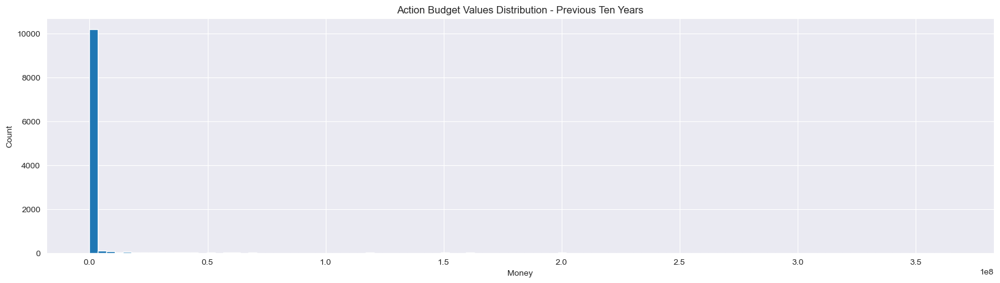

BUDGET Median = 0.0, Mean = 2700435.4308579937
count    1.074600e+04
mean     2.700435e+06
std      1.803762e+07
min      0.000000e+00
25%      0.000000e+00
50%      0.000000e+00
75%      0.000000e+00
max      3.650000e+08
Name: budget, dtype: float64


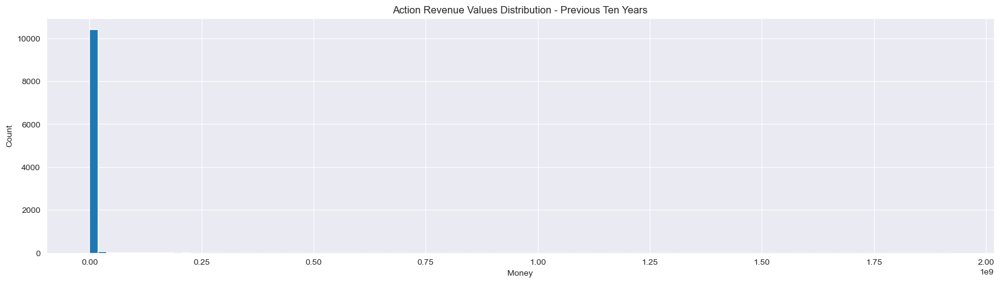

REVENUE Median = 0.0, Mean = 7800926.733109995
count    1.074600e+04
mean     7.800927e+06
std      7.106244e+07
min      0.000000e+00
25%      0.000000e+00
50%      0.000000e+00
75%      0.000000e+00
max      1.921847e+09
Name: revenue, dtype: float64


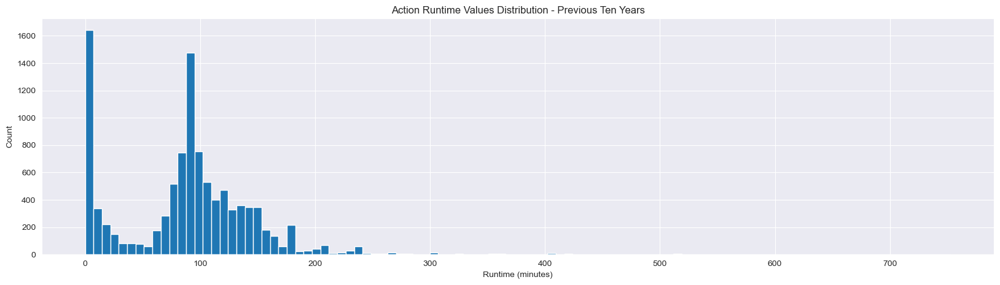

RUNTIME Median = 91.0, Mean = 88.10824096385542
count    10375.000000
mean        88.108241
std         59.848802
min          0.000000
25%         52.000000
50%         91.000000
75%        120.000000
max        753.000000
Name: runtime, dtype: float64


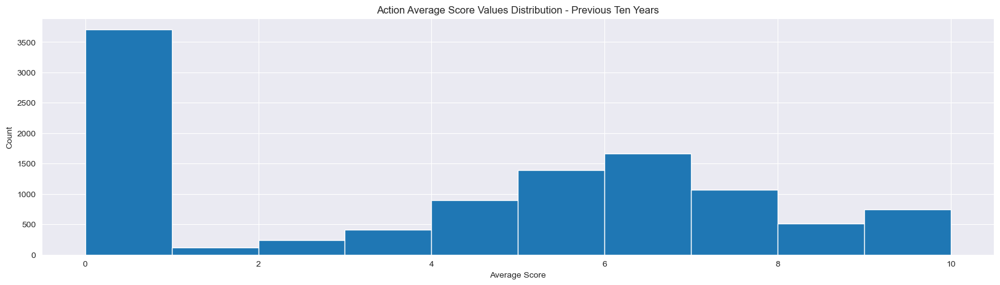

SCORE Median = 5.0, Mean = 4.02767234319747
count    10746.000000
mean         4.027672
std          3.322505
min          0.000000
25%          0.000000
50%          5.000000
75%          6.700000
max         10.000000
Name: vote_average, dtype: float64


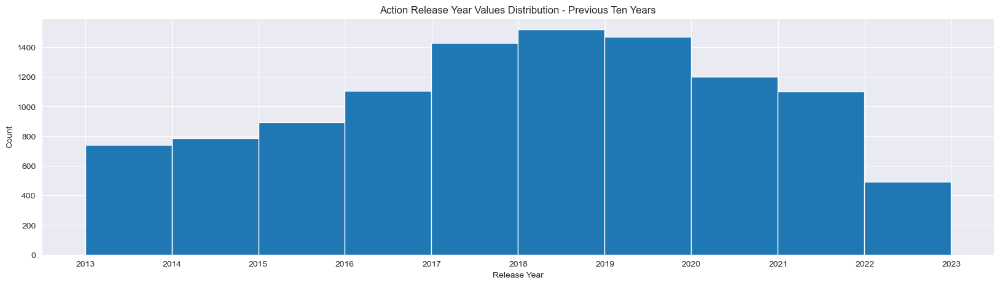

RELEASE DATE Median = 2018-04-15 12:00:00, Mean = 2018-02-12 04:26:07.839195904
count                            10746
mean     2018-02-12 04:26:07.839195904
min                2013-01-01 00:00:00
25%                2016-04-03 00:00:00
50%                2018-04-15 12:00:00
75%                2020-01-24 00:00:00
max                2022-12-30 00:00:00
Name: release_date, dtype: object


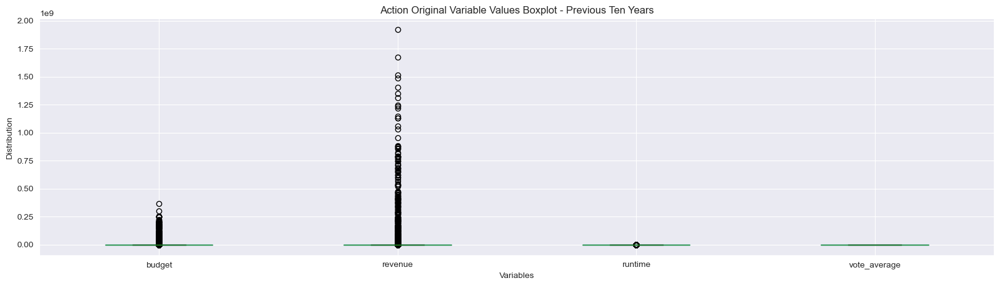

In [22]:
#Check distribution of act_10 variables values
n_data = len(act10_movies.budget)
n_bins = np.sqrt(n_data)
n_bins = int(n_bins)
_ =plt.hist(act10_movies.budget, bins=n_bins)
plt.title('Action Budget Values Distribution - Previous Ten Years')
plt.xlabel('Money')
plt.ylabel('Count')
plt.show()

print(f"BUDGET Median = {act10_movies.budget.median()}, Mean = {act10_movies.budget.mean()}")
print(act10_movies.budget.describe())

n_data = len(act10_movies.revenue)
n_bins = np.sqrt(n_data)
n_bins = int(n_bins)
_ =plt.hist(act10_movies.revenue, bins=n_bins)
plt.title('Action Revenue Values Distribution - Previous Ten Years')
plt.xlabel('Money')
plt.ylabel('Count')
plt.show()

print(f"REVENUE Median = {act10_movies.revenue.median()}, Mean = {act10_movies.revenue.mean()}")
print(act10_movies.revenue.describe())

n_data = len(act10_movies.runtime)
n_bins = np.sqrt(n_data)
n_bins = int(n_bins)
_ =plt.hist(act10_movies.runtime, bins=n_bins)
plt.title('Action Runtime Values Distribution - Previous Ten Years')
plt.xlabel('Runtime (minutes)')
plt.ylabel('Count')
plt.show()

print(f"RUNTIME Median = {act10_movies.runtime.median()}, Mean = {act10_movies.runtime.mean()}")
print(act10_movies.runtime.describe())

_ =plt.hist(act10_movies.vote_average)
plt.title('Action Average Score Values Distribution - Previous Ten Years')
plt.xlabel('Average Score')
plt.ylabel('Count')
plt.show()

print(f"SCORE Median = {act10_movies.vote_average.median()}, Mean = {act10_movies.vote_average.mean()}")
print(act10_movies.vote_average.describe())

_ =plt.hist(act10_movies.release_date)
plt.title('Action Release Year Values Distribution - Previous Ten Years')
plt.xlabel('Release Year')
plt.ylabel('Count')
plt.show()

print(f"RELEASE DATE Median = {act10_movies.release_date.median()}, Mean = {act10_movies.release_date.mean()}")
print(act10_movies.release_date.describe(datetime_is_numeric=True))

act10_movies.boxplot(column=['budget', 'revenue', 'runtime', 'vote_average'])
plt.title('Action Original Variable Values Boxplot - Previous Ten Years')
plt.xlabel('Variables')
plt.ylabel('Distribution')
plt.show()

In [23]:
act5_movies

,id,title,genres,original_language,overview,production_companies,release_date,budget,revenue,runtime,...,credits,poster_path,recommendations,profit,profit_margin,primary_genre,secondary_genre,release_year,release_month_num,release_month_name
0,965839,Lord of the Streets,Action,en,When Jason Dyson refuses to make his prized fi...,Mutiny Films,2022-04-22,1000000.0,0.0,85.0,...,Treach-Quinton Jackson-Khalil Rountree Jr.-And...,/n9YWVQRc0zw0nwrFcOkOpffZxjc.jpg,982467,-1000000.0,-inf,Action,Unknown,2022,4,April
1,758009,Shotgun Wedding,Action-Romance-Comedy,en,Darcy and Tom gather their families for the ul...,Lionsgate-Mandeville Films-Nuyorican Productio...,2022-12-28,0.0,4495365.0,101.0,...,Jennifer Lopez-Josh Duhamel-Jennifer Coolidge-...,/t79ozwWnwekO0ADIzsFP1E5SkvR.jpg,702432-1064489-1013870-953734-805307-753965-84...,4495365.0,100.0,Action,Romance,2022,12,December
2,267805,There Are No Saints,Action,en,A man is imprisoned for a crime he didn't comm...,Open Window Productions-BN Films-Itaca Films-I...,2022-05-27,0.0,0.0,105.0,...,José María Yázpik-Shannyn Sossamon-Tommy Flana...,/fcOTYArjKuAgufwHoTvx8w9UKCv.jpg,1391-961484-763873-668047-630392-999127-301351...,0.0,NaN,Action,Unknown,2022,5,May
3,436270,Black Adam,Action-Fantasy-Science Fiction,en,Nearly 5000 years after he was bestowed with t...,New Line Cinema-Flynn Picture Company-DC Films...,2022-10-19,200000000.0,392952111.0,125.0,...,Dwayne Johnson-Aldis Hodge-Noah Centineo-Sarah...,/pFlaoHTZeyNkG83vxsAJiGzfSsa.jpg,485470-505642-663712-642721-49046-724495-82979...,192952111.0,49.1,Action,Fantasy,2022,10,October
4,941520,Alien Sniperess,Action-Science Fiction-Fantasy,en,A female sniper on military leave promises to ...,Paradox Universe-Green Apple Productions,2022-04-08,0.0,0.0,94.0,...,Olivia Okoro-Sean Laguna-Douglas Savage-Bourke...,/bI1ZDRkerXrcaFa5kWjEMw80aqE.jpg,NaN,0.0,NaN,Action,Science Fiction,2022,4,April
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5777,850734,Static Shock,Action-Drama,en,The Red Hood Universe story arc continues with...,StreetNerds Productions,2019-04-29,0.0,0.0,35.0,...,Shaun Townsend-Blaise Mahungu-Caitlin Longmire...,/n36XFmBbHMuQqw6pzAsm6FBCgpB.jpg,NaN,0.0,NaN,Action,Drama,2019,4,April
5778,838052,NJPW Dominion 6.6 in Osaka-jo Hall,Action,en,Dominion 6.6 in Osaka-jo Hall was an professio...,New Japan Pro-Wrestling,2021-06-07,0.0,0.0,0.0,...,Shingo Takagi-Kazuchika Okada-Kota Ibushi-Jeff...,/51Mm8UML0pD5P0A4vcKcQcN685b.jpg,NaN,0.0,NaN,Action,Unknown,2021,6,June
5779,830075,The Big Thirst,Action-Comedy,en,One man's quest for a cup of water.,NaN,2020-02-27,0.0,0.0,2.0,...,Blake Ditto-Hijo,/gn1oM7d9B37NlETr8SsSep5wt6M.jpg,NaN,0.0,NaN,Action,Comedy,2020,2,February
5780,830936,Chinese Captain,Action,zh,"Ten years ago the DB multinational studio's ""H...",NaN,2021-05-18,0.0,0.0,0.0,...,Zheng Xiaofu-Li Taiyan-Du Qiao-Jingtao Li-Lu W...,/3zdMvp7UdvIZRnvzAgzRS70kU0G.jpg,NaN,0.0,NaN,Action,Unknown,2021,5,May


In [24]:
act5_movies.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5782 entries, 0 to 5781
Data columns (total 23 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   id                    5782 non-null   int64         
 1   title                 5782 non-null   object        
 2   genres                5782 non-null   object        
 3   original_language     5782 non-null   object        
 4   overview              5295 non-null   object        
 5   production_companies  3591 non-null   object        
 6   release_date          5782 non-null   datetime64[ns]
 7   budget                5782 non-null   float64       
 8   revenue               5782 non-null   float64       
 9   runtime               5595 non-null   float64       
 10  status                5782 non-null   object        
 11  tagline               1565 non-null   object        
 12  vote_average          5782 non-null   float64       
 13  credits           

In [25]:
#Drop zero values from 10 Year Action variables. 
#Create a seperate dataframe for each so as not to affect the other variables calculations.
act10b_movies = act10_movies[act10_movies['budget'] !=0]
act10r_movies = act10_movies[act10_movies['revenue'] !=0]
act10d_movies = act10_movies[act10_movies['runtime'] !=0]
act10v_movies = act10_movies[act10_movies['vote_average'] !=0]

#Remove Outliers from 10 Year Action variables and 
Q1 = act10b_movies.budget.quantile(0.25)
Q3 = act10b_movies.budget.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(act10b_movies['budget']>=upper_limit)[0]
lower_array = np.where(act10b_movies['budget']<=lower_limit)[0]
act10b_movies['budget'].drop(index=upper_array, inplace=True)
act10b_movies['budget'].drop(index=lower_array, inplace=True)

Q1 = act10r_movies.revenue.quantile(0.25)
Q3 = act10r_movies.revenue.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(act10r_movies['revenue']>=upper_limit)[0]
lower_array = np.where(act10r_movies['revenue']<=lower_limit)[0]
act10r_movies['revenue'].drop(index=upper_array, inplace=True)
act10r_movies['revenue'].drop(index=lower_array, inplace=True)

Q1 = act10d_movies.runtime.quantile(0.25)
Q3 = act10d_movies.runtime.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(act10d_movies['runtime']>=upper_limit)[0]
lower_array = np.where(act10d_movies['runtime']<=lower_limit)[0]
act10d_movies['runtime'].drop(index=upper_array, inplace=True)
act10d_movies['runtime'].drop(index=lower_array, inplace=True)

Q1 = act10v_movies.vote_average.quantile(0.25)
Q3 = act10v_movies.vote_average.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(act10v_movies['vote_average']>=upper_limit)[0]
lower_array = np.where(act10v_movies['vote_average']<=lower_limit)[0]
act10v_movies['vote_average'].drop(index=upper_array, inplace=True)
act10v_movies['vote_average'].drop(index=lower_array, inplace=True)

KeyError: '[1, 4, 5, 13, 19, 20, 21, 22, 23, 25, 26, 27, 28, 31, 32, 33, 34, 36, 37, 38, 39, 40, 41, 42, 47, 48, 52, 59, 61, 63, 68, 69, 71, 78, 82, 85, 89, 96, 102, 103, 108, 109, 113, 122, 124, 130, 136, 137, 138, 145, 152, 155, 156, 164, 165, 168, 170, 172, 179, 180, 182, 184, 186, 189, 190, 218, 222, 223, 235, 236, 238, 241, 243, 255, 256, 257, 272, 277, 278, 291, 295, 301, 304, 317, 322, 323, 324, 330, 335, 338, 351, 358, 365, 367, 368, 383, 398, 406, 438, 446, 461, 468, 472, 484, 490, 491, 507, 515, 524, 531, 543, 556, 557, 668, 669, 706, 764, 765, 766, 767, 1150, 1152, 1153] not found in axis'

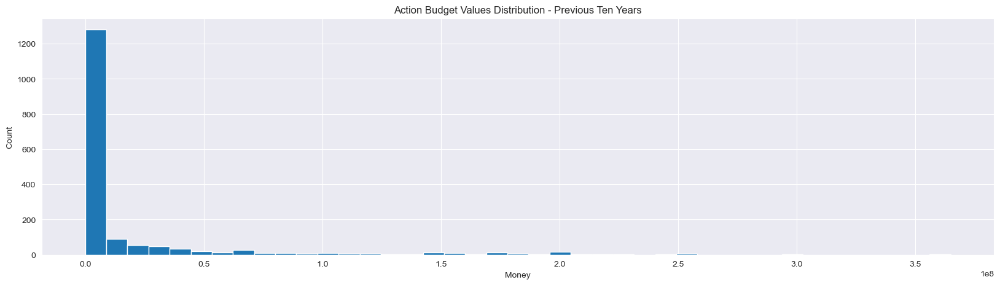

BUDGET Median = 423210.0, Mean = 17140507.46603662
count    1.693000e+03
mean     1.714051e+07
std      4.264396e+07
min      1.000000e+00
25%      6.755000e+03
50%      4.232100e+05
75%      8.000000e+06
max      3.650000e+08
Name: budget, dtype: float64


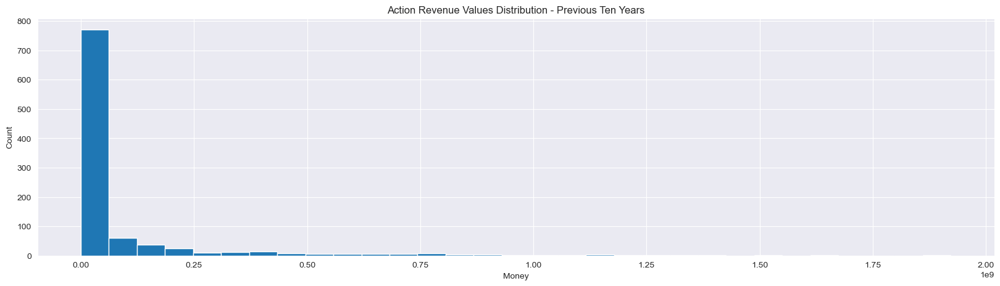

REVENUE Median = 2889720.0, Mean = 84761131.11627907
count    9.890000e+02
mean     8.476113e+07
std      2.199774e+08
min      1.000000e+00
25%      1.700000e+04
50%      2.889720e+06
75%      4.606957e+07
max      1.921847e+09
Name: revenue, dtype: float64


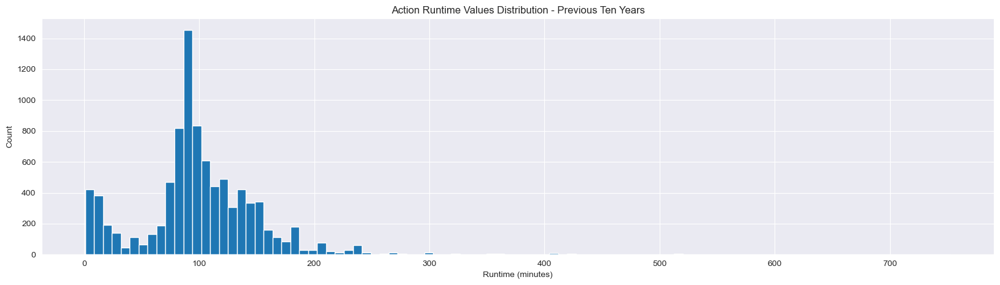

RUNTIME Median = 95.0, Mean = 100.39791323448655
count    9105.000000
mean      100.397913
std        53.362487
min         1.000000
25%        80.000000
50%        95.000000
75%       127.000000
max       753.000000
Name: runtime, dtype: float64


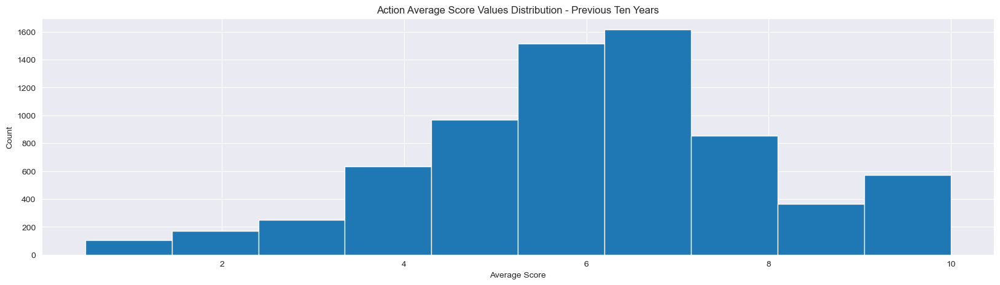

SCORE Median = 6.1, Mean = 6.142686204938975
count    7046.000000
mean        6.142686
std         1.960352
min         0.500000
25%         5.000000
50%         6.100000
75%         7.200000
max        10.000000
Name: vote_average, dtype: float64


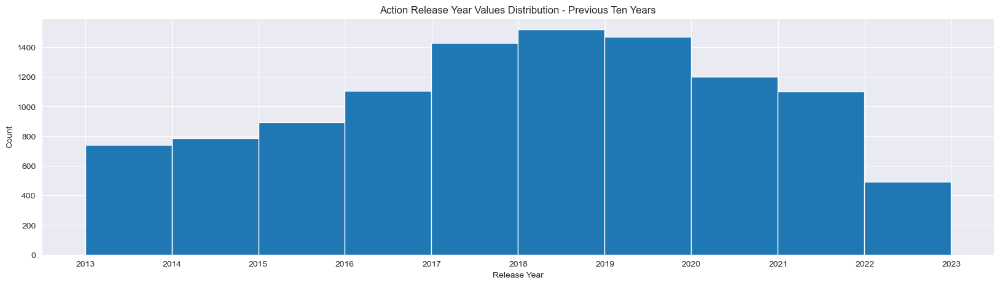

RELEASE DATE Median = 2018-04-15 12:00:00, Mean = 2018-02-12 04:26:07.839195904
count                            10746
mean     2018-02-12 04:26:07.839195904
min                2013-01-01 00:00:00
25%                2016-04-03 00:00:00
50%                2018-04-15 12:00:00
75%                2020-01-24 00:00:00
max                2022-12-30 00:00:00
Name: release_date, dtype: object


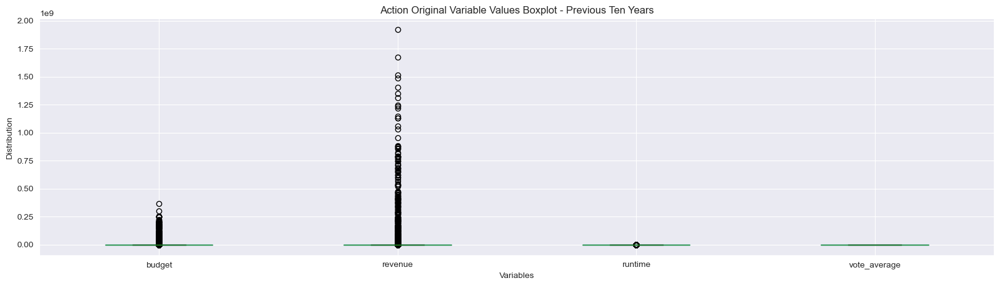

In [26]:
#Show distribution of previous 10 Year Action variable values
n_data = len(act10b_movies.budget)
n_bins = np.sqrt(n_data)
n_bins = int(n_bins)
_ =plt.hist(act10b_movies.budget, bins=n_bins)
plt.title('Action Budget Values Distribution - Previous Ten Years')
plt.xlabel('Money')
plt.ylabel('Count')
plt.show()

print(f"BUDGET Median = {act10b_movies.budget.median()}, Mean = {act10b_movies.budget.mean()}")
print(act10b_movies.budget.describe())

n_data = len(act10r_movies.revenue)
n_bins = np.sqrt(n_data)
n_bins = int(n_bins)
_ =plt.hist(act10r_movies.revenue, bins=n_bins)
plt.title('Action Revenue Values Distribution - Previous Ten Years')
plt.xlabel('Money')
plt.ylabel('Count')
plt.show()

print(f"REVENUE Median = {act10r_movies.revenue.median()}, Mean = {act10r_movies.revenue.mean()}")
print(act10r_movies.revenue.describe())

n_data = len(act10d_movies.runtime)
n_bins = np.sqrt(n_data)
n_bins = int(n_bins)
_ =plt.hist(act10d_movies.runtime, bins=n_bins)
plt.title('Action Runtime Values Distribution - Previous Ten Years')
plt.xlabel('Runtime (minutes)')
plt.ylabel('Count')
plt.show()

print(f"RUNTIME Median = {act10d_movies.runtime.median()}, Mean = {act10d_movies.runtime.mean()}")
print(act10d_movies.runtime.describe())

_ =plt.hist(act10v_movies.vote_average)
plt.title('Action Average Score Values Distribution - Previous Ten Years')
plt.xlabel('Average Score')
plt.ylabel('Count')
plt.show()

print(f"SCORE Median = {act10v_movies.vote_average.median()}, Mean = {act10v_movies.vote_average.mean()}")
print(act10v_movies.vote_average.describe())

_ =plt.hist(act10_movies.release_date)
plt.title('Action Release Year Values Distribution - Previous Ten Years')
plt.xlabel('Release Year')
plt.ylabel('Count')
plt.show()

print(f"RELEASE DATE Median = {act10_movies.release_date.median()}, Mean = {act10_movies.release_date.mean()}")
print(act10_movies.release_date.describe(datetime_is_numeric=True))

act10_movies.boxplot(column=['budget', 'revenue', 'runtime', 'vote_average'])
plt.title('Action Original Variable Values Boxplot - Previous Ten Years')
plt.xlabel('Variables')
plt.ylabel('Distribution')
plt.show()

In [27]:
#Drop zero values from 10 Year Adventure variables. 
#Create a seperate dataframe for each so as not to affect the other variables calculations.
adv10b_movies = adv10_movies[adv10_movies['budget'] !=0]
adv10r_movies = adv10_movies[adv10_movies['revenue'] !=0]
adv10d_movies = adv10_movies[adv10_movies['runtime'] !=0]
adv10v_movies = adv10_movies[adv10_movies['vote_average'] !=0]

#Remove Outliers from 10 Year Adventure variables and 
Q1 = adv10b_movies.budget.quantile(0.25)
Q3 = adv10b_movies.budget.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(adv10b_movies['budget']>=upper_limit)[0]
lower_array = np.where(adv10b_movies['budget']<=lower_limit)[0]
adv10b_movies['budget'].drop(index=upper_array, inplace=True)
adv10b_movies['budget'].drop(index=lower_array, inplace=True)

Q1 = adv10r_movies.revenue.quantile(0.25)
Q3 = adv10r_movies.revenue.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(adv10r_movies['revenue']>=upper_limit)[0]
lower_array = np.where(adv10r_movies['revenue']<=lower_limit)[0]
adv10r_movies['revenue'].drop(index=upper_array, inplace=True)
adv10r_movies['revenue'].drop(index=lower_array, inplace=True)

Q1 = adv10d_movies.runtime.quantile(0.25)
Q3 = adv10d_movies.runtime.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(adv10d_movies['runtime']>=upper_limit)[0]
lower_array = np.where(adv10d_movies['runtime']<=lower_limit)[0]
adv10d_movies['runtime'].drop(index=upper_array, inplace=True)
adv10d_movies['runtime'].drop(index=lower_array, inplace=True)

Q1 = adv10v_movies.vote_average.quantile(0.25)
Q3 = adv10v_movies.vote_average.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(adv10v_movies['vote_average']>=upper_limit)[0]
lower_array = np.where(adv10v_movies['vote_average']<=lower_limit)[0]
adv10v_movies['vote_average'].drop(index=upper_array, inplace=True)
adv10v_movies['vote_average'].drop(index=lower_array, inplace=True)

KeyError: '[5, 11, 17, 18, 19, 20, 21, 22, 23, 24, 25, 28, 31, 35, 37, 44, 53, 59, 63, 64, 65, 67, 80, 81, 90, 95, 106, 108] not found in axis'

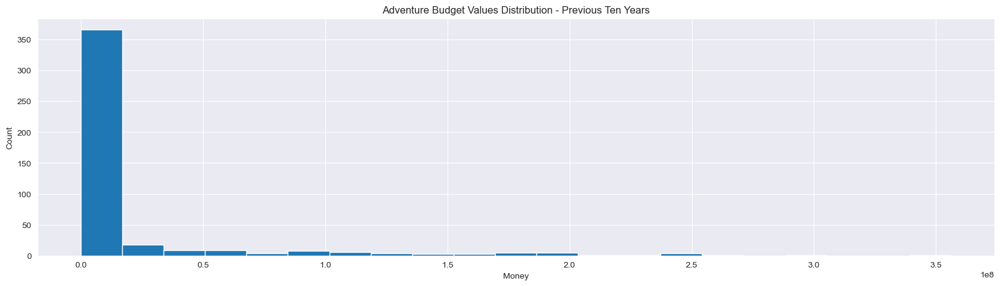

BUDGET Median = 240610.0, Mean = 20638095.65924276
count    4.490000e+02
mean     2.063810e+07
std      5.229477e+07
min      1.000000e+00
25%      6.806000e+03
50%      2.406100e+05
75%      8.000000e+06
max      3.560000e+08
Name: budget, dtype: float64


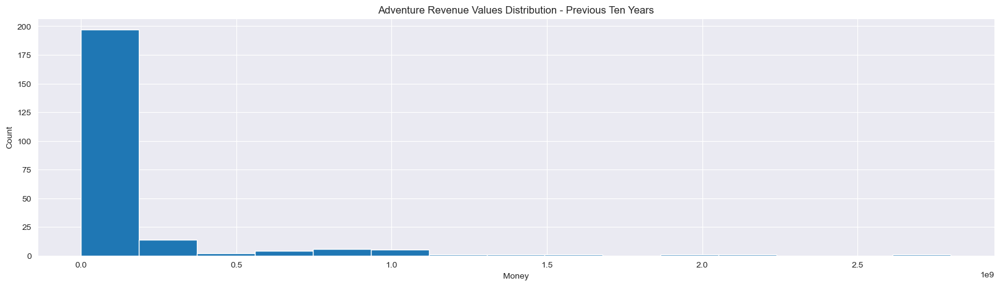

REVENUE Median = 3495450.0, Mean = 135917443.58974358
count    2.340000e+02
mean     1.359174e+08
std      3.641676e+08
min      1.000000e+00
25%      1.579370e+05
50%      3.495450e+06
75%      6.020752e+07
max      2.799439e+09
Name: revenue, dtype: float64


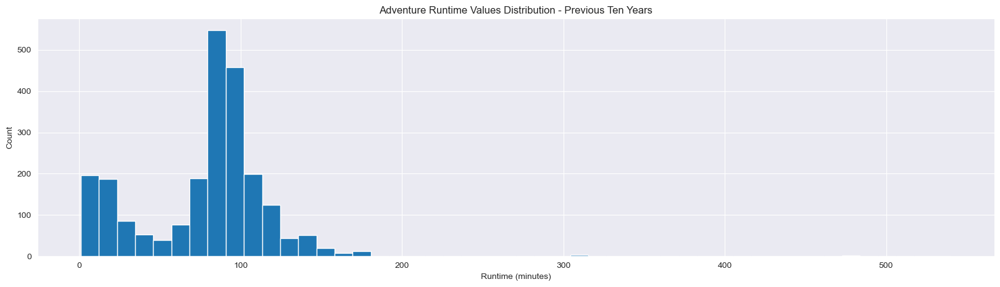

RUNTIME Median = 87.0, Mean = 78.25847089487402
count    2302.000000
mean       78.258471
std        42.213501
min         1.000000
25%        60.000000
50%        87.000000
75%        98.000000
max       540.000000
Name: runtime, dtype: float64


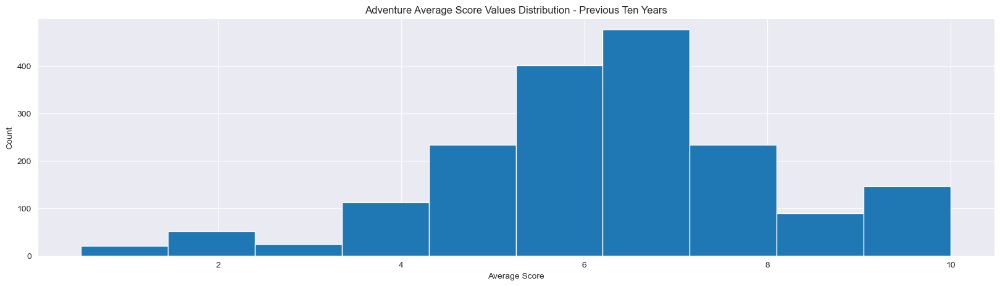

SCORE Median = 6.3, Mean = 6.304447368421058
count    1786.000000
mean        6.304447
std         1.862252
min         0.500000
25%         5.300000
50%         6.300000
75%         7.200000
max        10.000000
Name: vote_average, dtype: float64


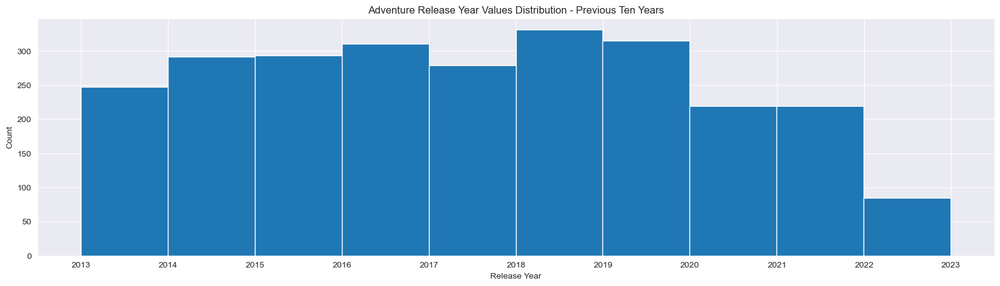

RELEASE DATE Median = 2017-06-29 00:00:00, Mean = 2017-07-31 18:36:50.892236544
count                             2589
mean     2017-07-31 18:36:50.892236544
min                2013-01-01 00:00:00
25%                2015-05-14 00:00:00
50%                2017-06-29 00:00:00
75%                2019-08-22 00:00:00
max                2022-12-31 00:00:00
Name: release_date, dtype: object


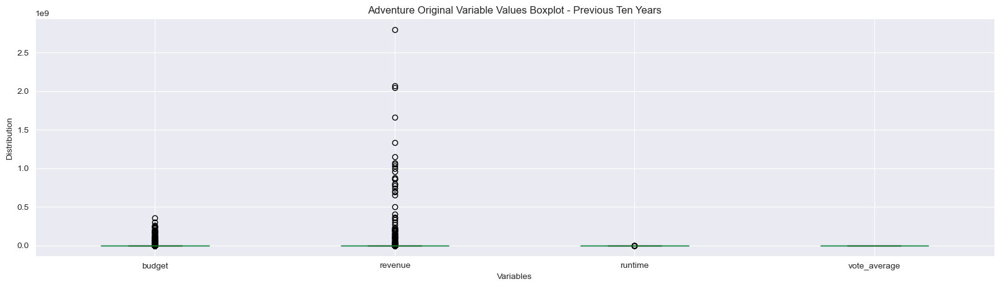

In [28]:
#Show distribution of previous 10 Year Adventure variable values
n_data = len(adv10b_movies.budget)
n_bins = np.sqrt(n_data)
n_bins = int(n_bins)
_ =plt.hist(adv10b_movies.budget, bins=n_bins)
plt.title('Adventure Budget Values Distribution - Previous Ten Years')
plt.xlabel('Money')
plt.ylabel('Count')
plt.show()

#Calculate median and mean values for variables
print(f"BUDGET Median = {adv10b_movies.budget.median()}, Mean = {adv10b_movies.budget.mean()}")
print(adv10b_movies.budget.describe())

n_data = len(adv10r_movies.revenue)
n_bins = np.sqrt(n_data)
n_bins = int(n_bins)
_ =plt.hist(adv10r_movies.revenue, bins=n_bins)
plt.title('Adventure Revenue Values Distribution - Previous Ten Years')
plt.xlabel('Money')
plt.ylabel('Count')
plt.show()

print(f"REVENUE Median = {adv10r_movies.revenue.median()}, Mean = {adv10r_movies.revenue.mean()}")
print(adv10r_movies.revenue.describe())

n_data = len(adv10d_movies.runtime)
n_bins = np.sqrt(n_data)
n_bins = int(n_bins)
_ =plt.hist(adv10d_movies.runtime, bins=n_bins)
plt.title('Adventure Runtime Values Distribution - Previous Ten Years')
plt.xlabel('Runtime (minutes)')
plt.ylabel('Count')
plt.show()

print(f"RUNTIME Median = {adv10d_movies.runtime.median()}, Mean = {adv10d_movies.runtime.mean()}")
print(adv10d_movies.runtime.describe())

_ =plt.hist(adv10v_movies.vote_average)
plt.title('Adventure Average Score Values Distribution - Previous Ten Years')
plt.xlabel('Average Score')
plt.ylabel('Count')
plt.show()

print(f"SCORE Median = {adv10v_movies.vote_average.median()}, Mean = {adv10v_movies.vote_average.mean()}")
print(adv10v_movies.vote_average.describe())

_ =plt.hist(adv10_movies.release_date)
plt.title('Adventure Release Year Values Distribution - Previous Ten Years')
plt.xlabel('Release Year')
plt.ylabel('Count')
plt.show()

print(f"RELEASE DATE Median = {adv10_movies.release_date.median()}, Mean = {adv10_movies.release_date.mean()}")
print(adv10_movies.release_date.describe(datetime_is_numeric=True))

adv10_movies.boxplot(column=['budget', 'revenue', 'runtime', 'vote_average'])
plt.title('Adventure Original Variable Values Boxplot - Previous Ten Years')
plt.xlabel('Variables')
plt.ylabel('Distribution')
plt.show()

In [29]:
#Drop zero values from 10 Year Animation variables. 
#Create a seperate dataframe for each so as not to affect the other variables calculations.
ani10b_movies = ani10_movies[ani10_movies['budget'] !=0]
ani10r_movies = ani10_movies[ani10_movies['revenue'] !=0]
ani10d_movies = ani10_movies[ani10_movies['runtime'] !=0]
ani10v_movies = ani10_movies[ani10_movies['vote_average'] !=0]

#Remove Outliers from 10 Year Comedy variables and 
Q1 = ani10b_movies.budget.quantile(0.25)
Q3 = ani10b_movies.budget.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(ani10b_movies['budget']>=upper_limit)[0]
lower_array = np.where(ani10b_movies['budget']<=lower_limit)[0]
ani10b_movies['budget'].drop(index=upper_array, inplace=True)
ani10b_movies['budget'].drop(index=lower_array, inplace=True)

Q1 = ani10r_movies.revenue.quantile(0.25)
Q3 = ani10r_movies.revenue.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(ani10r_movies['revenue']>=upper_limit)[0]
lower_array = np.where(ani10r_movies['revenue']<=lower_limit)[0]
ani10r_movies['revenue'].drop(index=upper_array, inplace=True)
ani10r_movies['revenue'].drop(index=lower_array, inplace=True)

Q1 = ani10d_movies.runtime.quantile(0.25)
Q3 = ani10d_movies.runtime.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(ani10d_movies['runtime']>=upper_limit)[0]
lower_array = np.where(ani10d_movies['runtime']<=lower_limit)[0]
ani10d_movies['runtime'].drop(index=upper_array, inplace=True)
ani10d_movies['runtime'].drop(index=lower_array, inplace=True)

Q1 = ani10v_movies.vote_average.quantile(0.25)
Q3 = ani10v_movies.vote_average.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(ani10v_movies['vote_average']>=upper_limit)[0]
lower_array = np.where(ani10v_movies['vote_average']<=lower_limit)[0]
ani10v_movies['vote_average'].drop(index=upper_array, inplace=True)
ani10v_movies['vote_average'].drop(index=lower_array, inplace=True)

KeyError: '[1, 3, 5, 6, 8, 9, 10, 11, 15, 16, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 34, 35, 37, 38, 39, 41, 45, 46, 48, 49, 50, 53, 55, 58, 59, 63, 66, 68, 71, 73, 74, 75, 76, 77, 81, 83, 86, 87, 89, 90, 97, 98, 101, 103, 105, 106, 108, 110, 111, 140, 149, 151, 180, 181, 182, 190, 204] not found in axis'

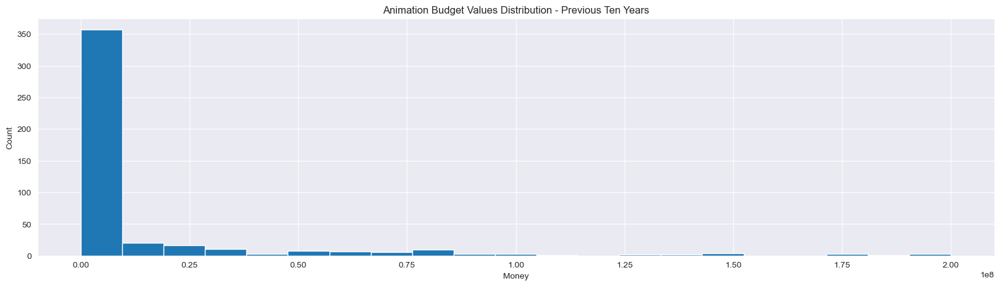

BUDGET Median = 20000.0, Mean = 14071544.82532751
count    4.580000e+02
mean     1.407154e+07
std      3.471469e+07
min      1.000000e+00
25%      5.000000e+02
50%      2.000000e+04
75%      5.000000e+06
max      2.000000e+08
Name: budget, dtype: float64


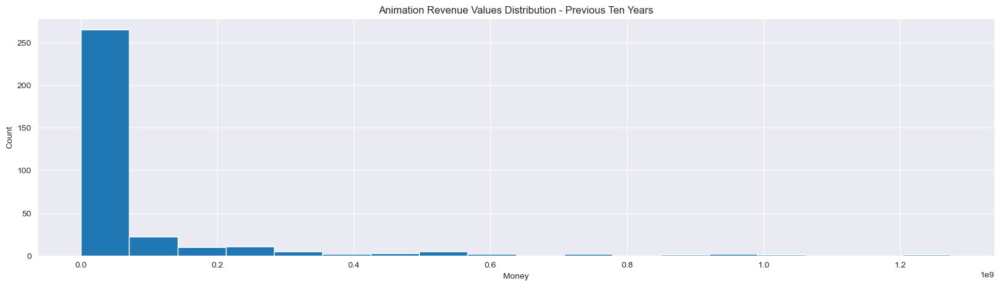

REVENUE Median = 5180058.5, Mean = 69230792.97289157
count    3.320000e+02
mean     6.923079e+07
std      1.700255e+08
min      1.000000e+00
25%      3.158268e+05
50%      5.180058e+06
75%      3.661586e+07
max      1.274219e+09
Name: revenue, dtype: float64


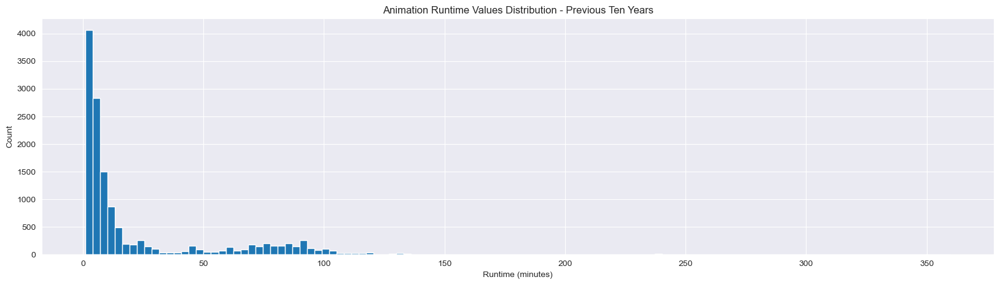

RUNTIME Median = 7.0, Mean = 23.646472785876494
count    13651.000000
mean        23.646473
std         34.172461
min          1.000000
25%          4.000000
50%          7.000000
75%         24.000000
max        360.000000
Name: runtime, dtype: float64


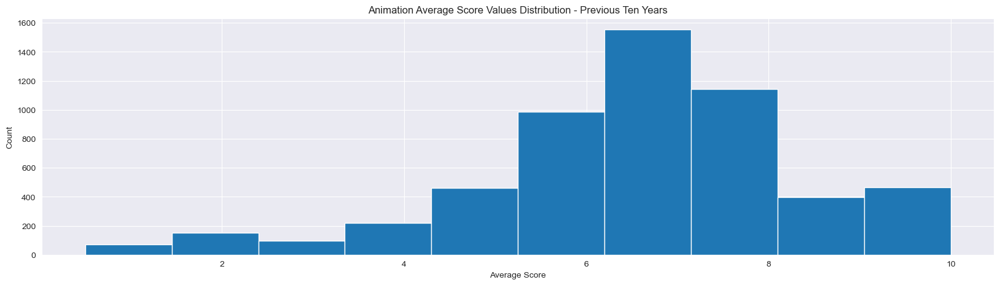

SCORE Median = 6.9, Mean = 6.647604978354961
count    5544.000000
mean        6.647605
std         1.843126
min         0.500000
25%         6.000000
50%         6.900000
75%         7.800000
max        10.000000
Name: vote_average, dtype: float64


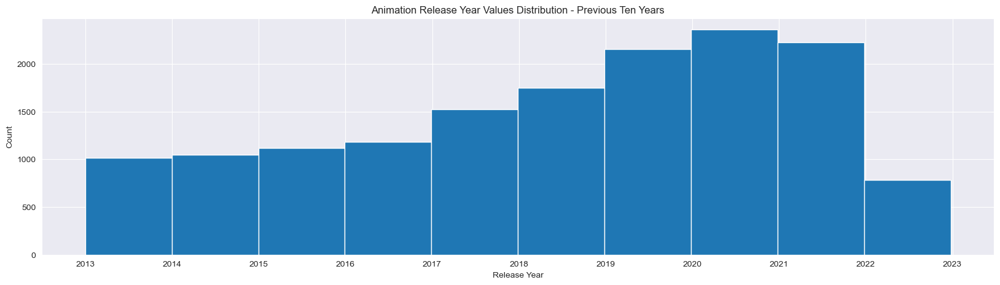

RELEASE DATE Median = 2018-12-11 00:00:00, Mean = 2018-06-27 07:01:35.730781952
count                            15155
mean     2018-06-27 07:01:35.730781952
min                2013-01-01 00:00:00
25%                2016-07-02 00:00:00
50%                2018-12-11 00:00:00
75%                2020-10-01 00:00:00
max                2022-12-25 00:00:00
Name: release_date, dtype: object


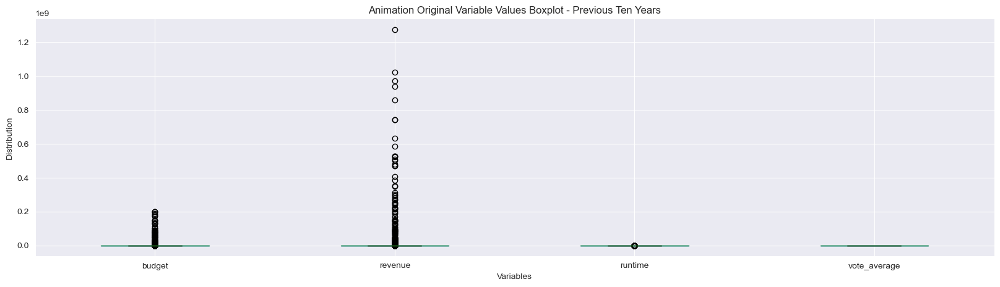

In [30]:
#Show distribution of previous 10 Year Animation variable values
n_data = len(ani10b_movies.budget)
n_bins = np.sqrt(n_data)
n_bins = int(n_bins)
_ =plt.hist(ani10b_movies.budget, bins=n_bins)
plt.title('Animation Budget Values Distribution - Previous Ten Years')
plt.xlabel('Money')
plt.ylabel('Count')
plt.show()

#Calculate median and mean values for variables
print(f"BUDGET Median = {ani10b_movies.budget.median()}, Mean = {ani10b_movies.budget.mean()}")
print(ani10b_movies.budget.describe())

n_data = len(ani10r_movies.revenue)
n_bins = np.sqrt(n_data)
n_bins = int(n_bins)
_ =plt.hist(ani10r_movies.revenue, bins=n_bins)
plt.title('Animation Revenue Values Distribution - Previous Ten Years')
plt.xlabel('Money')
plt.ylabel('Count')
plt.show()

print(f"REVENUE Median = {ani10r_movies.revenue.median()}, Mean = {ani10r_movies.revenue.mean()}")
print(ani10r_movies.revenue.describe())

n_data = len(ani10d_movies.runtime)
n_bins = np.sqrt(n_data)
n_bins = int(n_bins)
_ =plt.hist(ani10d_movies.runtime, bins=n_bins)
plt.title('Animation Runtime Values Distribution - Previous Ten Years')
plt.xlabel('Runtime (minutes)')
plt.ylabel('Count')
plt.show()

print(f"RUNTIME Median = {ani10d_movies.runtime.median()}, Mean = {ani10d_movies.runtime.mean()}")
print(ani10d_movies.runtime.describe())

_ =plt.hist(ani10v_movies.vote_average)
plt.title('Animation Average Score Values Distribution - Previous Ten Years')
plt.xlabel('Average Score')
plt.ylabel('Count')
plt.show()

print(f"SCORE Median = {ani10v_movies.vote_average.median()}, Mean = {ani10v_movies.vote_average.mean()}")
print(ani10v_movies.vote_average.describe())

_ =plt.hist(ani10_movies.release_date)
plt.title('Animation Release Year Values Distribution - Previous Ten Years')
plt.xlabel('Release Year')
plt.ylabel('Count')
plt.show()

print(f"RELEASE DATE Median = {ani10_movies.release_date.median()}, Mean = {ani10_movies.release_date.mean()}")
print(ani10_movies.release_date.describe(datetime_is_numeric=True))

ani10_movies.boxplot(column=['budget', 'revenue', 'runtime', 'vote_average'])
plt.title('Animation Original Variable Values Boxplot - Previous Ten Years')
plt.xlabel('Variables')
plt.ylabel('Distribution')
plt.show()

In [31]:
#Drop zero values from 10 Year Comedy variables. 
#Create a seperate dataframe for each so as not to affect the other variables calculations.
com10b_movies = com10_movies[com10_movies['budget'] !=0]
com10r_movies = com10_movies[com10_movies['revenue'] !=0]
com10d_movies = com10_movies[com10_movies['runtime'] !=0]
com10v_movies = com10_movies[com10_movies['vote_average'] !=0]

#Remove Outliers from 10 Year Comedy variables and 
Q1 = com10b_movies.budget.quantile(0.25)
Q3 = com10b_movies.budget.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(com10b_movies['budget']>=upper_limit)[0]
lower_array = np.where(com10b_movies['budget']<=lower_limit)[0]
com10b_movies['budget'].drop(index=upper_array, inplace=True)
com10b_movies['budget'].drop(index=lower_array, inplace=True)

Q1 = com10r_movies.revenue.quantile(0.25)
Q3 = com10r_movies.revenue.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(com10r_movies['revenue']>=upper_limit)[0]
lower_array = np.where(com10r_movies['revenue']<=lower_limit)[0]
com10r_movies['revenue'].drop(index=upper_array, inplace=True)
com10r_movies['revenue'].drop(index=lower_array, inplace=True)

Q1 = com10d_movies.runtime.quantile(0.25)
Q3 = com10d_movies.runtime.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(com10d_movies['runtime']>=upper_limit)[0]
lower_array = np.where(com10d_movies['runtime']<=lower_limit)[0]
com10d_movies['runtime'].drop(index=upper_array, inplace=True)
com10d_movies['runtime'].drop(index=lower_array, inplace=True)

Q1 = com10v_movies.vote_average.quantile(0.25)
Q3 = com10v_movies.vote_average.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(com10v_movies['vote_average']>=upper_limit)[0]
lower_array = np.where(com10v_movies['vote_average']<=lower_limit)[0]
com10v_movies['vote_average'].drop(index=upper_array, inplace=True)
com10v_movies['vote_average'].drop(index=lower_array, inplace=True)

KeyError: '[0, 1, 2, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 17, 18, 19, 20, 21, 22, 26, 27, 28, 31, 32, 36, 39, 40, 41, 43, 45, 48, 49, 50, 51, 53, 55, 59, 61, 62, 63, 64, 66, 68, 69, 70, 71, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 93, 94, 95, 96, 98, 99, 100, 101, 102, 103, 105, 107, 108, 109, 110, 112, 113, 114, 115, 117, 118, 119, 120, 121, 123, 126, 127, 129, 130, 132, 133, 135, 139, 140, 141, 142, 143, 147, 148, 151, 155, 157, 158, 161, 163, 164, 165, 166, 167, 168, 171, 172, 173, 174, 175, 178, 179, 180, 182, 183, 184, 185, 186, 188, 189, 190, 192, 193, 200, 202, 204, 205, 206, 207, 208, 211, 212, 215, 216, 217, 218, 222, 223, 224, 228, 229, 230, 231, 237, 238, 239, 246, 247, 248, 249, 251, 252, 253, 255, 260, 265, 270, 273, 274, 275, 276, 277, 281, 283, 285, 286, 289, 290, 292, 294, 295, 296, 301, 306, 316, 317, 318, 319, 320, 322, 323, 324, 326, 327, 329, 330, 334, 335, 336, 337, 338, 339, 341, 344, 348, 352, 353, 355, 356, 358, 359, 360, 361, 362, 363, 392, 396, 398, 402, 403, 404, 409, 410, 411, 414, 422, 424, 429, 432, 433, 438, 440, 441, 447, 453, 458, 461, 462, 464, 465, 472, 474, 476, 488, 491, 492, 497, 531, 537, 545, 546, 547, 550, 551, 553, 555, 561, 562, 564, 570, 573, 575, 597, 602, 626, 627, 629, 631, 637, 646, 647, 650, 655, 658, 681, 682, 683, 684, 690, 694, 728, 731, 745, 755, 768, 769, 811, 814, 828, 866, 867, 881, 891, 892, 893, 912, 913, 914, 964, 966, 967, 992, 1002, 1015, 1016, 1017, 1018, 1019, 1020, 1021, 1022, 1068, 1082, 1084, 1085, 1086, 1088, 1089, 1090, 1092, 1139, 1147, 1188, 1189, 1190, 1191, 1192, 1193, 1218, 1258, 1281, 1372, 1385, 1388, 1391, 1402, 1403, 1404, 1405, 1422, 1423, 1424, 1486, 1502, 1522, 1525, 1530, 1531, 1532, 1533, 1592, 1596, 1635, 1639, 1640, 1641, 1657, 1753, 1777, 1778, 1779, 1797, 1804, 1805, 1806, 1807, 1848, 1857, 1876, 1920, 2074, 2075, 2322, 2340, 2454, 2581, 2623, 2639, 3028, 3036, 3136] not found in axis'

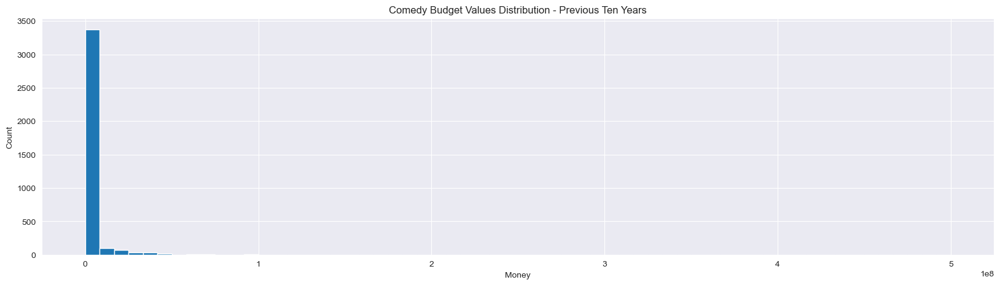

BUDGET Median = 35000.0, Mean = 2841932.1992316134
count    3.644000e+03
mean     2.841932e+06
std      1.296744e+07
min      1.000000e+00
25%      1.753000e+03
50%      3.500000e+04
75%      1.000000e+06
max      5.000000e+08
Name: budget, dtype: float64


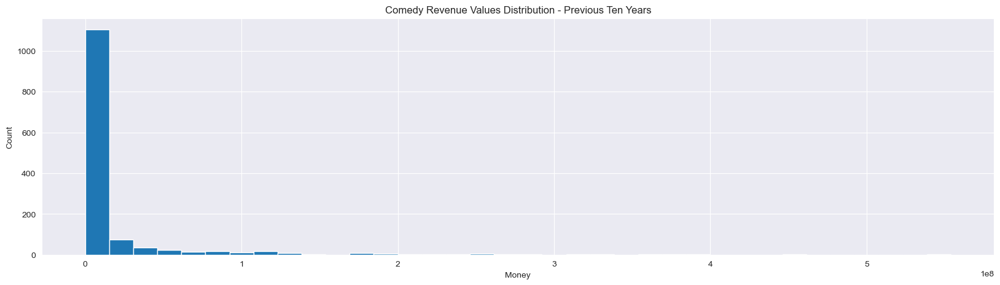

REVENUE Median = 1500000.0, Mean = 17252596.18452381
count    1.344000e+03
mean     1.725260e+07
std      4.899232e+07
min      1.000000e+00
25%      7.794200e+04
50%      1.500000e+06
75%      7.862364e+06
max      5.538102e+08
Name: revenue, dtype: float64


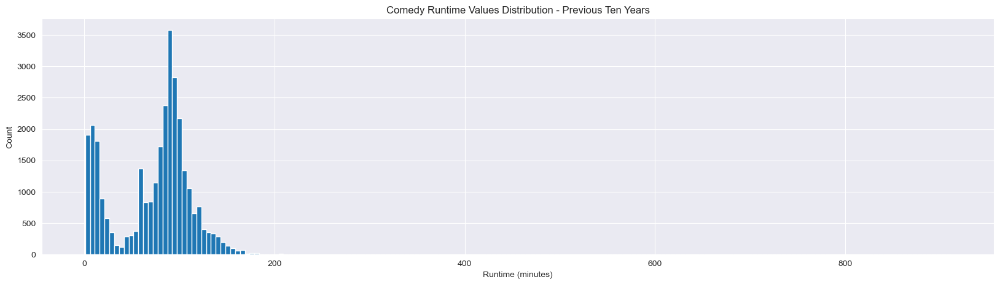

RUNTIME Median = 85.0, Mean = 72.81410662276814
count    31588.000000
mean        72.814107
std         41.525343
min          1.000000
25%         42.000000
50%         85.000000
75%         98.000000
max        911.000000
Name: runtime, dtype: float64


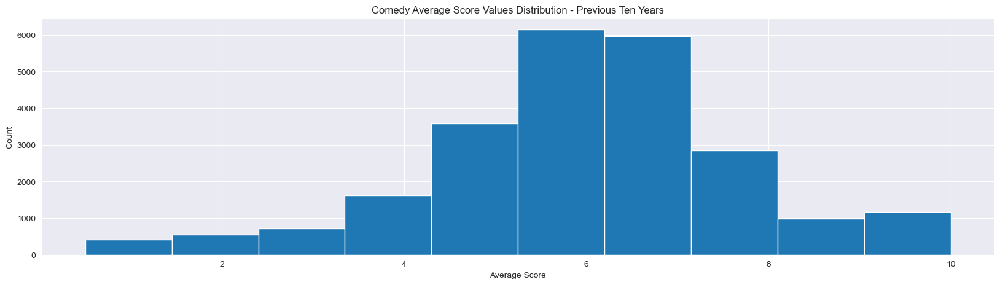

SCORE Median = 6.0, Mean = 6.018397506983009
count    23987.000000
mean         6.018398
std          1.774638
min          0.500000
25%          5.000000
50%          6.000000
75%          7.000000
max         10.000000
Name: vote_average, dtype: float64


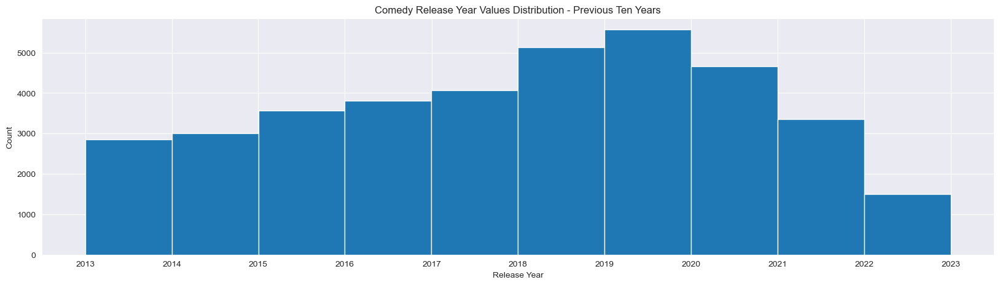

RELEASE DATE Median = 2018-04-26 00:00:00, Mean = 2018-01-14 21:55:53.749367040
count                            37513
mean     2018-01-14 21:55:53.749367040
min                2013-01-01 00:00:00
25%                2016-01-01 00:00:00
50%                2018-04-26 00:00:00
75%                2020-01-06 00:00:00
max                2022-12-31 00:00:00
Name: release_date, dtype: object


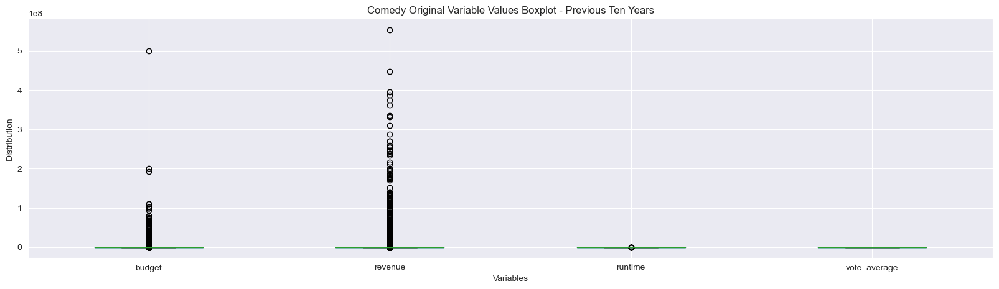

In [32]:
#Show distribution of previous 10 Year Comedy variable values
n_data = len(com10b_movies.budget)
n_bins = np.sqrt(n_data)
n_bins = int(n_bins)
_ =plt.hist(com10b_movies.budget, bins=n_bins)
plt.title('Comedy Budget Values Distribution - Previous Ten Years')
plt.xlabel('Money')
plt.ylabel('Count')
plt.show()

#Calculate median and mean values for variables
print(f"BUDGET Median = {com10b_movies.budget.median()}, Mean = {com10b_movies.budget.mean()}")
print(com10b_movies.budget.describe())

n_data = len(com10r_movies.revenue)
n_bins = np.sqrt(n_data)
n_bins = int(n_bins)
_ =plt.hist(com10r_movies.revenue, bins=n_bins)
plt.title('Comedy Revenue Values Distribution - Previous Ten Years')
plt.xlabel('Money')
plt.ylabel('Count')
plt.show()

print(f"REVENUE Median = {com10r_movies.revenue.median()}, Mean = {com10r_movies.revenue.mean()}")
print(com10r_movies.revenue.describe())

n_data = len(com10d_movies.runtime)
n_bins = np.sqrt(n_data)
n_bins = int(n_bins)
_ =plt.hist(com10d_movies.runtime, bins=n_bins)
plt.title('Comedy Runtime Values Distribution - Previous Ten Years')
plt.xlabel('Runtime (minutes)')
plt.ylabel('Count')
plt.show()

print(f"RUNTIME Median = {com10d_movies.runtime.median()}, Mean = {com10d_movies.runtime.mean()}")
print(com10d_movies.runtime.describe())

_ =plt.hist(com10v_movies.vote_average)
plt.title('Comedy Average Score Values Distribution - Previous Ten Years')
plt.xlabel('Average Score')
plt.ylabel('Count')
plt.show()

print(f"SCORE Median = {com10v_movies.vote_average.median()}, Mean = {com10v_movies.vote_average.mean()}")
print(com10v_movies.vote_average.describe())

_ =plt.hist(com10_movies.release_date)
plt.title('Comedy Release Year Values Distribution - Previous Ten Years')
plt.xlabel('Release Year')
plt.ylabel('Count')
plt.show()

print(f"RELEASE DATE Median = {com10_movies.release_date.median()}, Mean = {com10_movies.release_date.mean()}")
print(com10_movies.release_date.describe(datetime_is_numeric=True))

com10_movies.boxplot(column=['budget', 'revenue', 'runtime', 'vote_average'])
plt.title('Comedy Original Variable Values Boxplot - Previous Ten Years')
plt.xlabel('Variables')
plt.ylabel('Distribution')
plt.show()

In [33]:
#Drop zero values from 10 Year Crime variables. 
#Create a seperate dataframe for each so as not to affect the other variables calculations.
cri10b_movies = cri10_movies[cri10_movies['budget'] !=0]
cri10r_movies = cri10_movies[cri10_movies['revenue'] !=0]
cri10d_movies = cri10_movies[cri10_movies['runtime'] !=0]
cri10v_movies = cri10_movies[cri10_movies['vote_average'] !=0]

#Remove Outliers from 10 Year Crime variables and 
Q1 = cri10b_movies.budget.quantile(0.25)
Q3 = cri10b_movies.budget.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(cri10b_movies['budget']>=upper_limit)[0]
lower_array = np.where(cri10b_movies['budget']<=lower_limit)[0]
cri10b_movies['budget'].drop(index=upper_array, inplace=True)
cri10b_movies['budget'].drop(index=lower_array, inplace=True)

Q1 = cri10r_movies.revenue.quantile(0.25)
Q3 = cri10r_movies.revenue.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(cri10r_movies['revenue']>=upper_limit)[0]
lower_array = np.where(cri10r_movies['revenue']<=lower_limit)[0]
cri10r_movies['revenue'].drop(index=upper_array, inplace=True)
cri10r_movies['revenue'].drop(index=lower_array, inplace=True)

Q1 = cri10d_movies.runtime.quantile(0.25)
Q3 = cri10d_movies.runtime.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(cri10d_movies['runtime']>=upper_limit)[0]
lower_array = np.where(cri10d_movies['runtime']<=lower_limit)[0]
cri10d_movies['runtime'].drop(index=upper_array, inplace=True)
cri10d_movies['runtime'].drop(index=lower_array, inplace=True)

Q1 = cri10v_movies.vote_average.quantile(0.25)
Q3 = cri10v_movies.vote_average.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(cri10v_movies['vote_average']>=upper_limit)[0]
lower_array = np.where(cri10v_movies['vote_average']<=lower_limit)[0]
cri10v_movies['vote_average'].drop(index=upper_array, inplace=True)
cri10v_movies['vote_average'].drop(index=lower_array, inplace=True)

KeyError: '[0, 1, 2, 3, 4, 11, 15, 16, 17, 19, 20, 21, 26, 32, 34, 36, 40, 41, 42, 43, 50, 52, 57, 61, 64, 68, 71, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 88, 95, 96, 97, 106, 107, 109, 115, 116, 118, 123, 124, 129, 242, 532] not found in axis'

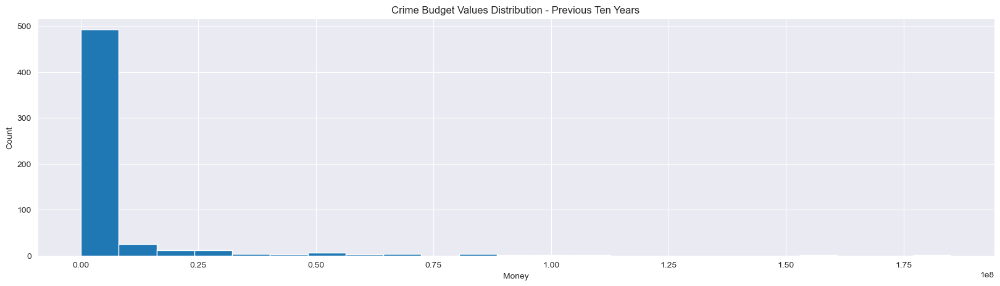

BUDGET Median = 83641.5, Mean = 5315922.64310954
count    5.660000e+02
mean     5.315923e+06
std      1.675599e+07
min      1.000000e+00
25%      1.050000e+03
50%      8.364150e+04
75%      2.000000e+06
max      1.850000e+08
Name: budget, dtype: float64


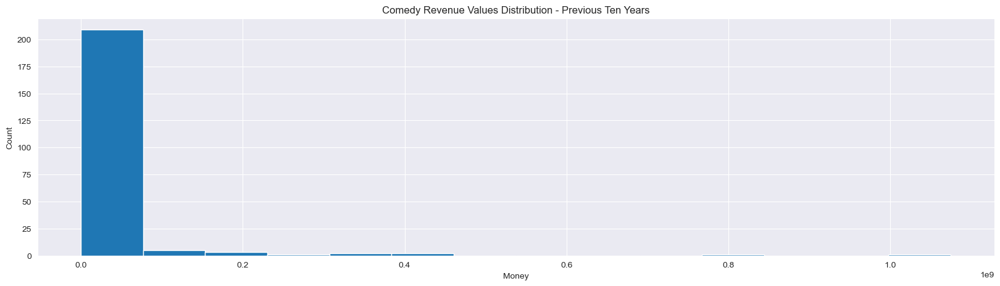

REVENUE Median = 1100000.0, Mean = 28122070.433035713
count    2.240000e+02
mean     2.812207e+07
std      1.036812e+08
min      1.000000e+00
25%      1.387500e+05
50%      1.100000e+06
75%      1.250530e+07
max      1.074458e+09
Name: revenue, dtype: float64


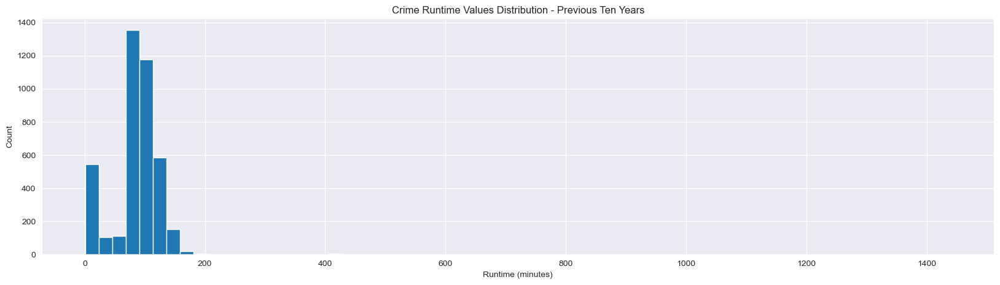

RUNTIME Median = 90.0, Mean = 86.66085461689588
count    4072.000000
mean       86.660855
std        43.785224
min         1.000000
25%        79.000000
50%        90.000000
75%       107.000000
max      1440.000000
Name: runtime, dtype: float64


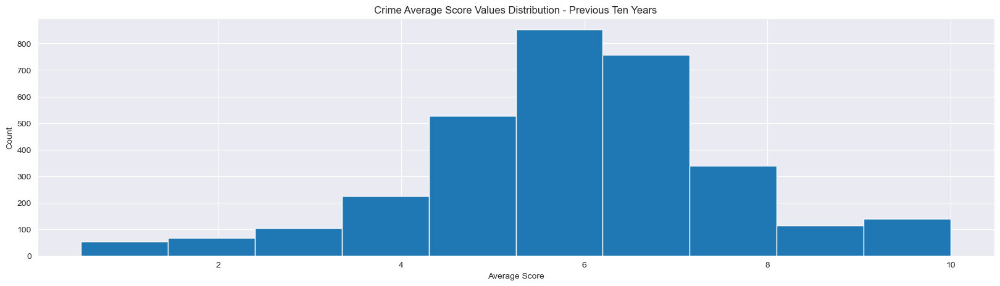

SCORE Median = 6.0, Mean = 5.927833753148583
count    3176.000000
mean        5.927834
std         1.741240
min         0.500000
25%         5.000000
50%         6.000000
75%         7.000000
max        10.000000
Name: vote_average, dtype: float64


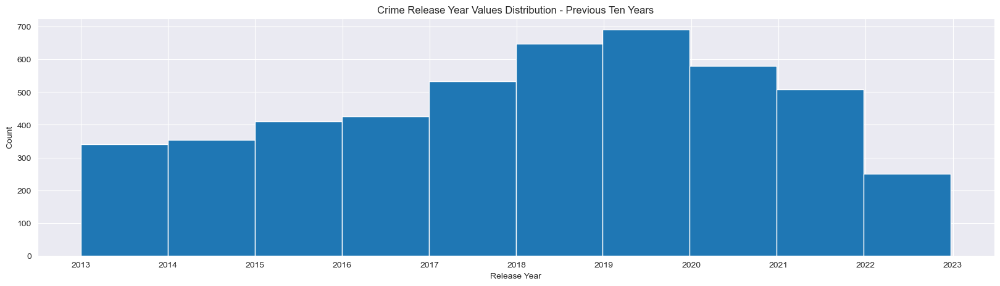

RELEASE DATE Median = 2018-08-04 00:00:00, Mean = 2018-03-18 15:35:35.387212544
count                             4739
mean     2018-03-18 15:35:35.387212544
min                2013-01-01 00:00:00
25%                2016-02-26 00:00:00
50%                2018-08-04 00:00:00
75%                2020-04-15 00:00:00
max                2022-12-23 00:00:00
Name: release_date, dtype: object


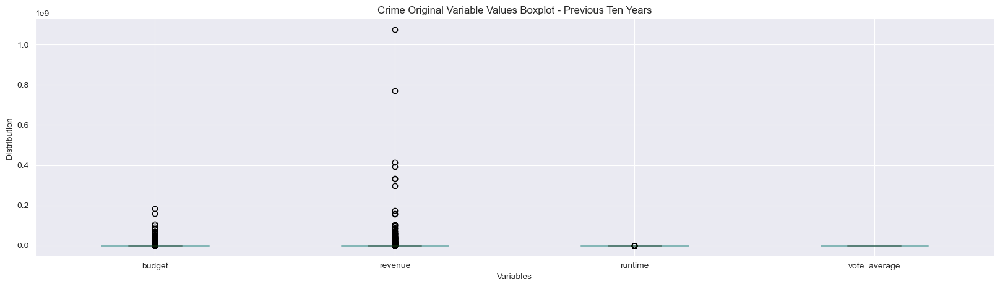

In [34]:
#Show distribution of previous 10 Year Crime variable values
n_data = len(cri10b_movies.budget)
n_bins = np.sqrt(n_data)
n_bins = int(n_bins)
_ =plt.hist(cri10b_movies.budget, bins=n_bins)
plt.title('Crime Budget Values Distribution - Previous Ten Years')
plt.xlabel('Money')
plt.ylabel('Count')
plt.show()

#Calculate median and mean values for variables
print(f"BUDGET Median = {cri10b_movies.budget.median()}, Mean = {cri10b_movies.budget.mean()}")
print(cri10b_movies.budget.describe())

n_data = len(cri10r_movies.revenue)
n_bins = np.sqrt(n_data)
n_bins = int(n_bins)
_ =plt.hist(cri10r_movies.revenue, bins=n_bins)
plt.title('Comedy Revenue Values Distribution - Previous Ten Years')
plt.xlabel('Money')
plt.ylabel('Count')
plt.show()

print(f"REVENUE Median = {cri10r_movies.revenue.median()}, Mean = {cri10r_movies.revenue.mean()}")
print(cri10r_movies.revenue.describe())

n_data = len(cri10d_movies.runtime)
n_bins = np.sqrt(n_data)
n_bins = int(n_bins)
_ =plt.hist(cri10d_movies.runtime, bins=n_bins)
plt.title('Crime Runtime Values Distribution - Previous Ten Years')
plt.xlabel('Runtime (minutes)')
plt.ylabel('Count')
plt.show()

print(f"RUNTIME Median = {cri10d_movies.runtime.median()}, Mean = {cri10d_movies.runtime.mean()}")
print(cri10d_movies.runtime.describe())

_ =plt.hist(cri10v_movies.vote_average)
plt.title('Crime Average Score Values Distribution - Previous Ten Years')
plt.xlabel('Average Score')
plt.ylabel('Count')
plt.show()

print(f"SCORE Median = {cri10v_movies.vote_average.median()}, Mean = {cri10v_movies.vote_average.mean()}")
print(cri10v_movies.vote_average.describe())

_ =plt.hist(cri10_movies.release_date)
plt.title('Crime Release Year Values Distribution - Previous Ten Years')
plt.xlabel('Release Year')
plt.ylabel('Count')
plt.show()

print(f"RELEASE DATE Median = {cri10_movies.release_date.median()}, Mean = {cri10_movies.release_date.mean()}")
print(cri10_movies.release_date.describe(datetime_is_numeric=True))

cri10_movies.boxplot(column=['budget', 'revenue', 'runtime', 'vote_average'])
plt.title('Crime Original Variable Values Boxplot - Previous Ten Years')
plt.xlabel('Variables')
plt.ylabel('Distribution')
plt.show()

In [35]:
#Drop zero values from 10 Year Documentary variables. 
#Create a seperate dataframe for each so as not to affect the other variables calculations.
doc10b_movies = doc10_movies[doc10_movies['budget'] !=0]
doc10r_movies = doc10_movies[doc10_movies['revenue'] !=0]
doc10d_movies = doc10_movies[doc10_movies['runtime'] !=0]
doc10v_movies = doc10_movies[doc10_movies['vote_average'] !=0]

#Remove Outliers from 10 Year Documentary variables and 
Q1 = doc10b_movies.budget.quantile(0.25)
Q3 = doc10b_movies.budget.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(doc10b_movies['budget']>=upper_limit)[0]
lower_array = np.where(doc10b_movies['budget']<=lower_limit)[0]
doc10b_movies['budget'].drop(index=upper_array, inplace=True)
doc10b_movies['budget'].drop(index=lower_array, inplace=True)

Q1 = doc10r_movies.revenue.quantile(0.25)
Q3 = doc10r_movies.revenue.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(doc10r_movies['revenue']>=upper_limit)[0]
lower_array = np.where(doc10r_movies['revenue']<=lower_limit)[0]
doc10r_movies['revenue'].drop(index=upper_array, inplace=True)
doc10r_movies['revenue'].drop(index=lower_array, inplace=True)

Q1 = doc10d_movies.runtime.quantile(0.25)
Q3 = doc10d_movies.runtime.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(doc10d_movies['runtime']>=upper_limit)[0]
lower_array = np.where(doc10d_movies['runtime']<=lower_limit)[0]
doc10d_movies['runtime'].drop(index=upper_array, inplace=True)
doc10d_movies['runtime'].drop(index=lower_array, inplace=True)

Q1 = doc10v_movies.vote_average.quantile(0.25)
Q3 = doc10v_movies.vote_average.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(doc10v_movies['vote_average']>=upper_limit)[0]
lower_array = np.where(doc10v_movies['vote_average']<=lower_limit)[0]
doc10v_movies['vote_average'].drop(index=upper_array, inplace=True)
doc10v_movies['vote_average'].drop(index=lower_array, inplace=True)

KeyError: '[0, 1, 2, 12, 14, 27, 30, 31, 32, 33, 34, 35, 37, 38, 39, 40, 41, 52, 59, 60, 61, 62, 63, 73, 80, 81, 82, 83, 84, 85, 86, 87, 89, 90, 91, 92, 93, 94, 95, 96, 101, 102, 103, 109, 110, 111, 112, 113, 114, 115, 116, 117, 122, 123, 124, 125, 126, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 151, 152, 153, 154, 159, 205, 224, 242, 254, 266, 267, 268, 269, 270, 272, 273, 274, 275, 276, 277, 278, 279, 280, 293, 294, 295, 296, 297, 298, 299, 300, 301, 302, 303, 305, 311, 316, 317, 318, 319, 320, 321, 322, 323, 324, 329, 330, 331, 332, 356, 362, 373, 374, 375, 376, 392, 393, 394, 395, 396, 402, 408, 420, 421, 422, 423, 441, 442, 443, 444, 454, 455, 456, 457, 466, 467, 468, 469, 470, 471, 490, 491, 507, 523, 527, 555, 569, 570, 571, 572, 591, 595, 596, 597, 598, 607, 638, 640, 641, 642, 643, 653, 654, 655, 656, 657, 658, 659, 660, 661, 662, 663, 665, 666, 667, 668, 680, 681, 700, 701, 702, 703, 716, 717, 718, 719, 720, 721, 767, 810, 811, 812, 813, 830, 832, 833, 834, 835, 850, 853, 854, 855, 858, 859, 860, 861, 867, 868, 869, 870, 871, 872, 873, 874, 875, 879, 880, 882, 883, 884, 885, 886, 915, 920, 957, 961, 962, 963, 964, 976, 977, 978, 979, 980, 981, 982, 983, 984, 1026, 1028, 1035, 1036, 1037, 1038, 1039, 1041, 1047, 1055, 1064, 1065, 1067, 1081, 1085, 1093, 1094, 1095, 1096, 1102, 1147, 1153, 1156, 1164, 1165, 1166, 1167, 1168, 1172, 1173, 1174, 1175, 1201, 1202, 1203, 1204, 1205, 1213, 1214, 1215, 1216, 1217, 1229, 1230, 1231, 1232, 1247, 1303, 1330, 1342, 1395, 1397, 1402, 1403, 1404, 1405, 1421, 1448, 1449, 1493, 1557, 1613, 1646, 1698, 1719, 1792, 1794, 1798, 1799, 1817, 1819, 1868, 1872, 1885, 1890, 1891, 1920, 1927, 1929, 2038, 2040, 2045, 2132, 2144, 2147, 2216, 2232, 2288, 2345, 2407, 2448, 2516, 2522, 2534, 2540, 2562, 2571, 2626] not found in axis'

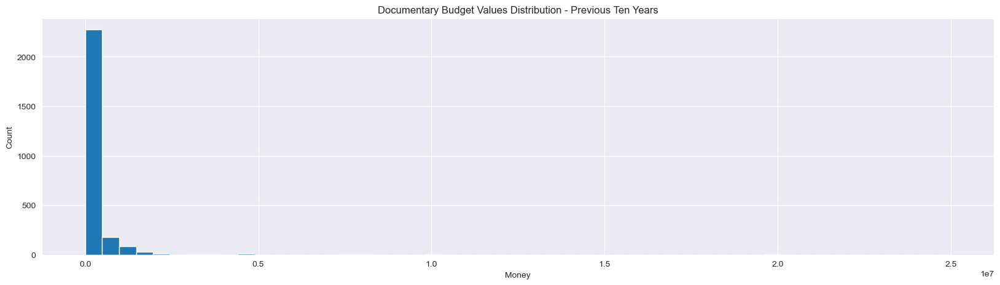

BUDGET Median = 25625.0, Mean = 302663.8291476408
count    2.628000e+03
mean     3.026638e+05
std      1.355766e+06
min      1.000000e+00
25%      1.000000e+03
50%      2.562500e+04
75%      1.880000e+05
max      2.500000e+07
Name: budget, dtype: float64


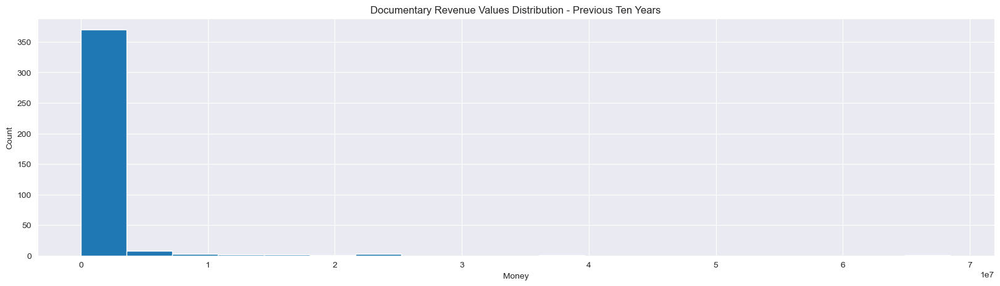

REVENUE Median = 43471.0, Mean = 1097343.0588235294
count    3.910000e+02
mean     1.097343e+06
std      4.813967e+06
min      1.000000e+00
25%      3.286000e+03
50%      4.347100e+04
75%      4.197560e+05
max      6.850000e+07
Name: revenue, dtype: float64


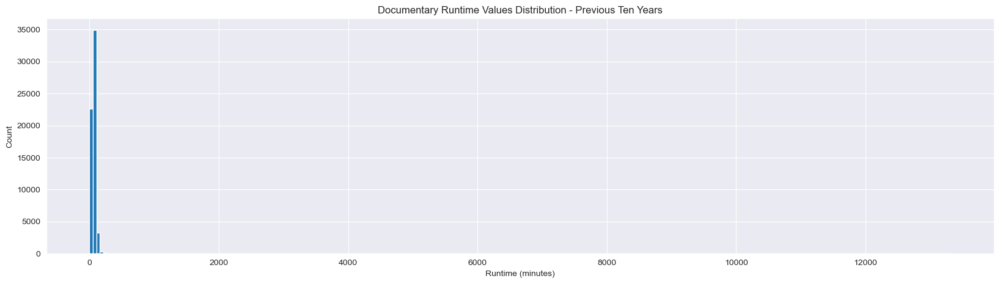

RUNTIME Median = 69.0, Mean = 64.98549360680211
count    61628.000000
mean        64.985494
std         68.909005
min          1.000000
25%         40.000000
50%         69.000000
75%         88.000000
max      13319.000000
Name: runtime, dtype: float64


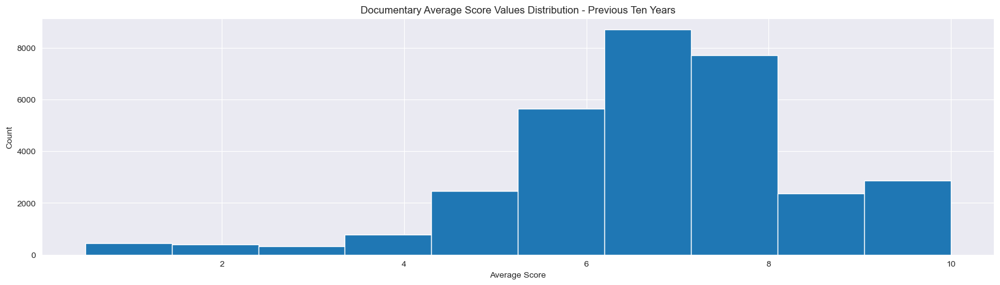

SCORE Median = 7.0, Mean = 6.865277639261364
count    31685.000000
mean         6.865278
std          1.729306
min          0.500000
25%          6.000000
50%          7.000000
75%          8.000000
max         10.000000
Name: vote_average, dtype: float64


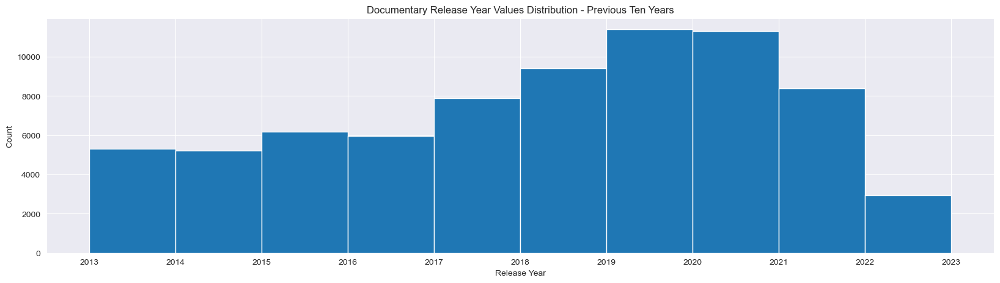

RELEASE DATE Median = 2018-09-30 00:00:00, Mean = 2018-04-22 22:57:43.121199872
count                            74010
mean     2018-04-22 22:57:43.121199872
min                2013-01-01 00:00:00
25%                2016-04-27 00:00:00
50%                2018-09-30 00:00:00
75%                2020-05-13 18:00:00
max                2022-12-31 00:00:00
Name: release_date, dtype: object


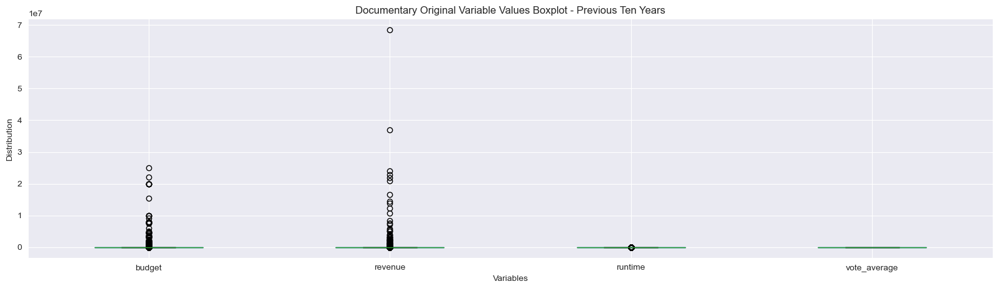

In [36]:
#Show distribution of previous 10 Year Documentary variable values
n_data = len(doc10b_movies.budget)
n_bins = np.sqrt(n_data)
n_bins = int(n_bins)
_ =plt.hist(doc10b_movies.budget, bins=n_bins)
plt.title('Documentary Budget Values Distribution - Previous Ten Years')
plt.xlabel('Money')
plt.ylabel('Count')
plt.show()

#Calculate median and mean values for variables
print(f"BUDGET Median = {doc10b_movies.budget.median()}, Mean = {doc10b_movies.budget.mean()}")
print(doc10b_movies.budget.describe())

n_data = len(doc10r_movies.revenue)
n_bins = np.sqrt(n_data)
n_bins = int(n_bins)
_ =plt.hist(doc10r_movies.revenue, bins=n_bins)
plt.title('Documentary Revenue Values Distribution - Previous Ten Years')
plt.xlabel('Money')
plt.ylabel('Count')
plt.show()

print(f"REVENUE Median = {doc10r_movies.revenue.median()}, Mean = {doc10r_movies.revenue.mean()}")
print(doc10r_movies.revenue.describe())

n_data = len(doc10d_movies.runtime)
n_bins = np.sqrt(n_data)
n_bins = int(n_bins)
_ =plt.hist(doc10d_movies.runtime, bins=n_bins)
plt.title('Documentary Runtime Values Distribution - Previous Ten Years')
plt.xlabel('Runtime (minutes)')
plt.ylabel('Count')
plt.show()

print(f"RUNTIME Median = {doc10d_movies.runtime.median()}, Mean = {doc10d_movies.runtime.mean()}")
print(doc10d_movies.runtime.describe())

_ =plt.hist(doc10v_movies.vote_average)
plt.title('Documentary Average Score Values Distribution - Previous Ten Years')
plt.xlabel('Average Score')
plt.ylabel('Count')
plt.show()

print(f"SCORE Median = {doc10v_movies.vote_average.median()}, Mean = {doc10v_movies.vote_average.mean()}")
print(doc10v_movies.vote_average.describe())

_ =plt.hist(doc10_movies.release_date)
plt.title('Documentary Release Year Values Distribution - Previous Ten Years')
plt.xlabel('Release Year')
plt.ylabel('Count')
plt.show()

print(f"RELEASE DATE Median = {doc10_movies.release_date.median()}, Mean = {doc10_movies.release_date.mean()}")
print(doc10_movies.release_date.describe(datetime_is_numeric=True))

doc10_movies.boxplot(column=['budget', 'revenue', 'runtime', 'vote_average'])
plt.title('Documentary Original Variable Values Boxplot - Previous Ten Years')
plt.xlabel('Variables')
plt.ylabel('Distribution')
plt.show()

In [37]:
#Drop zero values from 10 Year Drama variables. 
#Create a seperate dataframe for each so as not to affect the other variables calculations.
dra10b_movies = dra10_movies[dra10_movies['budget'] !=0]
dra10r_movies = dra10_movies[dra10_movies['revenue'] !=0]
dra10d_movies = dra10_movies[dra10_movies['runtime'] !=0]
dra10v_movies = dra10_movies[dra10_movies['vote_average'] !=0]

#Remove Outliers from 10 Year Drama variables and 
Q1 = dra10b_movies.budget.quantile(0.25)
Q3 = dra10b_movies.budget.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(dra10b_movies['budget']>=upper_limit)[0]
lower_array = np.where(dra10b_movies['budget']<=lower_limit)[0]
dra10b_movies['budget'].drop(index=upper_array, inplace=True)
dra10b_movies['budget'].drop(index=lower_array, inplace=True)

Q1 = dra10r_movies.revenue.quantile(0.25)
Q3 = dra10r_movies.revenue.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(dra10r_movies['revenue']>=upper_limit)[0]
lower_array = np.where(dra10r_movies['revenue']<=lower_limit)[0]
dra10r_movies['revenue'].drop(index=upper_array, inplace=True)
dra10r_movies['revenue'].drop(index=lower_array, inplace=True)

Q1 = dra10d_movies.runtime.quantile(0.25)
Q3 = dra10d_movies.runtime.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(dra10d_movies['runtime']>=upper_limit)[0]
lower_array = np.where(dra10d_movies['runtime']<=lower_limit)[0]
dra10d_movies['runtime'].drop(index=upper_array, inplace=True)
dra10d_movies['runtime'].drop(index=lower_array, inplace=True)

Q1 = dra10v_movies.vote_average.quantile(0.25)
Q3 = dra10v_movies.vote_average.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(dra10v_movies['vote_average']>=upper_limit)[0]
lower_array = np.where(dra10v_movies['vote_average']<=lower_limit)[0]
dra10v_movies['vote_average'].drop(index=upper_array, inplace=True)
dra10v_movies['vote_average'].drop(index=lower_array, inplace=True)

KeyError: '[0, 1, 2, 5, 7, 8, 9, 10, 12, 13, 14, 15, 18, 19, 23, 24, 25, 26, 27, 28, 29, 30, 31, 33, 34, 35, 37, 39, 41, 43, 44, 46, 47, 48, 49, 51, 53, 54, 55, 58, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 71, 72, 74, 75, 77, 79, 80, 81, 82, 83, 85, 86, 87, 88, 90, 91, 93, 94, 95, 98, 99, 101, 103, 104, 106, 113, 115, 119, 120, 122, 123, 124, 125, 126, 132, 133, 134, 135, 136, 137, 138, 143, 145, 146, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 162, 163, 164, 167, 168, 169, 171, 173, 176, 179, 180, 182, 185, 186, 187, 188, 189, 190, 191, 192, 195, 196, 197, 198, 199, 201, 202, 205, 206, 210, 211, 214, 217, 218, 219, 221, 223, 224, 226, 228, 229, 230, 231, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 246, 247, 250, 251, 254, 255, 256, 257, 259, 260, 261, 263, 264, 266, 267, 269, 272, 273, 276, 280, 283, 284, 289, 290, 291, 299, 300, 303, 304, 306, 308, 309, 311, 313, 314, 317, 318, 323, 325, 327, 328, 329, 332, 333, 334, 335, 338, 339, 340, 341, 343, 346, 347, 352, 357, 358, 359, 361, 362, 363, 364, 365, 366, 368, 369, 371, 372, 374, 375, 376, 377, 378, 379, 382, 383, 385, 388, 389, 397, 398, 399, 402, 405, 406, 407, 409, 410, 411, 413, 414, 416, 417, 422, 423, 424, 425, 426, 430, 434, 436, 440, 441, 444, 445, 446, 447, 448, 449, 450, 451, 453, 455, 456, 457, 458, 463, 465, 468, 469, 470, 472, 473, 474, 475, 484, 485, 487, 489, 490, 491, 495, 501, 504, 505, 506, 508, 509, 510, 512, 514, 517, 518, 519, 522, 524, 528, 529, 530, 532, 534, 536, 537, 542, 543, 550, 552, 553, 554, 555, 556, 557, 558, 560, 561, 562, 564, 565, 568, 569, 574, 576, 577, 578, 585, 586, 587, 588, 595, 596, 601, 604, 605, 606, 608, 610, 612, 613, 615, 616, 617, 619, 621, 629, 630, 632, 636, 637, 638, 640, 643, 644, 646, 647, 648, 650, 653, 654, 656, 657, 658, 660, 661, 662, 664, 665, 668, 669, 682, 683, 686, 688, 689, 692, 695, 696, 699, 707, 710, 711, 715, 717, 718, 719, 720, 721, 722, 723, 724, 730, 737, 749, 750, 751, 752, 753, 756, 759, 761, 762, 764, 765, 766, 767, 768, 770, 771, 781, 782, 791, 792, 793, 795, 801, 811, 813, 815, 816, 818, 820, 822, 824, 836, 837, 842, 844, 846, 847, 850, 851, 852, 853, 854, 855, 861, 862, 864, 874, 879, 882, 884, 885, 886, 887, 888, 889, 892, 894, 895, 896, 902, 904, 906, 907, 908, 938, 948, 949, 951, 952, 953, 965, 979, 980, 981, 983, 985, 993, 1002, 1003, 1004, 1005, 1006, 1011, 1027, 1030, 1031, 1032, 1034, 1052, 1058, 1059, 1060, 1061, 1062, 1087, 1088, 1093, 1094, 1097, 1098, 1101, 1102, 1103, 1112, 1122, 1135, 1140, 1141, 1142, 1144, 1145, 1146, 1147, 1148, 1153, 1165, 1166, 1167, 1194, 1195, 1196, 1197, 1206, 1207, 1209, 1223, 1226, 1228, 1229, 1235, 1262, 1263, 1273, 1284, 1300, 1315, 1317, 1322, 1324, 1331, 1332, 1337, 1338, 1340, 1361, 1380, 1401, 1428, 1429, 1430, 1438, 1444, 1456, 1458, 1464, 1466, 1471, 1484, 1495, 1496, 1497, 1507, 1537, 1539, 1540, 1547, 1551, 1552, 1553, 1554, 1576, 1585, 1586, 1587, 1588, 1596, 1611, 1612, 1613, 1614, 1615, 1616, 1617, 1618, 1619, 1625, 1626, 1630, 1631, 1632, 1633, 1635, 1636, 1637, 1639, 1640, 1641, 1642, 1668, 1688, 1694, 1713, 1714, 1715, 1716, 1717, 1726, 1727, 1728, 1729, 1756, 1757, 1765, 1772, 1786, 1794, 1815, 1824, 1846, 1847, 1848, 1852, 1878, 1894, 1900, 1931, 1937, 1979, 1980, 1981, 1982, 1986, 2032, 2039, 2040, 2049, 2051, 2052, 2053, 2054, 2055, 2056, 2057, 2058, 2071, 2179, 2180, 2181, 2182, 2201, 2210, 2222, 2224, 2225, 2251, 2334, 2354, 2355, 2389, 2413, 2423, 2436, 2437, 2438, 2439, 2456, 2457, 2495, 2496, 2497, 2498, 2521, 2522, 2524, 2529, 2530, 2531, 2532, 2570, 2610, 2632, 2633, 2634, 2660, 2669, 2674, 2677, 2684, 2685, 2686, 2687, 2694, 2695, 2696, 2697, 2762, 2822, 2834, 2856, 2857, 2858, 2859, 2862, 2883, 2924, 2936, 2937, 2938, 2939, 2942, 2943, 2952, 2957, 2959, 2968, 2969, 2970, 2971, 3027, 3038, 3039, 3040, 3041, 3098, 3116, 3117, 3118, 3119, 3140, 3146, 3152, 3176, 3225, 3261, 3262, 3267, 3285, 3320, 3321, 3322, 3323, 3359, 3385, 3422, 3423, 3424, 3425, 3554, 3589, 3621, 3694, 3915, 4133, 4150, 4159, 4257, 4263, 4285, 4331, 4662, 4666, 4963, 5087, 5095, 5116, 5270, 5358, 5485] not found in axis'

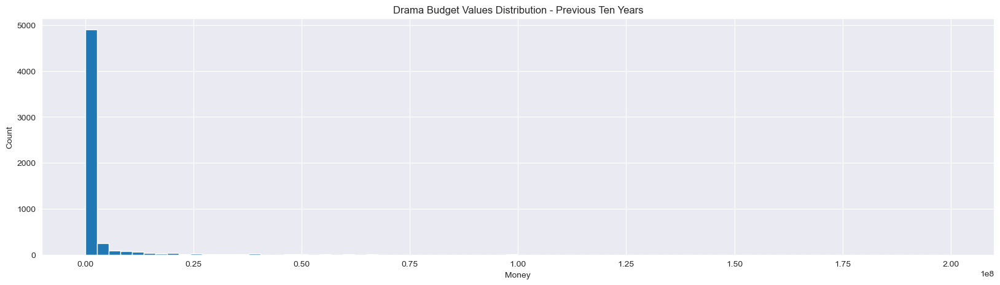

BUDGET Median = 15000.0, Mean = 2137482.273826458
count    5.624000e+03
mean     2.137482e+06
std      8.639920e+06
min      1.000000e+00
25%      1.000000e+03
50%      1.500000e+04
75%      5.131280e+05
max      2.000000e+08
Name: budget, dtype: float64


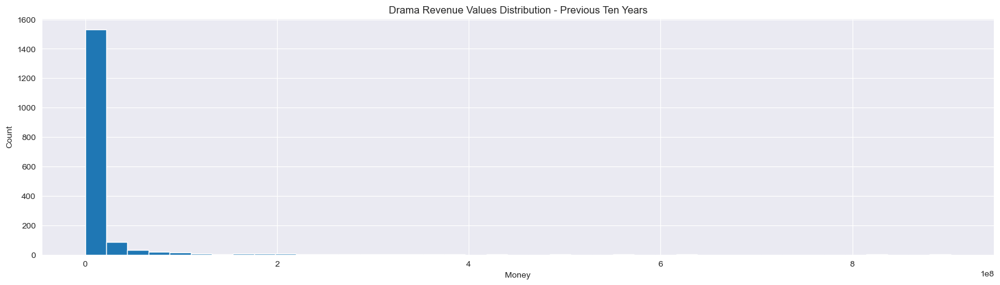

REVENUE Median = 577641.0, Mean = 14151533.406916426
count    1.735000e+03
mean     1.415153e+07
std      5.403780e+07
min      1.000000e+00
25%      3.979850e+04
50%      5.776410e+05
75%      5.279486e+06
max      9.025409e+08
Name: revenue, dtype: float64


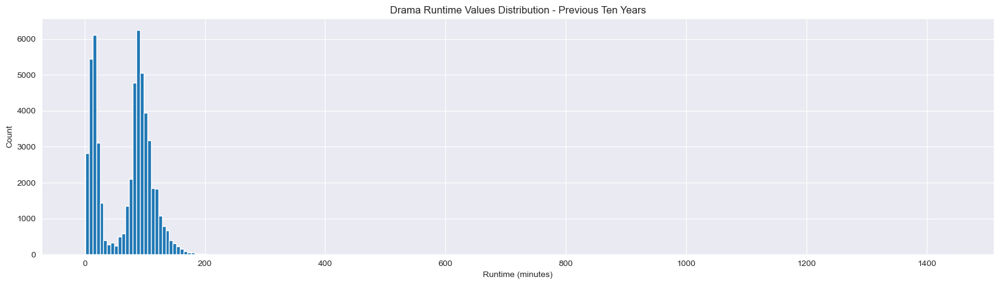

RUNTIME Median = 84.0, Mean = 69.04245410245805
count    55613.000000
mean        69.042454
std         44.906021
min          1.000000
25%         19.000000
50%         84.000000
75%        100.000000
max       1440.000000
Name: runtime, dtype: float64


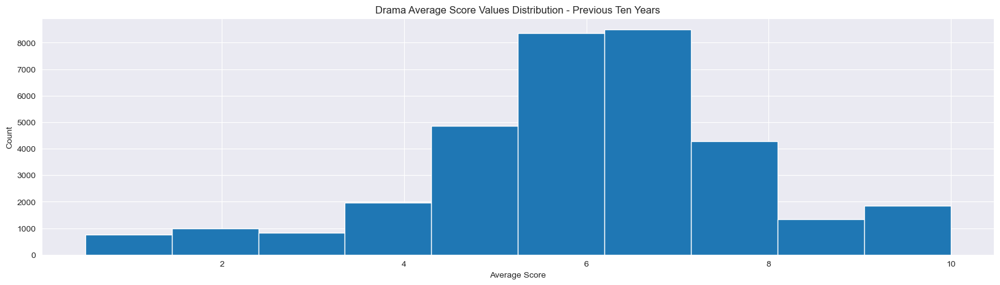

SCORE Median = 6.0, Mean = 6.056667535390527
count    33766.000000
mean         6.056668
std          1.841079
min          0.500000
25%          5.000000
50%          6.000000
75%          7.000000
max         10.000000
Name: vote_average, dtype: float64


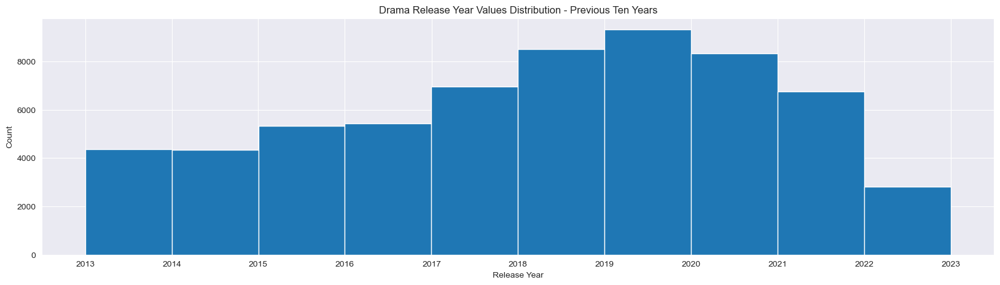

RELEASE DATE Median = 2018-08-17 00:00:00, Mean = 2018-04-06 09:31:53.750341632
count                            62173
mean     2018-04-06 09:31:53.750341632
min                2013-01-01 00:00:00
25%                2016-04-28 00:00:00
50%                2018-08-17 00:00:00
75%                2020-04-07 00:00:00
max                2022-12-31 00:00:00
Name: release_date, dtype: object


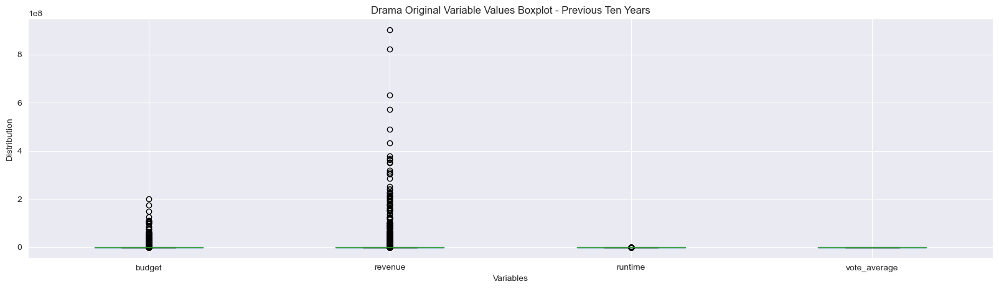

In [38]:
#Show distribution of previous 10 Year Drama variable values
n_data = len(dra10b_movies.budget)
n_bins = np.sqrt(n_data)
n_bins = int(n_bins)
_ =plt.hist(dra10b_movies.budget, bins=n_bins)
plt.title('Drama Budget Values Distribution - Previous Ten Years')
plt.xlabel('Money')
plt.ylabel('Count')
plt.show()

#Calculate median and mean values for variables
print(f"BUDGET Median = {dra10b_movies.budget.median()}, Mean = {dra10b_movies.budget.mean()}")
print(dra10b_movies.budget.describe())

n_data = len(dra10r_movies.revenue)
n_bins = np.sqrt(n_data)
n_bins = int(n_bins)
_ =plt.hist(dra10r_movies.revenue, bins=n_bins)
plt.title('Drama Revenue Values Distribution - Previous Ten Years')
plt.xlabel('Money')
plt.ylabel('Count')
plt.show()

print(f"REVENUE Median = {dra10r_movies.revenue.median()}, Mean = {dra10r_movies.revenue.mean()}")
print(dra10r_movies.revenue.describe())

n_data = len(dra10d_movies.runtime)
n_bins = np.sqrt(n_data)
n_bins = int(n_bins)
_ =plt.hist(dra10d_movies.runtime, bins=n_bins)
plt.title('Drama Runtime Values Distribution - Previous Ten Years')
plt.xlabel('Runtime (minutes)')
plt.ylabel('Count')
plt.show()

print(f"RUNTIME Median = {dra10d_movies.runtime.median()}, Mean = {dra10d_movies.runtime.mean()}")
print(dra10d_movies.runtime.describe())

_ =plt.hist(dra10v_movies.vote_average)
plt.title('Drama Average Score Values Distribution - Previous Ten Years')
plt.xlabel('Average Score')
plt.ylabel('Count')
plt.show()

print(f"SCORE Median = {dra10v_movies.vote_average.median()}, Mean = {dra10v_movies.vote_average.mean()}")
print(dra10v_movies.vote_average.describe())

_ =plt.hist(dra10_movies.release_date)
plt.title('Drama Release Year Values Distribution - Previous Ten Years')
plt.xlabel('Release Year')
plt.ylabel('Count')
plt.show()

print(f"RELEASE DATE Median = {dra10_movies.release_date.median()}, Mean = {dra10_movies.release_date.mean()}")
print(dra10_movies.release_date.describe(datetime_is_numeric=True))

dra10_movies.boxplot(column=['budget', 'revenue', 'runtime', 'vote_average'])
plt.title('Drama Original Variable Values Boxplot - Previous Ten Years')
plt.xlabel('Variables')
plt.ylabel('Distribution')
plt.show()

In [39]:
#Drop zero values from 10 Year Family variables. 
#Create a seperate dataframe for each so as not to affect the other variables calculations.
fam10b_movies = fam10_movies[fam10_movies['budget'] !=0]
fam10r_movies = fam10_movies[fam10_movies['revenue'] !=0]
fam10d_movies = fam10_movies[fam10_movies['runtime'] !=0]
fam10v_movies = fam10_movies[fam10_movies['vote_average'] !=0]

#Remove Outliers from 10 Year Family variables and 
Q1 = fam10b_movies.budget.quantile(0.25)
Q3 = fam10b_movies.budget.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(fam10b_movies['budget']>=upper_limit)[0]
lower_array = np.where(fam10b_movies['budget']<=lower_limit)[0]
fam10b_movies['budget'].drop(index=upper_array, inplace=True)
fam10b_movies['budget'].drop(index=lower_array, inplace=True)

Q1 = fam10r_movies.revenue.quantile(0.25)
Q3 = fam10r_movies.revenue.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(fam10r_movies['revenue']>=upper_limit)[0]
lower_array = np.where(fam10r_movies['revenue']<=lower_limit)[0]
fam10r_movies['revenue'].drop(index=upper_array, inplace=True)
fam10r_movies['revenue'].drop(index=lower_array, inplace=True)

Q1 = fam10d_movies.runtime.quantile(0.25)
Q3 = fam10d_movies.runtime.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(fam10d_movies['runtime']>=upper_limit)[0]
lower_array = np.where(fam10d_movies['runtime']<=lower_limit)[0]
fam10d_movies['runtime'].drop(index=upper_array, inplace=True)
fam10d_movies['runtime'].drop(index=lower_array, inplace=True)

Q1 = fam10v_movies.vote_average.quantile(0.25)
Q3 = fam10v_movies.vote_average.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(fam10v_movies['vote_average']>=upper_limit)[0]
lower_array = np.where(fam10v_movies['vote_average']<=lower_limit)[0]
fam10v_movies['vote_average'].drop(index=upper_array, inplace=True)
fam10v_movies['vote_average'].drop(index=lower_array, inplace=True)

KeyError: '[1, 2, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 27, 30, 33, 38, 40, 46, 47, 49, 54, 55, 60, 61, 65, 70, 93, 242] not found in axis'

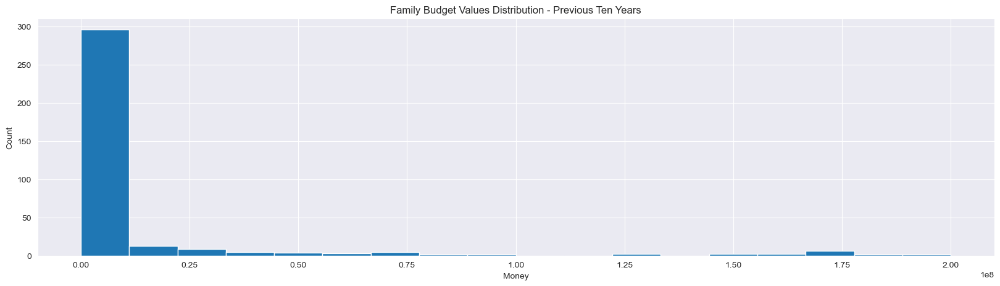

BUDGET Median = 800000.0, Mean = 12265247.353276353
count    3.510000e+02
mean     1.226525e+07
std      3.450588e+07
min      1.000000e+00
25%      2.500000e+04
50%      8.000000e+05
75%      5.000000e+06
max      2.000000e+08
Name: budget, dtype: float64


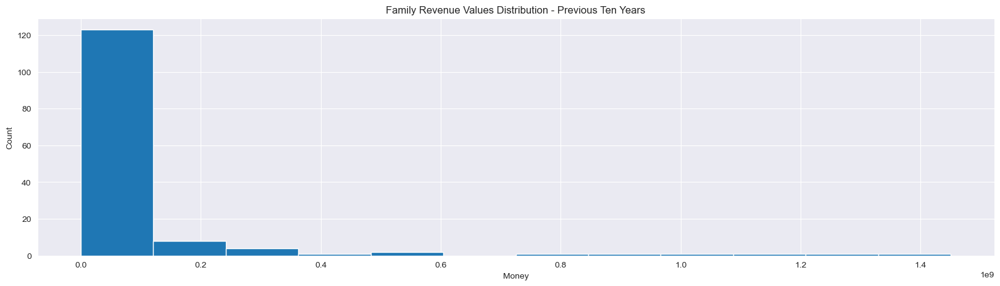

REVENUE Median = 3300000.0, Mean = 84752809.375
count    1.440000e+02
mean     8.475281e+07
std      2.382069e+08
min      7.800000e+01
25%      3.960872e+05
50%      3.300000e+06
75%      3.602480e+07
max      1.450027e+09
Name: revenue, dtype: float64


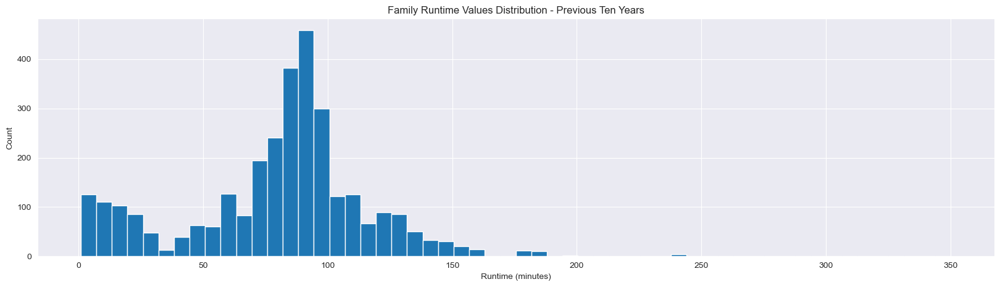

RUNTIME Median = 86.0, Mean = 80.27775989700676
count    3107.000000
mean       80.277760
std        36.968466
min         1.000000
25%        64.000000
50%        86.000000
75%        99.000000
max       350.000000
Name: runtime, dtype: float64


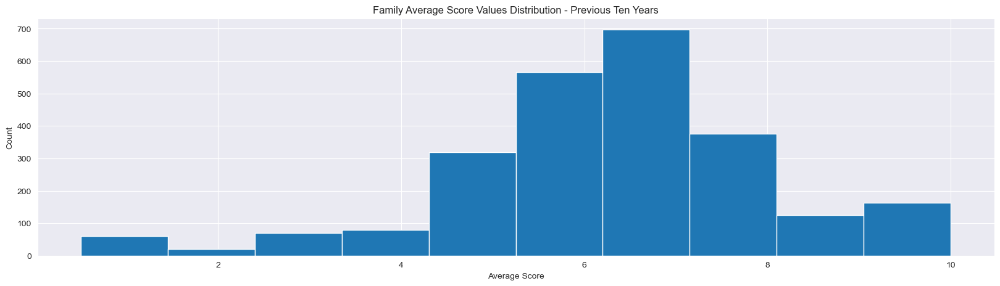

SCORE Median = 6.4, Mean = 6.324854773462767
count    2472.000000
mean        6.324855
std         1.790094
min         0.500000
25%         5.400000
50%         6.400000
75%         7.200000
max        10.000000
Name: vote_average, dtype: float64


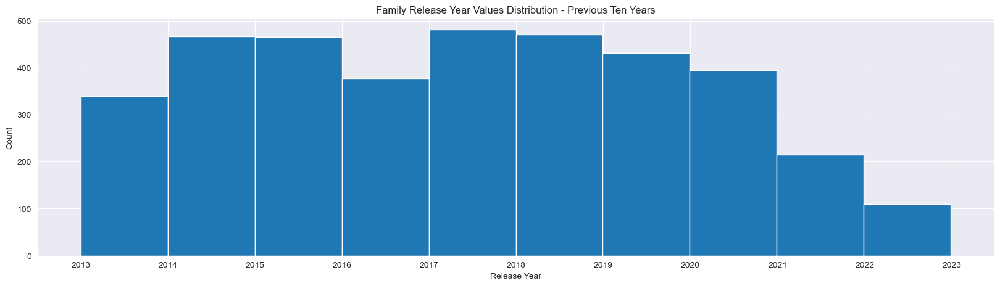

RELEASE DATE Median = 2017-06-26 00:00:00, Mean = 2017-07-04 06:51:22.421979136
count                             3749
mean     2017-07-04 06:51:22.421979136
min                2013-01-01 00:00:00
25%                2015-04-25 00:00:00
50%                2017-06-26 00:00:00
75%                2019-08-01 00:00:00
max                2022-12-28 00:00:00
Name: release_date, dtype: object


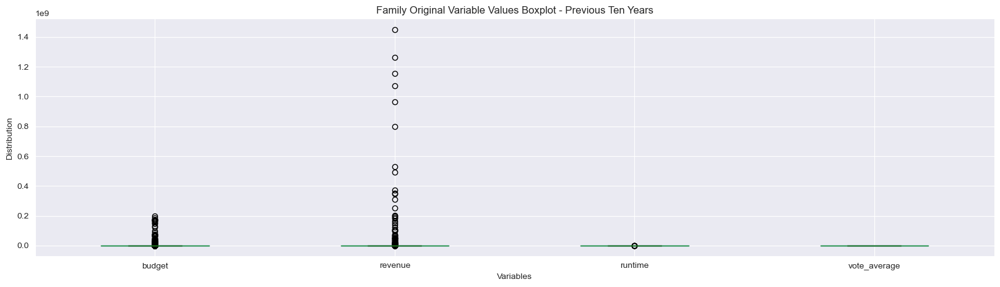

In [40]:
#Show distribution of previous 10 Year Family variable values
n_data = len(fam10b_movies.budget)
n_bins = np.sqrt(n_data)
n_bins = int(n_bins)
_ =plt.hist(fam10b_movies.budget, bins=n_bins)
plt.title('Family Budget Values Distribution - Previous Ten Years')
plt.xlabel('Money')
plt.ylabel('Count')
plt.show()

#Calculate median and mean values for variables
print(f"BUDGET Median = {fam10b_movies.budget.median()}, Mean = {fam10b_movies.budget.mean()}")
print(fam10b_movies.budget.describe())

n_data = len(fam10r_movies.revenue)
n_bins = np.sqrt(n_data)
n_bins = int(n_bins)
_ =plt.hist(fam10r_movies.revenue, bins=n_bins)
plt.title('Family Revenue Values Distribution - Previous Ten Years')
plt.xlabel('Money')
plt.ylabel('Count')
plt.show()

print(f"REVENUE Median = {fam10r_movies.revenue.median()}, Mean = {fam10r_movies.revenue.mean()}")
print(fam10r_movies.revenue.describe())

n_data = len(fam10d_movies.runtime)
n_bins = np.sqrt(n_data)
n_bins = int(n_bins)
_ =plt.hist(fam10d_movies.runtime, bins=n_bins)
plt.title('Family Runtime Values Distribution - Previous Ten Years')
plt.xlabel('Runtime (minutes)')
plt.ylabel('Count')
plt.show()

print(f"RUNTIME Median = {fam10d_movies.runtime.median()}, Mean = {fam10d_movies.runtime.mean()}")
print(fam10d_movies.runtime.describe())

_ =plt.hist(fam10v_movies.vote_average)
plt.title('Family Average Score Values Distribution - Previous Ten Years')
plt.xlabel('Average Score')
plt.ylabel('Count')
plt.show()

print(f"SCORE Median = {fam10v_movies.vote_average.median()}, Mean = {fam10v_movies.vote_average.mean()}")
print(fam10v_movies.vote_average.describe())

_ =plt.hist(fam10_movies.release_date)
plt.title('Family Release Year Values Distribution - Previous Ten Years')
plt.xlabel('Release Year')
plt.ylabel('Count')
plt.show()

print(f"RELEASE DATE Median = {fam10_movies.release_date.median()}, Mean = {fam10_movies.release_date.mean()}")
print(fam10_movies.release_date.describe(datetime_is_numeric=True))

fam10_movies.boxplot(column=['budget', 'revenue', 'runtime', 'vote_average'])
plt.title('Family Original Variable Values Boxplot - Previous Ten Years')
plt.xlabel('Variables')
plt.ylabel('Distribution')
plt.show()

In [41]:
#Drop zero values from 10 Year Fantasy variables. 
#Create a seperate dataframe for each so as not to affect the other variables calculations.
fan10b_movies = fan10_movies[fan10_movies['budget'] !=0]
fan10r_movies = fan10_movies[fan10_movies['revenue'] !=0]
fan10d_movies = fan10_movies[fan10_movies['runtime'] !=0]
fan10v_movies = fan10_movies[fan10_movies['vote_average'] !=0]

#Remove Outliers from 10 Year Fantasy variables and 
Q1 = fan10b_movies.budget.quantile(0.25)
Q3 = fan10b_movies.budget.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(fan10b_movies['budget']>=upper_limit)[0]
lower_array = np.where(fan10b_movies['budget']<=lower_limit)[0]
fan10b_movies['budget'].drop(index=upper_array, inplace=True)
fan10b_movies['budget'].drop(index=lower_array, inplace=True)

Q1 = fan10r_movies.revenue.quantile(0.25)
Q3 = fan10r_movies.revenue.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(fan10r_movies['revenue']>=upper_limit)[0]
lower_array = np.where(fan10r_movies['revenue']<=lower_limit)[0]
fan10r_movies['revenue'].drop(index=upper_array, inplace=True)
fan10r_movies['revenue'].drop(index=lower_array, inplace=True)

Q1 = fan10d_movies.runtime.quantile(0.25)
Q3 = fan10d_movies.runtime.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(fan10d_movies['runtime']>=upper_limit)[0]
lower_array = np.where(fan10d_movies['runtime']<=lower_limit)[0]
fan10d_movies['runtime'].drop(index=upper_array, inplace=True)
fan10d_movies['runtime'].drop(index=lower_array, inplace=True)

Q1 = fan10v_movies.vote_average.quantile(0.25)
Q3 = fan10v_movies.vote_average.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(fan10v_movies['vote_average']>=upper_limit)[0]
lower_array = np.where(fan10v_movies['vote_average']<=lower_limit)[0]
fan10v_movies['vote_average'].drop(index=upper_array, inplace=True)
fan10v_movies['vote_average'].drop(index=lower_array, inplace=True)

KeyError: '[0, 1, 5, 7, 8, 9, 10, 11, 21, 22, 31, 34, 38, 39, 40, 43, 47, 48, 52, 57, 58, 59, 62, 64, 67, 68, 69, 71, 81, 87, 95, 127, 129, 155, 156, 157, 158, 159, 229, 270, 314, 341] not found in axis'

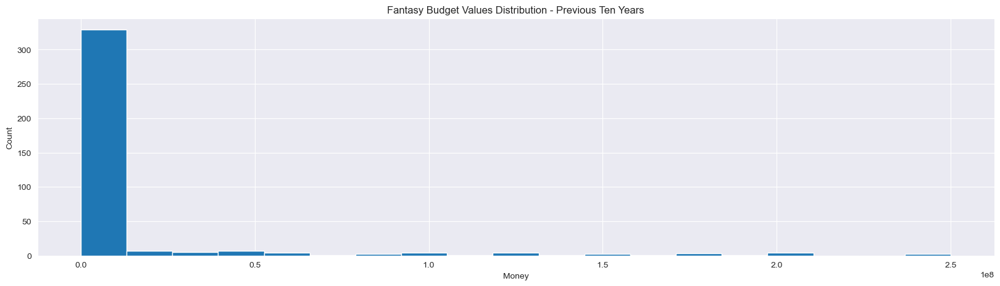

BUDGET Median = 16252.0, Mean = 13149602.706349207
count    3.780000e+02
mean     1.314960e+07
std      4.051624e+07
min      1.000000e+00
25%      5.000000e+02
50%      1.625200e+04
75%      1.150118e+06
max      2.500000e+08
Name: budget, dtype: float64


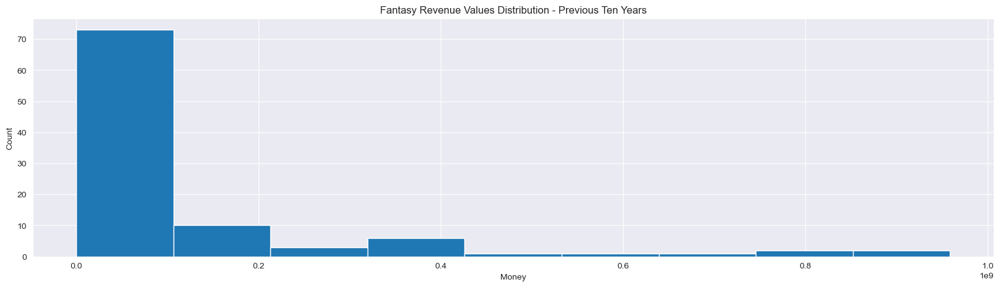

REVENUE Median = 5524381.0, Mean = 107541375.26262626
count    9.900000e+01
mean     1.075414e+08
std      2.082295e+08
min      1.000000e+00
25%      1.638840e+05
50%      5.524381e+06
75%      1.130106e+08
max      9.584000e+08
Name: revenue, dtype: float64


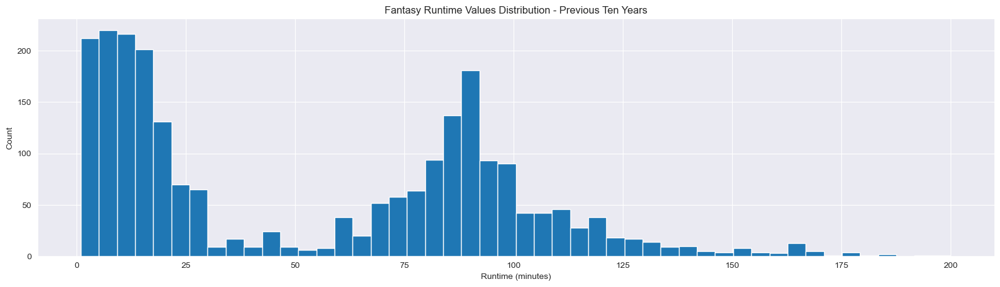

RUNTIME Median = 45.0, Mean = 53.988034188034185
count    2340.000000
mean       53.988034
std        43.822876
min         1.000000
25%        12.000000
50%        45.000000
75%        90.000000
max       200.000000
Name: runtime, dtype: float64


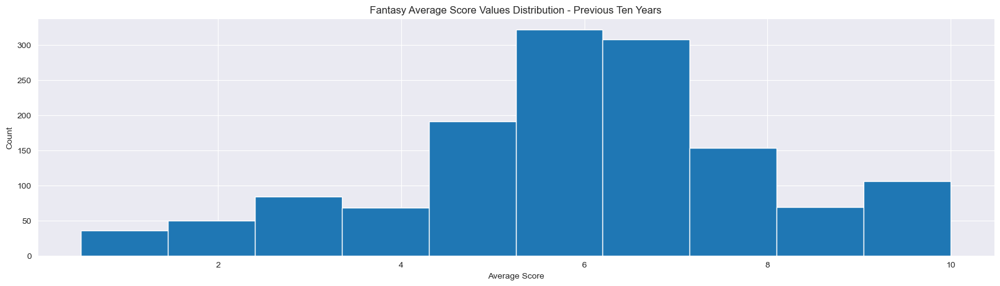

SCORE Median = 6.0, Mean = 6.002533525594811
count    1387.000000
mean        6.002534
std         2.056949
min         0.500000
25%         5.000000
50%         6.000000
75%         7.000000
max        10.000000
Name: vote_average, dtype: float64


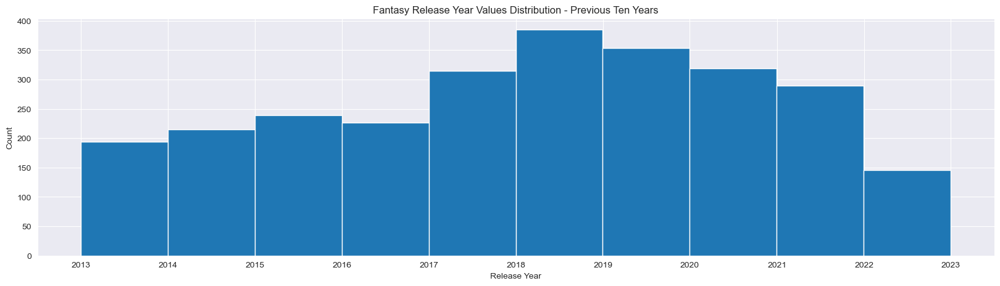

RELEASE DATE Median = 2018-05-26 00:00:00, Mean = 2018-03-17 00:41:52.751677952
count                             2682
mean     2018-03-17 00:41:52.751677952
min                2013-01-01 00:00:00
25%                2016-03-29 00:00:00
50%                2018-05-26 00:00:00
75%                2020-05-01 06:00:00
max                2022-12-31 00:00:00
Name: release_date, dtype: object


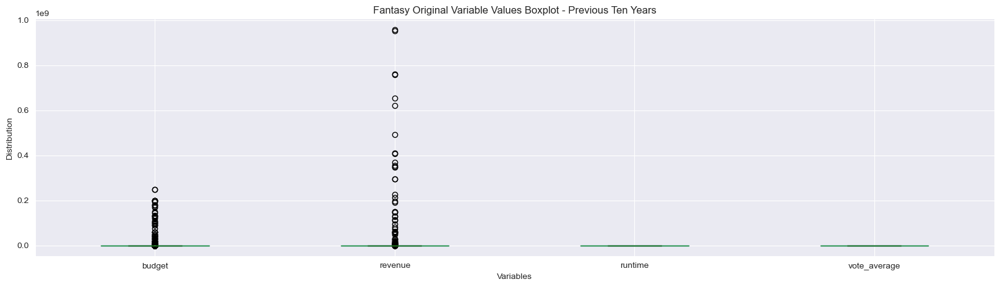

In [42]:
#Show distribution of previous 10 Year Fantasy variable values
n_data = len(fan10b_movies.budget)
n_bins = np.sqrt(n_data)
n_bins = int(n_bins)
_ =plt.hist(fan10b_movies.budget, bins=n_bins)
plt.title('Fantasy Budget Values Distribution - Previous Ten Years')
plt.xlabel('Money')
plt.ylabel('Count')
plt.show()

#Calculate median and mean values for variables
print(f"BUDGET Median = {fan10b_movies.budget.median()}, Mean = {fan10b_movies.budget.mean()}")
print(fan10b_movies.budget.describe())

n_data = len(fan10r_movies.revenue)
n_bins = np.sqrt(n_data)
n_bins = int(n_bins)
_ =plt.hist(fan10r_movies.revenue, bins=n_bins)
plt.title('Fantasy Revenue Values Distribution - Previous Ten Years')
plt.xlabel('Money')
plt.ylabel('Count')
plt.show()

print(f"REVENUE Median = {fan10r_movies.revenue.median()}, Mean = {fan10r_movies.revenue.mean()}")
print(fan10r_movies.revenue.describe())

n_data = len(fan10d_movies.runtime)
n_bins = np.sqrt(n_data)
n_bins = int(n_bins)
_ =plt.hist(fan10d_movies.runtime, bins=n_bins)
plt.title('Fantasy Runtime Values Distribution - Previous Ten Years')
plt.xlabel('Runtime (minutes)')
plt.ylabel('Count')
plt.show()

print(f"RUNTIME Median = {fan10d_movies.runtime.median()}, Mean = {fan10d_movies.runtime.mean()}")
print(fan10d_movies.runtime.describe())

_ =plt.hist(fan10v_movies.vote_average)
plt.title('Fantasy Average Score Values Distribution - Previous Ten Years')
plt.xlabel('Average Score')
plt.ylabel('Count')
plt.show()

print(f"SCORE Median = {fan10v_movies.vote_average.median()}, Mean = {fan10v_movies.vote_average.mean()}")
print(fan10v_movies.vote_average.describe())

_ =plt.hist(fan10_movies.release_date)
plt.title('Fantasy Release Year Values Distribution - Previous Ten Years')
plt.xlabel('Release Year')
plt.ylabel('Count')
plt.show()

print(f"RELEASE DATE Median = {fan10_movies.release_date.median()}, Mean = {fan10_movies.release_date.mean()}")
print(fan10_movies.release_date.describe(datetime_is_numeric=True))

fan10_movies.boxplot(column=['budget', 'revenue', 'runtime', 'vote_average'])
plt.title('Fantasy Original Variable Values Boxplot - Previous Ten Years')
plt.xlabel('Variables')
plt.ylabel('Distribution')
plt.show()

In [43]:
#Drop zero values from 10 Year History variables. 
#Create a seperate dataframe for each so as not to affect the other variables calculations.
his10b_movies = his10_movies[his10_movies['budget'] !=0]
his10r_movies = his10_movies[his10_movies['revenue'] !=0]
his10d_movies = his10_movies[his10_movies['runtime'] !=0]
his10v_movies = his10_movies[his10_movies['vote_average'] !=0]

#Remove Outliers from 10 Year History variables and 
Q1 = his10b_movies.budget.quantile(0.25)
Q3 = his10b_movies.budget.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(his10b_movies['budget']>=upper_limit)[0]
lower_array = np.where(his10b_movies['budget']<=lower_limit)[0]
his10b_movies['budget'].drop(index=upper_array, inplace=True)
his10b_movies['budget'].drop(index=lower_array, inplace=True)

Q1 = his10r_movies.revenue.quantile(0.25)
Q3 = his10r_movies.revenue.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(his10r_movies['revenue']>=upper_limit)[0]
lower_array = np.where(his10r_movies['revenue']<=lower_limit)[0]
his10r_movies['revenue'].drop(index=upper_array, inplace=True)
his10r_movies['revenue'].drop(index=lower_array, inplace=True)

Q1 = his10d_movies.runtime.quantile(0.25)
Q3 = his10d_movies.runtime.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(his10d_movies['runtime']>=upper_limit)[0]
lower_array = np.where(his10d_movies['runtime']<=lower_limit)[0]
his10d_movies['runtime'].drop(index=upper_array, inplace=True)
his10d_movies['runtime'].drop(index=lower_array, inplace=True)

Q1 = his10v_movies.vote_average.quantile(0.25)
Q3 = his10v_movies.vote_average.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(his10v_movies['vote_average']>=upper_limit)[0]
lower_array = np.where(his10v_movies['vote_average']<=lower_limit)[0]
his10v_movies['vote_average'].drop(index=upper_array, inplace=True)
his10v_movies['vote_average'].drop(index=lower_array, inplace=True)

KeyError: '[7, 8, 9, 12, 13, 14, 15, 66] not found in axis'

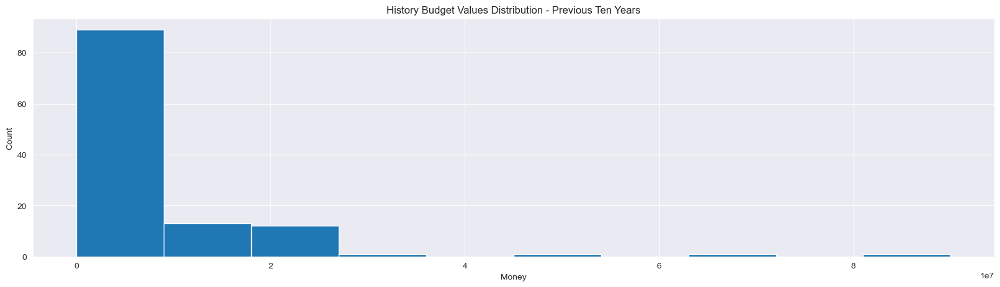

BUDGET Median = 1600000.0, Mean = 6873513.440677966
count    1.180000e+02
mean     6.873513e+06
std      1.309115e+07
min      1.000000e+00
25%      8.500000e+04
50%      1.600000e+06
75%      7.250000e+06
max      9.000000e+07
Name: budget, dtype: float64


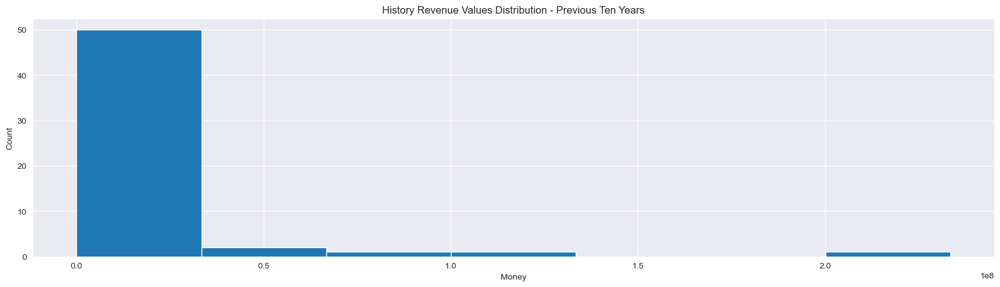

REVENUE Median = 2440478.0, Mean = 13816813.38181818
count    5.500000e+01
mean     1.381681e+07
std      3.565723e+07
min      1.000000e+00
25%      3.958805e+05
50%      2.440478e+06
75%      8.476048e+06
max      2.335557e+08
Name: revenue, dtype: float64


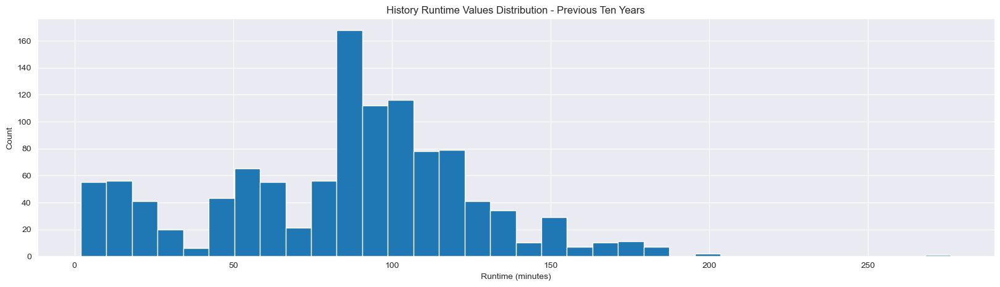

RUNTIME Median = 90.0, Mean = 84.65983971504897
count    1123.000000
mean       84.659840
std        40.547523
min         2.000000
25%        58.000000
50%        90.000000
75%       110.000000
max       276.000000
Name: runtime, dtype: float64


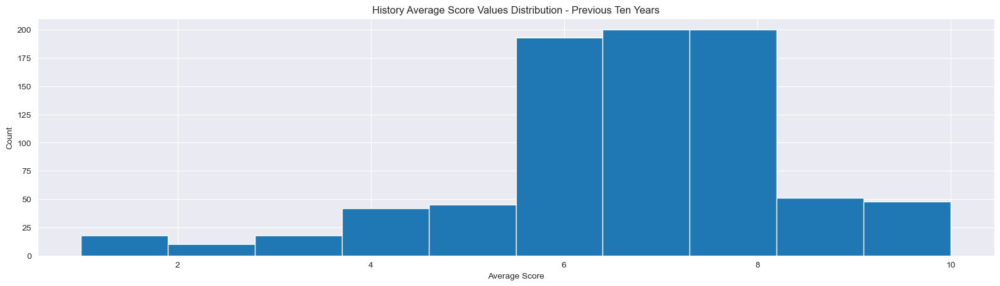

SCORE Median = 6.9, Mean = 6.644413333333335
count    825.000000
mean       6.644413
std        1.736246
min        1.000000
25%        6.000000
50%        6.900000
75%        7.700000
max       10.000000
Name: vote_average, dtype: float64


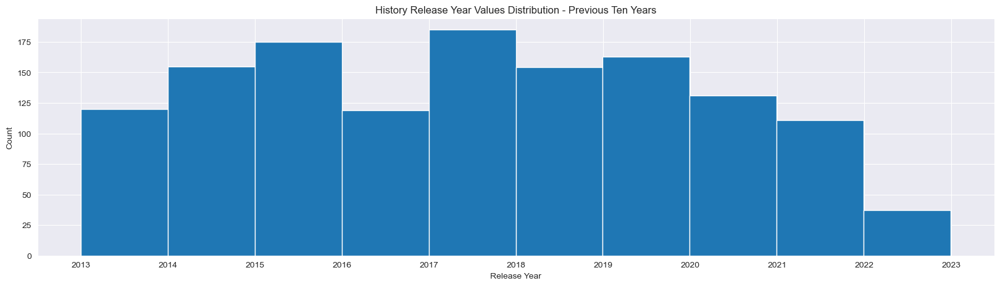

RELEASE DATE Median = 2017-07-19 00:00:00, Mean = 2017-07-27 22:34:40
count                   1350
mean     2017-07-27 22:34:40
min      2013-01-01 00:00:00
25%      2015-05-09 00:00:00
50%      2017-07-19 00:00:00
75%      2019-10-30 12:00:00
max      2022-12-30 00:00:00
Name: release_date, dtype: object


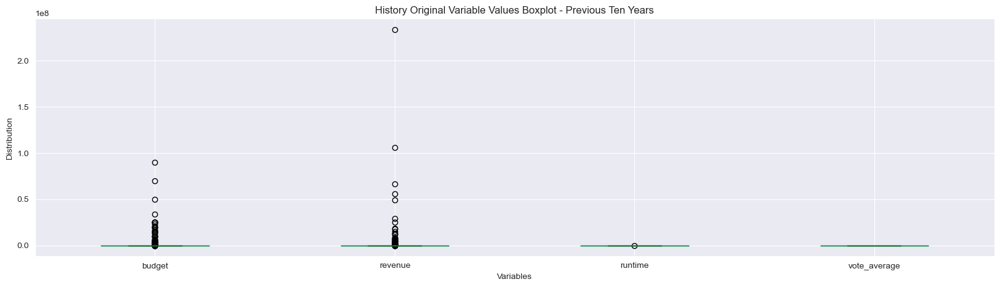

In [44]:
#Show distribution of previous 10 Year History variable values
n_data = len(his10b_movies.budget)
n_bins = np.sqrt(n_data)
n_bins = int(n_bins)
_ =plt.hist(his10b_movies.budget, bins=n_bins)
plt.title('History Budget Values Distribution - Previous Ten Years')
plt.xlabel('Money')
plt.ylabel('Count')
plt.show()

#Calculate median and mean values for variables
print(f"BUDGET Median = {his10b_movies.budget.median()}, Mean = {his10b_movies.budget.mean()}")
print(his10b_movies.budget.describe())

n_data = len(his10r_movies.revenue)
n_bins = np.sqrt(n_data)
n_bins = int(n_bins)
_ =plt.hist(his10r_movies.revenue, bins=n_bins)
plt.title('History Revenue Values Distribution - Previous Ten Years')
plt.xlabel('Money')
plt.ylabel('Count')
plt.show()

print(f"REVENUE Median = {his10r_movies.revenue.median()}, Mean = {his10r_movies.revenue.mean()}")
print(his10r_movies.revenue.describe())

n_data = len(his10d_movies.runtime)
n_bins = np.sqrt(n_data)
n_bins = int(n_bins)
_ =plt.hist(his10d_movies.runtime, bins=n_bins)
plt.title('History Runtime Values Distribution - Previous Ten Years')
plt.xlabel('Runtime (minutes)')
plt.ylabel('Count')
plt.show()

print(f"RUNTIME Median = {his10d_movies.runtime.median()}, Mean = {his10d_movies.runtime.mean()}")
print(his10d_movies.runtime.describe())

_ =plt.hist(his10v_movies.vote_average)
plt.title('History Average Score Values Distribution - Previous Ten Years')
plt.xlabel('Average Score')
plt.ylabel('Count')
plt.show()

print(f"SCORE Median = {his10v_movies.vote_average.median()}, Mean = {his10v_movies.vote_average.mean()}")
print(his10v_movies.vote_average.describe())

_ =plt.hist(his10_movies.release_date)
plt.title('History Release Year Values Distribution - Previous Ten Years')
plt.xlabel('Release Year')
plt.ylabel('Count')
plt.show()

print(f"RELEASE DATE Median = {his10_movies.release_date.median()}, Mean = {his10_movies.release_date.mean()}")
print(his10_movies.release_date.describe(datetime_is_numeric=True))

his10_movies.boxplot(column=['budget', 'revenue', 'runtime', 'vote_average'])
plt.title('History Original Variable Values Boxplot - Previous Ten Years')
plt.xlabel('Variables')
plt.ylabel('Distribution')
plt.show()

In [45]:
#Drop zero values from 10 Year Horror variables. 
#Create a seperate dataframe for each so as not to affect the other variables calculations.
hor10b_movies = hor10_movies[hor10_movies['budget'] !=0]
hor10r_movies = hor10_movies[hor10_movies['revenue'] !=0]
hor10d_movies = hor10_movies[hor10_movies['runtime'] !=0]
hor10v_movies = hor10_movies[hor10_movies['vote_average'] !=0]

#Remove Outliers from 10 Year Horror variables and 
Q1 = hor10b_movies.budget.quantile(0.25)
Q3 = hor10b_movies.budget.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(hor10b_movies['budget']>=upper_limit)[0]
lower_array = np.where(hor10b_movies['budget']<=lower_limit)[0]
hor10b_movies['budget'].drop(index=upper_array, inplace=True)
hor10b_movies['budget'].drop(index=lower_array, inplace=True)

Q1 = hor10r_movies.revenue.quantile(0.25)
Q3 = hor10r_movies.revenue.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(hor10r_movies['revenue']>=upper_limit)[0]
lower_array = np.where(hor10r_movies['revenue']<=lower_limit)[0]
hor10r_movies['revenue'].drop(index=upper_array, inplace=True)
hor10r_movies['revenue'].drop(index=lower_array, inplace=True)

Q1 = hor10d_movies.runtime.quantile(0.25)
Q3 = hor10d_movies.runtime.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(hor10d_movies['runtime']>=upper_limit)[0]
lower_array = np.where(hor10d_movies['runtime']<=lower_limit)[0]
hor10d_movies['runtime'].drop(index=upper_array, inplace=True)
hor10d_movies['runtime'].drop(index=lower_array, inplace=True)

Q1 = hor10v_movies.vote_average.quantile(0.25)
Q3 = hor10v_movies.vote_average.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(hor10v_movies['vote_average']>=upper_limit)[0]
lower_array = np.where(hor10v_movies['vote_average']<=lower_limit)[0]
hor10v_movies['vote_average'].drop(index=upper_array, inplace=True)
hor10v_movies['vote_average'].drop(index=lower_array, inplace=True)

KeyError: '[0, 2, 5, 7, 8, 9, 12, 13, 16, 17, 18, 19, 20, 21, 23, 25, 27, 29, 32, 33, 35, 36, 37, 40, 43, 44, 45, 48, 49, 52, 54, 56, 59, 60, 61, 62, 64, 70, 71, 74, 76, 77, 78, 79, 80, 82, 83, 84, 85, 86, 87, 88, 89, 93, 94, 95, 96, 99, 100, 101, 102, 105, 111, 112, 113, 114, 115, 116, 117, 118, 121, 123, 125, 126, 127, 128, 132, 134, 135, 136, 137, 138, 140, 151, 156, 158, 161, 163, 165, 168, 169, 172, 173, 176, 177, 182, 187, 189, 190, 191, 192, 196, 200, 206, 207, 210, 211, 212, 213, 214, 216, 218, 223, 224, 225, 226, 230, 232, 236, 237, 238, 243, 245, 246, 250, 251, 253, 256, 259, 261, 262, 264, 272, 274, 275, 278, 280, 287, 288, 291, 294, 295, 296, 298, 299, 300, 301, 303, 304, 309, 312, 313, 315, 316, 324, 333, 334, 347, 363, 367, 369, 370, 372, 373, 374, 376, 377, 378, 379, 380, 387, 388, 389, 390, 391, 396, 397, 399, 410, 420, 429, 430, 441, 452, 453, 454, 455, 491, 492, 494, 495, 497, 499, 501, 502, 503, 504, 507, 508, 509, 511, 512, 513, 514, 515, 522, 528, 530, 536, 538, 539, 550, 561, 562, 564, 566, 567, 568, 569, 571, 572, 586, 587, 588, 590, 591, 592, 603, 638, 639, 641, 643, 644, 645, 646, 647, 679, 680, 682, 689, 691, 694, 732, 747, 759, 760, 761, 762, 763, 764, 765, 766, 778, 809, 820, 831, 834, 844, 848, 849, 850, 857, 858, 859, 860, 861, 863, 885, 911, 913, 914, 915, 916, 917, 918, 919, 920, 921, 922, 939, 948, 949, 950, 955, 956, 957, 959, 968, 969, 970, 971, 986, 993, 1015, 1016, 1017, 1018, 1019, 1020, 1021, 1022, 1023, 1024, 1025, 1026, 1056, 1062, 1072, 1082, 1083, 1084, 1085, 1086, 1087, 1088, 1089, 1090, 1093, 1094, 1095, 1096, 1097, 1098, 1099, 1100, 1105, 1111, 1159, 1202, 1217, 1218, 1220, 1222, 1223, 1224, 1242, 1325, 1326, 1327, 1328, 1332, 1438, 1439, 1440, 1441, 1484, 1497, 1555, 1570, 1579, 1580, 1599, 1650, 1660, 1661, 1662, 1672, 1733, 1735, 1736, 1737, 1738, 1739, 1740, 1741, 1742, 1743, 1756, 1761, 1762, 1787, 1843, 1844, 1845, 1846, 1928, 1962, 1977, 1982, 2041, 2057, 2145, 2222, 2223, 2224, 2225, 2246, 2292, 2297, 2307, 2335, 2545, 2556, 2709] not found in axis'

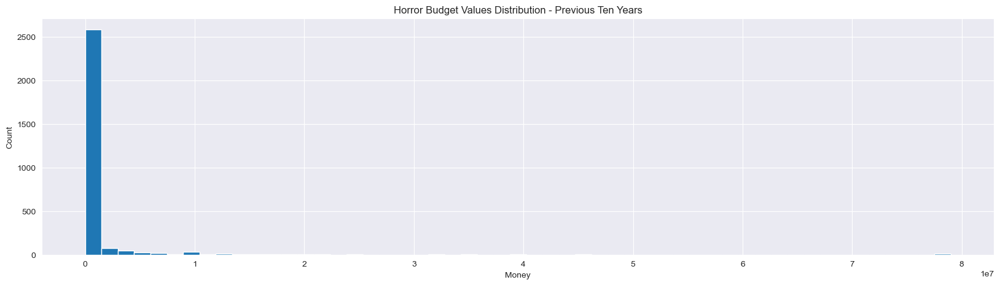

BUDGET Median = 8000.0, Mean = 1307271.4597902098
count    2.860000e+03
mean     1.307271e+06
std      6.678126e+06
min      1.000000e+00
25%      7.600000e+02
50%      8.000000e+03
75%      1.200000e+05
max      7.900000e+07
Name: budget, dtype: float64


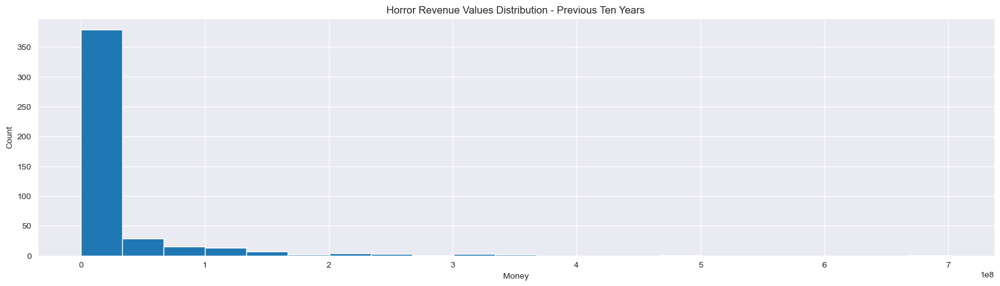

REVENUE Median = 432492.0, Mean = 24348001.343478262
count    4.600000e+02
mean     2.434800e+07
std      6.634703e+07
min      1.000000e+00
25%      1.229775e+04
50%      4.324920e+05
75%      9.587185e+06
max      7.018426e+08
Name: revenue, dtype: float64


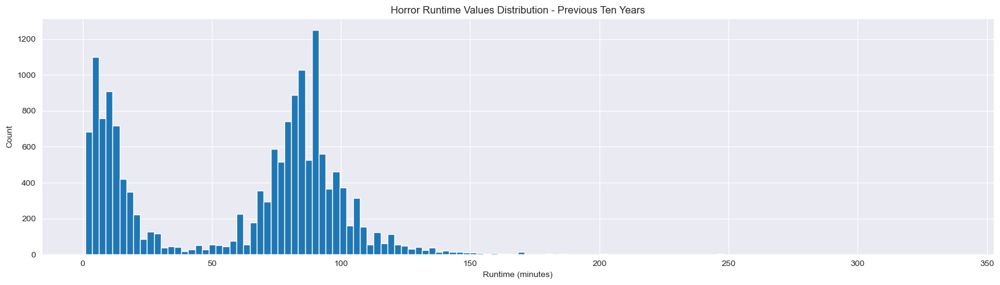

RUNTIME Median = 77.0, Mean = 60.210629796410224
count    15767.000000
mean        60.210630
std         39.589386
min          1.000000
25%         13.000000
50%         77.000000
75%         90.000000
max        336.000000
Name: runtime, dtype: float64


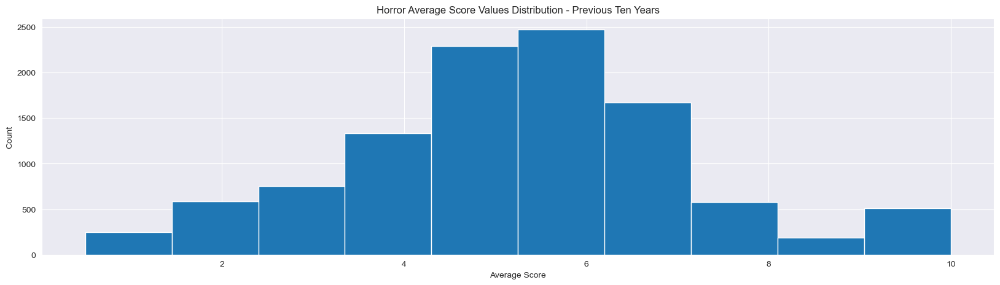

SCORE Median = 5.3, Mean = 5.304427348014326
count    10626.000000
mean         5.304427
std          1.934289
min          0.500000
25%          4.000000
50%          5.300000
75%          6.300000
max         10.000000
Name: vote_average, dtype: float64


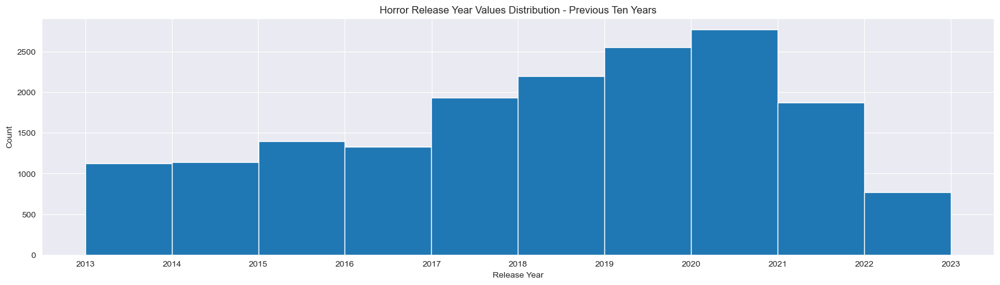

RELEASE DATE Median = 2018-10-21 00:00:00, Mean = 2018-05-30 17:08:32.118906880
count                            17089
mean     2018-05-30 17:08:32.118906880
min                2013-01-01 00:00:00
25%                2016-07-21 00:00:00
50%                2018-10-21 00:00:00
75%                2020-06-15 00:00:00
max                2022-12-31 00:00:00
Name: release_date, dtype: object


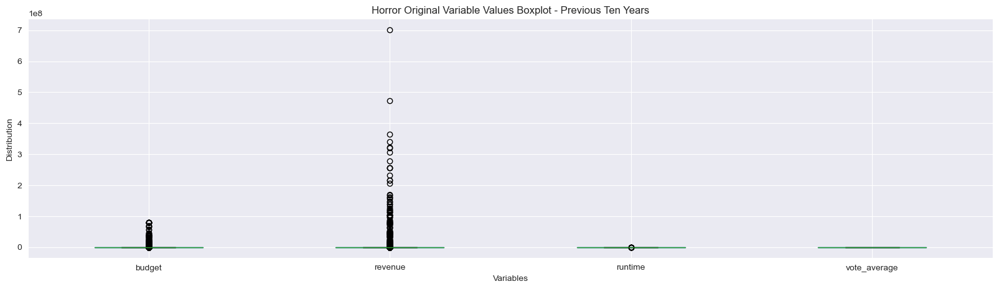

In [46]:
#Show distribution of previous 10 Year Horror variable values
n_data = len(hor10b_movies.budget)
n_bins = np.sqrt(n_data)
n_bins = int(n_bins)
_ =plt.hist(hor10b_movies.budget, bins=n_bins)
plt.title('Horror Budget Values Distribution - Previous Ten Years')
plt.xlabel('Money')
plt.ylabel('Count')
plt.show()

#Calculate median and mean values for variables
print(f"BUDGET Median = {hor10b_movies.budget.median()}, Mean = {hor10b_movies.budget.mean()}")
print(hor10b_movies.budget.describe())

n_data = len(hor10r_movies.revenue)
n_bins = np.sqrt(n_data)
n_bins = int(n_bins)
_ =plt.hist(hor10r_movies.revenue, bins=n_bins)
plt.title('Horror Revenue Values Distribution - Previous Ten Years')
plt.xlabel('Money')
plt.ylabel('Count')
plt.show()

print(f"REVENUE Median = {hor10r_movies.revenue.median()}, Mean = {hor10r_movies.revenue.mean()}")
print(hor10r_movies.revenue.describe())

n_data = len(hor10d_movies.runtime)
n_bins = np.sqrt(n_data)
n_bins = int(n_bins)
_ =plt.hist(hor10d_movies.runtime, bins=n_bins)
plt.title('Horror Runtime Values Distribution - Previous Ten Years')
plt.xlabel('Runtime (minutes)')
plt.ylabel('Count')
plt.show()

print(f"RUNTIME Median = {hor10d_movies.runtime.median()}, Mean = {hor10d_movies.runtime.mean()}")
print(hor10d_movies.runtime.describe())

_ =plt.hist(hor10v_movies.vote_average)
plt.title('Horror Average Score Values Distribution - Previous Ten Years')
plt.xlabel('Average Score')
plt.ylabel('Count')
plt.show()

print(f"SCORE Median = {hor10v_movies.vote_average.median()}, Mean = {hor10v_movies.vote_average.mean()}")
print(hor10v_movies.vote_average.describe())

_ =plt.hist(hor10_movies.release_date)
plt.title('Horror Release Year Values Distribution - Previous Ten Years')
plt.xlabel('Release Year')
plt.ylabel('Count')
plt.show()

print(f"RELEASE DATE Median = {hor10_movies.release_date.median()}, Mean = {hor10_movies.release_date.mean()}")
print(hor10_movies.release_date.describe(datetime_is_numeric=True))

hor10_movies.boxplot(column=['budget', 'revenue', 'runtime', 'vote_average'])
plt.title('Horror Original Variable Values Boxplot - Previous Ten Years')
plt.xlabel('Variables')
plt.ylabel('Distribution')
plt.show()

In [47]:
#Drop zero values from 10 Year Musical variables. 
#Create a seperate dataframe for each so as not to affect the other variables calculations.
mus10b_movies = mus10_movies[mus10_movies['budget'] !=0]
mus10r_movies = mus10_movies[mus10_movies['revenue'] !=0]
mus10d_movies = mus10_movies[mus10_movies['runtime'] !=0]
mus10v_movies = mus10_movies[mus10_movies['vote_average'] !=0]

#Remove Outliers from 10 Year Musical variables and 
Q1 = mus10b_movies.budget.quantile(0.25)
Q3 = mus10b_movies.budget.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(mus10b_movies['budget']>=upper_limit)[0]
lower_array = np.where(mus10b_movies['budget']<=lower_limit)[0]
mus10b_movies['budget'].drop(index=upper_array, inplace=True)
mus10b_movies['budget'].drop(index=lower_array, inplace=True)

Q1 = mus10r_movies.revenue.quantile(0.25)
Q3 = mus10r_movies.revenue.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(mus10r_movies['revenue']>=upper_limit)[0]
lower_array = np.where(mus10r_movies['revenue']<=lower_limit)[0]
mus10r_movies['revenue'].drop(index=upper_array, inplace=True)
mus10r_movies['revenue'].drop(index=lower_array, inplace=True)

Q1 = mus10d_movies.runtime.quantile(0.25)
Q3 = mus10d_movies.runtime.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(mus10d_movies['runtime']>=upper_limit)[0]
lower_array = np.where(mus10d_movies['runtime']<=lower_limit)[0]
mus10d_movies['runtime'].drop(index=upper_array, inplace=True)
mus10d_movies['runtime'].drop(index=lower_array, inplace=True)

Q1 = mus10v_movies.vote_average.quantile(0.25)
Q3 = mus10v_movies.vote_average.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(mus10v_movies['vote_average']>=upper_limit)[0]
lower_array = np.where(mus10v_movies['vote_average']<=lower_limit)[0]
mus10v_movies['vote_average'].drop(index=upper_array, inplace=True)
mus10v_movies['vote_average'].drop(index=lower_array, inplace=True)

KeyError: '[0, 1, 2, 3, 4, 5, 6, 7, 8, 14, 15, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 35, 41, 65, 66, 80, 81, 82, 83, 85, 104, 155, 156, 175, 185, 224, 230] not found in axis'

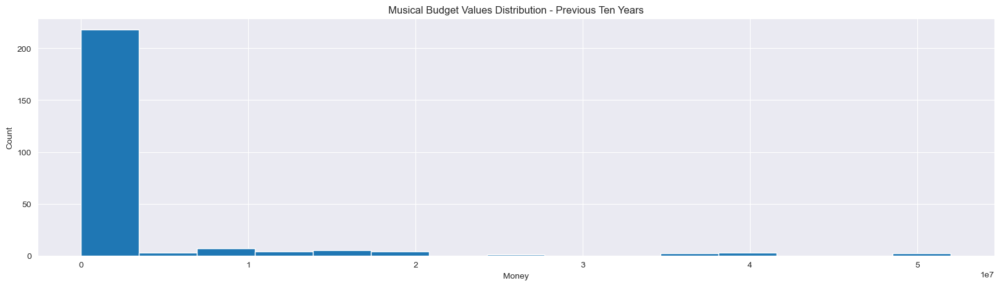

BUDGET Median = 25000.0, Mean = 2599894.6666666665
count    2.490000e+02
mean     2.599895e+06
std      7.901698e+06
min      5.000000e+00
25%      1.000000e+03
50%      2.500000e+04
75%      5.600000e+05
max      5.200000e+07
Name: budget, dtype: float64


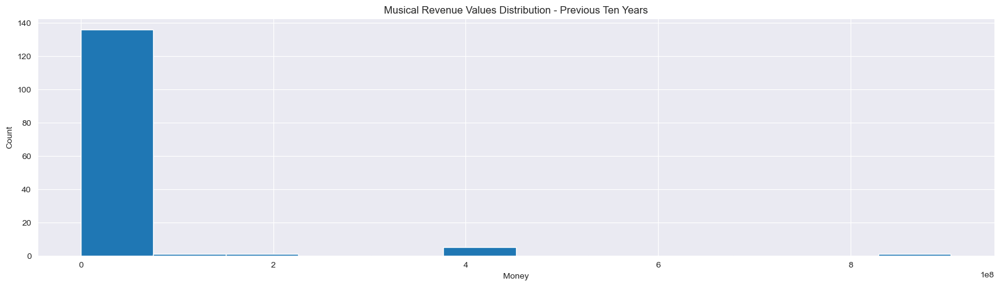

REVENUE Median = 1226552.0, Mean = 31031398.597222224
count    1.440000e+02
mean     3.103140e+07
std      1.081679e+08
min      2.300000e+01
25%      1.733182e+05
50%      1.226552e+06
75%      1.090963e+07
max      9.039929e+08
Name: revenue, dtype: float64


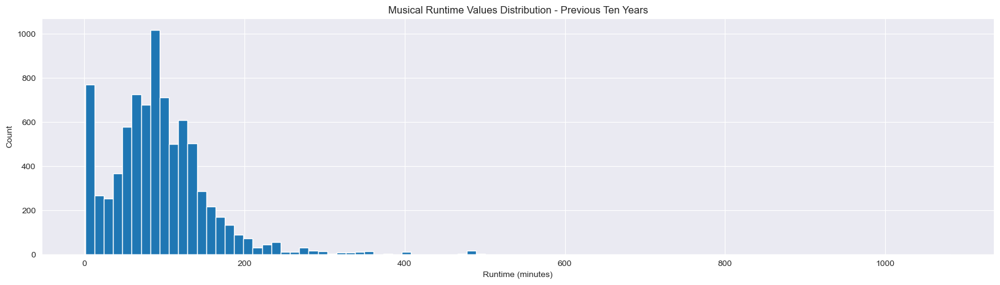

RUNTIME Median = 89.0, Mean = 94.12546839115194
count    8273.000000
mean       94.125468
std        65.248796
min         1.000000
25%        57.000000
50%        89.000000
75%       121.000000
max      1082.000000
Name: runtime, dtype: float64


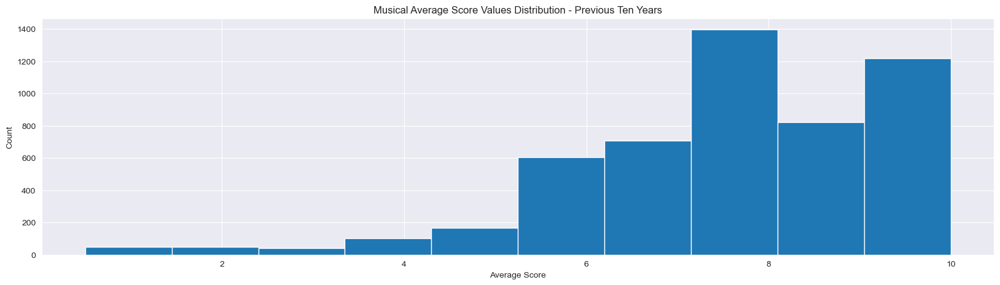

SCORE Median = 8.0, Mean = 7.748159068865174
count    5155.000000
mean        7.748159
std         1.827050
min         0.500000
25%         6.800000
50%         8.000000
75%         9.000000
max        10.000000
Name: vote_average, dtype: float64


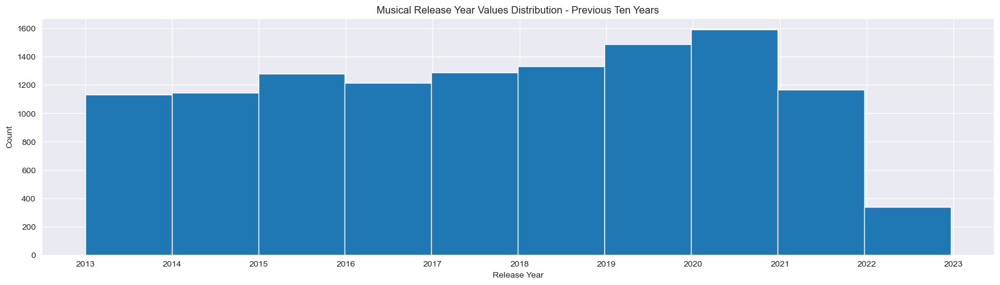

RELEASE DATE Median = 2017-12-07 00:00:00, Mean = 2017-10-25 02:03:00.977035520
count                            11975
mean     2017-10-25 02:03:00.977035520
min                2013-01-01 00:00:00
25%                2015-07-30 00:00:00
50%                2017-12-07 00:00:00
75%                2020-02-03 12:00:00
max                2022-12-20 00:00:00
Name: release_date, dtype: object


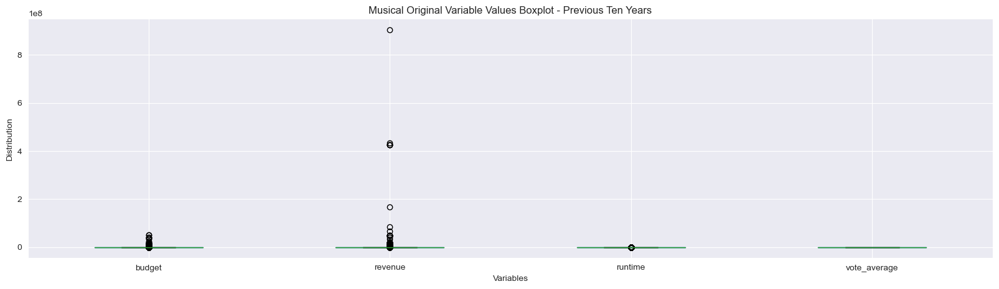

In [48]:
#Show distribution of previous 10 Year Musical variable values
n_data = len(mus10b_movies.budget)
n_bins = np.sqrt(n_data)
n_bins = int(n_bins)
_ =plt.hist(mus10b_movies.budget, bins=n_bins)
plt.title('Musical Budget Values Distribution - Previous Ten Years')
plt.xlabel('Money')
plt.ylabel('Count')
plt.show()

#Calculate median and mean values for variables
print(f"BUDGET Median = {mus10b_movies.budget.median()}, Mean = {mus10b_movies.budget.mean()}")
print(mus10b_movies.budget.describe())

n_data = len(mus10r_movies.revenue)
n_bins = np.sqrt(n_data)
n_bins = int(n_bins)
_ =plt.hist(mus10r_movies.revenue, bins=n_bins)
plt.title('Musical Revenue Values Distribution - Previous Ten Years')
plt.xlabel('Money')
plt.ylabel('Count')
plt.show()

print(f"REVENUE Median = {mus10r_movies.revenue.median()}, Mean = {mus10r_movies.revenue.mean()}")
print(mus10r_movies.revenue.describe())

n_data = len(mus10d_movies.runtime)
n_bins = np.sqrt(n_data)
n_bins = int(n_bins)
_ =plt.hist(mus10d_movies.runtime, bins=n_bins)
plt.title('Musical Runtime Values Distribution - Previous Ten Years')
plt.xlabel('Runtime (minutes)')
plt.ylabel('Count')
plt.show()

print(f"RUNTIME Median = {mus10d_movies.runtime.median()}, Mean = {mus10d_movies.runtime.mean()}")
print(mus10d_movies.runtime.describe())

_ =plt.hist(mus10v_movies.vote_average)
plt.title('Musical Average Score Values Distribution - Previous Ten Years')
plt.xlabel('Average Score')
plt.ylabel('Count')
plt.show()

print(f"SCORE Median = {mus10v_movies.vote_average.median()}, Mean = {mus10v_movies.vote_average.mean()}")
print(mus10v_movies.vote_average.describe())

_ =plt.hist(mus10_movies.release_date)
plt.title('Musical Release Year Values Distribution - Previous Ten Years')
plt.xlabel('Release Year')
plt.ylabel('Count')
plt.show()

print(f"RELEASE DATE Median = {mus10_movies.release_date.median()}, Mean = {mus10_movies.release_date.mean()}")
print(mus10_movies.release_date.describe(datetime_is_numeric=True))

mus10_movies.boxplot(column=['budget', 'revenue', 'runtime', 'vote_average'])
plt.title('Musical Original Variable Values Boxplot - Previous Ten Years')
plt.xlabel('Variables')
plt.ylabel('Distribution')
plt.show()

In [49]:
#Drop zero values from 10 Year Mystery variables. 
#Create a seperate dataframe for each so as not to affect the other variables calculations.
mys10b_movies = mys10_movies[mys10_movies['budget'] !=0]
mys10r_movies = mys10_movies[mys10_movies['revenue'] !=0]
mys10d_movies = mys10_movies[mys10_movies['runtime'] !=0]
mys10v_movies = mys10_movies[mys10_movies['vote_average'] !=0]

#Remove Outliers from 10 Year Mystery variables and 
Q1 = mys10b_movies.budget.quantile(0.25)
Q3 = mys10b_movies.budget.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(mys10b_movies['budget']>=upper_limit)[0]
lower_array = np.where(mys10b_movies['budget']<=lower_limit)[0]
mys10b_movies['budget'].drop(index=upper_array, inplace=True)
mys10b_movies['budget'].drop(index=lower_array, inplace=True)

Q1 = mys10r_movies.revenue.quantile(0.25)
Q3 = mys10r_movies.revenue.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(mys10r_movies['revenue']>=upper_limit)[0]
lower_array = np.where(mys10r_movies['revenue']<=lower_limit)[0]
mys10r_movies['revenue'].drop(index=upper_array, inplace=True)
mys10r_movies['revenue'].drop(index=lower_array, inplace=True)

Q1 = mys10d_movies.runtime.quantile(0.25)
Q3 = mys10d_movies.runtime.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(mys10d_movies['runtime']>=upper_limit)[0]
lower_array = np.where(mys10d_movies['runtime']<=lower_limit)[0]
mys10d_movies['runtime'].drop(index=upper_array, inplace=True)
mys10d_movies['runtime'].drop(index=lower_array, inplace=True)

Q1 = mys10v_movies.vote_average.quantile(0.25)
Q3 = mys10v_movies.vote_average.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(mys10v_movies['vote_average']>=upper_limit)[0]
lower_array = np.where(mys10v_movies['vote_average']<=lower_limit)[0]
mys10v_movies['vote_average'].drop(index=upper_array, inplace=True)
mys10v_movies['vote_average'].drop(index=lower_array, inplace=True)

KeyError: '[1, 2, 3, 4, 5, 6, 8, 9, 11, 15, 16, 17, 18, 19, 22, 26, 28, 31, 34, 35, 36, 39, 40, 43, 44, 54, 55, 79, 80, 81, 82, 85, 101, 102, 103, 104, 114, 115, 116, 135, 136, 137, 138, 157, 158, 159, 160, 166, 216] not found in axis'

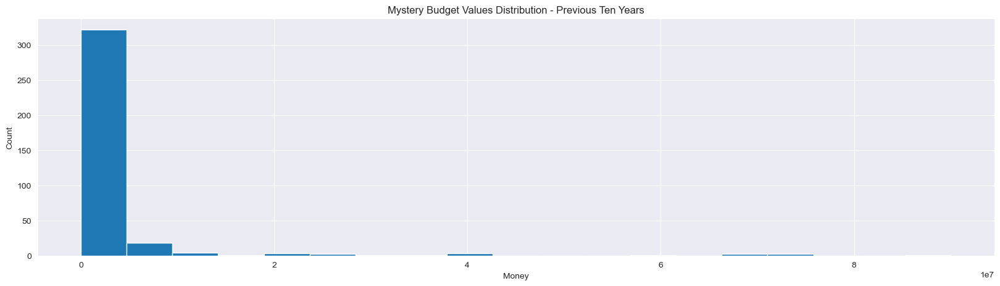

BUDGET Median = 10000.0, Mean = 2749086.4736842103
count    3.610000e+02
mean     2.749086e+06
std      1.064301e+07
min      1.000000e+00
25%      4.650000e+02
50%      1.000000e+04
75%      3.000000e+05
max      9.000000e+07
Name: budget, dtype: float64


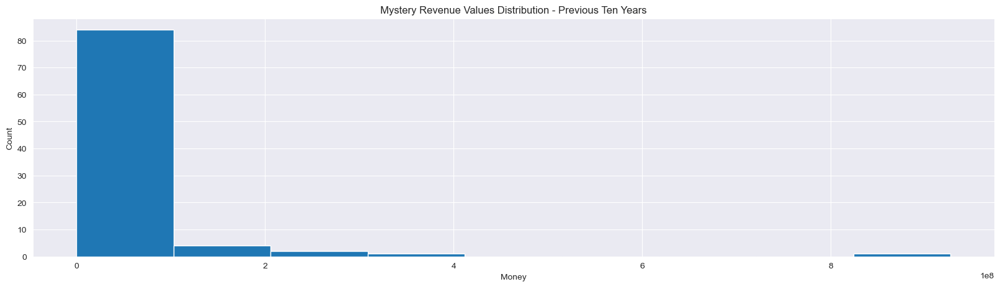

REVENUE Median = 1085332.0, Mean = 32741936.163043477
count    9.200000e+01
mean     3.274194e+07
std      1.111055e+08
min      1.000000e+00
25%      7.831000e+03
50%      1.085332e+06
75%      7.409290e+06
max      9.270000e+08
Name: revenue, dtype: float64


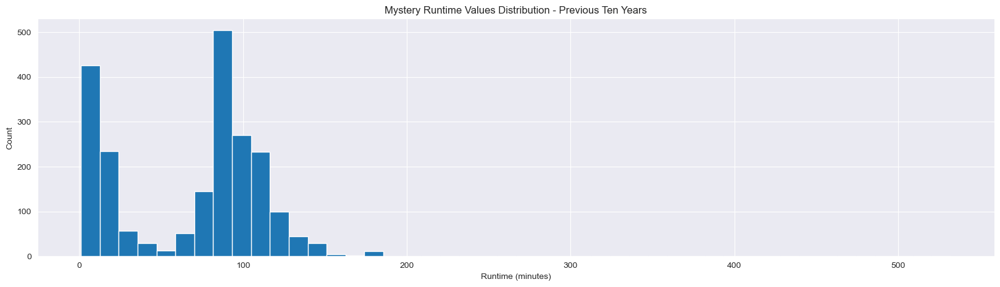

RUNTIME Median = 84.0, Mean = 68.18266110338433
count    2157.000000
mean       68.182661
std        44.388967
min         1.000000
25%        15.000000
50%        84.000000
75%        99.000000
max       532.000000
Name: runtime, dtype: float64


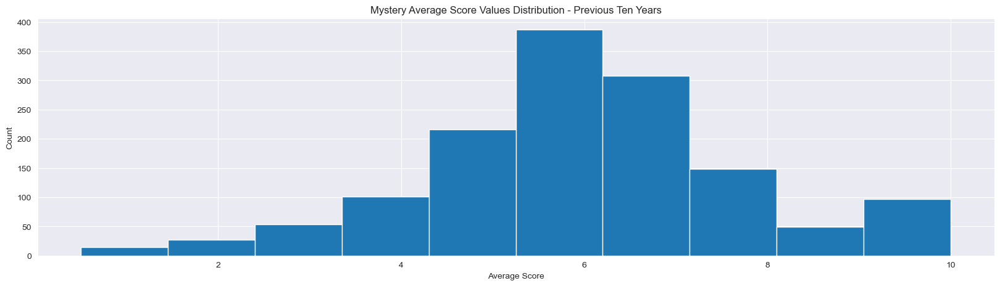

SCORE Median = 6.0, Mean = 6.066215560314055
count    1401.000000
mean        6.066216
std         1.806449
min         0.500000
25%         5.000000
50%         6.000000
75%         7.000000
max        10.000000
Name: vote_average, dtype: float64


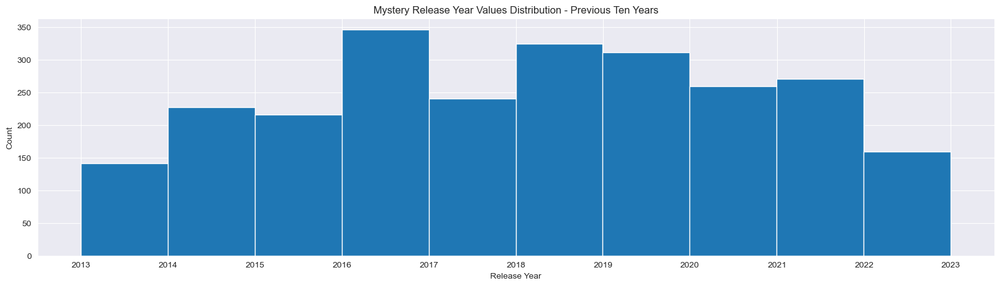

RELEASE DATE Median = 2018-04-13 12:00:00, Mean = 2018-02-20 05:02:33.007217408
count                             2494
mean     2018-02-20 05:02:33.007217408
min                2013-01-01 00:00:00
25%                2016-03-11 00:00:00
50%                2018-04-13 12:00:00
75%                2020-03-07 00:00:00
max                2022-12-31 00:00:00
Name: release_date, dtype: object


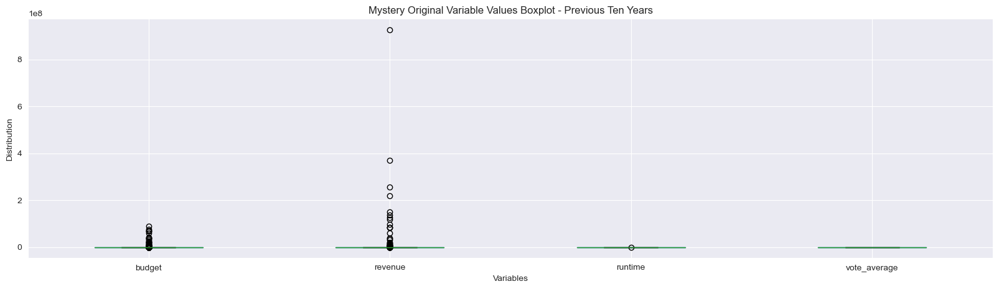

In [50]:
#Show distribution of previous 10 Year Mystery variable values
n_data = len(mys10b_movies.budget)
n_bins = np.sqrt(n_data)
n_bins = int(n_bins)
_ =plt.hist(mys10b_movies.budget, bins=n_bins)
plt.title('Mystery Budget Values Distribution - Previous Ten Years')
plt.xlabel('Money')
plt.ylabel('Count')
plt.show()

#Calculate median and mean values for variables
print(f"BUDGET Median = {mys10b_movies.budget.median()}, Mean = {mys10b_movies.budget.mean()}")
print(mys10b_movies.budget.describe())

n_data = len(mys10r_movies.revenue)
n_bins = np.sqrt(n_data)
n_bins = int(n_bins)
_ =plt.hist(mys10r_movies.revenue, bins=n_bins)
plt.title('Mystery Revenue Values Distribution - Previous Ten Years')
plt.xlabel('Money')
plt.ylabel('Count')
plt.show()

print(f"REVENUE Median = {mys10r_movies.revenue.median()}, Mean = {mys10r_movies.revenue.mean()}")
print(mys10r_movies.revenue.describe())

n_data = len(mys10d_movies.runtime)
n_bins = np.sqrt(n_data)
n_bins = int(n_bins)
_ =plt.hist(mys10d_movies.runtime, bins=n_bins)
plt.title('Mystery Runtime Values Distribution - Previous Ten Years')
plt.xlabel('Runtime (minutes)')
plt.ylabel('Count')
plt.show()

print(f"RUNTIME Median = {mys10d_movies.runtime.median()}, Mean = {mys10d_movies.runtime.mean()}")
print(mys10d_movies.runtime.describe())

_ =plt.hist(mys10v_movies.vote_average)
plt.title('Mystery Average Score Values Distribution - Previous Ten Years')
plt.xlabel('Average Score')
plt.ylabel('Count')
plt.show()

print(f"SCORE Median = {mys10v_movies.vote_average.median()}, Mean = {mys10v_movies.vote_average.mean()}")
print(mys10v_movies.vote_average.describe())

_ =plt.hist(mys10_movies.release_date)
plt.title('Mystery Release Year Values Distribution - Previous Ten Years')
plt.xlabel('Release Year')
plt.ylabel('Count')
plt.show()

print(f"RELEASE DATE Median = {mys10_movies.release_date.median()}, Mean = {mys10_movies.release_date.mean()}")
print(mys10_movies.release_date.describe(datetime_is_numeric=True))

mys10_movies.boxplot(column=['budget', 'revenue', 'runtime', 'vote_average'])
plt.title('Mystery Original Variable Values Boxplot - Previous Ten Years')
plt.xlabel('Variables')
plt.ylabel('Distribution')
plt.show()

In [51]:
#Drop zero values from 10 Year Romance variables. 
#Create a seperate dataframe for each so as not to affect the other variables calculations.
rom10b_movies = rom10_movies[rom10_movies['budget'] !=0]
rom10r_movies = rom10_movies[rom10_movies['revenue'] !=0]
rom10d_movies = rom10_movies[rom10_movies['runtime'] !=0]
rom10v_movies = rom10_movies[rom10_movies['vote_average'] !=0]

#Remove Outliers from 10 Year Romance variables and 
Q1 = rom10b_movies.budget.quantile(0.25)
Q3 = rom10b_movies.budget.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(rom10b_movies['budget']>=upper_limit)[0]
lower_array = np.where(rom10b_movies['budget']<=lower_limit)[0]
rom10b_movies['budget'].drop(index=upper_array, inplace=True)
rom10b_movies['budget'].drop(index=lower_array, inplace=True)

Q1 = rom10r_movies.revenue.quantile(0.25)
Q3 = rom10r_movies.revenue.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(rom10r_movies['revenue']>=upper_limit)[0]
lower_array = np.where(rom10r_movies['revenue']<=lower_limit)[0]
rom10r_movies['revenue'].drop(index=upper_array, inplace=True)
rom10r_movies['revenue'].drop(index=lower_array, inplace=True)

Q1 = rom10d_movies.runtime.quantile(0.25)
Q3 = rom10d_movies.runtime.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(rom10d_movies['runtime']>=upper_limit)[0]
lower_array = np.where(rom10d_movies['runtime']<=lower_limit)[0]
rom10d_movies['runtime'].drop(index=upper_array, inplace=True)
rom10d_movies['runtime'].drop(index=lower_array, inplace=True)

Q1 = rom10v_movies.vote_average.quantile(0.25)
Q3 = rom10v_movies.vote_average.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(rom10v_movies['vote_average']>=upper_limit)[0]
lower_array = np.where(rom10v_movies['vote_average']<=lower_limit)[0]
rom10v_movies['vote_average'].drop(index=upper_array, inplace=True)
rom10v_movies['vote_average'].drop(index=lower_array, inplace=True)

KeyError: '[1, 2, 3, 4, 5, 7, 9, 12, 13, 14, 15, 20, 22, 23, 24, 25, 28, 30, 31, 33, 34, 35, 36, 37, 40, 42, 44, 48, 50, 51, 54, 55, 58, 60, 62, 64, 66, 67, 69, 71, 73, 74, 91, 96, 97, 102, 106, 107, 129, 162, 170, 172, 173, 284, 321, 323, 324] not found in axis'

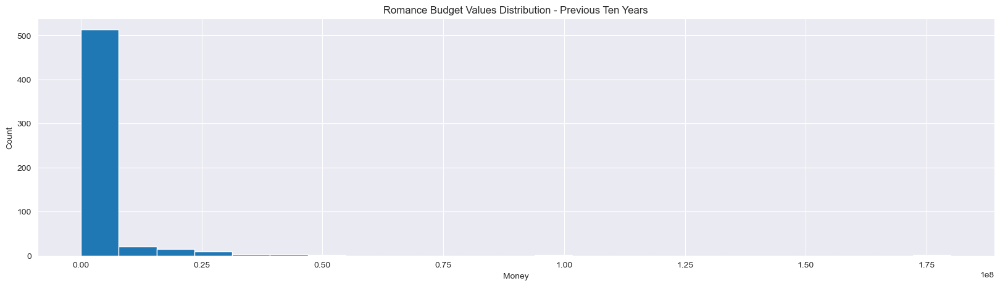

BUDGET Median = 105042.0, Mean = 3216008.0300353356
count    5.660000e+02
mean     3.216008e+06
std      1.053571e+07
min      1.000000e+00
25%      1.000000e+03
50%      1.050420e+05
75%      2.625498e+06
max      1.800000e+08
Name: budget, dtype: float64


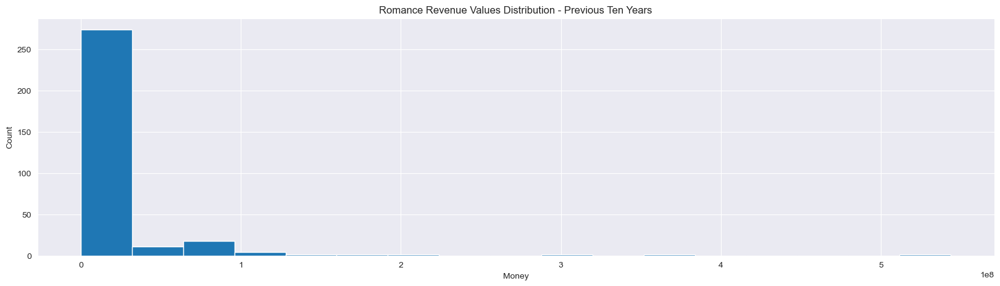

REVENUE Median = 1040000.0, Mean = 16260194.290734824
count    3.130000e+02
mean     1.626019e+07
std      4.830499e+07
min      1.000000e+00
25%      4.411200e+04
50%      1.040000e+06
75%      8.838757e+06
max      5.435144e+08
Name: revenue, dtype: float64


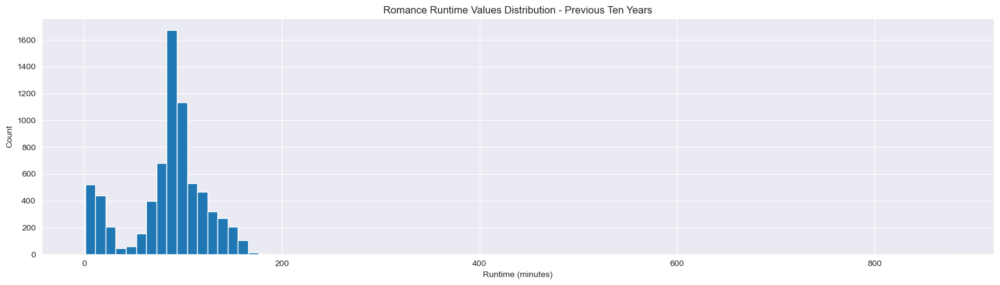

RUNTIME Median = 90.0, Mean = 85.1465636213083
count    7246.000000
mean       85.146564
std        39.619021
min         1.000000
25%        73.000000
50%        90.000000
75%       106.000000
max       877.000000
Name: runtime, dtype: float64


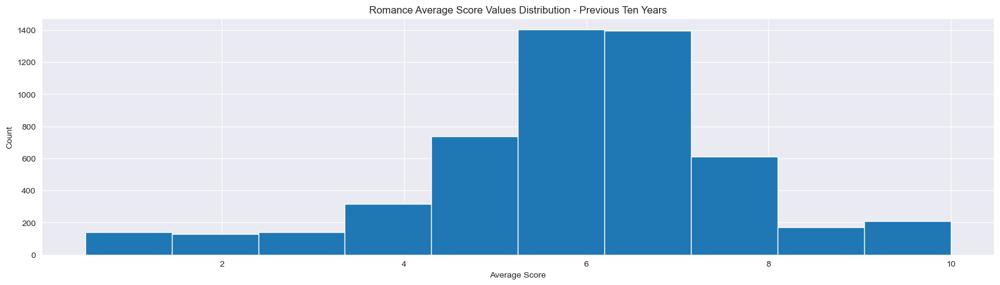

SCORE Median = 6.0, Mean = 5.952642775447939
count    5246.000000
mean        5.952643
std         1.768032
min         0.500000
25%         5.000000
50%         6.000000
75%         7.000000
max        10.000000
Name: vote_average, dtype: float64


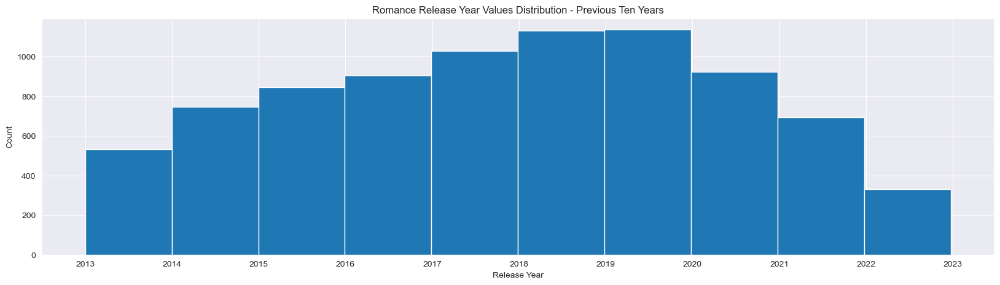

RELEASE DATE Median = 2018-01-15 00:00:00, Mean = 2017-12-04 03:36:55.317709568
count                             8278
mean     2017-12-04 03:36:55.317709568
min                2013-01-01 00:00:00
25%                2015-12-03 06:00:00
50%                2018-01-15 00:00:00
75%                2019-11-29 00:00:00
max                2022-12-23 00:00:00
Name: release_date, dtype: object


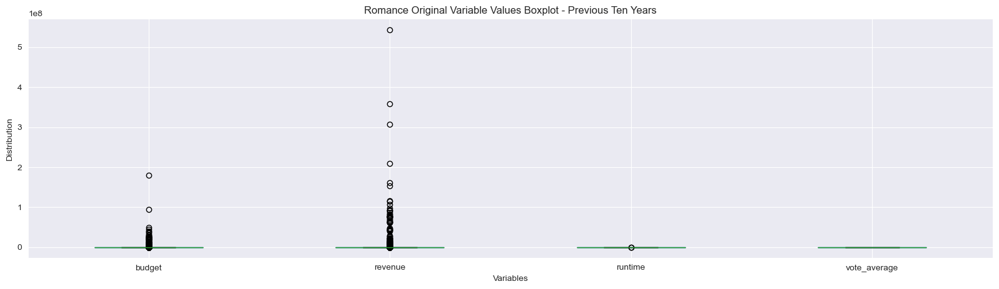

In [52]:
#Show distribution of previous 10 Year Romance variable values
n_data = len(rom10b_movies.budget)
n_bins = np.sqrt(n_data)
n_bins = int(n_bins)
_ =plt.hist(rom10b_movies.budget, bins=n_bins)
plt.title('Romance Budget Values Distribution - Previous Ten Years')
plt.xlabel('Money')
plt.ylabel('Count')
plt.show()

#Calculate median and mean values for variables
print(f"BUDGET Median = {rom10b_movies.budget.median()}, Mean = {rom10b_movies.budget.mean()}")
print(rom10b_movies.budget.describe())

n_data = len(rom10r_movies.revenue)
n_bins = np.sqrt(n_data)
n_bins = int(n_bins)
_ =plt.hist(rom10r_movies.revenue, bins=n_bins)
plt.title('Romance Revenue Values Distribution - Previous Ten Years')
plt.xlabel('Money')
plt.ylabel('Count')
plt.show()

print(f"REVENUE Median = {rom10r_movies.revenue.median()}, Mean = {rom10r_movies.revenue.mean()}")
print(rom10r_movies.revenue.describe())

n_data = len(rom10d_movies.runtime)
n_bins = np.sqrt(n_data)
n_bins = int(n_bins)
_ =plt.hist(rom10d_movies.runtime, bins=n_bins)
plt.title('Romance Runtime Values Distribution - Previous Ten Years')
plt.xlabel('Runtime (minutes)')
plt.ylabel('Count')
plt.show()

print(f"RUNTIME Median = {rom10d_movies.runtime.median()}, Mean = {rom10d_movies.runtime.mean()}")
print(rom10d_movies.runtime.describe())

_ =plt.hist(rom10v_movies.vote_average)
plt.title('Romance Average Score Values Distribution - Previous Ten Years')
plt.xlabel('Average Score')
plt.ylabel('Count')
plt.show()

print(f"SCORE Median = {rom10v_movies.vote_average.median()}, Mean = {rom10v_movies.vote_average.mean()}")
print(rom10v_movies.vote_average.describe())

_ =plt.hist(rom10_movies.release_date)
plt.title('Romance Release Year Values Distribution - Previous Ten Years')
plt.xlabel('Release Year')
plt.ylabel('Count')
plt.show()

print(f"RELEASE DATE Median = {rom10_movies.release_date.median()}, Mean = {rom10_movies.release_date.mean()}")
print(rom10_movies.release_date.describe(datetime_is_numeric=True))

rom10_movies.boxplot(column=['budget', 'revenue', 'runtime', 'vote_average'])
plt.title('Romance Original Variable Values Boxplot - Previous Ten Years')
plt.xlabel('Variables')
plt.ylabel('Distribution')
plt.show()

In [53]:
#Drop zero values from 10 Year Science Fiction variables. 
#Create a seperate dataframe for each so as not to affect the other variables calculations.
sci10b_movies = sci10_movies[sci10_movies['budget'] !=0]
sci10r_movies = sci10_movies[sci10_movies['revenue'] !=0]
sci10d_movies = sci10_movies[sci10_movies['runtime'] !=0]
sci10v_movies = sci10_movies[sci10_movies['vote_average'] !=0]

#Remove Outliers from 10 Year Science Fiction variables and 
Q1 = sci10b_movies.budget.quantile(0.25)
Q3 = sci10b_movies.budget.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(sci10b_movies['budget']>=upper_limit)[0]
lower_array = np.where(sci10b_movies['budget']<=lower_limit)[0]
sci10b_movies['budget'].drop(index=upper_array, inplace=True)
sci10b_movies['budget'].drop(index=lower_array, inplace=True)

Q1 = sci10r_movies.revenue.quantile(0.25)
Q3 = sci10r_movies.revenue.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(sci10r_movies['revenue']>=upper_limit)[0]
lower_array = np.where(sci10r_movies['revenue']<=lower_limit)[0]
sci10r_movies['revenue'].drop(index=upper_array, inplace=True)
sci10r_movies['revenue'].drop(index=lower_array, inplace=True)

Q1 = sci10d_movies.runtime.quantile(0.25)
Q3 = sci10d_movies.runtime.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(sci10d_movies['runtime']>=upper_limit)[0]
lower_array = np.where(sci10d_movies['runtime']<=lower_limit)[0]
sci10d_movies['runtime'].drop(index=upper_array, inplace=True)
sci10d_movies['runtime'].drop(index=lower_array, inplace=True)

Q1 = sci10v_movies.vote_average.quantile(0.25)
Q3 = sci10v_movies.vote_average.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(sci10v_movies['vote_average']>=upper_limit)[0]
lower_array = np.where(sci10v_movies['vote_average']<=lower_limit)[0]
sci10v_movies['vote_average'].drop(index=upper_array, inplace=True)
sci10v_movies['vote_average'].drop(index=lower_array, inplace=True)

KeyError: '[1, 3, 5, 15, 17, 20, 22, 24, 25, 39, 40, 44, 49, 50, 51, 53, 55, 56, 57, 63, 64, 65, 66, 67, 68, 69, 70, 71, 73, 74, 75, 76, 77, 79, 80, 81, 82, 84, 87, 88, 92, 94, 104, 111, 112, 113, 117, 118, 124, 125, 135, 136, 137, 138, 160, 161, 162, 164, 175, 177, 178, 181, 183, 184, 185, 186, 187, 188, 189, 190, 192, 193, 202, 212, 215, 216, 269, 270, 271, 273, 307, 308, 309, 310, 389, 391, 392, 466, 467, 468, 469, 497, 498, 499, 500, 546, 753] not found in axis'

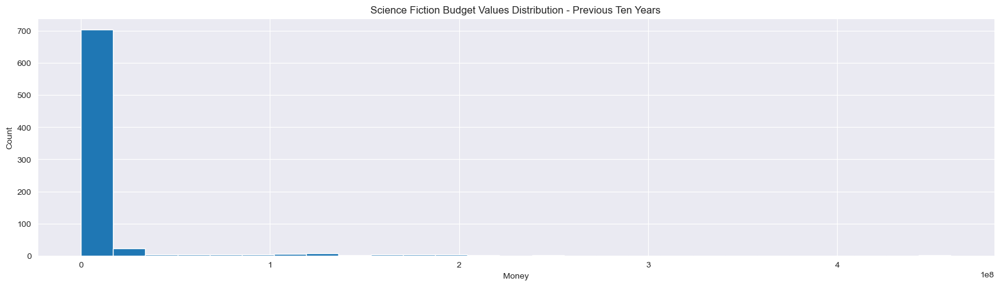

BUDGET Median = 20000.0, Mean = 8245374.31160365
count    7.670000e+02
mean     8.245374e+06
std      3.403339e+07
min      1.000000e+00
25%      2.034500e+03
50%      2.000000e+04
75%      2.500000e+05
max      4.600000e+08
Name: budget, dtype: float64


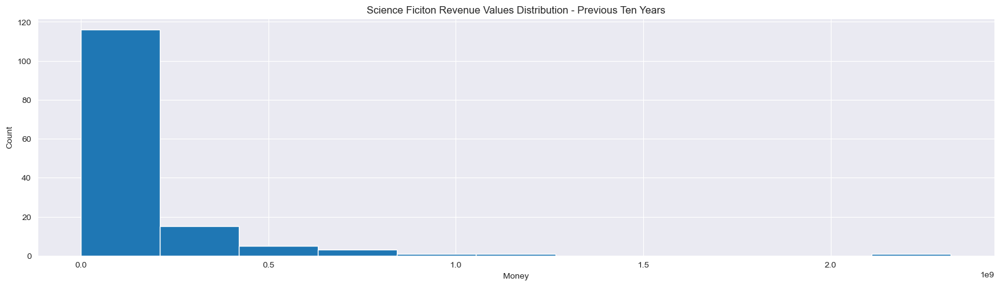

REVENUE Median = 1340000.0, Mean = 110291458.40845071
count    1.420000e+02
mean     1.102915e+08
std      2.692196e+08
min      1.000000e+00
25%      1.225958e+05
50%      1.340000e+06
75%      8.382031e+07
max      2.320250e+09
Name: revenue, dtype: float64


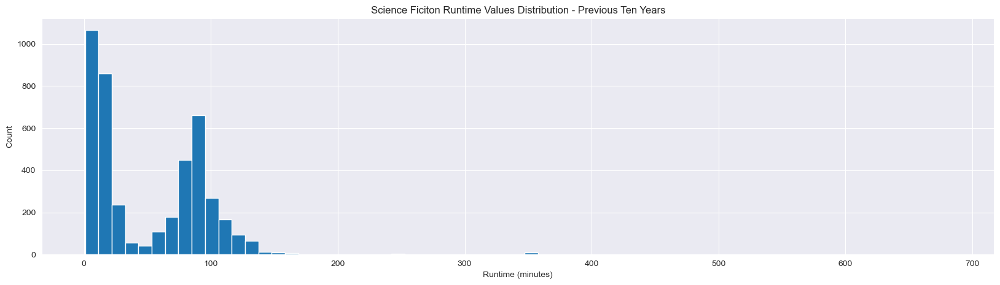

RUNTIME Median = 31.0, Mean = 51.690896423594985
count    4306.000000
mean       51.690896
std        45.601856
min         1.000000
25%        12.000000
50%        31.000000
75%        89.000000
max       683.000000
Name: runtime, dtype: float64


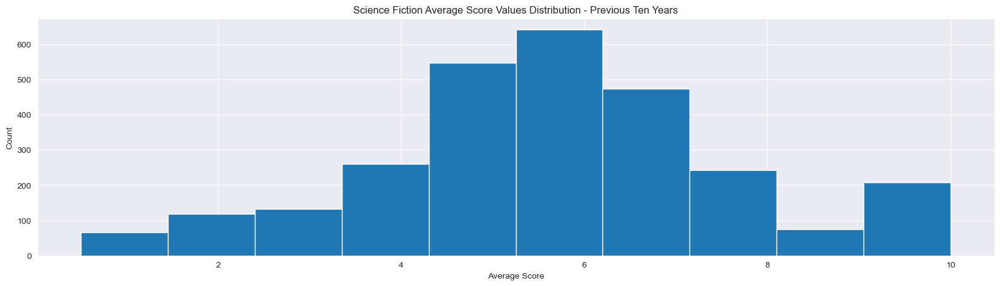

SCORE Median = 5.6274999999999995, Mean = 5.698428312816768
count    2762.000000
mean        5.698428
std         2.047411
min         0.500000
25%         4.500000
50%         5.627500
75%         6.998250
max        10.000000
Name: vote_average, dtype: float64


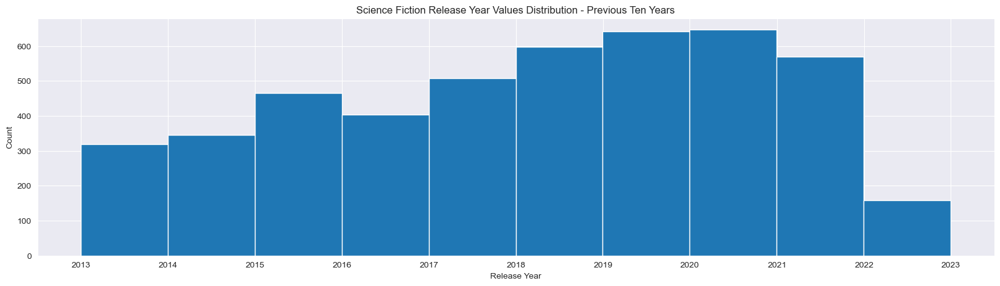

RELEASE DATE Median = 2018-07-05 00:00:00, Mean = 2018-03-19 20:50:19.853889024
count                             4654
mean     2018-03-19 20:50:19.853889024
min                2013-01-01 00:00:00
25%                2016-02-11 00:00:00
50%                2018-07-05 00:00:00
75%                2020-05-18 00:00:00
max                2022-12-31 00:00:00
Name: release_date, dtype: object


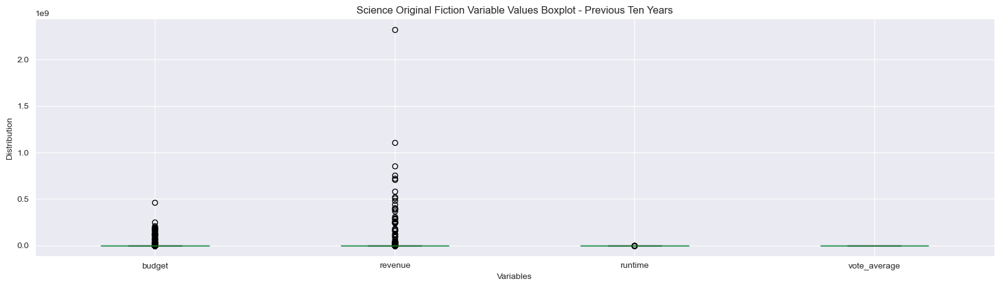

In [54]:
#Show distribution of previous 10 Year Science Fiction variable values
n_data = len(sci10b_movies.budget)
n_bins = np.sqrt(n_data)
n_bins = int(n_bins)
_ =plt.hist(sci10b_movies.budget, bins=n_bins)
plt.title('Science Fiction Budget Values Distribution - Previous Ten Years')
plt.xlabel('Money')
plt.ylabel('Count')
plt.show()

#Calculate median and mean values for variables
print(f"BUDGET Median = {sci10b_movies.budget.median()}, Mean = {sci10b_movies.budget.mean()}")
print(sci10b_movies.budget.describe())

n_data = len(sci10r_movies.revenue)
n_bins = np.sqrt(n_data)
n_bins = int(n_bins)
_ =plt.hist(sci10r_movies.revenue, bins=n_bins)
plt.title('Science Ficiton Revenue Values Distribution - Previous Ten Years')
plt.xlabel('Money')
plt.ylabel('Count')
plt.show()

print(f"REVENUE Median = {sci10r_movies.revenue.median()}, Mean = {sci10r_movies.revenue.mean()}")
print(sci10r_movies.revenue.describe())

n_data = len(sci10d_movies.runtime)
n_bins = np.sqrt(n_data)
n_bins = int(n_bins)
_ =plt.hist(sci10d_movies.runtime, bins=n_bins)
plt.title('Science Ficiton Runtime Values Distribution - Previous Ten Years')
plt.xlabel('Runtime (minutes)')
plt.ylabel('Count')
plt.show()

print(f"RUNTIME Median = {sci10d_movies.runtime.median()}, Mean = {sci10d_movies.runtime.mean()}")
print(sci10d_movies.runtime.describe())

_ =plt.hist(sci10v_movies.vote_average)
plt.title('Science Fiction Average Score Values Distribution - Previous Ten Years')
plt.xlabel('Average Score')
plt.ylabel('Count')
plt.show()

print(f"SCORE Median = {sci10v_movies.vote_average.median()}, Mean = {sci10v_movies.vote_average.mean()}")
print(sci10v_movies.vote_average.describe())

_ =plt.hist(sci10_movies.release_date)
plt.title('Science Fiction Release Year Values Distribution - Previous Ten Years')
plt.xlabel('Release Year')
plt.ylabel('Count')
plt.show()

print(f"RELEASE DATE Median = {sci10_movies.release_date.median()}, Mean = {sci10_movies.release_date.mean()}")
print(sci10_movies.release_date.describe(datetime_is_numeric=True))

sci10_movies.boxplot(column=['budget', 'revenue', 'runtime', 'vote_average'])
plt.title('Science Original Fiction Variable Values Boxplot - Previous Ten Years')
plt.xlabel('Variables')
plt.ylabel('Distribution')
plt.show()

In [55]:
#Drop zero values from 10 Year Thriller variables. 
#Create a seperate dataframe for each so as not to affect the other variables calculations.
thr10b_movies = thr10_movies[thr10_movies['budget'] !=0]
thr10r_movies = thr10_movies[thr10_movies['revenue'] !=0]
thr10d_movies = thr10_movies[thr10_movies['runtime'] !=0]
thr10v_movies = thr10_movies[thr10_movies['vote_average'] !=0]

#Remove Outliers from 10 Year Thriller variables and 
Q1 = thr10b_movies.budget.quantile(0.25)
Q3 = thr10b_movies.budget.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(thr10b_movies['budget']>=upper_limit)[0]
lower_array = np.where(thr10b_movies['budget']<=lower_limit)[0]
thr10b_movies['budget'].drop(index=upper_array, inplace=True)
thr10b_movies['budget'].drop(index=lower_array, inplace=True)

Q1 = thr10r_movies.revenue.quantile(0.25)
Q3 = thr10r_movies.revenue.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(thr10r_movies['revenue']>=upper_limit)[0]
lower_array = np.where(thr10r_movies['revenue']<=lower_limit)[0]
thr10r_movies['revenue'].drop(index=upper_array, inplace=True)
thr10r_movies['revenue'].drop(index=lower_array, inplace=True)

Q1 = thr10d_movies.runtime.quantile(0.25)
Q3 = thr10d_movies.runtime.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(thr10d_movies['runtime']>=upper_limit)[0]
lower_array = np.where(thr10d_movies['runtime']<=lower_limit)[0]
thr10d_movies['runtime'].drop(index=upper_array, inplace=True)
thr10d_movies['runtime'].drop(index=lower_array, inplace=True)

Q1 = thr10v_movies.vote_average.quantile(0.25)
Q3 = thr10v_movies.vote_average.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(thr10v_movies['vote_average']>=upper_limit)[0]
lower_array = np.where(thr10v_movies['vote_average']<=lower_limit)[0]
thr10v_movies['vote_average'].drop(index=upper_array, inplace=True)
thr10v_movies['vote_average'].drop(index=lower_array, inplace=True)

KeyError: '[0, 4, 5, 7, 8, 9, 10, 11, 12, 13, 15, 16, 17, 18, 19, 20, 21, 27, 28, 31, 35, 36, 38, 39, 40, 41, 44, 45, 46, 47, 48, 49, 50, 52, 53, 57, 60, 61, 62, 63, 64, 65, 66, 68, 78, 80, 87, 89, 90, 91, 93, 94, 96, 97, 99, 100, 101, 102, 103, 105, 107, 109, 110, 113, 114, 115, 116, 117, 119, 120, 121, 124, 126, 128, 133, 138, 139, 142, 143, 144, 147, 148, 149, 150, 151, 152, 153, 156, 157, 158, 159, 160, 161, 162, 163, 168, 170, 171, 172, 173, 174, 175, 176, 184, 187, 188, 190, 191, 192, 193, 198, 202, 205, 210, 212, 213, 214, 215, 225, 227, 229, 230, 249, 256, 259, 260, 262, 276, 299, 301, 302, 306, 308, 311, 312, 313, 314, 317, 320, 330, 361, 386, 412, 531, 570, 571, 578, 579, 593, 594, 595, 596, 609, 641, 642, 643, 644, 645, 646, 648, 649, 701, 770, 771, 772, 773, 1125, 1171] not found in axis'

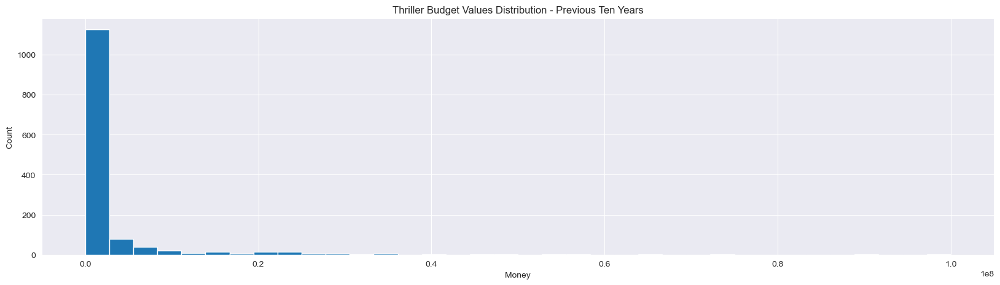

BUDGET Median = 40500.0, Mean = 2571333.0776627217
count    1.352000e+03
mean     2.571333e+06
std      8.203284e+06
min      1.000000e+00
25%      2.000000e+03
50%      4.050000e+04
75%      1.200000e+06
max      1.000000e+08
Name: budget, dtype: float64


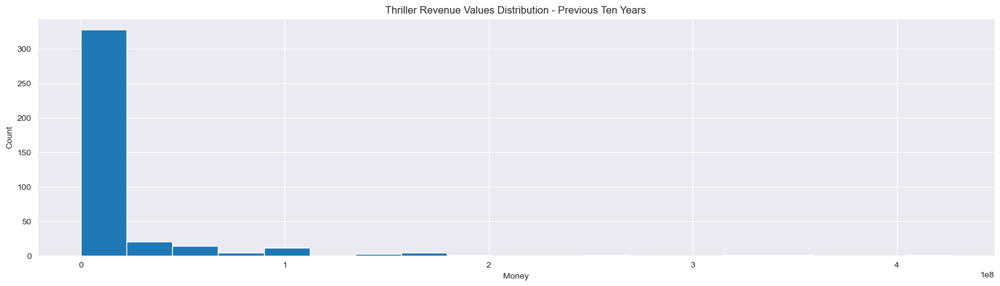

REVENUE Median = 590000.0, Mean = 15634154.68556701
count    3.880000e+02
mean     1.563415e+07
std      4.461421e+07
min      1.000000e+00
25%      1.620900e+04
50%      5.900000e+05
75%      7.322876e+06
max      4.265052e+08
Name: revenue, dtype: float64


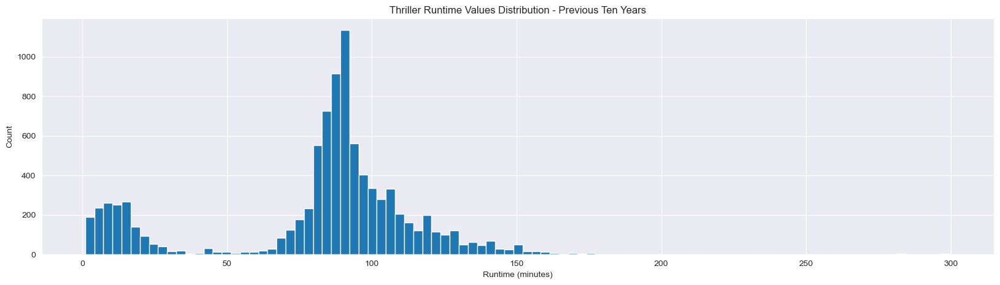

RUNTIME Median = 89.0, Mean = 81.42754504255554
count    9047.000000
mean       81.427545
std        36.337077
min         1.000000
25%        78.000000
50%        89.000000
75%       100.000000
max       300.000000
Name: runtime, dtype: float64


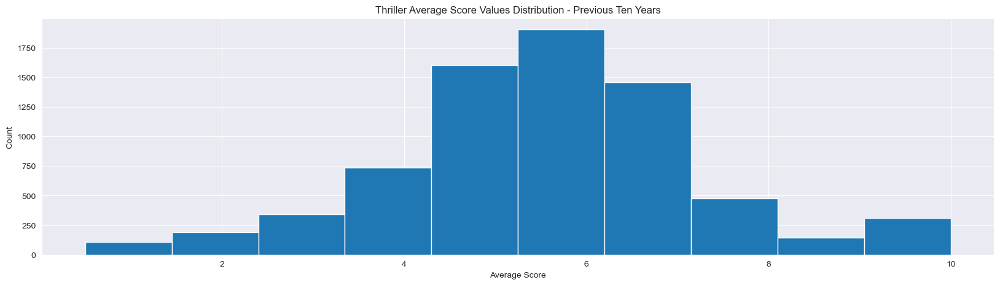

SCORE Median = 5.6, Mean = 5.602768353038205
count    7274.000000
mean        5.602768
std         1.738431
min         0.500000
25%         4.600000
50%         5.600000
75%         6.500000
max        10.000000
Name: vote_average, dtype: float64


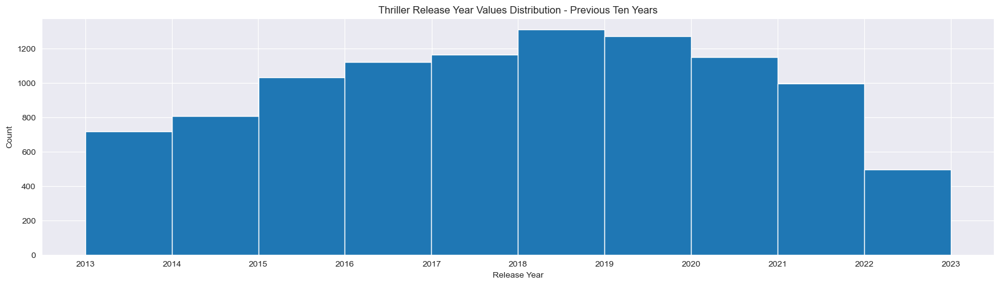

RELEASE DATE Median = 2018-02-24 00:00:00, Mean = 2018-01-14 03:33:48.622540032
count                            10062
mean     2018-01-14 03:33:48.622540032
min                2013-01-01 00:00:00
25%                2015-12-25 00:00:00
50%                2018-02-24 00:00:00
75%                2020-02-07 00:00:00
max                2022-12-31 00:00:00
Name: release_date, dtype: object


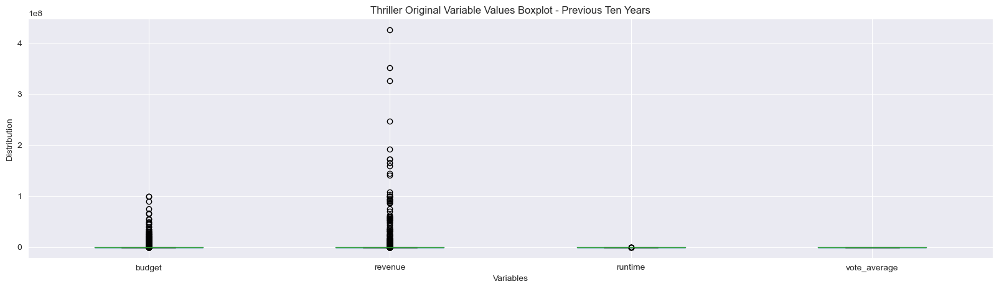

In [56]:
#Show distribution of previous 10 Year Thriller variable values
n_data = len(thr10b_movies.budget)
n_bins = np.sqrt(n_data)
n_bins = int(n_bins)
_ =plt.hist(thr10b_movies.budget, bins=n_bins)
plt.title('Thriller Budget Values Distribution - Previous Ten Years')
plt.xlabel('Money')
plt.ylabel('Count')
plt.show()

#Calculate median and mean values for variables
print(f"BUDGET Median = {thr10b_movies.budget.median()}, Mean = {thr10b_movies.budget.mean()}")
print(thr10b_movies.budget.describe())

n_data = len(thr10r_movies.revenue)
n_bins = np.sqrt(n_data)
n_bins = int(n_bins)
_ =plt.hist(thr10r_movies.revenue, bins=n_bins)
plt.title('Thriller Revenue Values Distribution - Previous Ten Years')
plt.xlabel('Money')
plt.ylabel('Count')
plt.show()

print(f"REVENUE Median = {thr10r_movies.revenue.median()}, Mean = {thr10r_movies.revenue.mean()}")
print(thr10r_movies.revenue.describe())

n_data = len(thr10d_movies.runtime)
n_bins = np.sqrt(n_data)
n_bins = int(n_bins)
_ =plt.hist(thr10d_movies.runtime, bins=n_bins)
plt.title('Thriller Runtime Values Distribution - Previous Ten Years')
plt.xlabel('Runtime (minutes)')
plt.ylabel('Count')
plt.show()

print(f"RUNTIME Median = {thr10d_movies.runtime.median()}, Mean = {thr10d_movies.runtime.mean()}")
print(thr10d_movies.runtime.describe())

_ =plt.hist(thr10v_movies.vote_average)
plt.title('Thriller Average Score Values Distribution - Previous Ten Years')
plt.xlabel('Average Score')
plt.ylabel('Count')
plt.show()

print(f"SCORE Median = {thr10v_movies.vote_average.median()}, Mean = {thr10v_movies.vote_average.mean()}")
print(thr10v_movies.vote_average.describe())

_ =plt.hist(thr10_movies.release_date)
plt.title('Thriller Release Year Values Distribution - Previous Ten Years')
plt.xlabel('Release Year')
plt.ylabel('Count')
plt.show()

print(f"RELEASE DATE Median = {thr10_movies.release_date.median()}, Mean = {thr10_movies.release_date.mean()}")
print(thr10_movies.release_date.describe(datetime_is_numeric=True))

thr10_movies.boxplot(column=['budget', 'revenue', 'runtime', 'vote_average'])
plt.title('Thriller Original Variable Values Boxplot - Previous Ten Years')
plt.xlabel('Variables')
plt.ylabel('Distribution')
plt.show()

In [57]:
#Drop zero values from 10 Year TV Movie variables. 
#Create a seperate dataframe for each so as not to affect the other variables calculations.
tvm10b_movies = tvm10_movies[tvm10_movies['budget'] !=0]
tvm10r_movies = tvm10_movies[tvm10_movies['revenue'] !=0]
tvm10d_movies = tvm10_movies[tvm10_movies['runtime'] !=0]
tvm10v_movies = tvm10_movies[tvm10_movies['vote_average'] !=0]

#Remove Outliers from 10 Year TV Movie variables and 
Q1 = tvm10b_movies.budget.quantile(0.25)
Q3 = tvm10b_movies.budget.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(tvm10b_movies['budget']>=upper_limit)[0]
lower_array = np.where(tvm10b_movies['budget']<=lower_limit)[0]
tvm10b_movies['budget'].drop(index=upper_array, inplace=True)
tvm10b_movies['budget'].drop(index=lower_array, inplace=True)

Q1 = tvm10r_movies.revenue.quantile(0.25)
Q3 = tvm10r_movies.revenue.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(tvm10r_movies['revenue']>=upper_limit)[0]
lower_array = np.where(tvm10r_movies['revenue']<=lower_limit)[0]
tvm10r_movies['revenue'].drop(index=upper_array, inplace=True)
tvm10r_movies['revenue'].drop(index=lower_array, inplace=True)

Q1 = tvm10d_movies.runtime.quantile(0.25)
Q3 = tvm10d_movies.runtime.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(tvm10d_movies['runtime']>=upper_limit)[0]
lower_array = np.where(tvm10d_movies['runtime']<=lower_limit)[0]
tvm10d_movies['runtime'].drop(index=upper_array, inplace=True)
tvm10d_movies['runtime'].drop(index=lower_array, inplace=True)

Q1 = tvm10v_movies.vote_average.quantile(0.25)
Q3 = tvm10v_movies.vote_average.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(tvm10v_movies['vote_average']>=upper_limit)[0]
lower_array = np.where(tvm10v_movies['vote_average']<=lower_limit)[0]
tvm10v_movies['vote_average'].drop(index=upper_array, inplace=True)
tvm10v_movies['vote_average'].drop(index=lower_array, inplace=True)

KeyError: '[0, 1, 17] not found in axis'

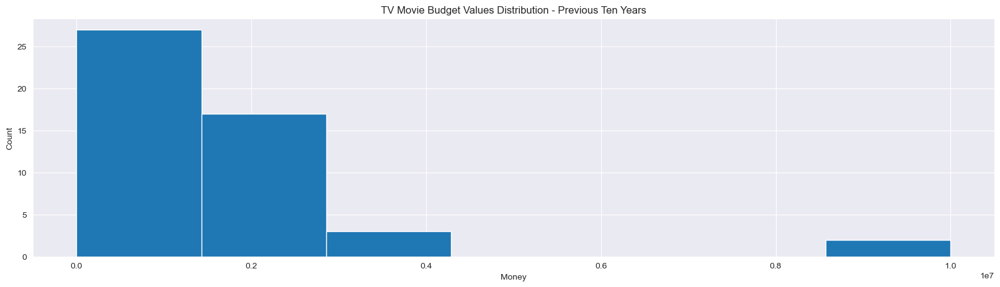

BUDGET Median = 1000000.0, Mean = 1475640.6734693877
count    4.900000e+01
mean     1.475641e+06
std      1.892043e+06
min      1.000000e+00
25%      5.000000e+05
50%      1.000000e+06
75%      1.600000e+06
max      1.000000e+07
Name: budget, dtype: float64


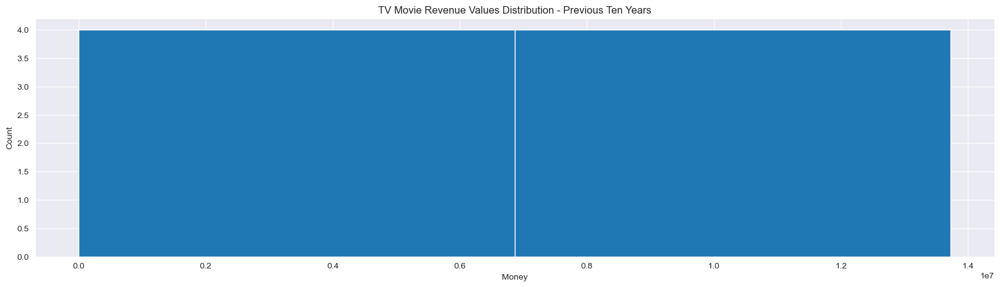

REVENUE Median = 7380556.5, Mean = 7005652.375
count    8.000000e+00
mean     7.005652e+06
std      7.194005e+06
min      6.000000e+00
25%      7.502500e+04
50%      7.380556e+06
75%      1.372800e+07
max      1.372800e+07
Name: revenue, dtype: float64


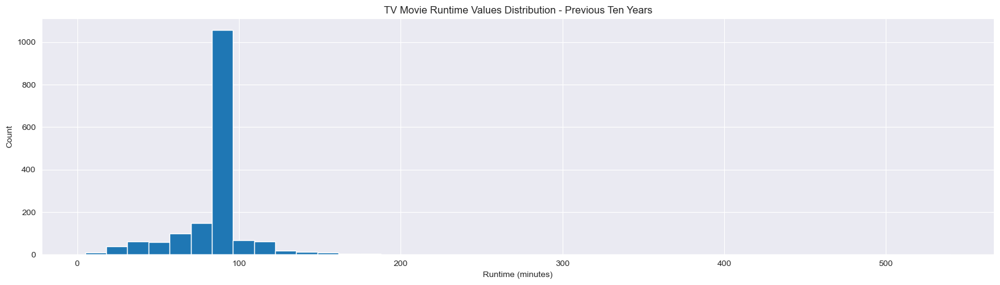

RUNTIME Median = 85.0, Mean = 84.33192261185006
count    1654.000000
mean       84.331923
std        24.617396
min         5.000000
25%        83.000000
50%        85.000000
75%        90.000000
max       540.000000
Name: runtime, dtype: float64


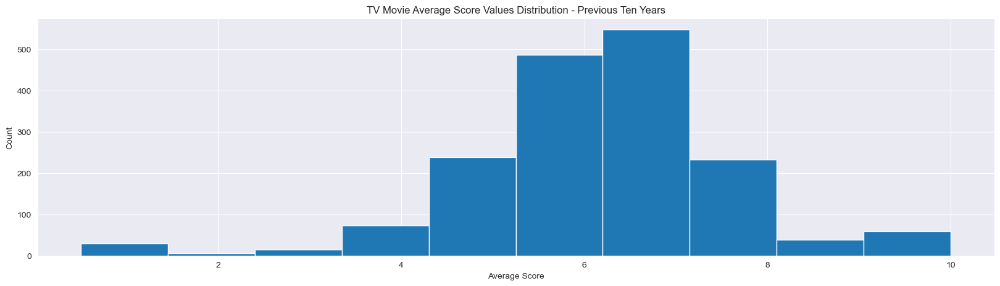

SCORE Median = 6.2, Mean = 6.184203016241305
count    1724.000000
mean        6.184203
std         1.477731
min         0.500000
25%         5.475000
50%         6.200000
75%         7.000000
max        10.000000
Name: vote_average, dtype: float64


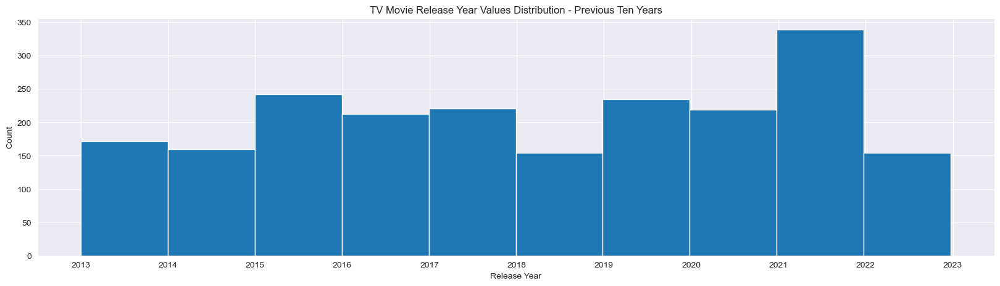

RELEASE DATE Median = 2018-04-01 00:00:00, Mean = 2018-04-02 08:20:02.277039872
count                             2108
mean     2018-04-02 08:20:02.277039872
min                2013-01-01 00:00:00
25%                2015-11-08 00:00:00
50%                2018-04-01 00:00:00
75%                2020-11-22 00:00:00
max                2022-12-23 00:00:00
Name: release_date, dtype: object


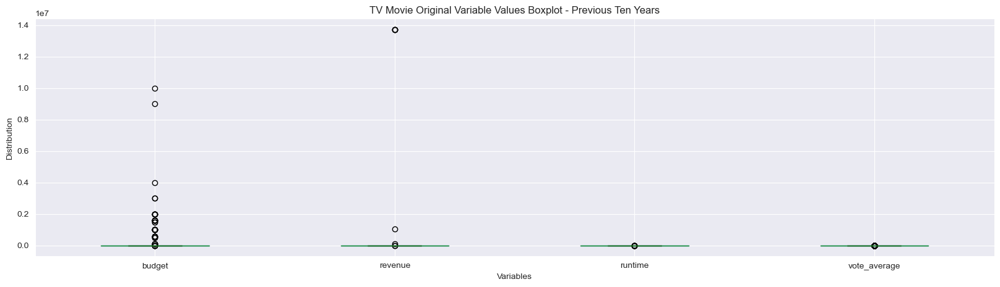

In [58]:
#Show distribution of previous 10 Year TV Movie variable values
n_data = len(tvm10b_movies.budget)
n_bins = np.sqrt(n_data)
n_bins = int(n_bins)
_ =plt.hist(tvm10b_movies.budget, bins=n_bins)
plt.title('TV Movie Budget Values Distribution - Previous Ten Years')
plt.xlabel('Money')
plt.ylabel('Count')
plt.show()

#Calculate median and mean values for variables
print(f"BUDGET Median = {tvm10b_movies.budget.median()}, Mean = {tvm10b_movies.budget.mean()}")
print(tvm10b_movies.budget.describe())

n_data = len(tvm10r_movies.revenue)
n_bins = np.sqrt(n_data)
n_bins = int(n_bins)
_ =plt.hist(tvm10r_movies.revenue, bins=n_bins)
plt.title('TV Movie Revenue Values Distribution - Previous Ten Years')
plt.xlabel('Money')
plt.ylabel('Count')
plt.show()

print(f"REVENUE Median = {tvm10r_movies.revenue.median()}, Mean = {tvm10r_movies.revenue.mean()}")
print(tvm10r_movies.revenue.describe())

n_data = len(tvm10d_movies.runtime)
n_bins = np.sqrt(n_data)
n_bins = int(n_bins)
_ =plt.hist(tvm10d_movies.runtime, bins=n_bins)
plt.title('TV Movie Runtime Values Distribution - Previous Ten Years')
plt.xlabel('Runtime (minutes)')
plt.ylabel('Count')
plt.show()

print(f"RUNTIME Median = {tvm10d_movies.runtime.median()}, Mean = {tvm10d_movies.runtime.mean()}")
print(tvm10d_movies.runtime.describe())

_ =plt.hist(tvm10v_movies.vote_average)
plt.title('TV Movie Average Score Values Distribution - Previous Ten Years')
plt.xlabel('Average Score')
plt.ylabel('Count')
plt.show()

print(f"SCORE Median = {tvm10v_movies.vote_average.median()}, Mean = {tvm10v_movies.vote_average.mean()}")
print(tvm10v_movies.vote_average.describe())

_ =plt.hist(tvm10_movies.release_date)
plt.title('TV Movie Release Year Values Distribution - Previous Ten Years')
plt.xlabel('Release Year')
plt.ylabel('Count')
plt.show()

print(f"RELEASE DATE Median = {tvm10_movies.release_date.median()}, Mean = {tvm10_movies.release_date.mean()}")
print(tvm10_movies.release_date.describe(datetime_is_numeric=True))

tvm10_movies.boxplot(column=['budget', 'revenue', 'runtime', 'vote_average'])
plt.title('TV Movie Original Variable Values Boxplot - Previous Ten Years')
plt.xlabel('Variables')
plt.ylabel('Distribution')
plt.show()

In [59]:
#Drop zero values from 10 Year War variables. 
#Create a seperate dataframe for each so as not to affect the other variables calculations.
war10b_movies = war10_movies[war10_movies['budget'] !=0]
war10r_movies = war10_movies[war10_movies['revenue'] !=0]
war10d_movies = war10_movies[war10_movies['runtime'] !=0]
war10v_movies = war10_movies[war10_movies['vote_average'] !=0]

#Remove Outliers from 10 Year War variables and 
Q1 = war10b_movies.budget.quantile(0.25)
Q3 = war10b_movies.budget.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(war10b_movies['budget']>=upper_limit)[0]
lower_array = np.where(war10b_movies['budget']<=lower_limit)[0]
war10b_movies['budget'].drop(index=upper_array, inplace=True)
war10b_movies['budget'].drop(index=lower_array, inplace=True)

Q1 = war10r_movies.revenue.quantile(0.25)
Q3 = war10r_movies.revenue.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(war10r_movies['revenue']>=upper_limit)[0]
lower_array = np.where(war10r_movies['revenue']<=lower_limit)[0]
war10r_movies['revenue'].drop(index=upper_array, inplace=True)
war10r_movies['revenue'].drop(index=lower_array, inplace=True)

Q1 = war10d_movies.runtime.quantile(0.25)
Q3 = war10d_movies.runtime.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(war10d_movies['runtime']>=upper_limit)[0]
lower_array = np.where(war10d_movies['runtime']<=lower_limit)[0]
war10d_movies['runtime'].drop(index=upper_array, inplace=True)
war10d_movies['runtime'].drop(index=lower_array, inplace=True)

Q1 = war10v_movies.vote_average.quantile(0.25)
Q3 = war10v_movies.vote_average.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(war10v_movies['vote_average']>=upper_limit)[0]
lower_array = np.where(war10v_movies['vote_average']<=lower_limit)[0]
war10v_movies['vote_average'].drop(index=upper_array, inplace=True)
war10v_movies['vote_average'].drop(index=lower_array, inplace=True)

KeyError: '[2, 10, 12, 24, 28, 31, 100] not found in axis'

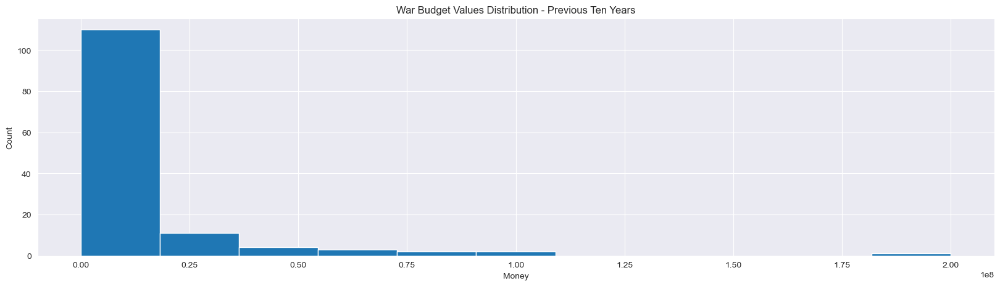

BUDGET Median = 511290.0, Mean = 11203305.22556391
count    1.330000e+02
mean     1.120331e+07
std      2.600648e+07
min      1.000000e+00
25%      1.400000e+04
50%      5.112900e+05
75%      9.500000e+06
max      2.000000e+08
Name: budget, dtype: float64


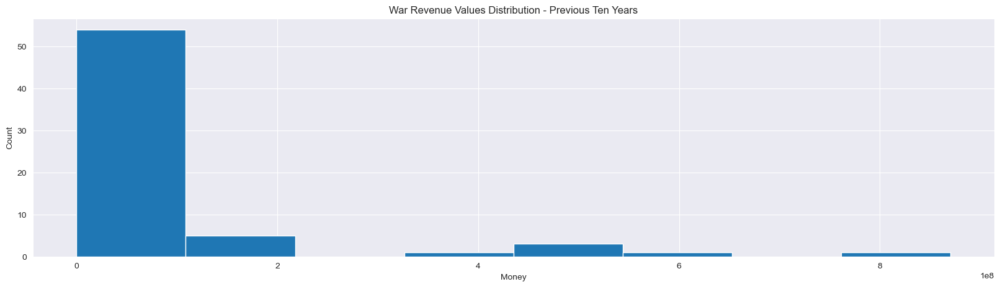

REVENUE Median = 4988176.0, Mean = 74044607.86153845
count    6.500000e+01
mean     7.404461e+07
std      1.714928e+08
min      1.000000e+00
25%      7.089730e+05
50%      4.988176e+06
75%      3.683780e+07
max      8.703227e+08
Name: revenue, dtype: float64


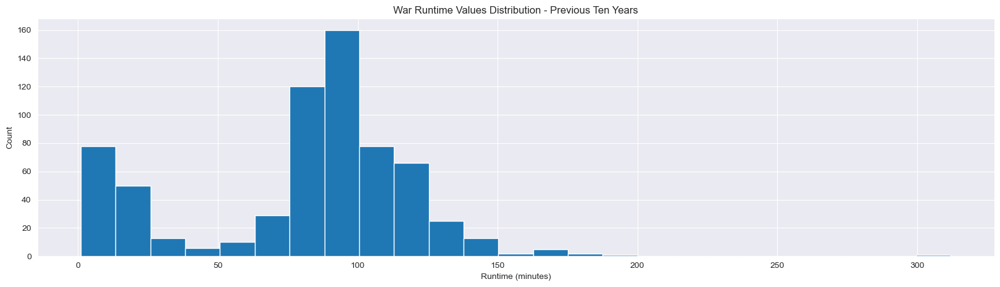

RUNTIME Median = 90.0, Mean = 80.85584218512898
count    659.000000
mean      80.855842
std       40.724318
min        1.000000
25%       70.000000
50%       90.000000
75%      106.500000
max      312.000000
Name: runtime, dtype: float64


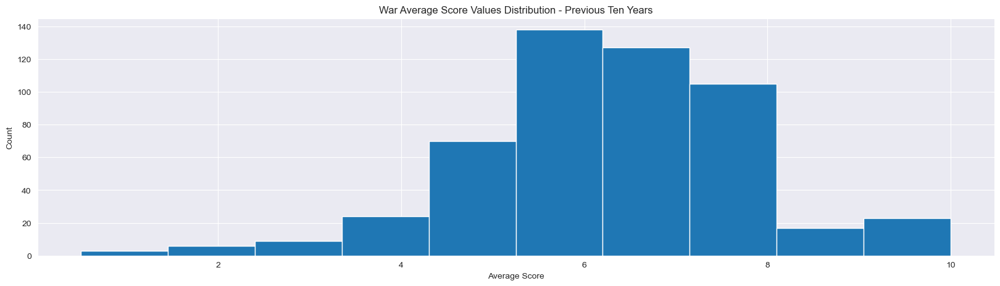

SCORE Median = 6.3, Mean = 6.285394636015333
count    522.000000
mean       6.285395
std        1.576317
min        0.500000
25%        5.400000
50%        6.300000
75%        7.200000
max       10.000000
Name: vote_average, dtype: float64


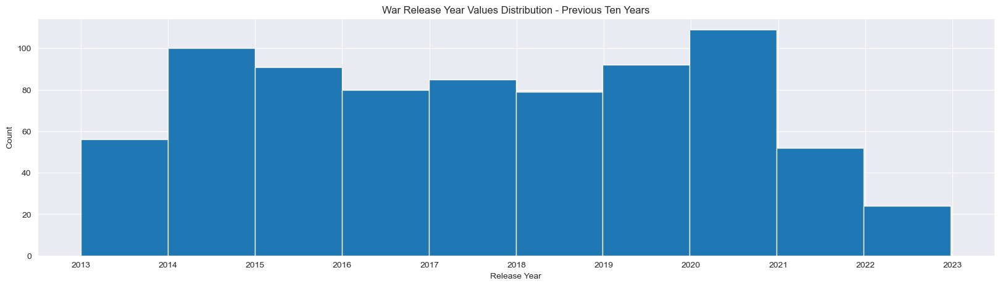

RELEASE DATE Median = 2017-06-30 12:00:00, Mean = 2017-08-23 23:20:37.500000
count                           768
mean     2017-08-23 23:20:37.500000
min             2013-01-01 00:00:00
25%             2015-04-13 00:00:00
50%             2017-06-30 12:00:00
75%             2019-12-17 00:00:00
max             2022-12-25 00:00:00
Name: release_date, dtype: object


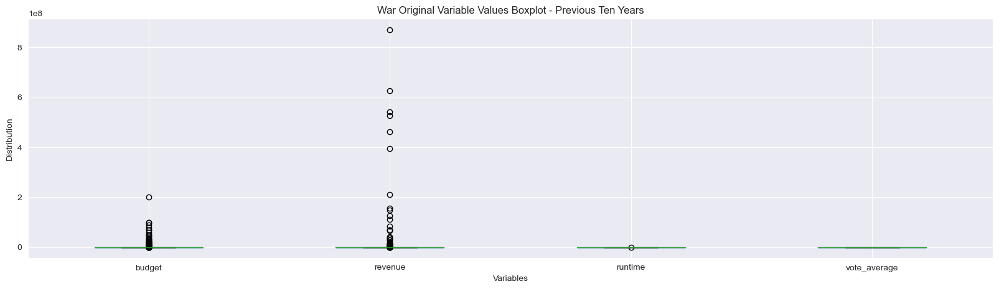

In [60]:
#Show distribution of previous 10 Year War variable values
n_data = len(war10b_movies.budget)
n_bins = np.sqrt(n_data)
n_bins = int(n_bins)
_ =plt.hist(war10b_movies.budget, bins=n_bins)
plt.title('War Budget Values Distribution - Previous Ten Years')
plt.xlabel('Money')
plt.ylabel('Count')
plt.show()

#Calculate median and mean values for variables
print(f"BUDGET Median = {war10b_movies.budget.median()}, Mean = {war10b_movies.budget.mean()}")
print(war10b_movies.budget.describe())

n_data = len(war10r_movies.revenue)
n_bins = np.sqrt(n_data)
n_bins = int(n_bins)
_ =plt.hist(war10r_movies.revenue, bins=n_bins)
plt.title('War Revenue Values Distribution - Previous Ten Years')
plt.xlabel('Money')
plt.ylabel('Count')
plt.show()

print(f"REVENUE Median = {war10r_movies.revenue.median()}, Mean = {war10r_movies.revenue.mean()}")
print(war10r_movies.revenue.describe())

n_data = len(war10d_movies.runtime)
n_bins = np.sqrt(n_data)
n_bins = int(n_bins)
_ =plt.hist(war10d_movies.runtime, bins=n_bins)
plt.title('War Runtime Values Distribution - Previous Ten Years')
plt.xlabel('Runtime (minutes)')
plt.ylabel('Count')
plt.show()

print(f"RUNTIME Median = {war10d_movies.runtime.median()}, Mean = {war10d_movies.runtime.mean()}")
print(war10d_movies.runtime.describe())

_ =plt.hist(war10v_movies.vote_average)
plt.title('War Average Score Values Distribution - Previous Ten Years')
plt.xlabel('Average Score')
plt.ylabel('Count')
plt.show()

print(f"SCORE Median = {war10v_movies.vote_average.median()}, Mean = {war10v_movies.vote_average.mean()}")
print(war10v_movies.vote_average.describe())

_ =plt.hist(war10_movies.release_date)
plt.title('War Release Year Values Distribution - Previous Ten Years')
plt.xlabel('Release Year')
plt.ylabel('Count')
plt.show()

print(f"RELEASE DATE Median = {war10_movies.release_date.median()}, Mean = {war10_movies.release_date.mean()}")
print(war10_movies.release_date.describe(datetime_is_numeric=True))

war10_movies.boxplot(column=['budget', 'revenue', 'runtime', 'vote_average'])
plt.title('War Original Variable Values Boxplot - Previous Ten Years')
plt.xlabel('Variables')
plt.ylabel('Distribution')
plt.show()

In [61]:
#Drop zero values from 10 Year Western variables. 
#Create a seperate dataframe for each so as not to affect the other variables calculations.
wes10b_movies = wes10_movies[wes10_movies['budget'] !=0]
wes10r_movies = wes10_movies[wes10_movies['revenue'] !=0]
wes10d_movies = wes10_movies[wes10_movies['runtime'] !=0]
wes10v_movies = wes10_movies[wes10_movies['vote_average'] !=0]

#Remove Outliers from 10 Year Western variables and 
Q1 = wes10b_movies.budget.quantile(0.25)
Q3 = wes10b_movies.budget.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(wes10b_movies['budget']>=upper_limit)[0]
lower_array = np.where(wes10b_movies['budget']<=lower_limit)[0]
wes10b_movies['budget'].drop(index=upper_array, inplace=True)
wes10b_movies['budget'].drop(index=lower_array, inplace=True)

Q1 = wes10r_movies.revenue.quantile(0.25)
Q3 = wes10r_movies.revenue.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(wes10r_movies['revenue']>=upper_limit)[0]
lower_array = np.where(wes10r_movies['revenue']<=lower_limit)[0]
wes10r_movies['revenue'].drop(index=upper_array, inplace=True)
wes10r_movies['revenue'].drop(index=lower_array, inplace=True)

Q1 = wes10d_movies.runtime.quantile(0.25)
Q3 = wes10d_movies.runtime.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(wes10d_movies['runtime']>=upper_limit)[0]
lower_array = np.where(wes10d_movies['runtime']<=lower_limit)[0]
wes10d_movies['runtime'].drop(index=upper_array, inplace=True)
wes10d_movies['runtime'].drop(index=lower_array, inplace=True)

Q1 = wes10v_movies.vote_average.quantile(0.25)
Q3 = wes10v_movies.vote_average.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(wes10v_movies['vote_average']>=upper_limit)[0]
lower_array = np.where(wes10v_movies['vote_average']<=lower_limit)[0]
wes10v_movies['vote_average'].drop(index=upper_array, inplace=True)
wes10v_movies['vote_average'].drop(index=lower_array, inplace=True)

KeyError: '[0, 1, 2, 4, 5, 9, 10, 11, 13, 17, 19, 31] not found in axis'

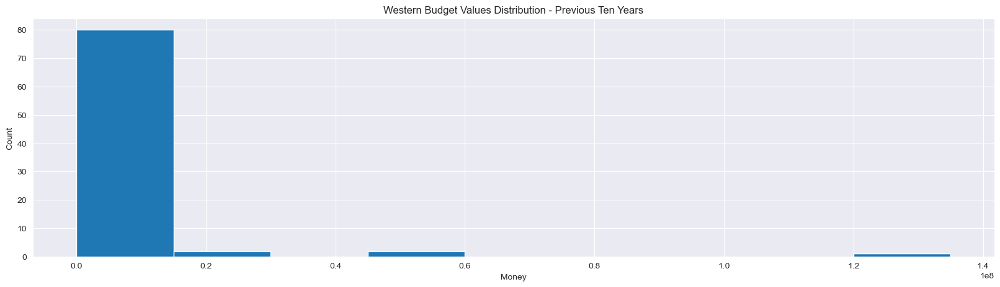

BUDGET Median = 6000.0, Mean = 4798403.094117647
count    8.500000e+01
mean     4.798403e+06
std      1.716137e+07
min      5.000000e+00
25%      4.000000e+02
50%      6.000000e+03
75%      1.700000e+06
max      1.350000e+08
Name: budget, dtype: float64


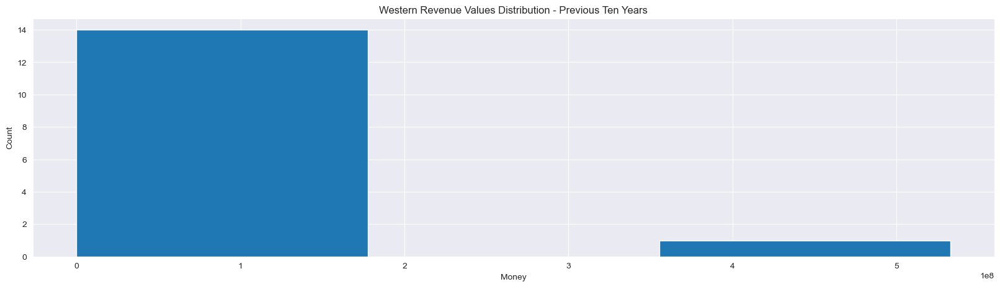

REVENUE Median = 168738.0, Mean = 40972903.333333336
count    1.500000e+01
mean     4.097290e+07
std      1.367091e+08
min      5.000000e+02
25%      3.127350e+04
50%      1.687380e+05
75%      2.502276e+06
max      5.329505e+08
Name: revenue, dtype: float64


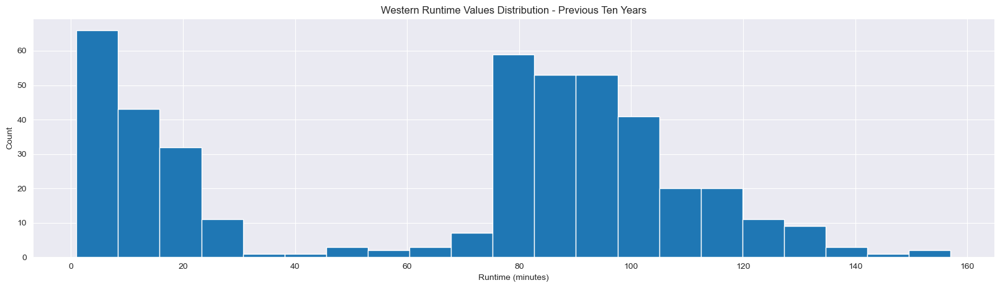

RUNTIME Median = 82.0, Mean = 65.73696145124717
count    441.000000
mean      65.736961
std       42.211090
min        1.000000
25%       16.000000
50%       82.000000
75%       96.000000
max      157.000000
Name: runtime, dtype: float64


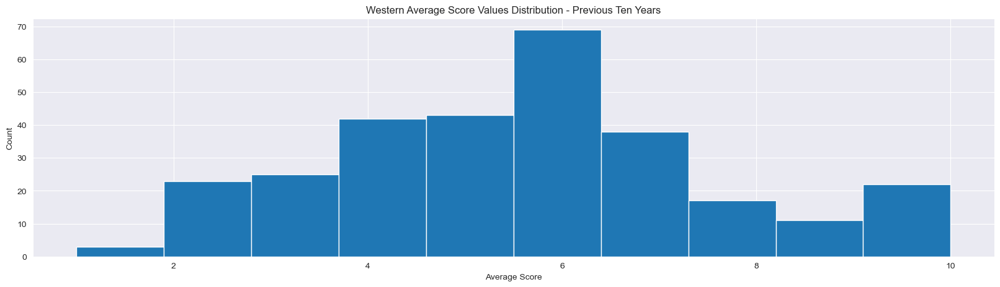

SCORE Median = 5.6, Mean = 5.553368600682599
count    293.000000
mean       5.553369
std        2.040058
min        1.000000
25%        4.200000
50%        5.600000
75%        6.600000
max       10.000000
Name: vote_average, dtype: float64


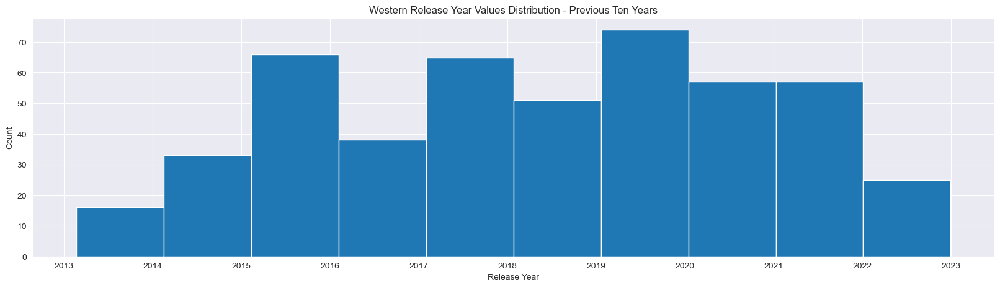

RELEASE DATE Median = 2018-06-21 00:00:00, Mean = 2018-05-14 18:58:15.435684608
count                              482
mean     2018-05-14 18:58:15.435684608
min                2013-02-21 00:00:00
25%                2016-06-11 00:00:00
50%                2018-06-21 00:00:00
75%                2020-03-01 18:00:00
max                2022-12-31 00:00:00
Name: release_date, dtype: object


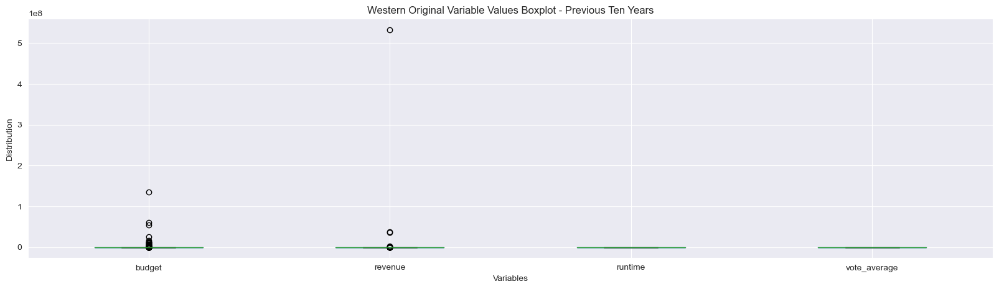

In [62]:
#Show distribution of previous 10 Year Western variable values
n_data = len(wes10b_movies.budget)
n_bins = np.sqrt(n_data)
n_bins = int(n_bins)
_ =plt.hist(wes10b_movies.budget, bins=n_bins)
plt.title('Western Budget Values Distribution - Previous Ten Years')
plt.xlabel('Money')
plt.ylabel('Count')
plt.show()

#Calculate median and mean values for variables
print(f"BUDGET Median = {wes10b_movies.budget.median()}, Mean = {wes10b_movies.budget.mean()}")
print(wes10b_movies.budget.describe())

n_data = len(wes10r_movies.revenue)
n_bins = np.sqrt(n_data)
n_bins = int(n_bins)
_ =plt.hist(wes10r_movies.revenue, bins=n_bins)
plt.title('Western Revenue Values Distribution - Previous Ten Years')
plt.xlabel('Money')
plt.ylabel('Count')
plt.show()

print(f"REVENUE Median = {wes10r_movies.revenue.median()}, Mean = {wes10r_movies.revenue.mean()}")
print(wes10r_movies.revenue.describe())

n_data = len(wes10d_movies.runtime)
n_bins = np.sqrt(n_data)
n_bins = int(n_bins)
_ =plt.hist(wes10d_movies.runtime, bins=n_bins)
plt.title('Western Runtime Values Distribution - Previous Ten Years')
plt.xlabel('Runtime (minutes)')
plt.ylabel('Count')
plt.show()

print(f"RUNTIME Median = {wes10d_movies.runtime.median()}, Mean = {wes10d_movies.runtime.mean()}")
print(wes10d_movies.runtime.describe())

_ =plt.hist(wes10v_movies.vote_average)
plt.title('Western Average Score Values Distribution - Previous Ten Years')
plt.xlabel('Average Score')
plt.ylabel('Count')
plt.show()

print(f"SCORE Median = {wes10v_movies.vote_average.median()}, Mean = {wes10v_movies.vote_average.mean()}")
print(wes10v_movies.vote_average.describe())

_ =plt.hist(wes10_movies.release_date)
plt.title('Western Release Year Values Distribution - Previous Ten Years')
plt.xlabel('Release Year')
plt.ylabel('Count')
plt.show()

print(f"RELEASE DATE Median = {wes10_movies.release_date.median()}, Mean = {wes10_movies.release_date.mean()}")
print(wes10_movies.release_date.describe(datetime_is_numeric=True))

wes10_movies.boxplot(column=['budget', 'revenue', 'runtime', 'vote_average'])
plt.title('Western Original Variable Values Boxplot - Previous Ten Years')
plt.xlabel('Variables')
plt.ylabel('Distribution')
plt.show()

In [63]:
#Drop zero values from 10 Year Unknown variables. 
#Create a seperate dataframe for each so as not to affect the other variables calculations.
unk10b_movies = unk10_movies[unk10_movies['budget'] !=0]
unk10r_movies = unk10_movies[unk10_movies['revenue'] !=0]
unk10d_movies = unk10_movies[unk10_movies['runtime'] !=0]
unk10v_movies = unk10_movies[unk10_movies['vote_average'] !=0]

#Remove Outliers from 10 Year Unknown variables and 
Q1 = unk10b_movies.budget.quantile(0.25)
Q3 = unk10b_movies.budget.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(unk10b_movies['budget']>=upper_limit)[0]
lower_array = np.where(unk10b_movies['budget']<=lower_limit)[0]
unk10b_movies['budget'].drop(index=upper_array, inplace=True)
unk10b_movies['budget'].drop(index=lower_array, inplace=True)

Q1 = unk10r_movies.revenue.quantile(0.25)
Q3 = unk10r_movies.revenue.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(unk10r_movies['revenue']>=upper_limit)[0]
lower_array = np.where(unk10r_movies['revenue']<=lower_limit)[0]
unk10r_movies['revenue'].drop(index=upper_array, inplace=True)
unk10r_movies['revenue'].drop(index=lower_array, inplace=True)

Q1 = unk10d_movies.runtime.quantile(0.25)
Q3 = unk10d_movies.runtime.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(unk10d_movies['runtime']>=upper_limit)[0]
lower_array = np.where(unk10d_movies['runtime']<=lower_limit)[0]
unk10d_movies['runtime'].drop(index=upper_array, inplace=True)
unk10d_movies['runtime'].drop(index=lower_array, inplace=True)

Q1 = unk10v_movies.vote_average.quantile(0.25)
Q3 = unk10v_movies.vote_average.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(unk10v_movies['vote_average']>=upper_limit)[0]
lower_array = np.where(unk10v_movies['vote_average']<=lower_limit)[0]
unk10v_movies['vote_average'].drop(index=upper_array, inplace=True)
unk10v_movies['vote_average'].drop(index=lower_array, inplace=True)

KeyError: '[20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 40, 41, 42, 43, 45, 46, 47, 48, 50, 51, 52, 53, 59, 60, 62, 63, 64, 65, 75, 76, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 103, 104, 105, 106, 107, 108, 109, 110, 111, 129, 130, 131, 132, 134, 146, 148, 150, 151, 156, 159, 160, 161, 162, 165, 166, 167, 168, 169, 170, 171, 172, 173, 178, 180, 208, 236, 237, 238, 239, 277, 285, 286, 287, 288, 308, 309, 310, 311, 321, 323, 324, 325, 326, 350, 354, 366, 368, 369, 370, 371, 376, 377, 378, 379, 392, 401, 402, 403, 404, 405, 417, 418, 419, 420, 445, 446, 447, 448, 454, 455, 462, 468, 475, 478, 497, 498, 499, 500, 501, 504, 506, 511, 512, 513, 514, 544, 549, 560, 562, 572, 576, 577, 589, 592, 600, 602, 624, 628, 629, 630, 631, 632, 633, 634, 635, 636, 639, 673, 677, 686, 692, 693, 706, 707, 708, 709, 730, 744, 752, 762, 767, 770, 785, 789, 794, 798, 801, 804, 813, 814, 820, 835, 840, 844, 847, 870, 871, 874, 899, 902, 912, 927, 944, 945, 948, 955, 956, 960, 992, 993, 995, 1001, 1005, 1024, 1036, 1042, 1043, 1044, 1054, 1061, 1062, 1065, 1066, 1069, 1078, 1128, 1132, 1137, 1157, 1160, 1206, 1218, 1245, 1247, 1257, 1258, 1284, 1302, 1303, 1304, 1315, 1317, 1325, 1332, 1335, 1369, 1384, 1394, 1395, 1402, 1403, 1426, 1440, 1441, 1451, 1452, 1459, 1460, 1466, 1473, 1492, 1493, 1495, 1496, 1500, 1573, 1583, 1612] not found in axis'

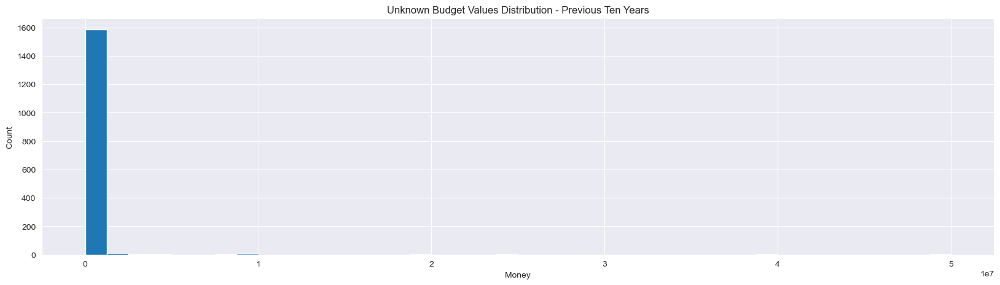

BUDGET Median = 2500.0, Mean = 329270.38679827267
count    1.621000e+03
mean     3.292704e+05
std      2.940585e+06
min      1.000000e+00
25%      2.000000e+02
50%      2.500000e+03
75%      1.800000e+04
max      5.000000e+07
Name: budget, dtype: float64


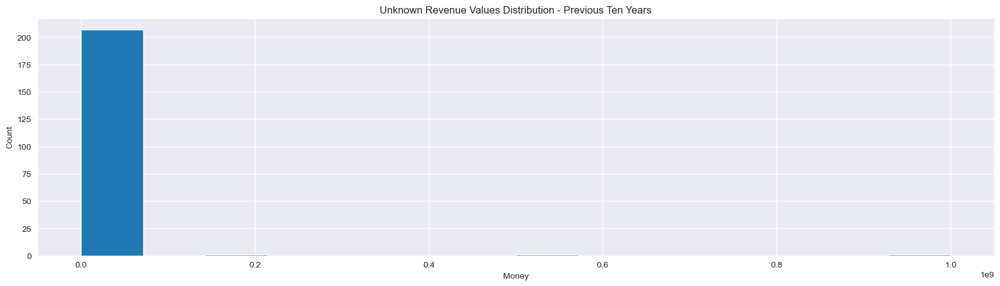

REVENUE Median = 3000.0, Mean = 10698774.42857143
count    2.100000e+02
mean     1.069877e+07
std      7.855206e+07
min     -1.200000e+01
25%      2.000000e+02
50%      3.000000e+03
75%      1.214402e+05
max      1.000000e+09
Name: revenue, dtype: float64


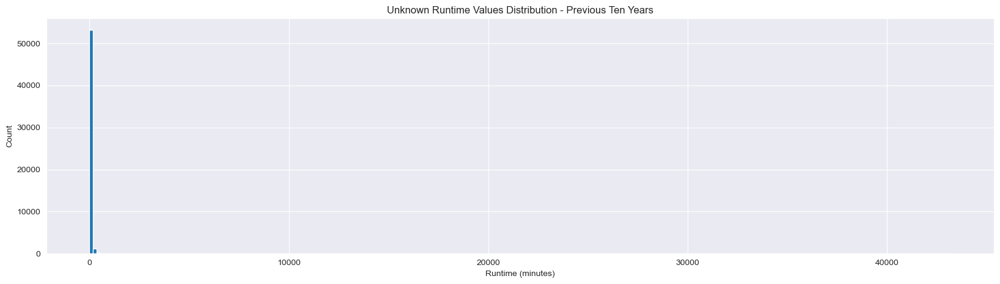

RUNTIME Median = 20.0, Mean = 47.19860518753089
count    54631.000000
mean        47.198605
std        193.692970
min          1.000000
25%          9.000000
50%         20.000000
75%         77.000000
max      43200.000000
Name: runtime, dtype: float64


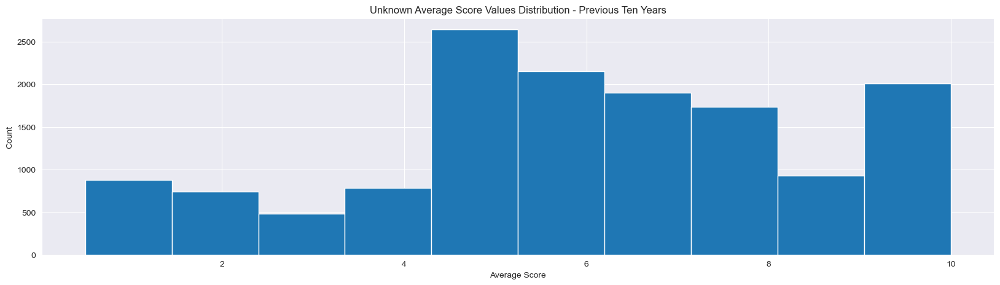

SCORE Median = 6.0, Mean = 6.10868976643057
count    14257.00000
mean         6.10869
std          2.53345
min          0.50000
25%          5.00000
50%          6.00000
75%          8.00000
max         10.00000
Name: vote_average, dtype: float64


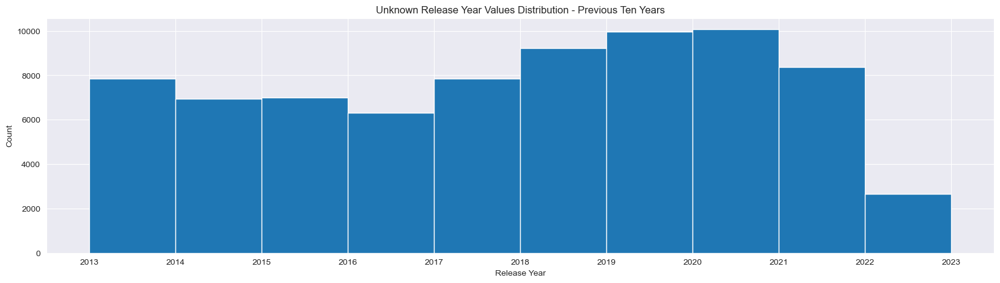

RELEASE DATE Median = 2018-03-03 00:00:00, Mean = 2017-12-09 15:21:16.547842048
count                            76219
mean     2017-12-09 15:21:16.547842048
min                2013-01-01 00:00:00
25%                2015-09-25 00:00:00
50%                2018-03-03 00:00:00
75%                2020-03-10 00:00:00
max                2022-12-31 00:00:00
Name: release_date, dtype: object


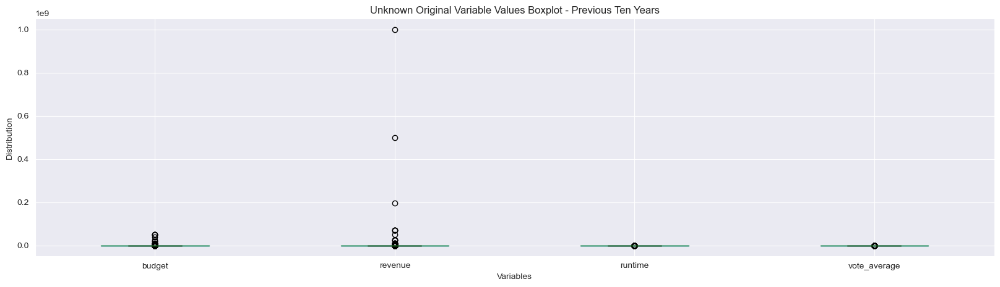

In [64]:
#Show distribution of previous 10 Year Unknown variable values
n_data = len(unk10b_movies.budget)
n_bins = np.sqrt(n_data)
n_bins = int(n_bins)
_ =plt.hist(unk10b_movies.budget, bins=n_bins)
plt.title('Unknown Budget Values Distribution - Previous Ten Years')
plt.xlabel('Money')
plt.ylabel('Count')
plt.show()

#Calculate median and mean values for variables
print(f"BUDGET Median = {unk10b_movies.budget.median()}, Mean = {unk10b_movies.budget.mean()}")
print(unk10b_movies.budget.describe())

n_data = len(unk10r_movies.revenue)
n_bins = np.sqrt(n_data)
n_bins = int(n_bins)
_ =plt.hist(unk10r_movies.revenue, bins=n_bins)
plt.title('Unknown Revenue Values Distribution - Previous Ten Years')
plt.xlabel('Money')
plt.ylabel('Count')
plt.show()

print(f"REVENUE Median = {unk10r_movies.revenue.median()}, Mean = {unk10r_movies.revenue.mean()}")
print(unk10r_movies.revenue.describe())

n_data = len(unk10d_movies.runtime)
n_bins = np.sqrt(n_data)
n_bins = int(n_bins)
_ =plt.hist(unk10d_movies.runtime, bins=n_bins)
plt.title('Unknown Runtime Values Distribution - Previous Ten Years')
plt.xlabel('Runtime (minutes)')
plt.ylabel('Count')
plt.show()

print(f"RUNTIME Median = {unk10d_movies.runtime.median()}, Mean = {unk10d_movies.runtime.mean()}")
print(unk10d_movies.runtime.describe())

_ =plt.hist(unk10v_movies.vote_average)
plt.title('Unknown Average Score Values Distribution - Previous Ten Years')
plt.xlabel('Average Score')
plt.ylabel('Count')
plt.show()

print(f"SCORE Median = {unk10v_movies.vote_average.median()}, Mean = {unk10v_movies.vote_average.mean()}")
print(unk10v_movies.vote_average.describe())

_ =plt.hist(unk10_movies.release_date)
plt.title('Unknown Release Year Values Distribution - Previous Ten Years')
plt.xlabel('Release Year')
plt.ylabel('Count')
plt.show()

print(f"RELEASE DATE Median = {unk10_movies.release_date.median()}, Mean = {unk10_movies.release_date.mean()}")
print(unk10_movies.release_date.describe(datetime_is_numeric=True))

unk10_movies.boxplot(column=['budget', 'revenue', 'runtime', 'vote_average'])
plt.title('Unknown Original Variable Values Boxplot - Previous Ten Years')
plt.xlabel('Variables')
plt.ylabel('Distribution')
plt.show()

In [65]:
#Drop zero values from 5 Year Action variables. 
#Create a seperate dataframe for each so as not to affect the other variables calculations.
act5b_movies = act5_movies[act5_movies['budget'] !=0]
act5r_movies = act5_movies[act5_movies['revenue'] !=0]
act5d_movies = act5_movies[act5_movies['runtime'] !=0]
act5v_movies = act5_movies[act5_movies['vote_average'] !=0]

#Remove Outliers from 5 Year Action variables and 
Q1 = act5b_movies.budget.quantile(0.25)
Q3 = act5b_movies.budget.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(act5b_movies['budget']>=upper_limit)[0]
lower_array = np.where(act5b_movies['budget']<=lower_limit)[0]
act5b_movies['budget'].drop(index=upper_array, inplace=True)
act5b_movies['budget'].drop(index=lower_array, inplace=True)

Q1 = act5r_movies.revenue.quantile(0.25)
Q3 = act5r_movies.revenue.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(act5r_movies['revenue']>=upper_limit)[0]
lower_array = np.where(act5r_movies['revenue']<=lower_limit)[0]
act5r_movies['revenue'].drop(index=upper_array, inplace=True)
act5r_movies['revenue'].drop(index=lower_array, inplace=True)

Q1 = act5d_movies.runtime.quantile(0.25)
Q3 = act5d_movies.runtime.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(act5d_movies['runtime']>=upper_limit)[0]
lower_array = np.where(act5d_movies['runtime']<=lower_limit)[0]
act5d_movies['runtime'].drop(index=upper_array, inplace=True)
act5d_movies['runtime'].drop(index=lower_array, inplace=True)

Q1 = act5v_movies.vote_average.quantile(0.25)
Q3 = act5v_movies.vote_average.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(act5v_movies['vote_average']>=upper_limit)[0]
lower_array = np.where(act5v_movies['vote_average']<=lower_limit)[0]
act5v_movies['vote_average'].drop(index=upper_array, inplace=True)
act5v_movies['vote_average'].drop(index=lower_array, inplace=True)

KeyError: '[1, 4, 5, 13, 19, 20, 21, 22, 23, 24, 25, 26, 28, 29, 30, 31, 32, 33, 34, 35, 37, 38, 39, 41, 43, 44, 47, 48, 54, 56, 57, 60, 61, 62, 68, 71, 78, 86, 88, 90, 95, 104, 105, 109, 115, 116, 121, 122, 124, 125, 131, 133, 134, 137, 153, 156, 158, 168, 174, 185, 190, 191, 210, 270, 271, 272, 273, 274, 276, 278, 348, 349, 350, 363, 364, 476, 477, 478, 610, 740] not found in axis'

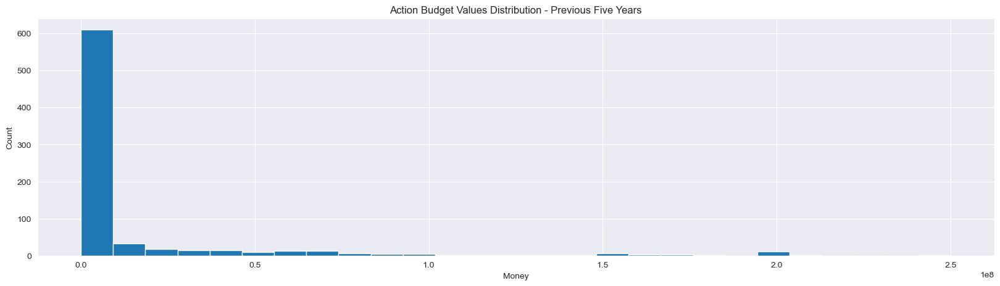

BUDGET Median = 42456.0, Mean = 15233215.268387096
count    7.750000e+02
mean     1.523322e+07
std      3.916924e+07
min      1.000000e+00
25%      2.889000e+03
50%      4.245600e+04
75%      5.000000e+06
max      2.500000e+08
Name: budget, dtype: float64


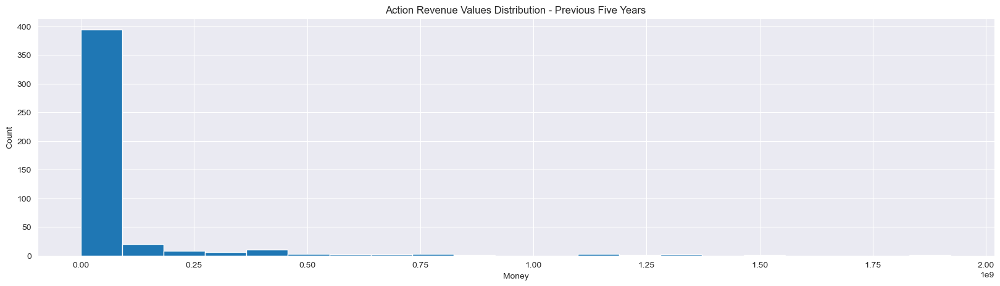

REVENUE Median = 400900.0, Mean = 69143617.32822756
count    4.570000e+02
mean     6.914362e+07
std      2.134439e+08
min      1.000000e+00
25%      9.886000e+03
50%      4.009000e+05
75%      2.434030e+07
max      1.921847e+09
Name: revenue, dtype: float64


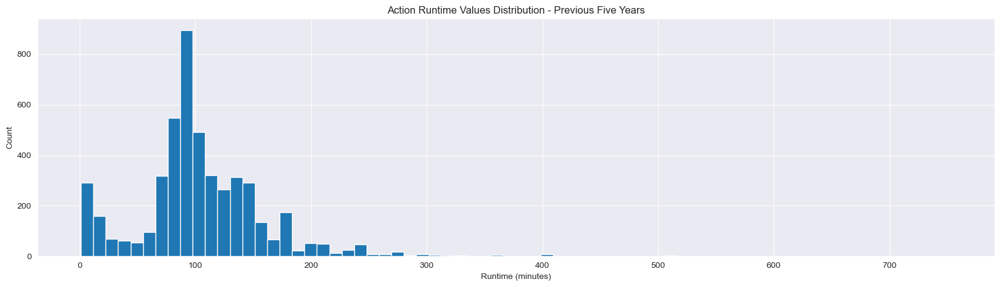

RUNTIME Median = 96.0, Mean = 104.08938547486034
count    4833.000000
mean      104.089385
std        55.760102
min         1.000000
25%        80.000000
50%        96.000000
75%       130.000000
max       753.000000
Name: runtime, dtype: float64


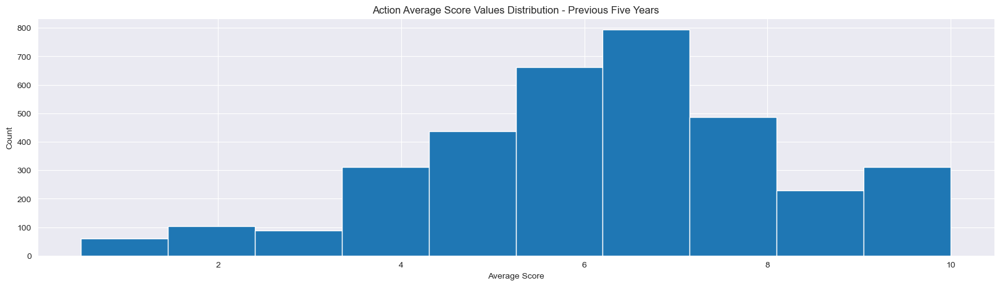

SCORE Median = 6.3, Mean = 6.27415651924179
count    3482.000000
mean        6.274157
std         2.029635
min         0.500000
25%         5.000000
50%         6.300000
75%         7.500000
max        10.000000
Name: vote_average, dtype: float64


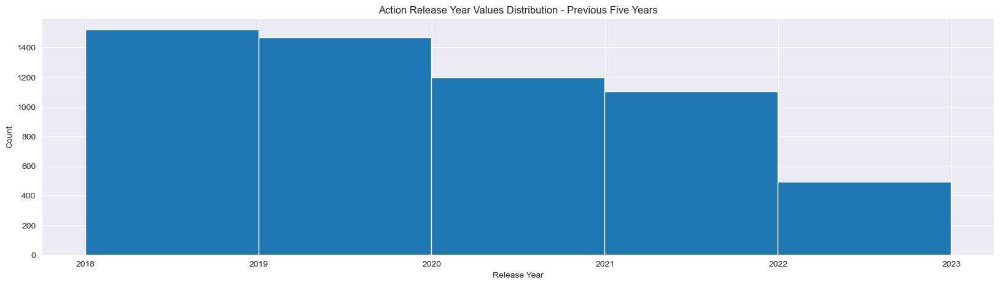

RELEASE DATE Median = 2019-12-11 00:00:00, Mean = 2020-01-24 22:38:03.777239552
count                             5782
mean     2020-01-24 22:38:03.777239552
min                2018-01-01 00:00:00
25%                2018-12-18 00:00:00
50%                2019-12-11 00:00:00
75%                2021-01-29 00:00:00
max                2022-12-30 00:00:00
Name: release_date, dtype: object


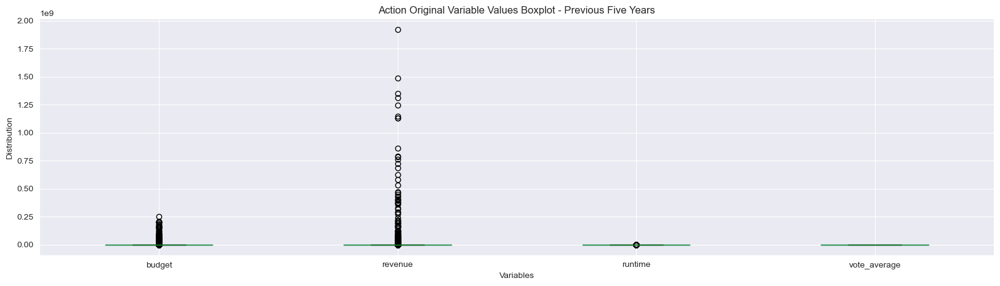

In [66]:
#Show distribution of previous 5 Year Action variable values
n_data = len(act5b_movies.budget)
n_bins = np.sqrt(n_data)
n_bins = int(n_bins)
_ =plt.hist(act5b_movies.budget, bins=n_bins)
plt.title('Action Budget Values Distribution - Previous Five Years')
plt.xlabel('Money')
plt.ylabel('Count')
plt.show()

print(f"BUDGET Median = {act5b_movies.budget.median()}, Mean = {act5b_movies.budget.mean()}")
print(act5b_movies.budget.describe())

n_data = len(act5r_movies.revenue)
n_bins = np.sqrt(n_data)
n_bins = int(n_bins)
_ =plt.hist(act5r_movies.revenue, bins=n_bins)
plt.title('Action Revenue Values Distribution - Previous Five Years')
plt.xlabel('Money')
plt.ylabel('Count')
plt.show()

print(f"REVENUE Median = {act5r_movies.revenue.median()}, Mean = {act5r_movies.revenue.mean()}")
print(act5r_movies.revenue.describe())

n_data = len(act5d_movies.runtime)
n_bins = np.sqrt(n_data)
n_bins = int(n_bins)
_ =plt.hist(act5d_movies.runtime, bins=n_bins)
plt.title('Action Runtime Values Distribution - Previous Five Years')
plt.xlabel('Runtime (minutes)')
plt.ylabel('Count')
plt.show()

print(f"RUNTIME Median = {act5d_movies.runtime.median()}, Mean = {act5d_movies.runtime.mean()}")
print(act5d_movies.runtime.describe())

_ =plt.hist(act5v_movies.vote_average)
plt.title('Action Average Score Values Distribution - Previous Five Years')
plt.xlabel('Average Score')
plt.ylabel('Count')
plt.show()

print(f"SCORE Median = {act5v_movies.vote_average.median()}, Mean = {act5v_movies.vote_average.mean()}")
print(act5v_movies.vote_average.describe())

_ =plt.hist(act5_movies.release_date, bins=5)
plt.title('Action Release Year Values Distribution - Previous Five Years')
plt.xlabel('Release Year')
plt.ylabel('Count')
plt.show()

print(f"RELEASE DATE Median = {act5_movies.release_date.median()}, Mean = {act5_movies.release_date.mean()}")
print(act5_movies.release_date.describe(datetime_is_numeric=True))

act5_movies.boxplot(column=['budget', 'revenue', 'runtime', 'vote_average'])
plt.title('Action Original Variable Values Boxplot - Previous Five Years')
plt.xlabel('Variables')
plt.ylabel('Distribution')
plt.show()

In [67]:
#Drop zero values from 5 Year Adventure variables. 
#Create a seperate dataframe for each so as not to affect the other variables calculations.
adv5b_movies = adv5_movies[adv5_movies['budget'] !=0]
adv5r_movies = adv5_movies[adv5_movies['revenue'] !=0]
adv5d_movies = adv5_movies[adv5_movies['runtime'] !=0]
adv5v_movies = adv5_movies[adv5_movies['vote_average'] !=0]

#Remove Outliers from 5 Year Adventure variables and 
Q1 = adv5b_movies.budget.quantile(0.25)
Q3 = adv5b_movies.budget.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(adv5b_movies['budget']>=upper_limit)[0]
lower_array = np.where(adv5b_movies['budget']<=lower_limit)[0]
adv5b_movies['budget'].drop(index=upper_array, inplace=True)
adv5b_movies['budget'].drop(index=lower_array, inplace=True)

Q1 = adv5r_movies.revenue.quantile(0.25)
Q3 = adv5r_movies.revenue.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(adv5r_movies['revenue']>=upper_limit)[0]
lower_array = np.where(adv5r_movies['revenue']<=lower_limit)[0]
adv5r_movies['revenue'].drop(index=upper_array, inplace=True)
adv5r_movies['revenue'].drop(index=lower_array, inplace=True)

Q1 = adv5d_movies.runtime.quantile(0.25)
Q3 = adv5d_movies.runtime.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(adv5d_movies['runtime']>=upper_limit)[0]
lower_array = np.where(adv5d_movies['runtime']<=lower_limit)[0]
adv5d_movies['runtime'].drop(index=upper_array, inplace=True)
adv5d_movies['runtime'].drop(index=lower_array, inplace=True)

Q1 = adv5v_movies.vote_average.quantile(0.25)
Q3 = adv5v_movies.vote_average.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(adv5v_movies['vote_average']>=upper_limit)[0]
lower_array = np.where(adv5v_movies['vote_average']<=lower_limit)[0]
adv5v_movies['vote_average'].drop(index=upper_array, inplace=True)
adv5v_movies['vote_average'].drop(index=lower_array, inplace=True)

KeyError: '[6, 9, 10, 11, 12, 13, 14, 15, 17, 19, 21, 23, 27, 29, 30, 31, 34, 35, 39, 44, 86, 107] not found in axis'

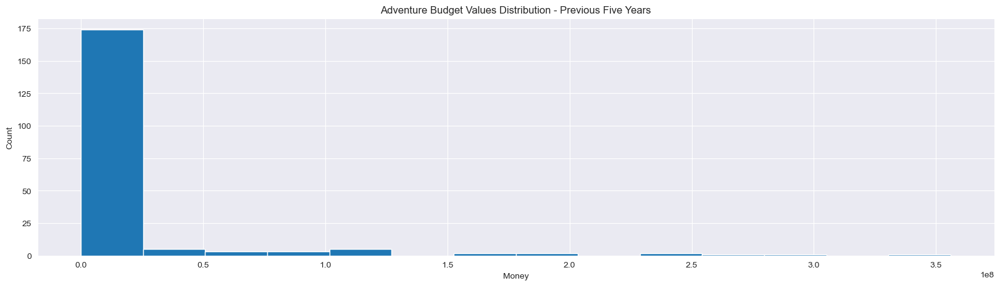

BUDGET Median = 42000.0, Mean = 18068828.608040202
count    1.990000e+02
mean     1.806883e+07
std      5.464325e+07
min      1.000000e+00
25%      2.000000e+03
50%      4.200000e+04
75%      1.262352e+06
max      3.560000e+08
Name: budget, dtype: float64


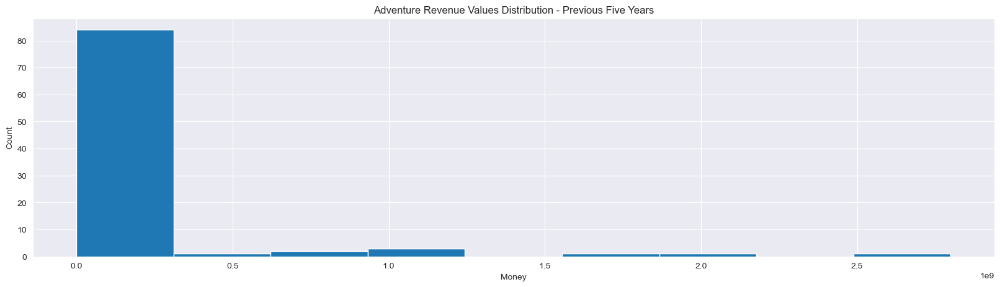

REVENUE Median = 786800.0, Mean = 138535840.95698926
count    9.300000e+01
mean     1.385358e+08
std      4.394150e+08
min      1.000000e+00
25%      5.381500e+04
50%      7.868000e+05
75%      1.900204e+07
max      2.799439e+09
Name: revenue, dtype: float64


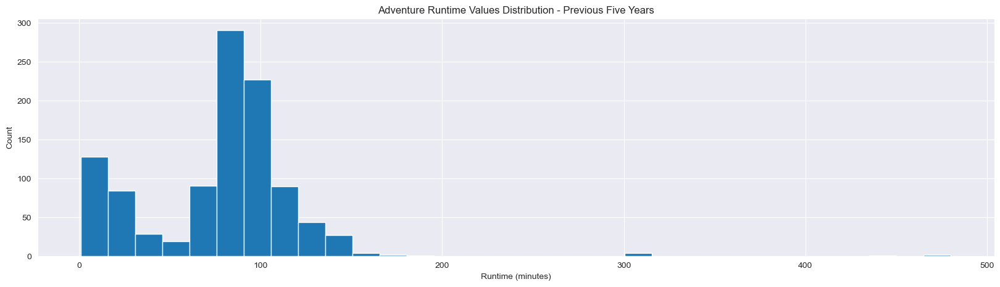

RUNTIME Median = 87.0, Mean = 77.8735632183908
count    1044.000000
mean       77.873563
std        44.661884
min         1.000000
25%        61.000000
50%        87.000000
75%        98.000000
max       480.000000
Name: runtime, dtype: float64


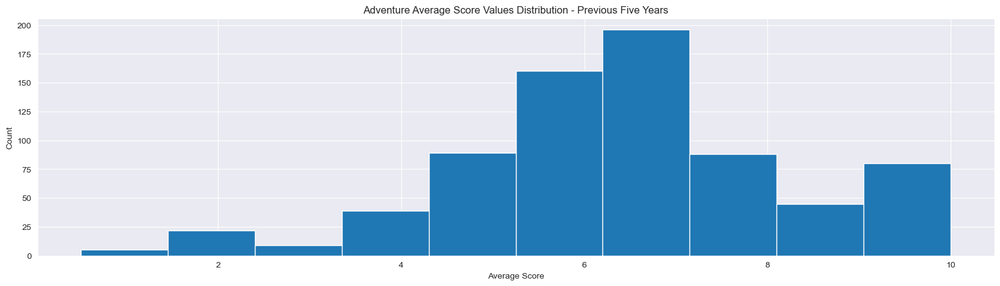

SCORE Median = 6.6, Mean = 6.520826739427013
count    733.000000
mean       6.520827
std        1.920803
min        0.500000
25%        5.500000
50%        6.600000
75%        7.500000
max       10.000000
Name: vote_average, dtype: float64


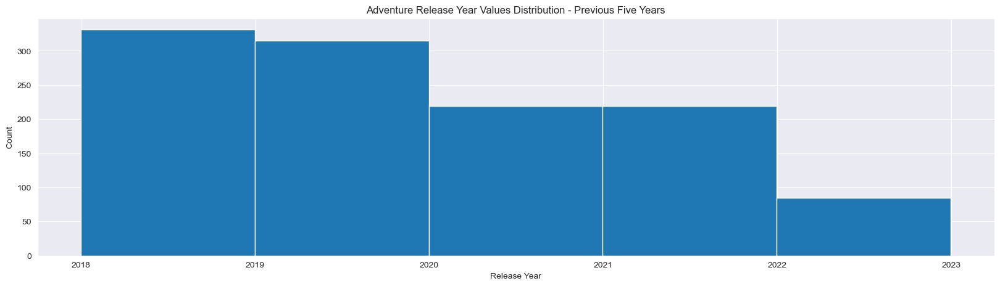

RELEASE DATE Median = 2019-11-01 00:00:00, Mean = 2019-12-21 20:46:36.236099072
count                             1169
mean     2019-12-21 20:46:36.236099072
min                2018-01-01 00:00:00
25%                2018-11-24 00:00:00
50%                2019-11-01 00:00:00
75%                2021-01-17 00:00:00
max                2022-12-31 00:00:00
Name: release_date, dtype: object


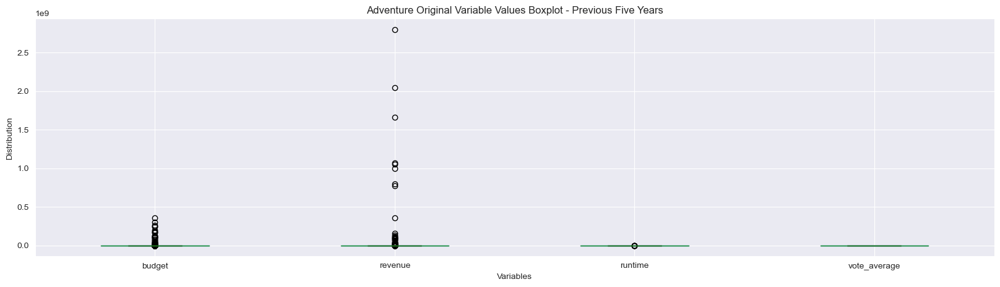

In [68]:
#Show distribution of previous 5 Year Adventure variable values
n_data = len(adv5b_movies.budget)
n_bins = np.sqrt(n_data)
n_bins = int(n_bins)
_ =plt.hist(adv5b_movies.budget, bins=n_bins)
plt.title('Adventure Budget Values Distribution - Previous Five Years')
plt.xlabel('Money')
plt.ylabel('Count')
plt.show()

#Calculate median and mean values for variables
print(f"BUDGET Median = {adv5b_movies.budget.median()}, Mean = {adv5b_movies.budget.mean()}")
print(adv5b_movies.budget.describe())

n_data = len(adv5r_movies.revenue)
n_bins = np.sqrt(n_data)
n_bins = int(n_bins)
_ =plt.hist(adv5r_movies.revenue, bins=n_bins)
plt.title('Adventure Revenue Values Distribution - Previous Five Years')
plt.xlabel('Money')
plt.ylabel('Count')
plt.show()

print(f"REVENUE Median = {adv5r_movies.revenue.median()}, Mean = {adv5r_movies.revenue.mean()}")
print(adv5r_movies.revenue.describe())

n_data = len(adv5d_movies.runtime)
n_bins = np.sqrt(n_data)
n_bins = int(n_bins)
_ =plt.hist(adv5d_movies.runtime, bins=n_bins)
plt.title('Adventure Runtime Values Distribution - Previous Five Years')
plt.xlabel('Runtime (minutes)')
plt.ylabel('Count')
plt.show()

print(f"RUNTIME Median = {adv5d_movies.runtime.median()}, Mean = {adv5d_movies.runtime.mean()}")
print(adv5d_movies.runtime.describe())

_ =plt.hist(adv5v_movies.vote_average)
plt.title('Adventure Average Score Values Distribution - Previous Five Years')
plt.xlabel('Average Score')
plt.ylabel('Count')
plt.show()

print(f"SCORE Median = {adv5v_movies.vote_average.median()}, Mean = {adv5v_movies.vote_average.mean()}")
print(adv5v_movies.vote_average.describe())

_ =plt.hist(adv5_movies.release_date, bins=5)
plt.title('Adventure Release Year Values Distribution - Previous Five Years')
plt.xlabel('Release Year')
plt.ylabel('Count')
plt.show()

print(f"RELEASE DATE Median = {adv5_movies.release_date.median()}, Mean = {adv5_movies.release_date.mean()}")
print(adv5_movies.release_date.describe(datetime_is_numeric=True))

adv5_movies.boxplot(column=['budget', 'revenue', 'runtime', 'vote_average'])
plt.title('Adventure Original Variable Values Boxplot - Previous Five Years')
plt.xlabel('Variables')
plt.ylabel('Distribution')
plt.show()

In [69]:
#Drop zero values from 5 Year Animation variables. 
#Create a seperate dataframe for each so as not to affect the other variables calculations.
ani5b_movies = ani5_movies[ani5_movies['budget'] !=0]
ani5r_movies = ani5_movies[ani5_movies['revenue'] !=0]
ani5d_movies = ani5_movies[ani5_movies['runtime'] !=0]
ani5v_movies = ani5_movies[ani5_movies['vote_average'] !=0]

#Remove Outliers from 5 Year Comedy variables and 
Q1 = ani5b_movies.budget.quantile(0.25)
Q3 = ani5b_movies.budget.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(ani5b_movies['budget']>=upper_limit)[0]
lower_array = np.where(ani5b_movies['budget']<=lower_limit)[0]
ani5b_movies['budget'].drop(index=upper_array, inplace=True)
ani5b_movies['budget'].drop(index=lower_array, inplace=True)

Q1 = ani5r_movies.revenue.quantile(0.25)
Q3 = ani5r_movies.revenue.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(ani5r_movies['revenue']>=upper_limit)[0]
lower_array = np.where(ani5r_movies['revenue']<=lower_limit)[0]
ani5r_movies['revenue'].drop(index=upper_array, inplace=True)
ani5r_movies['revenue'].drop(index=lower_array, inplace=True)

Q1 = ani5d_movies.runtime.quantile(0.25)
Q3 = ani5d_movies.runtime.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(ani5d_movies['runtime']>=upper_limit)[0]
lower_array = np.where(ani5d_movies['runtime']<=lower_limit)[0]
ani5d_movies['runtime'].drop(index=upper_array, inplace=True)
ani5d_movies['runtime'].drop(index=lower_array, inplace=True)

Q1 = ani5v_movies.vote_average.quantile(0.25)
Q3 = ani5v_movies.vote_average.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(ani5v_movies['vote_average']>=upper_limit)[0]
lower_array = np.where(ani5v_movies['vote_average']<=lower_limit)[0]
ani5v_movies['vote_average'].drop(index=upper_array, inplace=True)
ani5v_movies['vote_average'].drop(index=lower_array, inplace=True)

KeyError: '[1, 3, 5, 6, 8, 9, 10, 11, 15, 16, 18, 20, 21, 22, 23, 26, 28, 29, 30, 33, 34, 36, 37, 38, 41, 42, 43, 45, 47, 49, 50, 53, 61, 73, 78, 102, 103, 105, 121, 143] not found in axis'

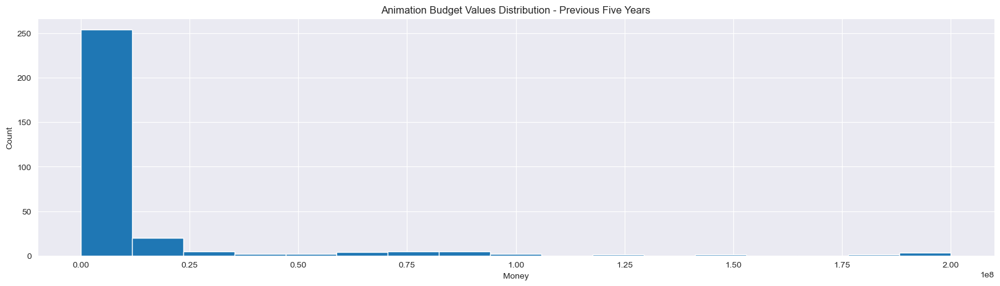

BUDGET Median = 5000.0, Mean = 10278996.449180327
count    3.050000e+02
mean     1.027900e+07
std      3.039267e+07
min      1.000000e+00
25%      3.000000e+02
50%      5.000000e+03
75%      2.000000e+06
max      2.000000e+08
Name: budget, dtype: float64


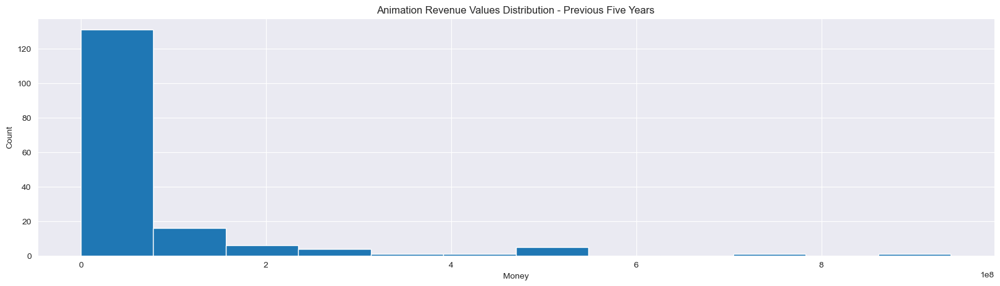

REVENUE Median = 4977608.5, Mean = 62062698.06626506
count    1.660000e+02
mean     6.206270e+07
std      1.384346e+08
min      1.000000e+00
25%      4.357870e+05
50%      4.977608e+06
75%      4.143255e+07
max      9.396282e+08
Name: revenue, dtype: float64


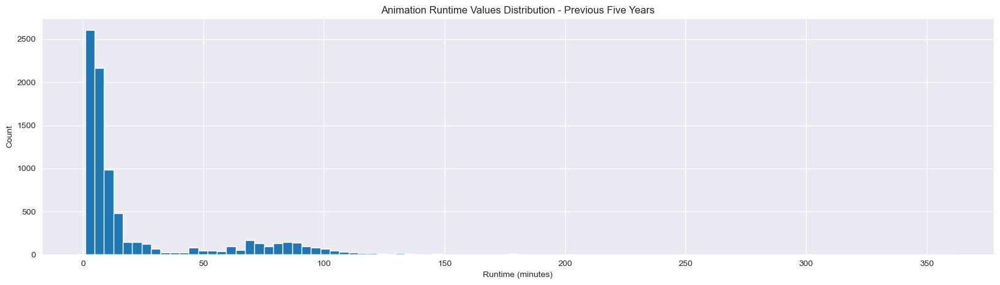

RUNTIME Median = 7.0, Mean = 22.12843382090617
count    8409.000000
mean       22.128434
std        32.482718
min         1.000000
25%         4.000000
50%         7.000000
75%        18.000000
max       360.000000
Name: runtime, dtype: float64


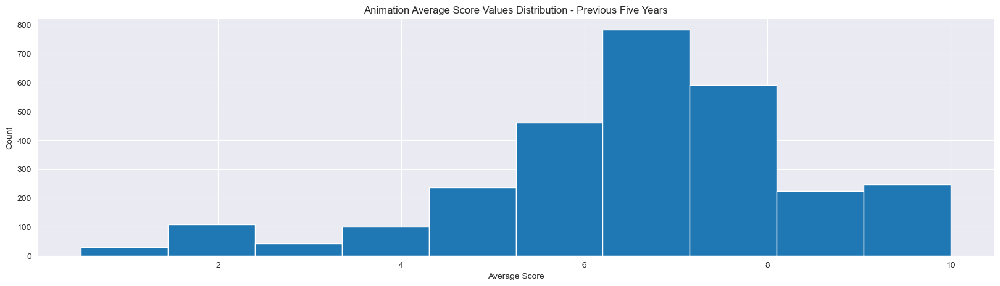

SCORE Median = 7.0, Mean = 6.678786246012031
count    2821.000000
mean        6.678786
std         1.876340
min         0.500000
25%         6.000000
50%         7.000000
75%         7.800000
max        10.000000
Name: vote_average, dtype: float64


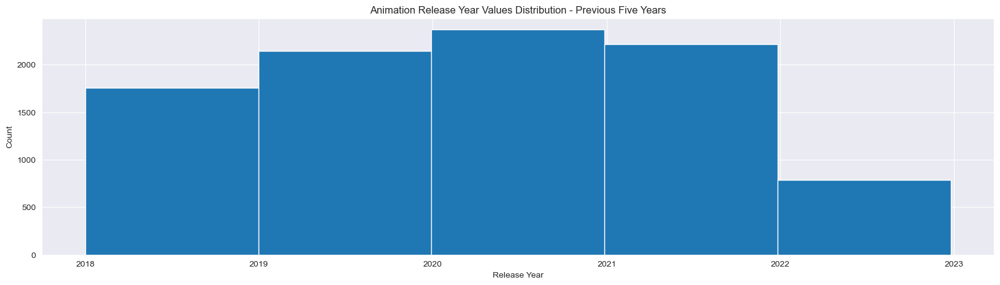

RELEASE DATE Median = 2020-05-22 00:00:00, Mean = 2020-04-16 15:06:04.778245376
count                             9267
mean     2020-04-16 15:06:04.778245376
min                2018-01-01 00:00:00
25%                2019-03-31 00:00:00
50%                2020-05-22 00:00:00
75%                2021-05-01 00:00:00
max                2022-12-25 00:00:00
Name: release_date, dtype: object


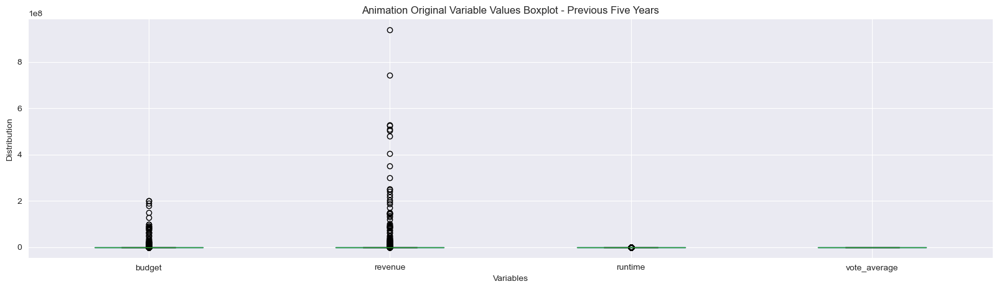

In [70]:
#Show distribution of previous 5 Year Animation variable values
n_data = len(ani5b_movies.budget)
n_bins = np.sqrt(n_data)
n_bins = int(n_bins)
_ =plt.hist(ani5b_movies.budget, bins=n_bins)
plt.title('Animation Budget Values Distribution - Previous Five Years')
plt.xlabel('Money')
plt.ylabel('Count')
plt.show()

#Calculate median and mean values for variables
print(f"BUDGET Median = {ani5b_movies.budget.median()}, Mean = {ani5b_movies.budget.mean()}")
print(ani5b_movies.budget.describe())

n_data = len(ani5r_movies.revenue)
n_bins = np.sqrt(n_data)
n_bins = int(n_bins)
_ =plt.hist(ani5r_movies.revenue, bins=n_bins)
plt.title('Animation Revenue Values Distribution - Previous Five Years')
plt.xlabel('Money')
plt.ylabel('Count')
plt.show()

print(f"REVENUE Median = {ani5r_movies.revenue.median()}, Mean = {ani5r_movies.revenue.mean()}")
print(ani5r_movies.revenue.describe())

n_data = len(ani5d_movies.runtime)
n_bins = np.sqrt(n_data)
n_bins = int(n_bins)
_ =plt.hist(ani5d_movies.runtime, bins=n_bins)
plt.title('Animation Runtime Values Distribution - Previous Five Years')
plt.xlabel('Runtime (minutes)')
plt.ylabel('Count')
plt.show()

print(f"RUNTIME Median = {ani5d_movies.runtime.median()}, Mean = {ani5d_movies.runtime.mean()}")
print(ani5d_movies.runtime.describe())

_ =plt.hist(ani5v_movies.vote_average)
plt.title('Animation Average Score Values Distribution - Previous Five Years')
plt.xlabel('Average Score')
plt.ylabel('Count')
plt.show()

print(f"SCORE Median = {ani5v_movies.vote_average.median()}, Mean = {ani5v_movies.vote_average.mean()}")
print(ani5v_movies.vote_average.describe())

_ =plt.hist(ani5_movies.release_date, bins=5)
plt.title('Animation Release Year Values Distribution - Previous Five Years')
plt.xlabel('Release Year')
plt.ylabel('Count')
plt.show()

print(f"RELEASE DATE Median = {ani5_movies.release_date.median()}, Mean = {ani5_movies.release_date.mean()}")
print(ani5_movies.release_date.describe(datetime_is_numeric=True))

ani5_movies.boxplot(column=['budget', 'revenue', 'runtime', 'vote_average'])
plt.title('Animation Original Variable Values Boxplot - Previous Five Years')
plt.xlabel('Variables')
plt.ylabel('Distribution')
plt.show()

In [71]:
#Drop zero values from 5 Year Comedy variables. 
#Create a seperate dataframe for each so as not to affect the other variables calculations.
com5b_movies = com5_movies[com5_movies['budget'] !=0]
com5r_movies = com5_movies[com5_movies['revenue'] !=0]
com5d_movies = com5_movies[com5_movies['runtime'] !=0]
com5v_movies = com5_movies[com5_movies['vote_average'] !=0]

#Remove Outliers from 5 Year Comedy variables and 
Q1 = com5b_movies.budget.quantile(0.25)
Q3 = com5b_movies.budget.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(com5b_movies['budget']>=upper_limit)[0]
lower_array = np.where(com5b_movies['budget']<=lower_limit)[0]
com5b_movies['budget'].drop(index=upper_array, inplace=True)
com5b_movies['budget'].drop(index=lower_array, inplace=True)

Q1 = com5r_movies.revenue.quantile(0.25)
Q3 = com5r_movies.revenue.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(com5r_movies['revenue']>=upper_limit)[0]
lower_array = np.where(com5r_movies['revenue']<=lower_limit)[0]
com5r_movies['revenue'].drop(index=upper_array, inplace=True)
com5r_movies['revenue'].drop(index=lower_array, inplace=True)

Q1 = com5d_movies.runtime.quantile(0.25)
Q3 = com5d_movies.runtime.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(com5d_movies['runtime']>=upper_limit)[0]
lower_array = np.where(com5d_movies['runtime']<=lower_limit)[0]
com5d_movies['runtime'].drop(index=upper_array, inplace=True)
com5d_movies['runtime'].drop(index=lower_array, inplace=True)

Q1 = com5v_movies.vote_average.quantile(0.25)
Q3 = com5v_movies.vote_average.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(com5v_movies['vote_average']>=upper_limit)[0]
lower_array = np.where(com5v_movies['vote_average']<=lower_limit)[0]
com5v_movies['vote_average'].drop(index=upper_array, inplace=True)
com5v_movies['vote_average'].drop(index=lower_array, inplace=True)

KeyError: '[0, 1, 3, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 16, 17, 18, 19, 20, 21, 24, 25, 28, 29, 31, 33, 34, 35, 36, 38, 39, 40, 41, 42, 44, 45, 48, 49, 50, 51, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 89, 90, 91, 93, 94, 95, 96, 98, 100, 105, 106, 114, 115, 116, 117, 123, 124, 125, 126, 127, 128, 129, 130, 131, 136, 137, 138, 139, 140, 142, 143, 144, 147, 149, 150, 152, 153, 154, 155, 156, 157, 158, 168, 170, 173, 174, 175, 176, 177, 179, 180, 181, 182, 184, 185, 186, 187, 191, 194, 196, 197, 207, 212, 214, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 234, 235, 238, 240, 242, 243, 244, 245, 246, 250, 251, 252, 254, 255, 256, 267, 268, 269, 270, 272, 279, 280, 281, 282, 283, 285, 286, 288, 289, 290, 293, 294, 298, 300, 301, 302, 311, 322, 323, 367, 373, 377, 378, 379, 380, 386, 387, 388, 389, 391, 392, 393, 394, 395, 396, 398, 399, 400, 401, 403, 404, 405, 406, 407, 409, 410, 411, 413, 414, 415, 416, 447, 457, 464, 465, 466, 467, 469, 470, 471, 485, 514, 515, 516, 517, 518, 519, 520, 521, 522, 523, 536, 558, 568, 582, 583, 597, 618, 630, 631, 632, 633, 635, 637, 638, 657, 665, 689, 700, 748, 759, 760, 768, 769, 770, 771, 772, 807, 808, 809, 810, 841, 843, 844, 845, 846, 848, 849, 850, 851, 854, 868, 869, 870, 871, 872, 873, 874, 875, 876, 880, 902, 904, 917, 918, 919, 984, 985, 988, 1000, 1001, 1002, 1003, 1061, 1082, 1083, 1097, 1100, 1106, 1179, 1180, 1181, 1182, 1287, 1549, 1652, 1897] not found in axis'

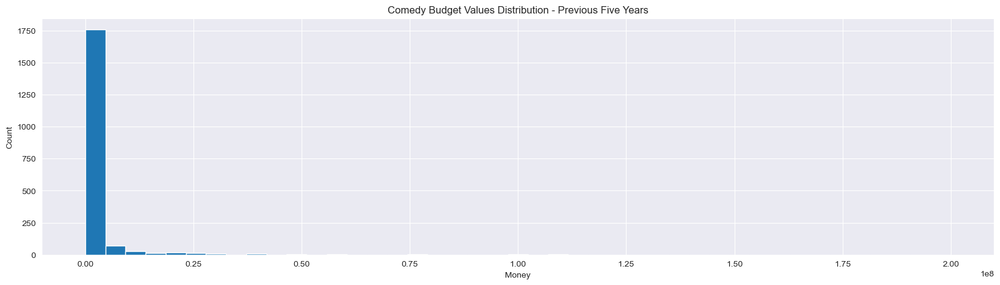

BUDGET Median = 12000.0, Mean = 2011929.163116883
count    1.925000e+03
mean     2.011929e+06
std      9.320022e+06
min      1.000000e+00
25%      6.150000e+02
50%      1.200000e+04
75%      2.500000e+05
max      2.000000e+08
Name: budget, dtype: float64


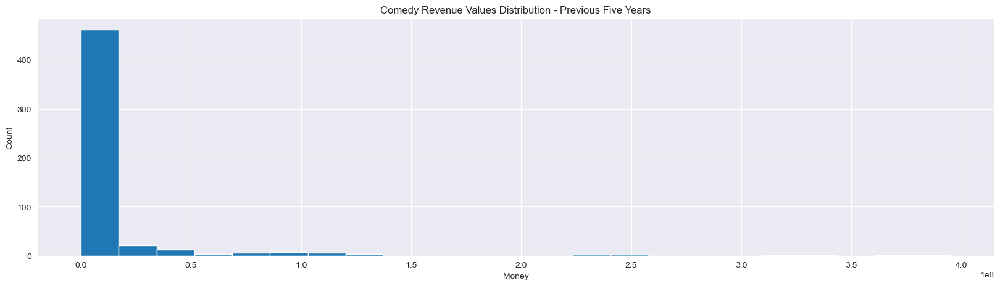

REVENUE Median = 820051.0, Mean = 13058249.824528301
count    5.300000e+02
mean     1.305825e+07
std      4.223361e+07
min      1.000000e+00
25%      2.425000e+04
50%      8.200510e+05
75%      4.812216e+06
max      3.950447e+08
Name: revenue, dtype: float64


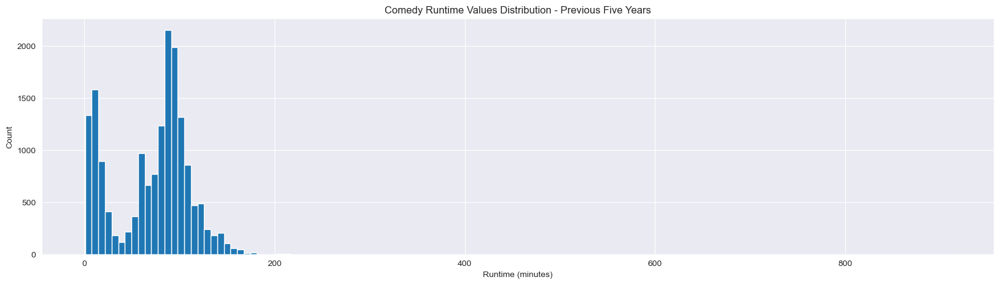

RUNTIME Median = 83.0, Mean = 71.20403838229234
count    16987.000000
mean        71.204038
std         42.670049
min          1.000000
25%         29.000000
50%         83.000000
75%         98.000000
max        911.000000
Name: runtime, dtype: float64


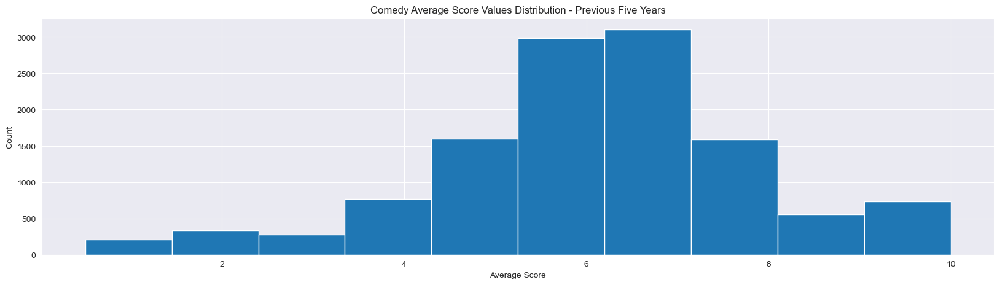

SCORE Median = 6.1, Mean = 6.147248028261645
count    12172.000000
mean         6.147248
std          1.829863
min          0.500000
25%          5.200000
50%          6.100000
75%          7.100000
max         10.000000
Name: vote_average, dtype: float64


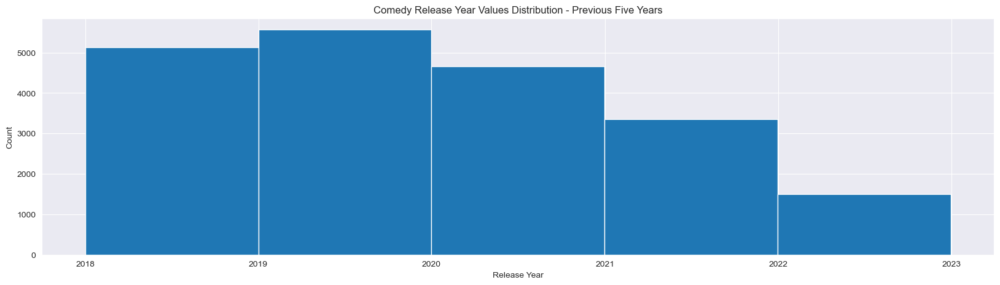

RELEASE DATE Median = 2019-11-27 00:00:00, Mean = 2020-01-10 15:00:10.686720768
count                            20212
mean     2020-01-10 15:00:10.686720768
min                2018-01-01 00:00:00
25%                2018-12-27 00:00:00
50%                2019-11-27 00:00:00
75%                2020-12-17 00:00:00
max                2022-12-31 00:00:00
Name: release_date, dtype: object


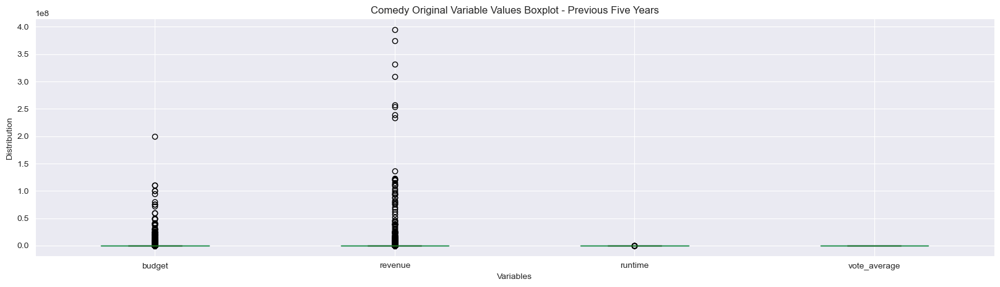

In [72]:
#Show distribution of previous 5 Year Comedy variable values
n_data = len(com5b_movies.budget)
n_bins = np.sqrt(n_data)
n_bins = int(n_bins)
_ =plt.hist(com5b_movies.budget, bins=n_bins)
plt.title('Comedy Budget Values Distribution - Previous Five Years')
plt.xlabel('Money')
plt.ylabel('Count')
plt.show()

#Calculate median and mean values for variables
print(f"BUDGET Median = {com5b_movies.budget.median()}, Mean = {com5b_movies.budget.mean()}")
print(com5b_movies.budget.describe())

n_data = len(com5r_movies.revenue)
n_bins = np.sqrt(n_data)
n_bins = int(n_bins)
_ =plt.hist(com5r_movies.revenue, bins=n_bins)
plt.title('Comedy Revenue Values Distribution - Previous Five Years')
plt.xlabel('Money')
plt.ylabel('Count')
plt.show()

print(f"REVENUE Median = {com5r_movies.revenue.median()}, Mean = {com5r_movies.revenue.mean()}")
print(com5r_movies.revenue.describe())

n_data = len(com5d_movies.runtime)
n_bins = np.sqrt(n_data)
n_bins = int(n_bins)
_ =plt.hist(com5d_movies.runtime, bins=n_bins)
plt.title('Comedy Runtime Values Distribution - Previous Five Years')
plt.xlabel('Runtime (minutes)')
plt.ylabel('Count')
plt.show()

print(f"RUNTIME Median = {com5d_movies.runtime.median()}, Mean = {com5d_movies.runtime.mean()}")
print(com5d_movies.runtime.describe())

_ =plt.hist(com5v_movies.vote_average)
plt.title('Comedy Average Score Values Distribution - Previous Five Years')
plt.xlabel('Average Score')
plt.ylabel('Count')
plt.show()

print(f"SCORE Median = {com5v_movies.vote_average.median()}, Mean = {com5v_movies.vote_average.mean()}")
print(com5v_movies.vote_average.describe())

_ =plt.hist(com5_movies.release_date, bins=5)
plt.title('Comedy Release Year Values Distribution - Previous Five Years')
plt.xlabel('Release Year')
plt.ylabel('Count')
plt.show()

print(f"RELEASE DATE Median = {com5_movies.release_date.median()}, Mean = {com5_movies.release_date.mean()}")
print(com5_movies.release_date.describe(datetime_is_numeric=True))

com5_movies.boxplot(column=['budget', 'revenue', 'runtime', 'vote_average'])
plt.title('Comedy Original Variable Values Boxplot - Previous Five Years')
plt.xlabel('Variables')
plt.ylabel('Distribution')
plt.show()

In [73]:
#Drop zero values from 5 Year Crime variables. 
#Create a seperate dataframe for each so as not to affect the other variables calculations.
cri5b_movies = cri5_movies[cri5_movies['budget'] !=0]
cri5r_movies = cri5_movies[cri5_movies['revenue'] !=0]
cri5d_movies = cri5_movies[cri5_movies['runtime'] !=0]
cri5v_movies = cri5_movies[cri5_movies['vote_average'] !=0]

#Remove Outliers from 5 Year Crime variables and 
Q1 = cri5b_movies.budget.quantile(0.25)
Q3 = cri5b_movies.budget.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(cri5b_movies['budget']>=upper_limit)[0]
lower_array = np.where(cri5b_movies['budget']<=lower_limit)[0]
cri5b_movies['budget'].drop(index=upper_array, inplace=True)
cri5b_movies['budget'].drop(index=lower_array, inplace=True)

Q1 = cri5r_movies.revenue.quantile(0.25)
Q3 = cri5r_movies.revenue.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(cri5r_movies['revenue']>=upper_limit)[0]
lower_array = np.where(cri5r_movies['revenue']<=lower_limit)[0]
cri5r_movies['revenue'].drop(index=upper_array, inplace=True)
cri5r_movies['revenue'].drop(index=lower_array, inplace=True)

Q1 = cri5d_movies.runtime.quantile(0.25)
Q3 = cri5d_movies.runtime.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(cri5d_movies['runtime']>=upper_limit)[0]
lower_array = np.where(cri5d_movies['runtime']<=lower_limit)[0]
cri5d_movies['runtime'].drop(index=upper_array, inplace=True)
cri5d_movies['runtime'].drop(index=lower_array, inplace=True)

Q1 = cri5v_movies.vote_average.quantile(0.25)
Q3 = cri5v_movies.vote_average.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(cri5v_movies['vote_average']>=upper_limit)[0]
lower_array = np.where(cri5v_movies['vote_average']<=lower_limit)[0]
cri5v_movies['vote_average'].drop(index=upper_array, inplace=True)
cri5v_movies['vote_average'].drop(index=lower_array, inplace=True)

KeyError: '[0, 1, 2, 7, 8, 9, 10, 13, 14, 16, 17, 23, 26, 27, 28, 30, 31, 33, 36, 37, 41, 45, 46, 49, 97, 146, 258] not found in axis'

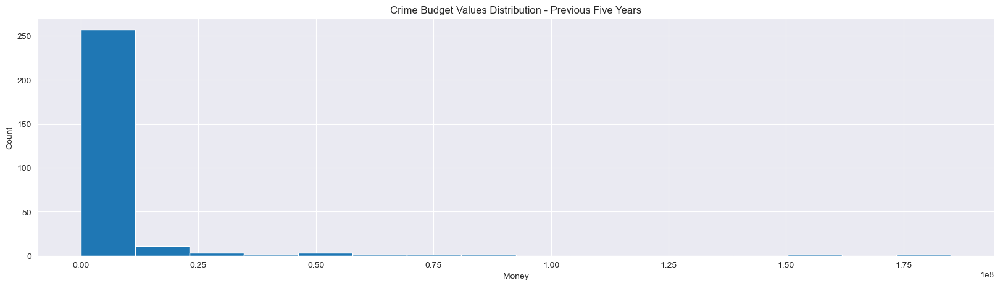

BUDGET Median = 10000.0, Mean = 4399706.414285715
count    2.800000e+02
mean     4.399706e+06
std      1.765147e+07
min      1.000000e+00
25%      5.000000e+02
50%      1.000000e+04
75%      1.000000e+06
max      1.850000e+08
Name: budget, dtype: float64


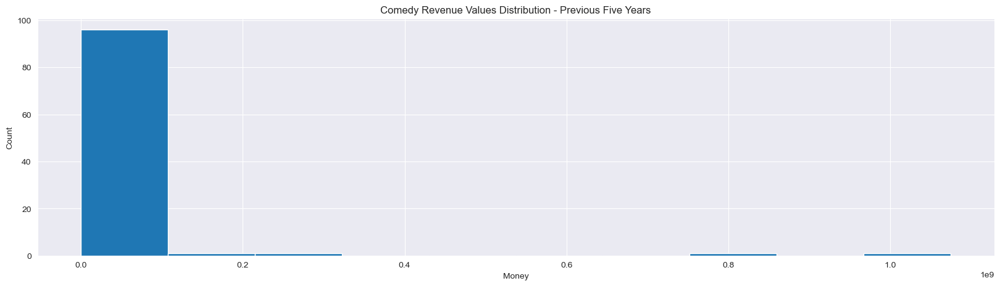

REVENUE Median = 548000.0, Mean = 29818787.09
count    1.000000e+02
mean     2.981879e+07
std      1.351313e+08
min      1.000000e+00
25%      1.350000e+05
50%      5.480000e+05
75%      4.795683e+06
max      1.074458e+09
Name: revenue, dtype: float64


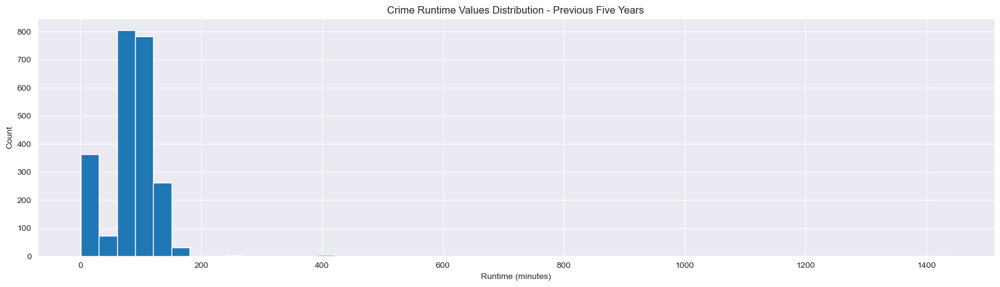

RUNTIME Median = 90.0, Mean = 85.85064377682403
count    2330.000000
mean       85.850644
std        49.191663
min         1.000000
25%        76.000000
50%        90.000000
75%       107.000000
max      1440.000000
Name: runtime, dtype: float64


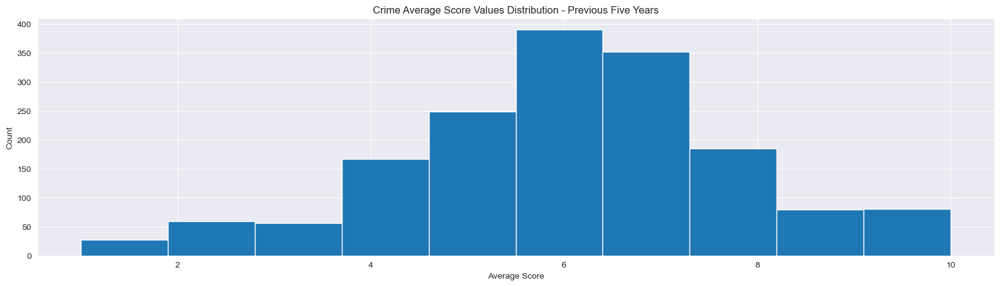

SCORE Median = 6.0, Mean = 6.010542527339002
count    1646.000000
mean        6.010543
std         1.826059
min         1.000000
25%         5.000000
50%         6.000000
75%         7.000000
max        10.000000
Name: vote_average, dtype: float64


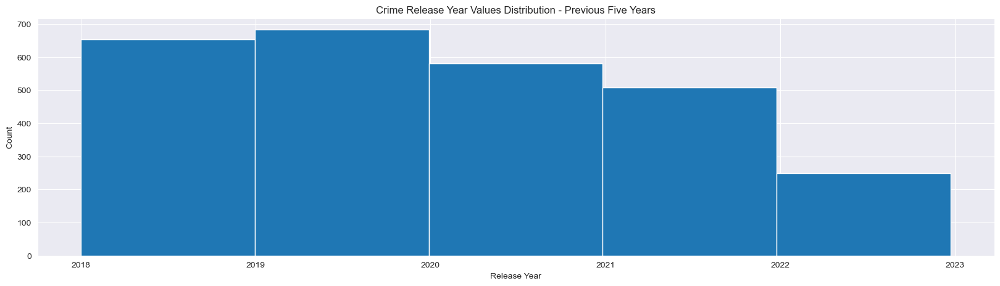

RELEASE DATE Median = 2019-12-30 12:00:00, Mean = 2020-02-18 00:29:35.784753408
count                             2676
mean     2020-02-18 00:29:35.784753408
min                2018-01-01 00:00:00
25%                2019-01-17 18:00:00
50%                2019-12-30 12:00:00
75%                2021-02-19 00:00:00
max                2022-12-23 00:00:00
Name: release_date, dtype: object


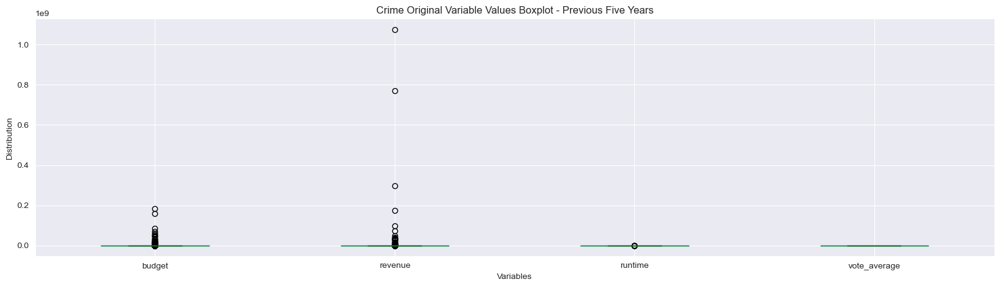

In [74]:
#Show distribution of previous 5 Year Crime variable values
n_data = len(cri5b_movies.budget)
n_bins = np.sqrt(n_data)
n_bins = int(n_bins)
_ =plt.hist(cri5b_movies.budget, bins=n_bins)
plt.title('Crime Budget Values Distribution - Previous Five Years')
plt.xlabel('Money')
plt.ylabel('Count')
plt.show()

#Calculate median and mean values for variables
print(f"BUDGET Median = {cri5b_movies.budget.median()}, Mean = {cri5b_movies.budget.mean()}")
print(cri5b_movies.budget.describe())

n_data = len(cri5r_movies.revenue)
n_bins = np.sqrt(n_data)
n_bins = int(n_bins)
_ =plt.hist(cri5r_movies.revenue, bins=n_bins)
plt.title('Comedy Revenue Values Distribution - Previous Five Years')
plt.xlabel('Money')
plt.ylabel('Count')
plt.show()

print(f"REVENUE Median = {cri5r_movies.revenue.median()}, Mean = {cri5r_movies.revenue.mean()}")
print(cri5r_movies.revenue.describe())

n_data = len(cri5d_movies.runtime)
n_bins = np.sqrt(n_data)
n_bins = int(n_bins)
_ =plt.hist(cri5d_movies.runtime, bins=n_bins)
plt.title('Crime Runtime Values Distribution - Previous Five Years')
plt.xlabel('Runtime (minutes)')
plt.ylabel('Count')
plt.show()

print(f"RUNTIME Median = {cri5d_movies.runtime.median()}, Mean = {cri5d_movies.runtime.mean()}")
print(cri5d_movies.runtime.describe())

_ =plt.hist(cri5v_movies.vote_average)
plt.title('Crime Average Score Values Distribution - Previous Five Years')
plt.xlabel('Average Score')
plt.ylabel('Count')
plt.show()

print(f"SCORE Median = {cri5v_movies.vote_average.median()}, Mean = {cri5v_movies.vote_average.mean()}")
print(cri5v_movies.vote_average.describe())

_ =plt.hist(cri5_movies.release_date, bins=5)
plt.title('Crime Release Year Values Distribution - Previous Five Years')
plt.xlabel('Release Year')
plt.ylabel('Count')
plt.show()

print(f"RELEASE DATE Median = {cri5_movies.release_date.median()}, Mean = {cri5_movies.release_date.mean()}")
print(cri5_movies.release_date.describe(datetime_is_numeric=True))

cri5_movies.boxplot(column=['budget', 'revenue', 'runtime', 'vote_average'])
plt.title('Crime Original Variable Values Boxplot - Previous Five Years')
plt.xlabel('Variables')
plt.ylabel('Distribution')
plt.show()

In [75]:
#Drop zero values from 5 Year Documentary variables. 
#Create a seperate dataframe for each so as not to affect the other variables calculations.
doc5b_movies = doc5_movies[doc5_movies['budget'] !=0]
doc5r_movies = doc5_movies[doc5_movies['revenue'] !=0]
doc5d_movies = doc5_movies[doc5_movies['runtime'] !=0]
doc5v_movies = doc5_movies[doc5_movies['vote_average'] !=0]

#Remove Outliers from 5 Year Documentary variables and 
Q1 = doc5b_movies.budget.quantile(0.25)
Q3 = doc5b_movies.budget.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(doc5b_movies['budget']>=upper_limit)[0]
lower_array = np.where(doc5b_movies['budget']<=lower_limit)[0]
doc5b_movies['budget'].drop(index=upper_array, inplace=True)
doc5b_movies['budget'].drop(index=lower_array, inplace=True)

Q1 = doc5r_movies.revenue.quantile(0.25)
Q3 = doc5r_movies.revenue.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(doc5r_movies['revenue']>=upper_limit)[0]
lower_array = np.where(doc5r_movies['revenue']<=lower_limit)[0]
doc5r_movies['revenue'].drop(index=upper_array, inplace=True)
doc5r_movies['revenue'].drop(index=lower_array, inplace=True)

Q1 = doc5d_movies.runtime.quantile(0.25)
Q3 = doc5d_movies.runtime.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(doc5d_movies['runtime']>=upper_limit)[0]
lower_array = np.where(doc5d_movies['runtime']<=lower_limit)[0]
doc5d_movies['runtime'].drop(index=upper_array, inplace=True)
doc5d_movies['runtime'].drop(index=lower_array, inplace=True)

Q1 = doc5v_movies.vote_average.quantile(0.25)
Q3 = doc5v_movies.vote_average.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(doc5v_movies['vote_average']>=upper_limit)[0]
lower_array = np.where(doc5v_movies['vote_average']<=lower_limit)[0]
doc5v_movies['vote_average'].drop(index=upper_array, inplace=True)
doc5v_movies['vote_average'].drop(index=lower_array, inplace=True)

KeyError: '[0, 20, 21, 22, 24, 25, 26, 27, 30, 31, 32, 33, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 58, 59, 64, 65, 66, 67, 68, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 91, 92, 93, 94, 151, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 205, 206, 207, 208, 209, 210, 211, 212, 213, 229, 241, 242, 243, 244, 245, 264, 265, 266, 267, 281, 282, 310, 330, 356, 360, 361, 362, 363, 376, 377, 378, 379, 380, 381, 382, 383, 384, 393, 395, 396, 397, 398, 399, 400, 401, 402, 403, 404, 406, 407, 408, 409, 415, 416, 417, 433, 434, 435, 436, 437, 438, 476, 477, 478, 479, 489, 491, 504, 505, 507, 516, 533, 536, 537, 538, 542, 550, 571, 572, 573, 574, 575, 576, 577, 578, 579, 609, 616, 624, 629, 646, 647, 648, 649, 655, 688, 701, 702, 703, 704, 725, 726, 727, 728, 736, 737, 738, 739, 740, 751, 752, 753, 754, 765, 857, 858, 877, 878, 953, 960, 1000, 1046, 1057, 1058, 1059, 1060, 1140, 1144, 1145, 1154, 1177, 1232, 1233, 1237, 1307, 1369, 1384, 1389, 1471, 1579, 1602, 1609, 1656] not found in axis'

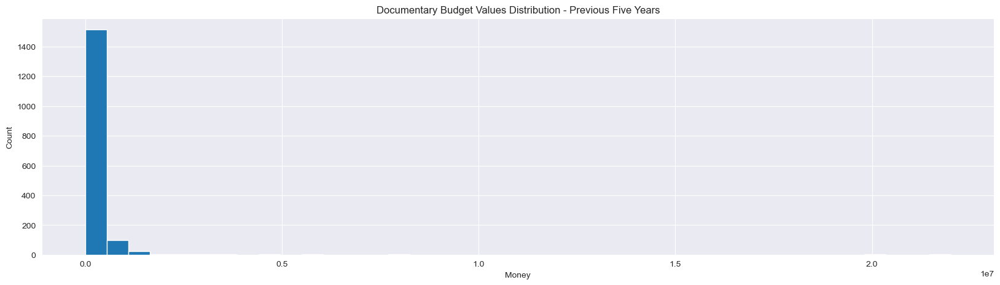

BUDGET Median = 20000.0, Mean = 247187.17611580217
count    1.658000e+03
mean     2.471872e+05
std      1.322883e+06
min      1.000000e+00
25%      1.000000e+03
50%      2.000000e+04
75%      1.500000e+05
max      2.200000e+07
Name: budget, dtype: float64


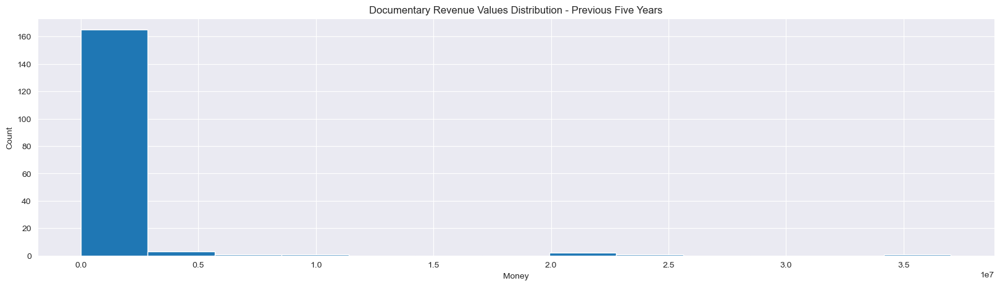

REVENUE Median = 18653.0, Mean = 1017411.643678161
count    1.740000e+02
mean     1.017412e+06
std      4.089043e+06
min      1.000000e+00
25%      1.000000e+02
50%      1.865300e+04
75%      4.728990e+05
max      3.700000e+07
Name: revenue, dtype: float64


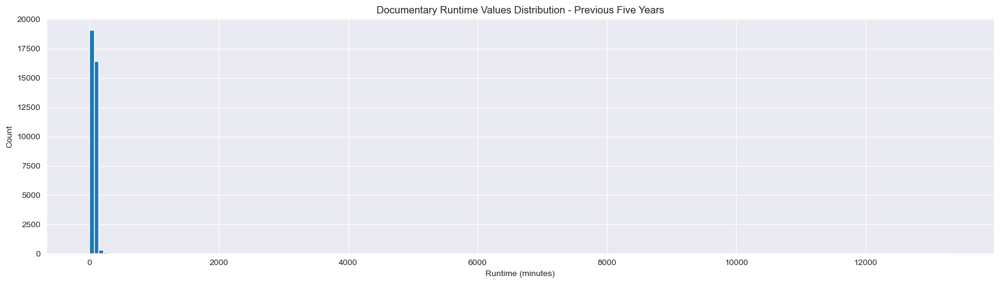

RUNTIME Median = 67.0, Mean = 63.12751863861866
count    36081.000000
mean        63.127519
std         80.233603
min          1.000000
25%         30.000000
50%         67.000000
75%         88.000000
max      13319.000000
Name: runtime, dtype: float64


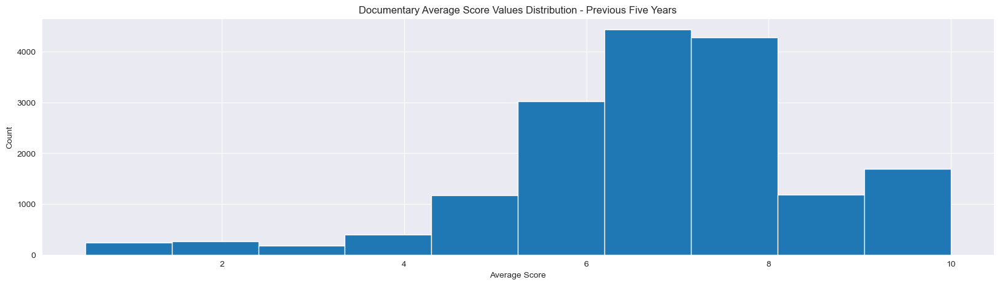

SCORE Median = 7.0, Mean = 6.920802763446655
count    16863.000000
mean         6.920803
std          1.766608
min          0.500000
25%          6.000000
50%          7.000000
75%          8.000000
max         10.000000
Name: vote_average, dtype: float64


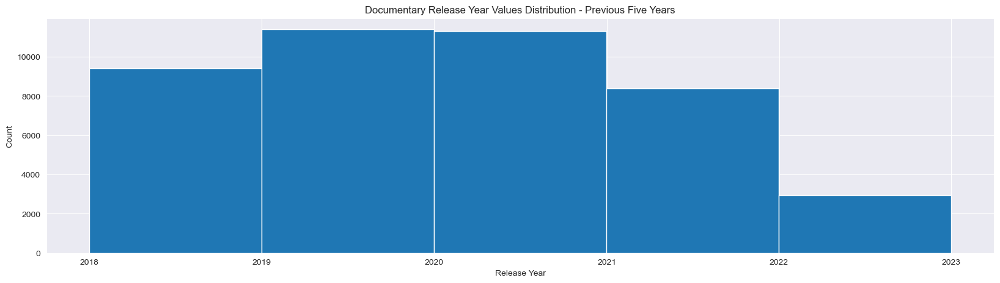

RELEASE DATE Median = 2020-01-27 00:00:00, Mean = 2020-02-15 13:16:58.917924352
count                            43472
mean     2020-02-15 13:16:58.917924352
min                2018-01-01 00:00:00
25%                2019-02-10 00:00:00
50%                2020-01-27 00:00:00
75%                2021-01-17 00:00:00
max                2022-12-31 00:00:00
Name: release_date, dtype: object


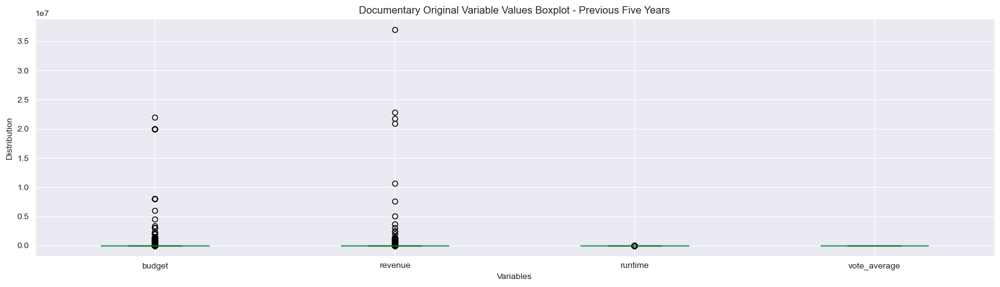

In [76]:
#Show distribution of previous 5 Year Documentary variable values
n_data = len(doc5b_movies.budget)
n_bins = np.sqrt(n_data)
n_bins = int(n_bins)
_ =plt.hist(doc5b_movies.budget, bins=n_bins)
plt.title('Documentary Budget Values Distribution - Previous Five Years')
plt.xlabel('Money')
plt.ylabel('Count')
plt.show()

#Calculate median and mean values for variables
print(f"BUDGET Median = {doc5b_movies.budget.median()}, Mean = {doc5b_movies.budget.mean()}")
print(doc5b_movies.budget.describe())

n_data = len(doc5r_movies.revenue)
n_bins = np.sqrt(n_data)
n_bins = int(n_bins)
_ =plt.hist(doc5r_movies.revenue, bins=n_bins)
plt.title('Documentary Revenue Values Distribution - Previous Five Years')
plt.xlabel('Money')
plt.ylabel('Count')
plt.show()

print(f"REVENUE Median = {doc5r_movies.revenue.median()}, Mean = {doc5r_movies.revenue.mean()}")
print(doc5r_movies.revenue.describe())

n_data = len(doc5d_movies.runtime)
n_bins = np.sqrt(n_data)
n_bins = int(n_bins)
_ =plt.hist(doc5d_movies.runtime, bins=n_bins)
plt.title('Documentary Runtime Values Distribution - Previous Five Years')
plt.xlabel('Runtime (minutes)')
plt.ylabel('Count')
plt.show()

print(f"RUNTIME Median = {doc5d_movies.runtime.median()}, Mean = {doc5d_movies.runtime.mean()}")
print(doc5d_movies.runtime.describe())

_ =plt.hist(doc5v_movies.vote_average)
plt.title('Documentary Average Score Values Distribution - Previous Five Years')
plt.xlabel('Average Score')
plt.ylabel('Count')
plt.show()

print(f"SCORE Median = {doc5v_movies.vote_average.median()}, Mean = {doc5v_movies.vote_average.mean()}")
print(doc5v_movies.vote_average.describe())

_ =plt.hist(doc5_movies.release_date, bins=5)
plt.title('Documentary Release Year Values Distribution - Previous Five Years')
plt.xlabel('Release Year')
plt.ylabel('Count')
plt.show()

print(f"RELEASE DATE Median = {doc5_movies.release_date.median()}, Mean = {doc5_movies.release_date.mean()}")
print(doc5_movies.release_date.describe(datetime_is_numeric=True))

doc5_movies.boxplot(column=['budget', 'revenue', 'runtime', 'vote_average'])
plt.title('Documentary Original Variable Values Boxplot - Previous Five Years')
plt.xlabel('Variables')
plt.ylabel('Distribution')
plt.show()

In [77]:
#Drop zero values from 5 Year Drama variables. 
#Create a seperate dataframe for each so as not to affect the other variables calculations.
dra5b_movies = dra5_movies[dra5_movies['budget'] !=0]
dra5r_movies = dra5_movies[dra5_movies['revenue'] !=0]
dra5d_movies = dra5_movies[dra5_movies['runtime'] !=0]
dra5v_movies = dra5_movies[dra5_movies['vote_average'] !=0]

#Remove Outliers from 5 Year Drama variables and 
Q1 = dra5b_movies.budget.quantile(0.25)
Q3 = dra5b_movies.budget.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(dra5b_movies['budget']>=upper_limit)[0]
lower_array = np.where(dra5b_movies['budget']<=lower_limit)[0]
dra5b_movies['budget'].drop(index=upper_array, inplace=True)
dra5b_movies['budget'].drop(index=lower_array, inplace=True)

Q1 = dra5r_movies.revenue.quantile(0.25)
Q3 = dra5r_movies.revenue.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(dra5r_movies['revenue']>=upper_limit)[0]
lower_array = np.where(dra5r_movies['revenue']<=lower_limit)[0]
dra5r_movies['revenue'].drop(index=upper_array, inplace=True)
dra5r_movies['revenue'].drop(index=lower_array, inplace=True)

Q1 = dra5d_movies.runtime.quantile(0.25)
Q3 = dra5d_movies.runtime.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(dra5d_movies['runtime']>=upper_limit)[0]
lower_array = np.where(dra5d_movies['runtime']<=lower_limit)[0]
dra5d_movies['runtime'].drop(index=upper_array, inplace=True)
dra5d_movies['runtime'].drop(index=lower_array, inplace=True)

Q1 = dra5v_movies.vote_average.quantile(0.25)
Q3 = dra5v_movies.vote_average.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(dra5v_movies['vote_average']>=upper_limit)[0]
lower_array = np.where(dra5v_movies['vote_average']<=lower_limit)[0]
dra5v_movies['vote_average'].drop(index=upper_array, inplace=True)
dra5v_movies['vote_average'].drop(index=lower_array, inplace=True)

KeyError: '[0, 1, 3, 4, 5, 6, 7, 9, 10, 11, 13, 14, 18, 19, 20, 21, 22, 23, 24, 25, 26, 28, 29, 30, 32, 33, 34, 37, 38, 39, 41, 42, 43, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 77, 78, 80, 82, 83, 89, 92, 93, 94, 95, 96, 97, 98, 103, 104, 105, 107, 108, 112, 114, 117, 118, 119, 120, 121, 122, 125, 127, 128, 129, 133, 134, 136, 137, 138, 139, 140, 141, 142, 144, 146, 147, 149, 151, 152, 155, 158, 161, 162, 164, 165, 166, 167, 168, 172, 173, 174, 175, 177, 178, 179, 180, 181, 182, 184, 185, 186, 187, 188, 189, 190, 199, 200, 201, 202, 203, 206, 208, 209, 210, 211, 213, 216, 219, 220, 221, 222, 223, 224, 225, 231, 235, 238, 239, 240, 241, 242, 243, 244, 246, 256, 257, 258, 259, 260, 262, 263, 264, 265, 266, 267, 268, 273, 274, 275, 276, 280, 281, 282, 286, 287, 289, 291, 299, 305, 315, 316, 317, 330, 334, 335, 337, 338, 339, 340, 341, 342, 343, 344, 345, 346, 347, 348, 349, 350, 351, 352, 353, 354, 355, 356, 363, 364, 365, 370, 371, 372, 373, 375, 376, 377, 378, 379, 380, 391, 392, 394, 395, 396, 397, 398, 399, 400, 401, 402, 403, 404, 406, 407, 408, 413, 415, 416, 417, 418, 420, 421, 423, 425, 426, 427, 440, 450, 454, 456, 457, 463, 464, 465, 466, 467, 469, 470, 475, 477, 479, 480, 492, 494, 495, 501, 502, 503, 504, 505, 507, 509, 510, 511, 512, 513, 514, 516, 518, 519, 520, 521, 522, 538, 541, 546, 547, 549, 550, 551, 556, 567, 568, 573, 575, 576, 578, 579, 580, 581, 592, 593, 595, 600, 602, 603, 605, 610, 611, 627, 628, 639, 641, 643, 644, 646, 647, 648, 650, 651, 653, 657, 658, 659, 660, 661, 662, 663, 664, 665, 679, 684, 685, 686, 692, 697, 698, 712, 714, 734, 741, 751, 752, 754, 757, 764, 765, 766, 767, 780, 781, 782, 783, 784, 785, 786, 787, 788, 789, 849, 851, 852, 853, 854, 868, 869, 871, 872, 873, 874, 875, 876, 878, 880, 882, 883, 884, 885, 887, 893, 894, 895, 904, 905, 926, 931, 936, 947, 949, 950, 956, 957, 958, 959, 960, 961, 962, 963, 968, 974, 975, 976, 977, 981, 982, 983, 984, 985, 986, 988, 993, 999, 1001, 1002, 1003, 1012, 1028, 1049, 1050, 1051, 1053, 1056, 1057, 1058, 1059, 1061, 1098, 1106, 1110, 1121, 1122, 1126, 1128, 1129, 1130, 1177, 1188, 1191, 1192, 1193, 1194, 1213, 1235, 1248, 1257, 1273, 1274, 1287, 1288, 1289, 1298, 1299, 1300, 1301, 1302, 1303, 1305, 1306, 1317, 1318, 1320, 1357, 1363, 1364, 1365, 1366, 1367, 1373, 1379, 1380, 1392, 1394, 1395, 1396, 1398, 1401, 1403, 1404, 1405, 1406, 1414, 1416, 1417, 1418, 1419, 1420, 1441, 1533, 1534, 1535, 1541, 1547, 1548, 1549, 1550, 1551, 1552, 1553, 1560, 1574, 1584, 1623, 1631, 1632, 1633, 1634, 1665, 1687, 1697, 1726, 1756, 1762, 1796, 1797, 1799, 1884, 1891, 1937, 1938, 1939, 1940, 1941, 1948, 1962, 1987, 2002, 2003, 2004, 2005, 2045, 2092, 2186, 2407, 2415, 2425, 2473, 2521, 2631, 2804, 2806, 2825, 2877, 2878, 2926, 2998, 3027, 3043, 3061, 3244, 3264, 3325] not found in axis'

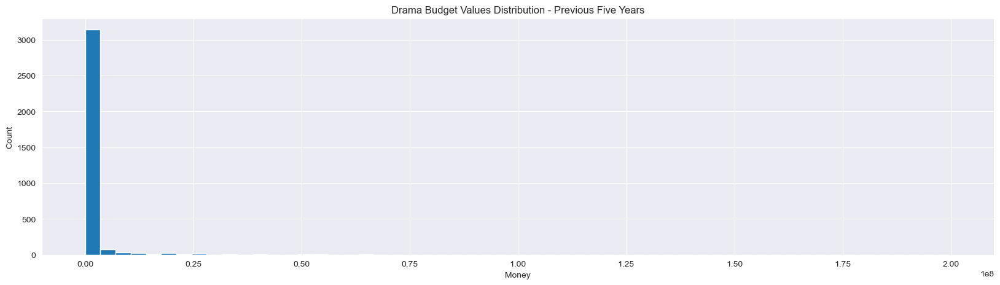

BUDGET Median = 8000.0, Mean = 1321403.76340882
count    3.356000e+03
mean     1.321404e+06
std      7.058468e+06
min      1.000000e+00
25%      7.000000e+02
50%      8.000000e+03
75%      1.100000e+05
max      2.000000e+08
Name: budget, dtype: float64


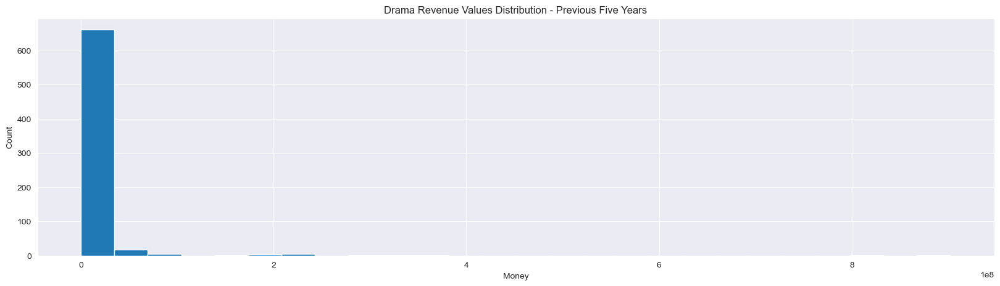

REVENUE Median = 352082.0, Mean = 11140223.711015737
count    6.990000e+02
mean     1.114022e+07
std      5.640474e+07
min      1.000000e+00
25%      2.234200e+04
50%      3.520820e+05
75%      3.004810e+06
max      9.025409e+08
Name: revenue, dtype: float64


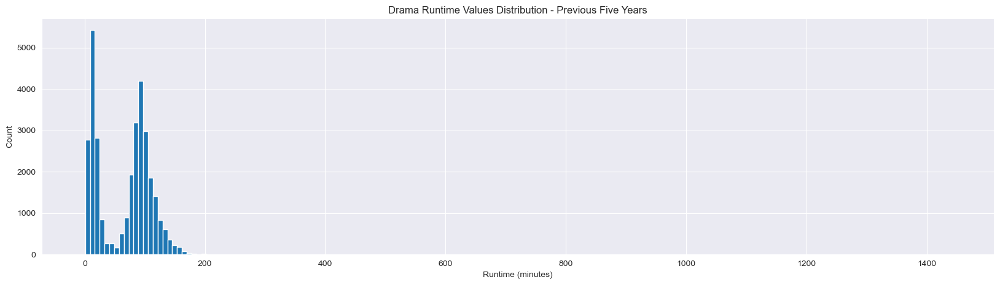

RUNTIME Median = 82.0, Mean = 66.58373759819725
count    31951.000000
mean        66.583738
std         46.195564
min          1.000000
25%         17.000000
50%         82.000000
75%         99.000000
max       1440.000000
Name: runtime, dtype: float64


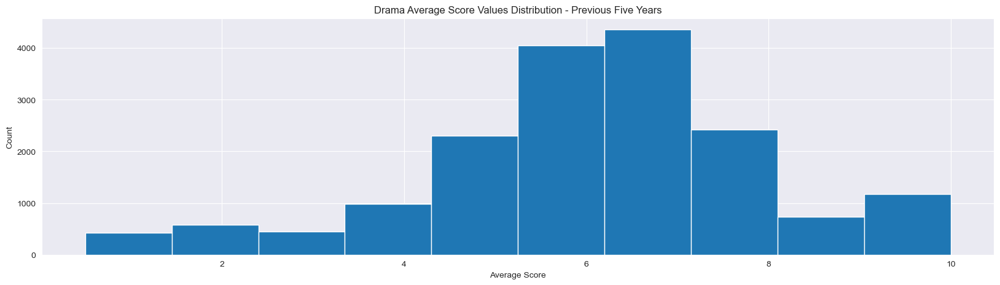

SCORE Median = 6.1, Mean = 6.136704798947602
count    17483.000000
mean         6.136705
std          1.926944
min          0.500000
25%          5.000000
50%          6.100000
75%          7.100000
max         10.000000
Name: vote_average, dtype: float64


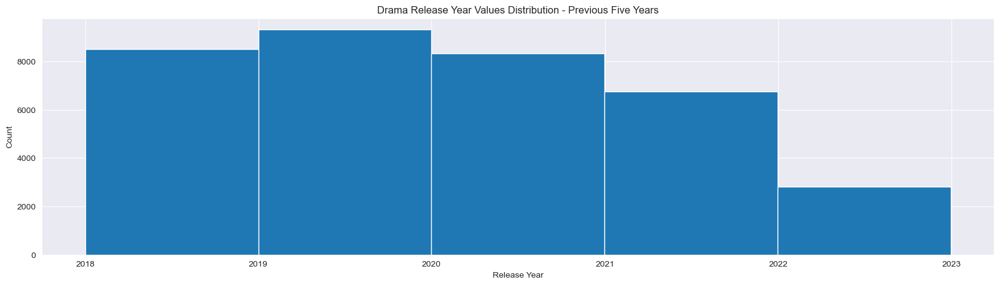

RELEASE DATE Median = 2020-01-01 00:00:00, Mean = 2020-02-09 03:02:58.297610240
count                            35738
mean     2020-02-09 03:02:58.297610240
min                2018-01-01 00:00:00
25%                2019-01-17 00:00:00
50%                2020-01-01 00:00:00
75%                2021-01-25 00:00:00
max                2022-12-31 00:00:00
Name: release_date, dtype: object


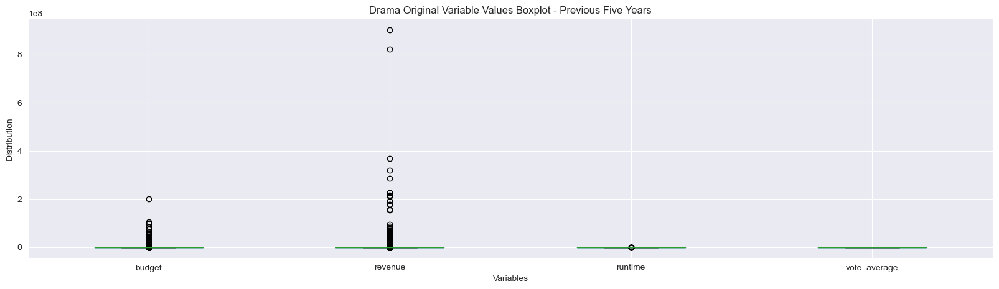

In [78]:
#Show distribution of previous 5 Year Drama variable values
n_data = len(dra5b_movies.budget)
n_bins = np.sqrt(n_data)
n_bins = int(n_bins)
_ =plt.hist(dra5b_movies.budget, bins=n_bins)
plt.title('Drama Budget Values Distribution - Previous Five Years')
plt.xlabel('Money')
plt.ylabel('Count')
plt.show()

#Calculate median and mean values for variables
print(f"BUDGET Median = {dra5b_movies.budget.median()}, Mean = {dra5b_movies.budget.mean()}")
print(dra5b_movies.budget.describe())

n_data = len(dra5r_movies.revenue)
n_bins = np.sqrt(n_data)
n_bins = int(n_bins)
_ =plt.hist(dra5r_movies.revenue, bins=n_bins)
plt.title('Drama Revenue Values Distribution - Previous Five Years')
plt.xlabel('Money')
plt.ylabel('Count')
plt.show()

print(f"REVENUE Median = {dra5r_movies.revenue.median()}, Mean = {dra5r_movies.revenue.mean()}")
print(dra5r_movies.revenue.describe())

n_data = len(dra5d_movies.runtime)
n_bins = np.sqrt(n_data)
n_bins = int(n_bins)
_ =plt.hist(dra5d_movies.runtime, bins=n_bins)
plt.title('Drama Runtime Values Distribution - Previous Five Years')
plt.xlabel('Runtime (minutes)')
plt.ylabel('Count')
plt.show()

print(f"RUNTIME Median = {dra5d_movies.runtime.median()}, Mean = {dra5d_movies.runtime.mean()}")
print(dra5d_movies.runtime.describe())

_ =plt.hist(dra5v_movies.vote_average)
plt.title('Drama Average Score Values Distribution - Previous Five Years')
plt.xlabel('Average Score')
plt.ylabel('Count')
plt.show()

print(f"SCORE Median = {dra5v_movies.vote_average.median()}, Mean = {dra5v_movies.vote_average.mean()}")
print(dra5v_movies.vote_average.describe())

_ =plt.hist(dra5_movies.release_date, bins=5)
plt.title('Drama Release Year Values Distribution - Previous Five Years')
plt.xlabel('Release Year')
plt.ylabel('Count')
plt.show()

print(f"RELEASE DATE Median = {dra5_movies.release_date.median()}, Mean = {dra5_movies.release_date.mean()}")
print(dra5_movies.release_date.describe(datetime_is_numeric=True))

dra5_movies.boxplot(column=['budget', 'revenue', 'runtime', 'vote_average'])
plt.title('Drama Original Variable Values Boxplot - Previous Five Years')
plt.xlabel('Variables')
plt.ylabel('Distribution')
plt.show()

In [79]:
#Drop zero values from 5 Year Family variables. 
#Create a seperate dataframe for each so as not to affect the other variables calculations.
fam5b_movies = fam5_movies[fam5_movies['budget'] !=0]
fam5r_movies = fam5_movies[fam5_movies['revenue'] !=0]
fam5d_movies = fam5_movies[fam5_movies['runtime'] !=0]
fam5v_movies = fam5_movies[fam5_movies['vote_average'] !=0]

#Remove Outliers from 5 Year Family variables and 
Q1 = fam5b_movies.budget.quantile(0.25)
Q3 = fam5b_movies.budget.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(fam5b_movies['budget']>=upper_limit)[0]
lower_array = np.where(fam5b_movies['budget']<=lower_limit)[0]
fam5b_movies['budget'].drop(index=upper_array, inplace=True)
fam5b_movies['budget'].drop(index=lower_array, inplace=True)

Q1 = fam5r_movies.revenue.quantile(0.25)
Q3 = fam5r_movies.revenue.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(fam5r_movies['revenue']>=upper_limit)[0]
lower_array = np.where(fam5r_movies['revenue']<=lower_limit)[0]
fam5r_movies['revenue'].drop(index=upper_array, inplace=True)
fam5r_movies['revenue'].drop(index=lower_array, inplace=True)

Q1 = fam5d_movies.runtime.quantile(0.25)
Q3 = fam5d_movies.runtime.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(fam5d_movies['runtime']>=upper_limit)[0]
lower_array = np.where(fam5d_movies['runtime']<=lower_limit)[0]
fam5d_movies['runtime'].drop(index=upper_array, inplace=True)
fam5d_movies['runtime'].drop(index=lower_array, inplace=True)

Q1 = fam5v_movies.vote_average.quantile(0.25)
Q3 = fam5v_movies.vote_average.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(fam5v_movies['vote_average']>=upper_limit)[0]
lower_array = np.where(fam5v_movies['vote_average']<=lower_limit)[0]
fam5v_movies['vote_average'].drop(index=upper_array, inplace=True)
fam5v_movies['vote_average'].drop(index=lower_array, inplace=True)

KeyError: '[1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 15, 16, 17, 18, 20, 22, 26, 27, 48] not found in axis'

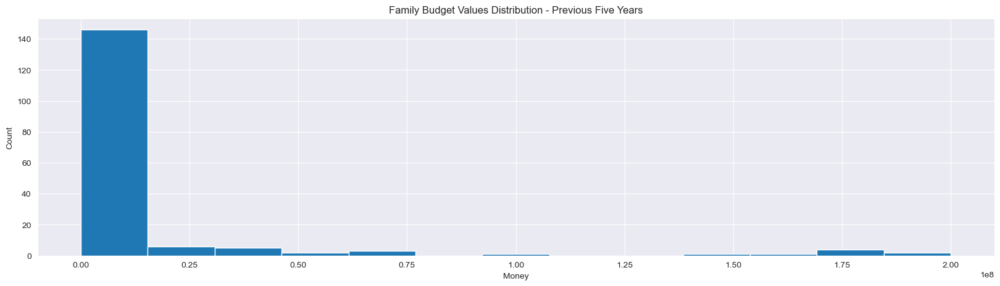

BUDGET Median = 507745.0, Mean = 14042808.514619883
count    1.710000e+02
mean     1.404281e+07
std      3.876437e+07
min      1.000000e+01
25%      5.500000e+03
50%      5.077450e+05
75%      5.366675e+06
max      2.000000e+08
Name: budget, dtype: float64


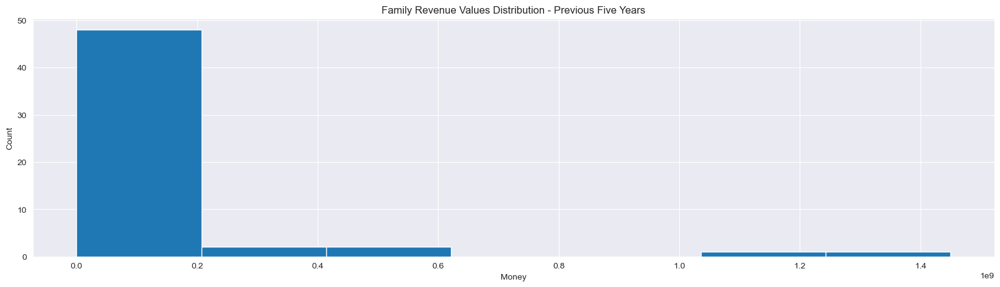

REVENUE Median = 7306396.5, Mean = 102649690.83333333
count    5.400000e+01
mean     1.026497e+08
std      2.594481e+08
min      2.000000e+02
25%      3.199950e+05
50%      7.306396e+06
75%      5.191062e+07
max      1.450027e+09
Name: revenue, dtype: float64


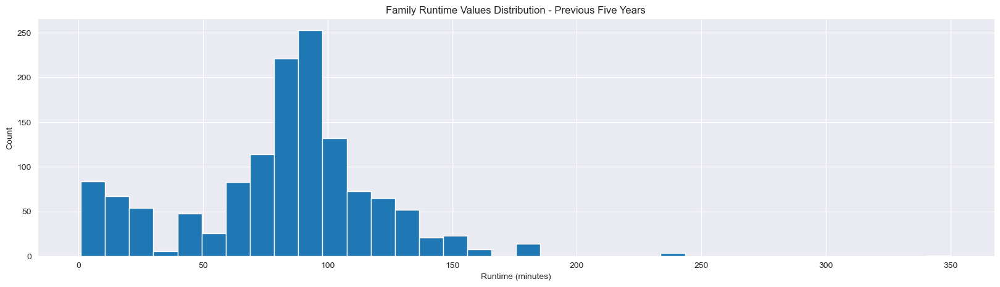

RUNTIME Median = 87.0, Mean = 81.63899184581172
count    1349.000000
mean       81.638992
std        38.657835
min         1.000000
25%        66.000000
50%        87.000000
75%       100.000000
max       350.000000
Name: runtime, dtype: float64


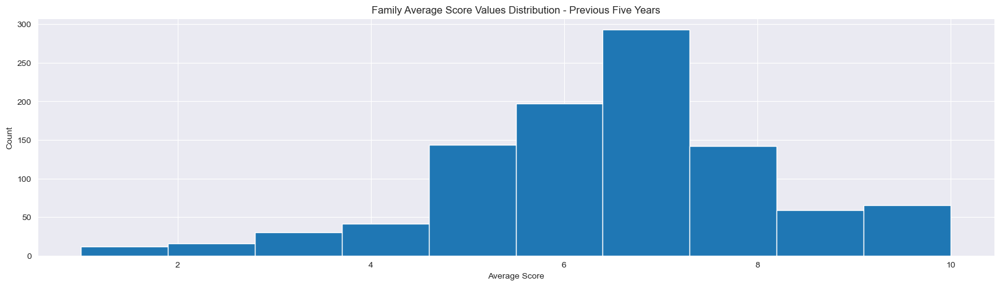

SCORE Median = 6.6, Mean = 6.455907907907922
count    999.000000
mean       6.455908
std        1.709287
min        1.000000
25%        5.500000
50%        6.600000
75%        7.400000
max       10.000000
Name: vote_average, dtype: float64


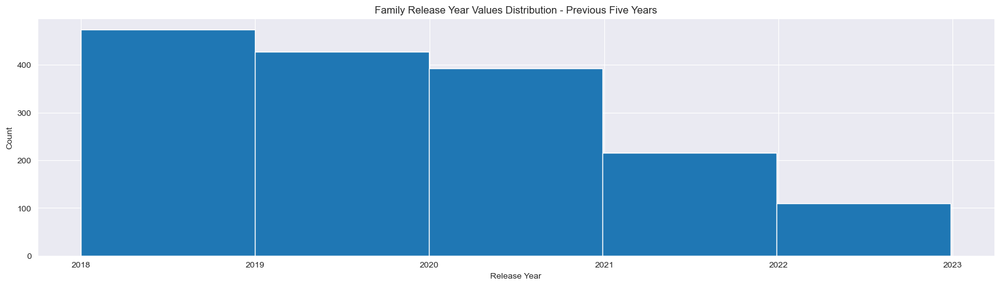

RELEASE DATE Median = 2019-11-28 00:00:00, Mean = 2019-12-30 16:20:09.635577344
count                             1619
mean     2019-12-30 16:20:09.635577344
min                2018-01-01 00:00:00
25%                2018-12-05 12:00:00
50%                2019-11-28 00:00:00
75%                2020-11-27 00:00:00
max                2022-12-28 00:00:00
Name: release_date, dtype: object


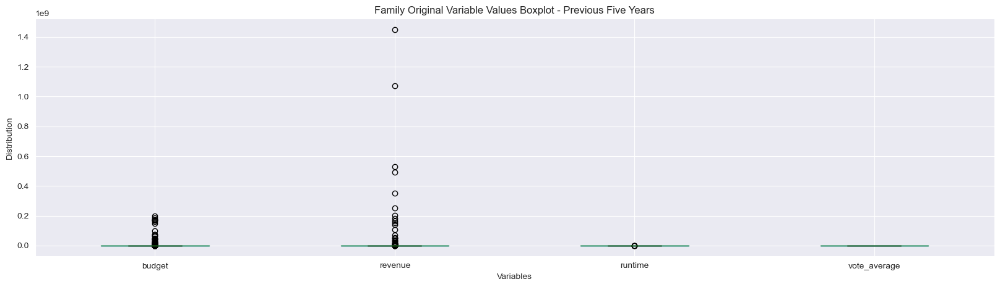

In [80]:
#Show distribution of previous 5 Year Family variable values
n_data = len(fam5b_movies.budget)
n_bins = np.sqrt(n_data)
n_bins = int(n_bins)
_ =plt.hist(fam5b_movies.budget, bins=n_bins)
plt.title('Family Budget Values Distribution - Previous Five Years')
plt.xlabel('Money')
plt.ylabel('Count')
plt.show()

#Calculate median and mean values for variables
print(f"BUDGET Median = {fam5b_movies.budget.median()}, Mean = {fam5b_movies.budget.mean()}")
print(fam5b_movies.budget.describe())

n_data = len(fam5r_movies.revenue)
n_bins = np.sqrt(n_data)
n_bins = int(n_bins)
_ =plt.hist(fam5r_movies.revenue, bins=n_bins)
plt.title('Family Revenue Values Distribution - Previous Five Years')
plt.xlabel('Money')
plt.ylabel('Count')
plt.show()

print(f"REVENUE Median = {fam5r_movies.revenue.median()}, Mean = {fam5r_movies.revenue.mean()}")
print(fam5r_movies.revenue.describe())

n_data = len(fam5d_movies.runtime)
n_bins = np.sqrt(n_data)
n_bins = int(n_bins)
_ =plt.hist(fam5d_movies.runtime, bins=n_bins)
plt.title('Family Runtime Values Distribution - Previous Five Years')
plt.xlabel('Runtime (minutes)')
plt.ylabel('Count')
plt.show()

print(f"RUNTIME Median = {fam5d_movies.runtime.median()}, Mean = {fam5d_movies.runtime.mean()}")
print(fam5d_movies.runtime.describe())

_ =plt.hist(fam5v_movies.vote_average)
plt.title('Family Average Score Values Distribution - Previous Five Years')
plt.xlabel('Average Score')
plt.ylabel('Count')
plt.show()

print(f"SCORE Median = {fam5v_movies.vote_average.median()}, Mean = {fam5v_movies.vote_average.mean()}")
print(fam5v_movies.vote_average.describe())

_ =plt.hist(fam5_movies.release_date, bins=5)
plt.title('Family Release Year Values Distribution - Previous Five Years')
plt.xlabel('Release Year')
plt.ylabel('Count')
plt.show()

print(f"RELEASE DATE Median = {fam5_movies.release_date.median()}, Mean = {fam5_movies.release_date.mean()}")
print(fam5_movies.release_date.describe(datetime_is_numeric=True))

fam5_movies.boxplot(column=['budget', 'revenue', 'runtime', 'vote_average'])
plt.title('Family Original Variable Values Boxplot - Previous Five Years')
plt.xlabel('Variables')
plt.ylabel('Distribution')
plt.show()

In [81]:
#Drop zero values from 5 Year Fantasy variables. 
#Create a seperate dataframe for each so as not to affect the other variables calculations.
fan5b_movies = fan5_movies[fan5_movies['budget'] !=0]
fan5r_movies = fan5_movies[fan5_movies['revenue'] !=0]
fan5d_movies = fan5_movies[fan5_movies['runtime'] !=0]
fan5v_movies = fan5_movies[fan5_movies['vote_average'] !=0]

#Remove Outliers from 5 Year Fantasy variables and 
Q1 = fan5b_movies.budget.quantile(0.25)
Q3 = fan5b_movies.budget.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(fan5b_movies['budget']>=upper_limit)[0]
lower_array = np.where(fan5b_movies['budget']<=lower_limit)[0]
fan5b_movies['budget'].drop(index=upper_array, inplace=True)
fan5b_movies['budget'].drop(index=lower_array, inplace=True)

Q1 = fan5r_movies.revenue.quantile(0.25)
Q3 = fan5r_movies.revenue.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(fan5r_movies['revenue']>=upper_limit)[0]
lower_array = np.where(fan5r_movies['revenue']<=lower_limit)[0]
fan5r_movies['revenue'].drop(index=upper_array, inplace=True)
fan5r_movies['revenue'].drop(index=lower_array, inplace=True)

Q1 = fan5d_movies.runtime.quantile(0.25)
Q3 = fan5d_movies.runtime.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(fan5d_movies['runtime']>=upper_limit)[0]
lower_array = np.where(fan5d_movies['runtime']<=lower_limit)[0]
fan5d_movies['runtime'].drop(index=upper_array, inplace=True)
fan5d_movies['runtime'].drop(index=lower_array, inplace=True)

Q1 = fan5v_movies.vote_average.quantile(0.25)
Q3 = fan5v_movies.vote_average.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(fan5v_movies['vote_average']>=upper_limit)[0]
lower_array = np.where(fan5v_movies['vote_average']<=lower_limit)[0]
fan5v_movies['vote_average'].drop(index=upper_array, inplace=True)
fan5v_movies['vote_average'].drop(index=lower_array, inplace=True)

KeyError: '[0, 1, 5, 7, 8, 9, 10, 11, 15, 16, 21, 22, 24, 26, 38, 40, 43, 76, 79, 124, 143, 144, 160, 225, 239] not found in axis'

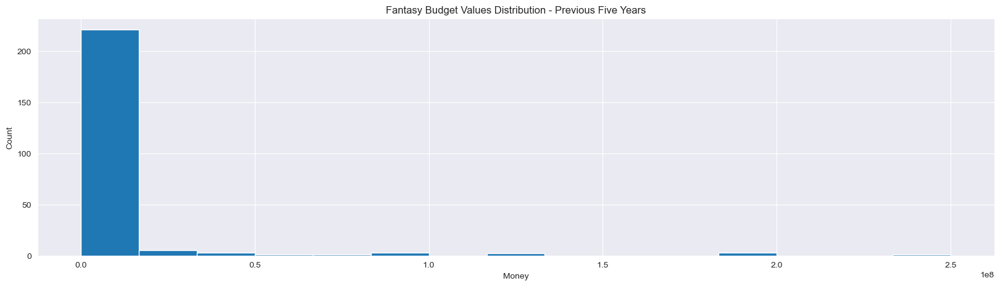

BUDGET Median = 10000.0, Mean = 7774289.279166667
count    2.400000e+02
mean     7.774289e+06
std      3.211050e+07
min      1.000000e+00
25%      3.570000e+02
50%      1.000000e+04
75%      1.562500e+05
max      2.500000e+08
Name: budget, dtype: float64


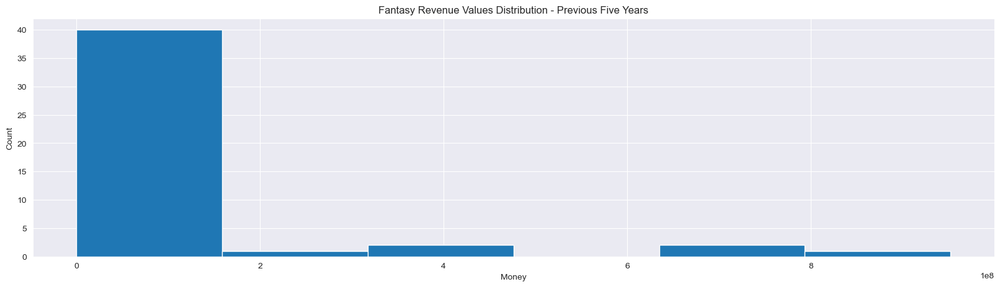

REVENUE Median = 1953722.5, Mean = 88071803.97826087
count    4.600000e+01
mean     8.807180e+07
std      2.081185e+08
min      1.000000e+00
25%      1.125000e+02
50%      1.953722e+06
75%      4.872262e+07
max      9.522250e+08
Name: revenue, dtype: float64


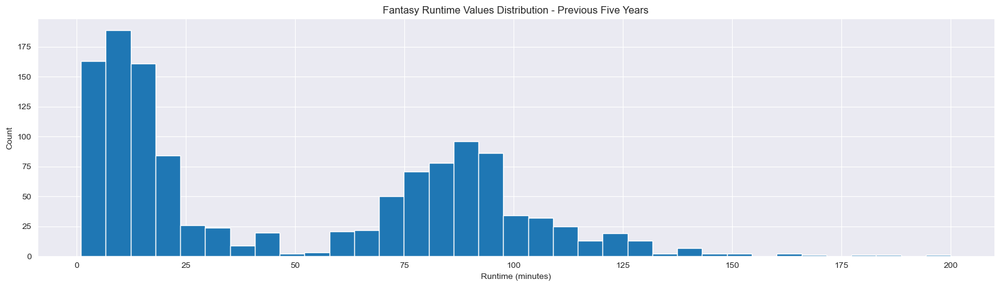

RUNTIME Median = 30.0, Mean = 49.85793650793651
count    1260.000000
mean       49.857937
std        41.632565
min         1.000000
25%        11.000000
50%        30.000000
75%        88.000000
max       200.000000
Name: runtime, dtype: float64


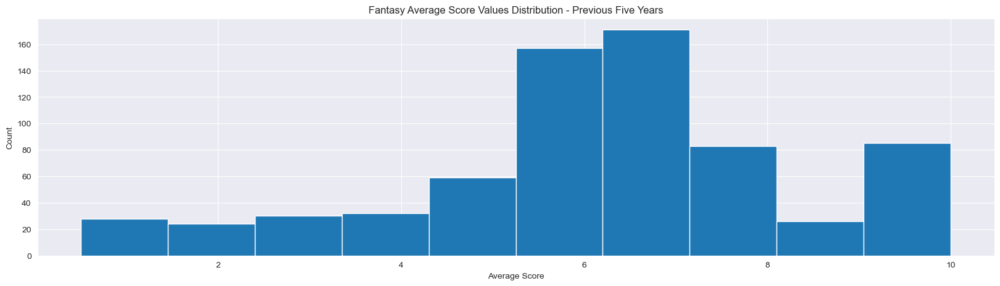

SCORE Median = 6.3, Mean = 6.261536690647484
count    695.000000
mean       6.261537
std        2.226491
min        0.500000
25%        5.300000
50%        6.300000
75%        7.300000
max       10.000000
Name: vote_average, dtype: float64


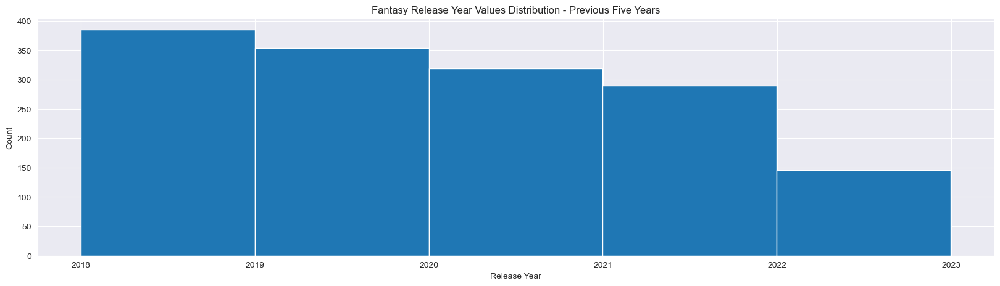

RELEASE DATE Median = 2020-01-01 00:00:00, Mean = 2020-02-23 15:32:40.348291840
count                             1493
mean     2020-02-23 15:32:40.348291840
min                2018-01-01 00:00:00
25%                2018-12-19 00:00:00
50%                2020-01-01 00:00:00
75%                2021-04-02 00:00:00
max                2022-12-31 00:00:00
Name: release_date, dtype: object


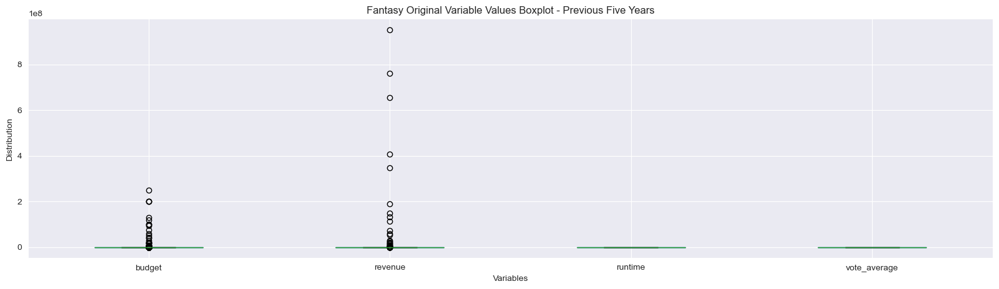

In [82]:
#Show distribution of previous 5 Year Fantasy variable values
n_data = len(fan5b_movies.budget)
n_bins = np.sqrt(n_data)
n_bins = int(n_bins)
_ =plt.hist(fan5b_movies.budget, bins=n_bins)
plt.title('Fantasy Budget Values Distribution - Previous Five Years')
plt.xlabel('Money')
plt.ylabel('Count')
plt.show()

#Calculate median and mean values for variables
print(f"BUDGET Median = {fan5b_movies.budget.median()}, Mean = {fan5b_movies.budget.mean()}")
print(fan5b_movies.budget.describe())

n_data = len(fan5r_movies.revenue)
n_bins = np.sqrt(n_data)
n_bins = int(n_bins)
_ =plt.hist(fan5r_movies.revenue, bins=n_bins)
plt.title('Fantasy Revenue Values Distribution - Previous Five Years')
plt.xlabel('Money')
plt.ylabel('Count')
plt.show()

print(f"REVENUE Median = {fan5r_movies.revenue.median()}, Mean = {fan5r_movies.revenue.mean()}")
print(fan5r_movies.revenue.describe())

n_data = len(fan5d_movies.runtime)
n_bins = np.sqrt(n_data)
n_bins = int(n_bins)
_ =plt.hist(fan5d_movies.runtime, bins=n_bins)
plt.title('Fantasy Runtime Values Distribution - Previous Five Years')
plt.xlabel('Runtime (minutes)')
plt.ylabel('Count')
plt.show()

print(f"RUNTIME Median = {fan5d_movies.runtime.median()}, Mean = {fan5d_movies.runtime.mean()}")
print(fan5d_movies.runtime.describe())

_ =plt.hist(fan5v_movies.vote_average)
plt.title('Fantasy Average Score Values Distribution - Previous Five Years')
plt.xlabel('Average Score')
plt.ylabel('Count')
plt.show()

print(f"SCORE Median = {fan5v_movies.vote_average.median()}, Mean = {fan5v_movies.vote_average.mean()}")
print(fan5v_movies.vote_average.describe())

_ =plt.hist(fan5_movies.release_date, bins=5)
plt.title('Fantasy Release Year Values Distribution - Previous Five Years')
plt.xlabel('Release Year')
plt.ylabel('Count')
plt.show()

print(f"RELEASE DATE Median = {fan5_movies.release_date.median()}, Mean = {fan5_movies.release_date.mean()}")
print(fan5_movies.release_date.describe(datetime_is_numeric=True))

fan5_movies.boxplot(column=['budget', 'revenue', 'runtime', 'vote_average'])
plt.title('Fantasy Original Variable Values Boxplot - Previous Five Years')
plt.xlabel('Variables')
plt.ylabel('Distribution')
plt.show()

In [83]:
#Drop zero values from 5 Year History variables. 
#Create a seperate dataframe for each so as not to affect the other variables calculations.
his5b_movies = his5_movies[his5_movies['budget'] !=0]
his5r_movies = his5_movies[his5_movies['revenue'] !=0]
his5d_movies = his5_movies[his5_movies['runtime'] !=0]
his5v_movies = his5_movies[his5_movies['vote_average'] !=0]

#Remove Outliers from 5 Year History variables and 
Q1 = his5b_movies.budget.quantile(0.25)
Q3 = his5b_movies.budget.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(his5b_movies['budget']>=upper_limit)[0]
lower_array = np.where(his5b_movies['budget']<=lower_limit)[0]
his5b_movies['budget'].drop(index=upper_array, inplace=True)
his5b_movies['budget'].drop(index=lower_array, inplace=True)

Q1 = his5r_movies.revenue.quantile(0.25)
Q3 = his5r_movies.revenue.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(his5r_movies['revenue']>=upper_limit)[0]
lower_array = np.where(his5r_movies['revenue']<=lower_limit)[0]
his5r_movies['revenue'].drop(index=upper_array, inplace=True)
his5r_movies['revenue'].drop(index=lower_array, inplace=True)

Q1 = his5d_movies.runtime.quantile(0.25)
Q3 = his5d_movies.runtime.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(his5d_movies['runtime']>=upper_limit)[0]
lower_array = np.where(his5d_movies['runtime']<=lower_limit)[0]
his5d_movies['runtime'].drop(index=upper_array, inplace=True)
his5d_movies['runtime'].drop(index=lower_array, inplace=True)

Q1 = his5v_movies.vote_average.quantile(0.25)
Q3 = his5v_movies.vote_average.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(his5v_movies['vote_average']>=upper_limit)[0]
lower_array = np.where(his5v_movies['vote_average']<=lower_limit)[0]
his5v_movies['vote_average'].drop(index=upper_array, inplace=True)
his5v_movies['vote_average'].drop(index=lower_array, inplace=True)

KeyError: '[1, 3, 5, 7, 14, 18] not found in axis'

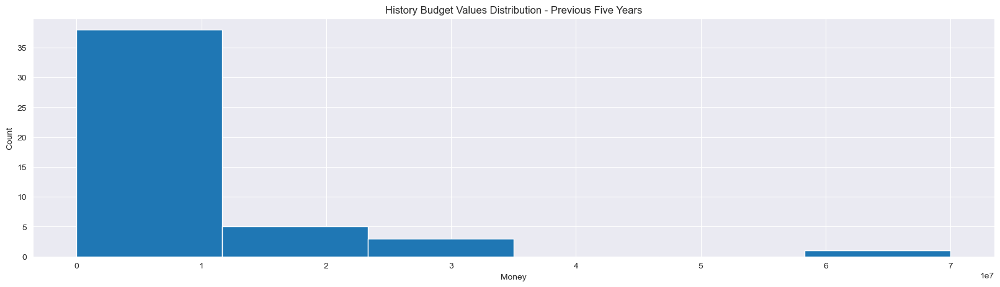

BUDGET Median = 1800000.0, Mean = 6486132.765957447
count    4.700000e+01
mean     6.486133e+06
std      1.259691e+07
min      1.000000e+00
25%      2.364100e+04
50%      1.800000e+06
75%      5.000000e+06
max      7.000000e+07
Name: budget, dtype: float64


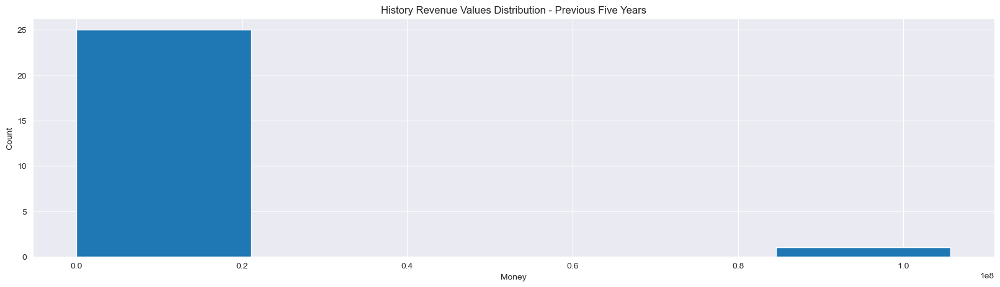

REVENUE Median = 1987909.0, Mean = 8199549.576923077
count    2.600000e+01
mean     8.199550e+06
std      2.062721e+07
min      5.000000e+00
25%      3.232395e+05
50%      1.987909e+06
75%      7.307601e+06
max      1.057132e+08
Name: revenue, dtype: float64


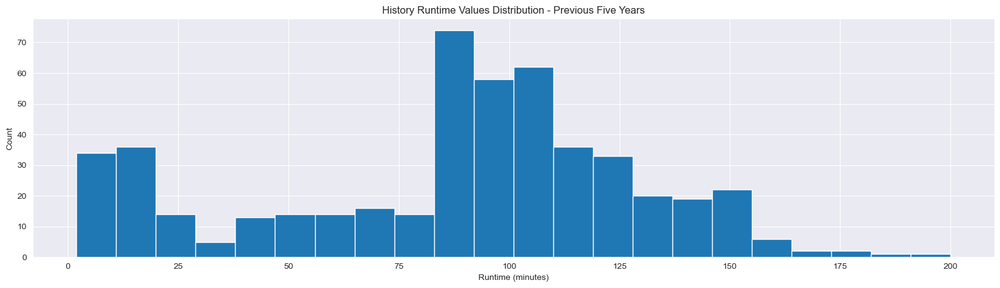

RUNTIME Median = 93.5, Mean = 86.16532258064517
count    496.000000
mean      86.165323
std       42.413559
min        2.000000
25%       58.000000
50%       93.500000
75%      112.250000
max      200.000000
Name: runtime, dtype: float64


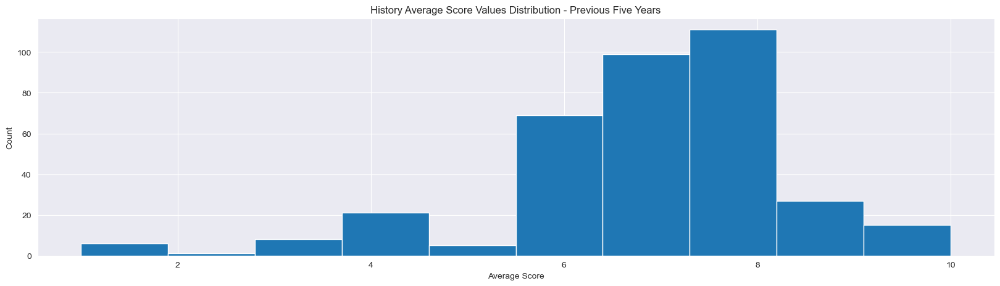

SCORE Median = 7.0, Mean = 6.833770718232041
count    362.000000
mean       6.833771
std        1.582375
min        1.000000
25%        6.097750
50%        7.000000
75%        8.000000
max       10.000000
Name: vote_average, dtype: float64


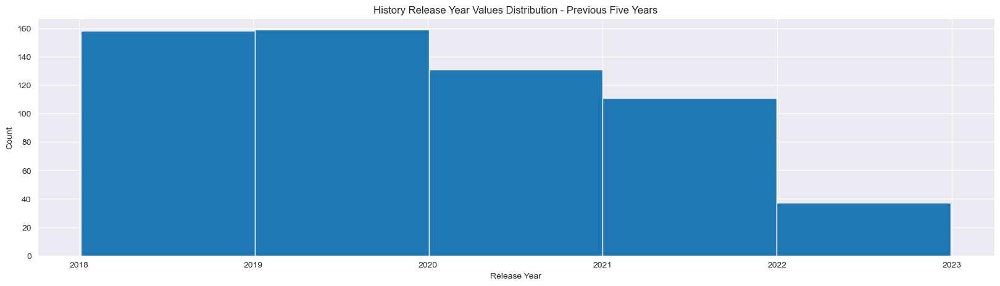

RELEASE DATE Median = 2019-12-11 00:00:00, Mean = 2020-01-17 07:34:13.691275264
count                              596
mean     2020-01-17 07:34:13.691275264
min                2018-01-05 00:00:00
25%                2018-12-07 00:00:00
50%                2019-12-11 00:00:00
75%                2020-12-17 06:00:00
max                2022-12-30 00:00:00
Name: release_date, dtype: object


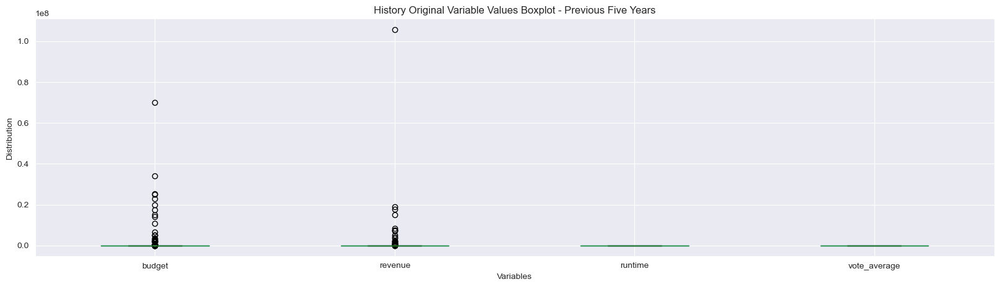

In [84]:
#Show distribution of previous 5 Year History variable values
n_data = len(his5b_movies.budget)
n_bins = np.sqrt(n_data)
n_bins = int(n_bins)
_ =plt.hist(his5b_movies.budget, bins=n_bins)
plt.title('History Budget Values Distribution - Previous Five Years')
plt.xlabel('Money')
plt.ylabel('Count')
plt.show()

#Calculate median and mean values for variables
print(f"BUDGET Median = {his5b_movies.budget.median()}, Mean = {his5b_movies.budget.mean()}")
print(his5b_movies.budget.describe())

n_data = len(his5r_movies.revenue)
n_bins = np.sqrt(n_data)
n_bins = int(n_bins)
_ =plt.hist(his5r_movies.revenue, bins=n_bins)
plt.title('History Revenue Values Distribution - Previous Five Years')
plt.xlabel('Money')
plt.ylabel('Count')
plt.show()

print(f"REVENUE Median = {his5r_movies.revenue.median()}, Mean = {his5r_movies.revenue.mean()}")
print(his5r_movies.revenue.describe())

n_data = len(his5d_movies.runtime)
n_bins = np.sqrt(n_data)
n_bins = int(n_bins)
_ =plt.hist(his5d_movies.runtime, bins=n_bins)
plt.title('History Runtime Values Distribution - Previous Five Years')
plt.xlabel('Runtime (minutes)')
plt.ylabel('Count')
plt.show()

print(f"RUNTIME Median = {his5d_movies.runtime.median()}, Mean = {his5d_movies.runtime.mean()}")
print(his5d_movies.runtime.describe())

_ =plt.hist(his5v_movies.vote_average)
plt.title('History Average Score Values Distribution - Previous Five Years')
plt.xlabel('Average Score')
plt.ylabel('Count')
plt.show()

print(f"SCORE Median = {his5v_movies.vote_average.median()}, Mean = {his5v_movies.vote_average.mean()}")
print(his5v_movies.vote_average.describe())

_ =plt.hist(his5_movies.release_date, bins=5)
plt.title('History Release Year Values Distribution - Previous Five Years')
plt.xlabel('Release Year')
plt.ylabel('Count')
plt.show()

print(f"RELEASE DATE Median = {his5_movies.release_date.median()}, Mean = {his5_movies.release_date.mean()}")
print(his5_movies.release_date.describe(datetime_is_numeric=True))

his5_movies.boxplot(column=['budget', 'revenue', 'runtime', 'vote_average'])
plt.title('History Original Variable Values Boxplot - Previous Five Years')
plt.xlabel('Variables')
plt.ylabel('Distribution')
plt.show()

In [85]:
#Drop zero values from 5 Year Horror variables. 
#Create a seperate dataframe for each so as not to affect the other variables calculations.
hor5b_movies = hor5_movies[hor5_movies['budget'] !=0]
hor5r_movies = hor5_movies[hor5_movies['revenue'] !=0]
hor5d_movies = hor5_movies[hor5_movies['runtime'] !=0]
hor5v_movies = hor5_movies[hor5_movies['vote_average'] !=0]

#Remove Outliers from 5 Year Horror variables and 
Q1 = hor5b_movies.budget.quantile(0.25)
Q3 = hor5b_movies.budget.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(hor5b_movies['budget']>=upper_limit)[0]
lower_array = np.where(hor5b_movies['budget']<=lower_limit)[0]
hor5b_movies['budget'].drop(index=upper_array, inplace=True)
hor5b_movies['budget'].drop(index=lower_array, inplace=True)

Q1 = hor5r_movies.revenue.quantile(0.25)
Q3 = hor5r_movies.revenue.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(hor5r_movies['revenue']>=upper_limit)[0]
lower_array = np.where(hor5r_movies['revenue']<=lower_limit)[0]
hor5r_movies['revenue'].drop(index=upper_array, inplace=True)
hor5r_movies['revenue'].drop(index=lower_array, inplace=True)

Q1 = hor5d_movies.runtime.quantile(0.25)
Q3 = hor5d_movies.runtime.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(hor5d_movies['runtime']>=upper_limit)[0]
lower_array = np.where(hor5d_movies['runtime']<=lower_limit)[0]
hor5d_movies['runtime'].drop(index=upper_array, inplace=True)
hor5d_movies['runtime'].drop(index=lower_array, inplace=True)

Q1 = hor5v_movies.vote_average.quantile(0.25)
Q3 = hor5v_movies.vote_average.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(hor5v_movies['vote_average']>=upper_limit)[0]
lower_array = np.where(hor5v_movies['vote_average']<=lower_limit)[0]
hor5v_movies['vote_average'].drop(index=upper_array, inplace=True)
hor5v_movies['vote_average'].drop(index=lower_array, inplace=True)

KeyError: '[0, 1, 2, 5, 7, 8, 9, 12, 13, 16, 17, 18, 19, 20, 21, 24, 26, 28, 30, 32, 33, 34, 37, 38, 42, 43, 46, 49, 51, 52, 53, 54, 55, 57, 60, 61, 63, 65, 67, 68, 69, 70, 71, 72, 73, 74, 76, 77, 78, 93, 94, 95, 96, 97, 99, 101, 103, 104, 105, 110, 118, 121, 122, 123, 124, 125, 128, 130, 143, 144, 145, 146, 147, 148, 149, 152, 155, 160, 161, 167, 171, 172, 173, 174, 194, 196, 197, 200, 202, 208, 213, 214, 216, 218, 219, 220, 221, 222, 224, 225, 256, 257, 258, 261, 262, 263, 264, 266, 267, 268, 269, 272, 274, 275, 276, 277, 279, 280, 281, 282, 289, 290, 291, 293, 294, 295, 299, 300, 301, 302, 303, 304, 305, 306, 307, 324, 355, 356, 358, 371, 381, 382, 383, 384, 390, 391, 402, 404, 405, 406, 407, 408, 409, 410, 412, 413, 414, 415, 416, 417, 418, 419, 420, 421, 422, 425, 426, 427, 428, 447, 457, 458, 460, 461, 489, 490, 491, 492, 493, 494, 495, 496, 497, 499, 501, 502, 504, 506, 507, 508, 509, 558, 560, 561, 562, 564, 565, 566, 567, 568, 569, 578, 579, 580, 581, 582, 583, 584, 585, 586, 595, 633, 634, 635, 636, 641, 643, 644, 645, 647, 648, 649, 654, 693, 694, 695, 696, 697, 743, 787, 793, 827, 889, 890, 891, 892, 926, 938, 939, 941, 942, 943, 944, 945, 946, 957, 958, 959, 1021, 1022, 1023, 1024, 1025, 1064, 1080, 1129, 1130, 1131, 1132, 1315, 1316, 1317, 1318, 1323, 1324, 1325, 1326, 1378, 1413, 1506, 1602, 1683] not found in axis'

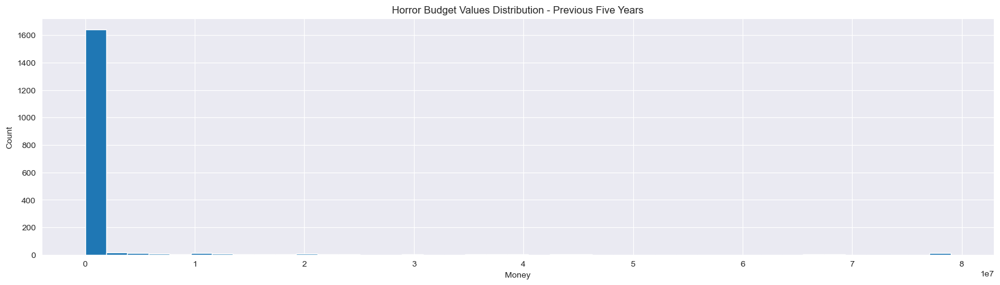

BUDGET Median = 5000.0, Mean = 1293751.207114171
count    1.743000e+03
mean     1.293751e+06
std      7.374832e+06
min      1.000000e+00
25%      3.810000e+02
50%      5.000000e+03
75%      5.000000e+04
max      7.900000e+07
Name: budget, dtype: float64


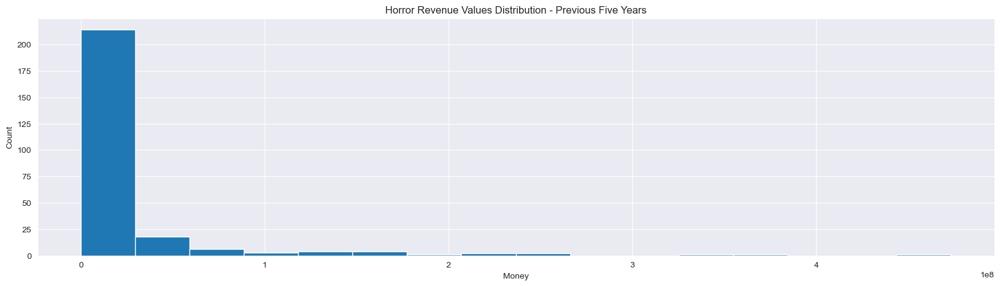

REVENUE Median = 190760.0, Mean = 21407534.64980545
count    2.570000e+02
mean     2.140753e+07
std      5.976516e+07
min      1.000000e+00
25%      1.000000e+04
50%      1.907600e+05
75%      7.230000e+06
max      4.731225e+08
Name: revenue, dtype: float64


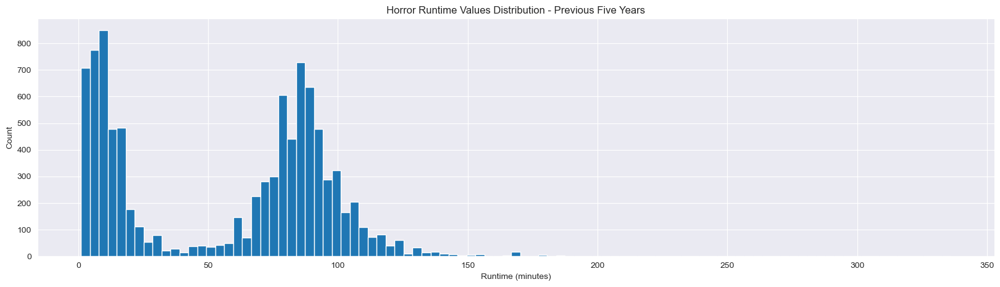

RUNTIME Median = 73.0, Mean = 56.7589951032574
count    9394.000000
mean       56.758995
std        40.403443
min         1.000000
25%        12.000000
50%        73.000000
75%        90.000000
max       336.000000
Name: runtime, dtype: float64


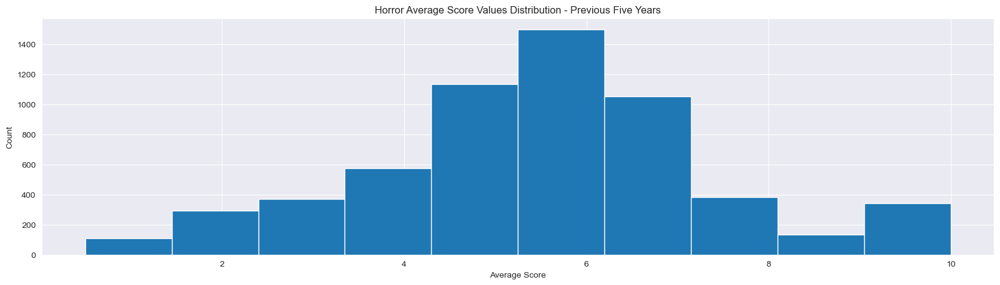

SCORE Median = 5.6, Mean = 5.554412582669118
count    5897.000000
mean        5.554413
std         1.958858
min         0.500000
25%         4.400000
50%         5.600000
75%         6.600000
max        10.000000
Name: vote_average, dtype: float64


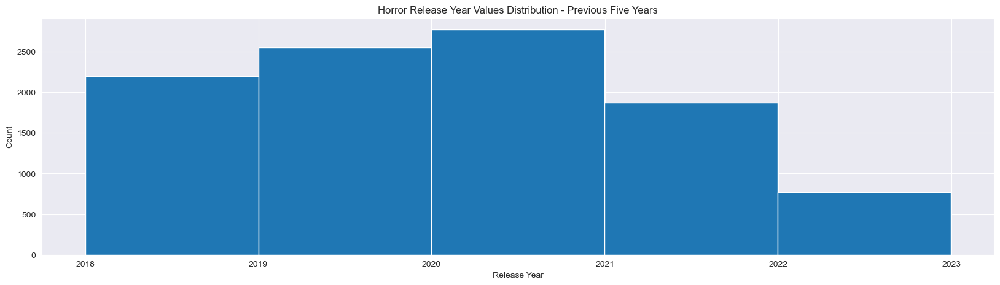

RELEASE DATE Median = 2020-02-15 00:00:00, Mean = 2020-03-04 09:10:35.294117632
count                            10166
mean     2020-03-04 09:10:35.294117632
min                2018-01-01 00:00:00
25%                2019-02-15 00:00:00
50%                2020-02-15 00:00:00
75%                2021-01-08 00:00:00
max                2022-12-31 00:00:00
Name: release_date, dtype: object


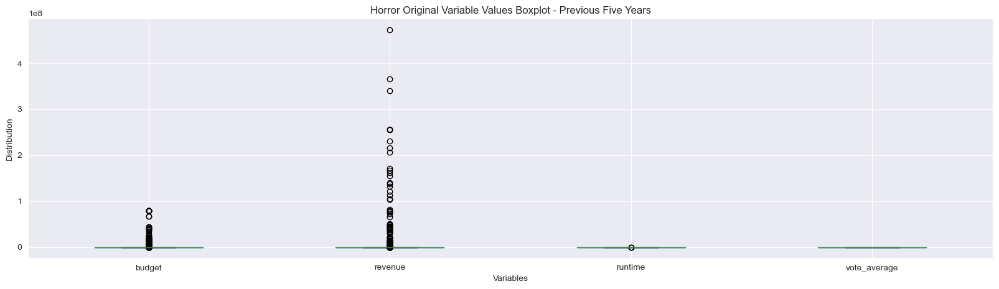

In [86]:
#Show distribution of previous 5 Year Horror variable values
n_data = len(hor5b_movies.budget)
n_bins = np.sqrt(n_data)
n_bins = int(n_bins)
_ =plt.hist(hor5b_movies.budget, bins=n_bins)
plt.title('Horror Budget Values Distribution - Previous Five Years')
plt.xlabel('Money')
plt.ylabel('Count')
plt.show()

#Calculate median and mean values for variables
print(f"BUDGET Median = {hor5b_movies.budget.median()}, Mean = {hor5b_movies.budget.mean()}")
print(hor5b_movies.budget.describe())

n_data = len(hor5r_movies.revenue)
n_bins = np.sqrt(n_data)
n_bins = int(n_bins)
_ =plt.hist(hor5r_movies.revenue, bins=n_bins)
plt.title('Horror Revenue Values Distribution - Previous Five Years')
plt.xlabel('Money')
plt.ylabel('Count')
plt.show()

print(f"REVENUE Median = {hor5r_movies.revenue.median()}, Mean = {hor5r_movies.revenue.mean()}")
print(hor5r_movies.revenue.describe())

n_data = len(hor5d_movies.runtime)
n_bins = np.sqrt(n_data)
n_bins = int(n_bins)
_ =plt.hist(hor5d_movies.runtime, bins=n_bins)
plt.title('Horror Runtime Values Distribution - Previous Five Years')
plt.xlabel('Runtime (minutes)')
plt.ylabel('Count')
plt.show()

print(f"RUNTIME Median = {hor5d_movies.runtime.median()}, Mean = {hor5d_movies.runtime.mean()}")
print(hor5d_movies.runtime.describe())

_ =plt.hist(hor5v_movies.vote_average)
plt.title('Horror Average Score Values Distribution - Previous Five Years')
plt.xlabel('Average Score')
plt.ylabel('Count')
plt.show()

print(f"SCORE Median = {hor5v_movies.vote_average.median()}, Mean = {hor5v_movies.vote_average.mean()}")
print(hor5v_movies.vote_average.describe())

_ =plt.hist(hor5_movies.release_date, bins=5)
plt.title('Horror Release Year Values Distribution - Previous Five Years')
plt.xlabel('Release Year')
plt.ylabel('Count')
plt.show()

print(f"RELEASE DATE Median = {hor5_movies.release_date.median()}, Mean = {hor5_movies.release_date.mean()}")
print(hor5_movies.release_date.describe(datetime_is_numeric=True))

hor5_movies.boxplot(column=['budget', 'revenue', 'runtime', 'vote_average'])
plt.title('Horror Original Variable Values Boxplot - Previous Five Years')
plt.xlabel('Variables')
plt.ylabel('Distribution')
plt.show()

In [87]:
#Drop zero values from 5 Year Musical variables. 
#Create a seperate dataframe for each so as not to affect the other variables calculations.
mus5b_movies = mus5_movies[mus5_movies['budget'] !=0]
mus5r_movies = mus5_movies[mus5_movies['revenue'] !=0]
mus5d_movies = mus5_movies[mus5_movies['runtime'] !=0]
mus5v_movies = mus5_movies[mus5_movies['vote_average'] !=0]

#Remove Outliers from 5 Year Musical variables and 
Q1 = mus5b_movies.budget.quantile(0.25)
Q3 = mus5b_movies.budget.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(mus5b_movies['budget']>=upper_limit)[0]
lower_array = np.where(mus5b_movies['budget']<=lower_limit)[0]
mus5b_movies['budget'].drop(index=upper_array, inplace=True)
mus5b_movies['budget'].drop(index=lower_array, inplace=True)

Q1 = mus5r_movies.revenue.quantile(0.25)
Q3 = mus5r_movies.revenue.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(mus5r_movies['revenue']>=upper_limit)[0]
lower_array = np.where(mus5r_movies['revenue']<=lower_limit)[0]
mus5r_movies['revenue'].drop(index=upper_array, inplace=True)
mus5r_movies['revenue'].drop(index=lower_array, inplace=True)

Q1 = mus5d_movies.runtime.quantile(0.25)
Q3 = mus5d_movies.runtime.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(mus5d_movies['runtime']>=upper_limit)[0]
lower_array = np.where(mus5d_movies['runtime']<=lower_limit)[0]
mus5d_movies['runtime'].drop(index=upper_array, inplace=True)
mus5d_movies['runtime'].drop(index=lower_array, inplace=True)

Q1 = mus5v_movies.vote_average.quantile(0.25)
Q3 = mus5v_movies.vote_average.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(mus5v_movies['vote_average']>=upper_limit)[0]
lower_array = np.where(mus5v_movies['vote_average']<=lower_limit)[0]
mus5v_movies['vote_average'].drop(index=upper_array, inplace=True)
mus5v_movies['vote_average'].drop(index=lower_array, inplace=True)

KeyError: '[0, 1, 2, 3, 4, 5, 6, 8, 9, 14, 15, 19, 48, 49, 61, 102, 113] not found in axis'

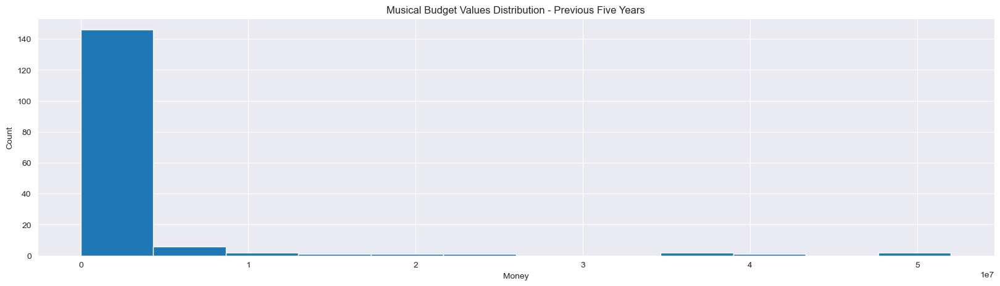

BUDGET Median = 25000.0, Mean = 2313344.845679012
count    1.620000e+02
mean     2.313345e+06
std      8.054016e+06
min      5.000000e+00
25%      6.500000e+02
50%      2.500000e+04
75%      5.000000e+05
max      5.200000e+07
Name: budget, dtype: float64


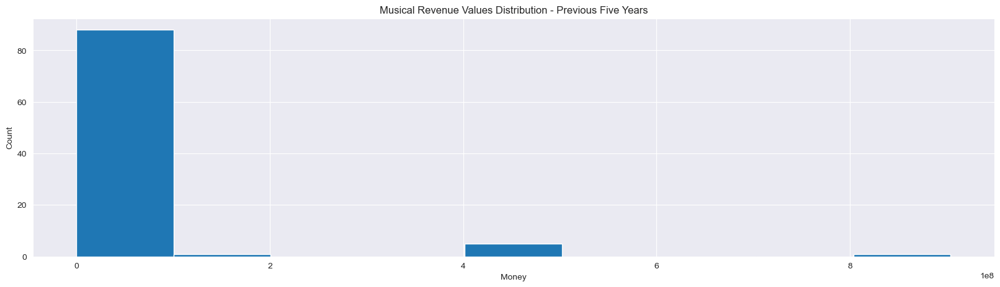

REVENUE Median = 1251945.0, Mean = 44742334.94736842
count    9.500000e+01
mean     4.474233e+07
std      1.310963e+08
min      5.000000e+01
25%      2.832410e+05
50%      1.251945e+06
75%      2.000000e+07
max      9.039929e+08
Name: revenue, dtype: float64


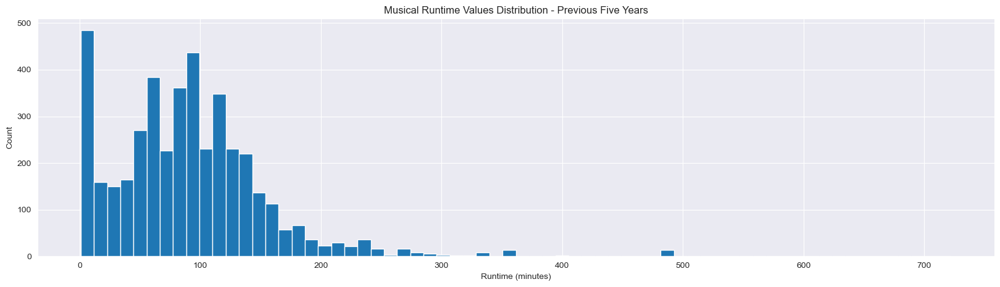

RUNTIME Median = 87.0, Mean = 90.83045708955224
count    4288.000000
mean       90.830457
std        65.590853
min         1.000000
25%        50.000000
50%        87.000000
75%       121.000000
max       722.000000
Name: runtime, dtype: float64


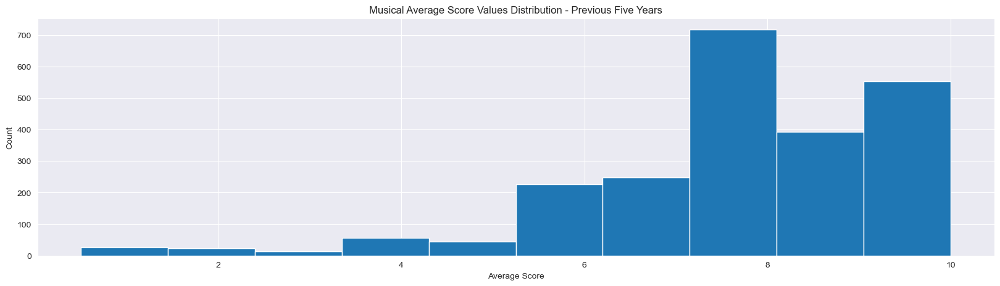

SCORE Median = 8.0, Mean = 7.860326379834853
count    2301.000000
mean        7.860326
std         1.813378
min         0.500000
25%         7.000000
50%         8.000000
75%         9.000000
max        10.000000
Name: vote_average, dtype: float64


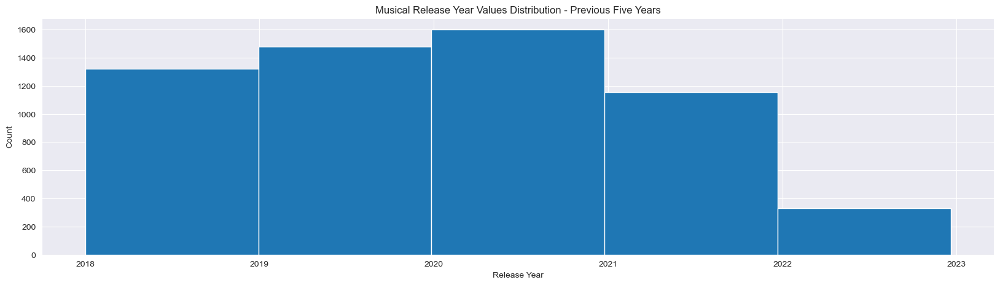

RELEASE DATE Median = 2020-02-16 12:00:00, Mean = 2020-02-11 18:19:48.586956544
count                             5888
mean     2020-02-11 18:19:48.586956544
min                2018-01-01 00:00:00
25%                2019-02-06 00:00:00
50%                2020-02-16 12:00:00
75%                2020-12-26 06:00:00
max                2022-12-20 00:00:00
Name: release_date, dtype: object


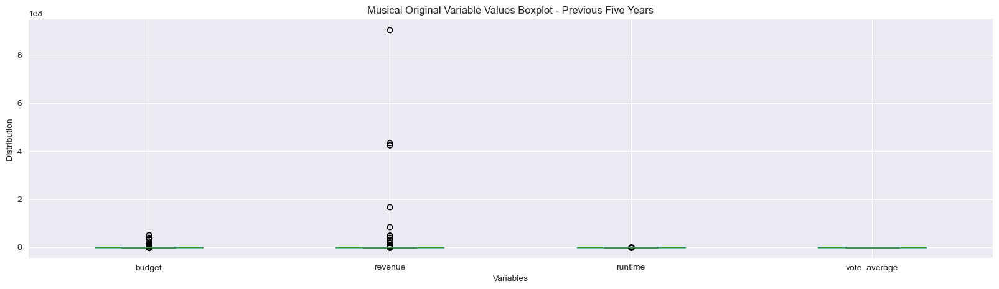

In [88]:
#Show distribution of previous 5 Year Musical variable values
n_data = len(mus5b_movies.budget)
n_bins = np.sqrt(n_data)
n_bins = int(n_bins)
_ =plt.hist(mus5b_movies.budget, bins=n_bins)
plt.title('Musical Budget Values Distribution - Previous Five Years')
plt.xlabel('Money')
plt.ylabel('Count')
plt.show()

#Calculate median and mean values for variables
print(f"BUDGET Median = {mus5b_movies.budget.median()}, Mean = {mus5b_movies.budget.mean()}")
print(mus5b_movies.budget.describe())

n_data = len(mus5r_movies.revenue)
n_bins = np.sqrt(n_data)
n_bins = int(n_bins)
_ =plt.hist(mus5r_movies.revenue, bins=n_bins)
plt.title('Musical Revenue Values Distribution - Previous Five Years')
plt.xlabel('Money')
plt.ylabel('Count')
plt.show()

print(f"REVENUE Median = {mus5r_movies.revenue.median()}, Mean = {mus5r_movies.revenue.mean()}")
print(mus5r_movies.revenue.describe())

n_data = len(mus5d_movies.runtime)
n_bins = np.sqrt(n_data)
n_bins = int(n_bins)
_ =plt.hist(mus5d_movies.runtime, bins=n_bins)
plt.title('Musical Runtime Values Distribution - Previous Five Years')
plt.xlabel('Runtime (minutes)')
plt.ylabel('Count')
plt.show()

print(f"RUNTIME Median = {mus5d_movies.runtime.median()}, Mean = {mus5d_movies.runtime.mean()}")
print(mus5d_movies.runtime.describe())

_ =plt.hist(mus5v_movies.vote_average)
plt.title('Musical Average Score Values Distribution - Previous Five Years')
plt.xlabel('Average Score')
plt.ylabel('Count')
plt.show()

print(f"SCORE Median = {mus5v_movies.vote_average.median()}, Mean = {mus5v_movies.vote_average.mean()}")
print(mus5v_movies.vote_average.describe())

_ =plt.hist(mus5_movies.release_date, bins=5)
plt.title('Musical Release Year Values Distribution - Previous Five Years')
plt.xlabel('Release Year')
plt.ylabel('Count')
plt.show()

print(f"RELEASE DATE Median = {mus5_movies.release_date.median()}, Mean = {mus5_movies.release_date.mean()}")
print(mus5_movies.release_date.describe(datetime_is_numeric=True))

mus5_movies.boxplot(column=['budget', 'revenue', 'runtime', 'vote_average'])
plt.title('Musical Original Variable Values Boxplot - Previous Five Years')
plt.xlabel('Variables')
plt.ylabel('Distribution')
plt.show()

In [89]:
#Drop zero values from 5 Year Mystery variables. 
#Create a seperate dataframe for each so as not to affect the other variables calculations.
mys5b_movies = mys5_movies[mys5_movies['budget'] !=0]
mys5r_movies = mys5_movies[mys5_movies['revenue'] !=0]
mys5d_movies = mys5_movies[mys5_movies['runtime'] !=0]
mys5v_movies = mys5_movies[mys5_movies['vote_average'] !=0]

#Remove Outliers from 5 Year Mystery variables and 
Q1 = mys5b_movies.budget.quantile(0.25)
Q3 = mys5b_movies.budget.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(mys5b_movies['budget']>=upper_limit)[0]
lower_array = np.where(mys5b_movies['budget']<=lower_limit)[0]
mys5b_movies['budget'].drop(index=upper_array, inplace=True)
mys5b_movies['budget'].drop(index=lower_array, inplace=True)

Q1 = mys5r_movies.revenue.quantile(0.25)
Q3 = mys5r_movies.revenue.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(mys5r_movies['revenue']>=upper_limit)[0]
lower_array = np.where(mys5r_movies['revenue']<=lower_limit)[0]
mys5r_movies['revenue'].drop(index=upper_array, inplace=True)
mys5r_movies['revenue'].drop(index=lower_array, inplace=True)

Q1 = mys5d_movies.runtime.quantile(0.25)
Q3 = mys5d_movies.runtime.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(mys5d_movies['runtime']>=upper_limit)[0]
lower_array = np.where(mys5d_movies['runtime']<=lower_limit)[0]
mys5d_movies['runtime'].drop(index=upper_array, inplace=True)
mys5d_movies['runtime'].drop(index=lower_array, inplace=True)

Q1 = mys5v_movies.vote_average.quantile(0.25)
Q3 = mys5v_movies.vote_average.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(mys5v_movies['vote_average']>=upper_limit)[0]
lower_array = np.where(mys5v_movies['vote_average']<=lower_limit)[0]
mys5v_movies['vote_average'].drop(index=upper_array, inplace=True)
mys5v_movies['vote_average'].drop(index=lower_array, inplace=True)

KeyError: '[1, 2, 3, 4, 5, 6, 7, 8, 9, 12, 14, 15, 19, 35, 36, 37, 38, 39, 40, 41, 42, 43, 56, 57, 58, 65, 71, 72, 73, 74, 76, 78, 80, 100, 101, 102, 103] not found in axis'

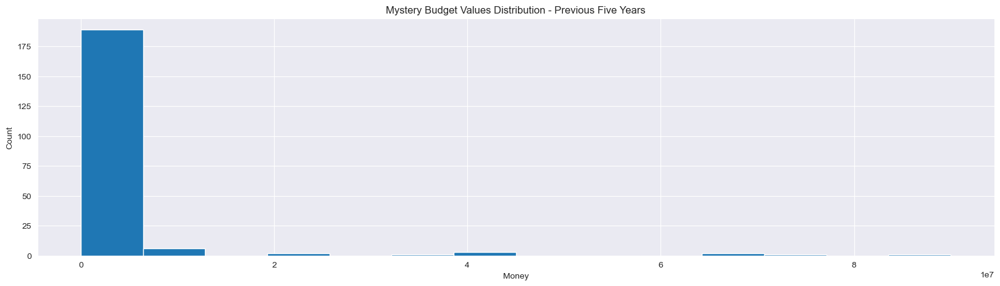

BUDGET Median = 5454.0, Mean = 2806144.868292683
count    2.050000e+02
mean     2.806145e+06
std      1.189298e+07
min      1.000000e+00
25%      3.000000e+02
50%      5.454000e+03
75%      3.000000e+04
max      9.000000e+07
Name: budget, dtype: float64


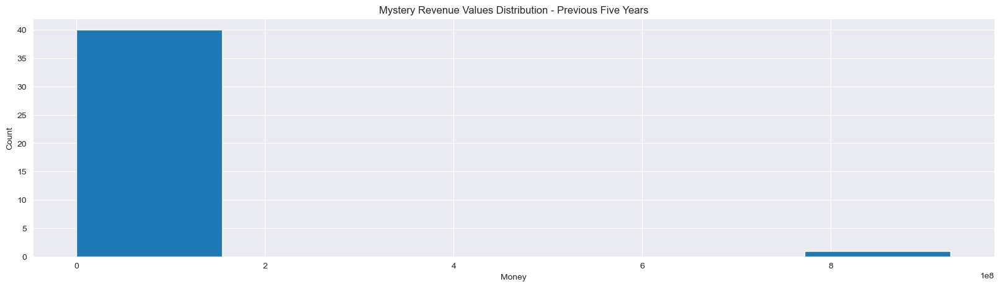

REVENUE Median = 958558.0, Mean = 42487126.17073171
count    4.100000e+01
mean     4.248713e+07
std      1.475343e+08
min      1.000000e+00
25%      5.000000e+03
50%      9.585580e+05
75%      9.738741e+06
max      9.270000e+08
Name: revenue, dtype: float64


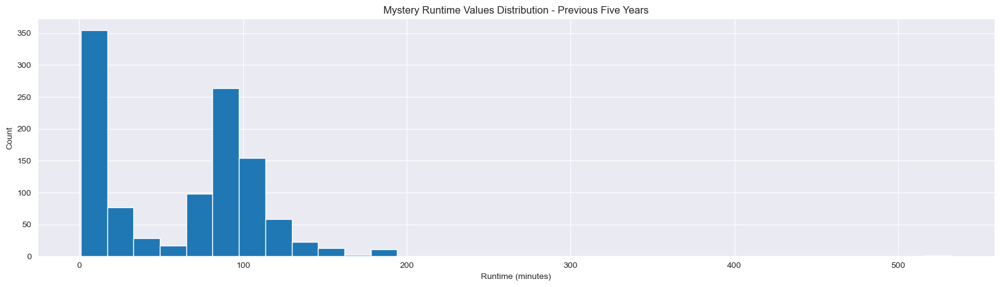

RUNTIME Median = 79.0, Mean = 62.38510445049955
count    1101.000000
mean       62.385104
std        47.371076
min         1.000000
25%        13.000000
50%        79.000000
75%        95.000000
max       532.000000
Name: runtime, dtype: float64


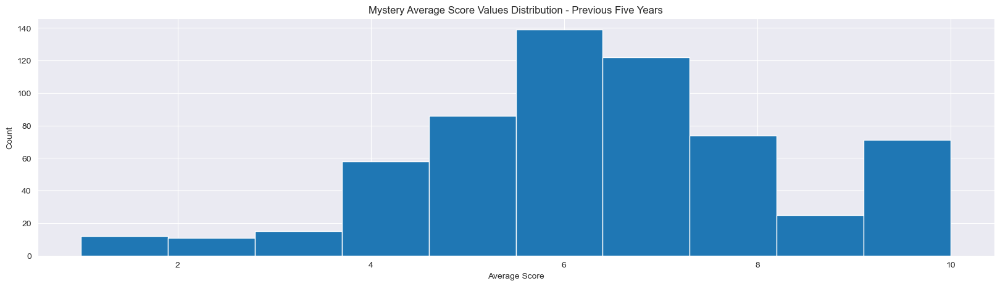

SCORE Median = 6.2, Mean = 6.378665579119086
count    613.000000
mean       6.378666
std        1.996827
min        1.000000
25%        5.200000
50%        6.200000
75%        7.400000
max       10.000000
Name: vote_average, dtype: float64


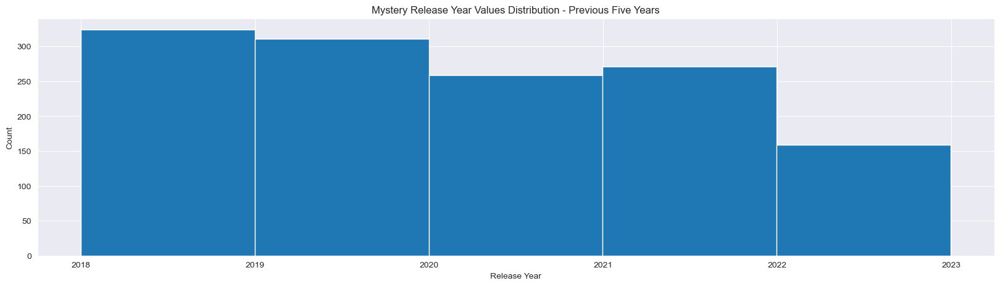

RELEASE DATE Median = 2020-01-25 00:00:00, Mean = 2020-03-11 14:15:57.099697920
count                             1324
mean     2020-03-11 14:15:57.099697920
min                2018-01-01 00:00:00
25%                2019-01-01 00:00:00
50%                2020-01-25 00:00:00
75%                2021-05-07 00:00:00
max                2022-12-31 00:00:00
Name: release_date, dtype: object


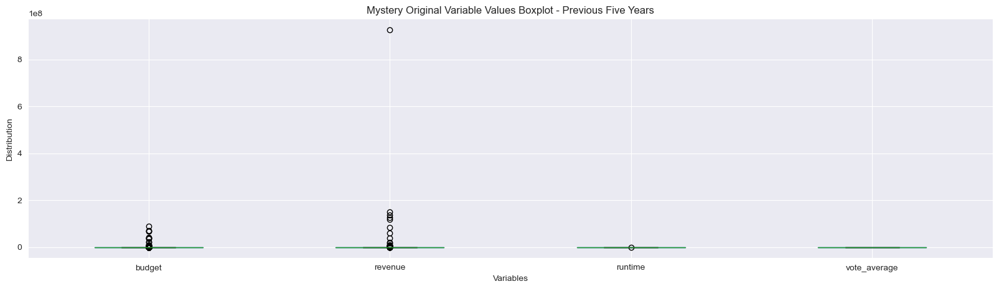

In [90]:
#Show distribution of previous 5 Year Mystery variable values
n_data = len(mys5b_movies.budget)
n_bins = np.sqrt(n_data)
n_bins = int(n_bins)
_ =plt.hist(mys5b_movies.budget, bins=n_bins)
plt.title('Mystery Budget Values Distribution - Previous Five Years')
plt.xlabel('Money')
plt.ylabel('Count')
plt.show()

#Calculate median and mean values for variables
print(f"BUDGET Median = {mys5b_movies.budget.median()}, Mean = {mys5b_movies.budget.mean()}")
print(mys5b_movies.budget.describe())

n_data = len(mys5r_movies.revenue)
n_bins = np.sqrt(n_data)
n_bins = int(n_bins)
_ =plt.hist(mys5r_movies.revenue, bins=n_bins)
plt.title('Mystery Revenue Values Distribution - Previous Five Years')
plt.xlabel('Money')
plt.ylabel('Count')
plt.show()

print(f"REVENUE Median = {mys5r_movies.revenue.median()}, Mean = {mys5r_movies.revenue.mean()}")
print(mys5r_movies.revenue.describe())

n_data = len(mys5d_movies.runtime)
n_bins = np.sqrt(n_data)
n_bins = int(n_bins)
_ =plt.hist(mys5d_movies.runtime, bins=n_bins)
plt.title('Mystery Runtime Values Distribution - Previous Five Years')
plt.xlabel('Runtime (minutes)')
plt.ylabel('Count')
plt.show()

print(f"RUNTIME Median = {mys5d_movies.runtime.median()}, Mean = {mys5d_movies.runtime.mean()}")
print(mys5d_movies.runtime.describe())

_ =plt.hist(mys5v_movies.vote_average)
plt.title('Mystery Average Score Values Distribution - Previous Five Years')
plt.xlabel('Average Score')
plt.ylabel('Count')
plt.show()

print(f"SCORE Median = {mys5v_movies.vote_average.median()}, Mean = {mys5v_movies.vote_average.mean()}")
print(mys5v_movies.vote_average.describe())

_ =plt.hist(mys5_movies.release_date, bins=5)
plt.title('Mystery Release Year Values Distribution - Previous Five Years')
plt.xlabel('Release Year')
plt.ylabel('Count')
plt.show()

print(f"RELEASE DATE Median = {mys5_movies.release_date.median()}, Mean = {mys5_movies.release_date.mean()}")
print(mys5_movies.release_date.describe(datetime_is_numeric=True))

mys5_movies.boxplot(column=['budget', 'revenue', 'runtime', 'vote_average'])
plt.title('Mystery Original Variable Values Boxplot - Previous Five Years')
plt.xlabel('Variables')
plt.ylabel('Distribution')
plt.show()

In [91]:
#Drop zero values from 5 Year Romance variables. 
#Create a seperate dataframe for each so as not to affect the other variables calculations.
rom5b_movies = rom5_movies[rom5_movies['budget'] !=0]
rom5r_movies = rom5_movies[rom5_movies['revenue'] !=0]
rom5d_movies = rom5_movies[rom5_movies['runtime'] !=0]
rom5v_movies = rom5_movies[rom5_movies['vote_average'] !=0]

#Remove Outliers from 5 Year Romance variables and 
Q1 = rom5b_movies.budget.quantile(0.25)
Q3 = rom5b_movies.budget.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(rom5b_movies['budget']>=upper_limit)[0]
lower_array = np.where(rom5b_movies['budget']<=lower_limit)[0]
rom5b_movies['budget'].drop(index=upper_array, inplace=True)
rom5b_movies['budget'].drop(index=lower_array, inplace=True)

Q1 = rom5r_movies.revenue.quantile(0.25)
Q3 = rom5r_movies.revenue.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(rom5r_movies['revenue']>=upper_limit)[0]
lower_array = np.where(rom5r_movies['revenue']<=lower_limit)[0]
rom5r_movies['revenue'].drop(index=upper_array, inplace=True)
rom5r_movies['revenue'].drop(index=lower_array, inplace=True)

Q1 = rom5d_movies.runtime.quantile(0.25)
Q3 = rom5d_movies.runtime.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(rom5d_movies['runtime']>=upper_limit)[0]
lower_array = np.where(rom5d_movies['runtime']<=lower_limit)[0]
rom5d_movies['runtime'].drop(index=upper_array, inplace=True)
rom5d_movies['runtime'].drop(index=lower_array, inplace=True)

Q1 = rom5v_movies.vote_average.quantile(0.25)
Q3 = rom5v_movies.vote_average.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(rom5v_movies['vote_average']>=upper_limit)[0]
lower_array = np.where(rom5v_movies['vote_average']<=lower_limit)[0]
rom5v_movies['vote_average'].drop(index=upper_array, inplace=True)
rom5v_movies['vote_average'].drop(index=lower_array, inplace=True)

KeyError: '[1, 2, 3, 4, 5, 6, 7, 8, 9, 12, 13, 15, 16, 17, 19, 21, 22, 23, 24, 25, 26, 27, 28, 29, 31, 32, 33, 48, 49, 50, 51, 52, 53, 54, 55, 56, 58, 59, 60, 61, 62, 63, 67, 82, 83, 84, 85, 86, 88, 89, 90, 91, 92, 93, 94, 97, 98, 99, 100, 114, 117, 124, 128, 169] not found in axis'

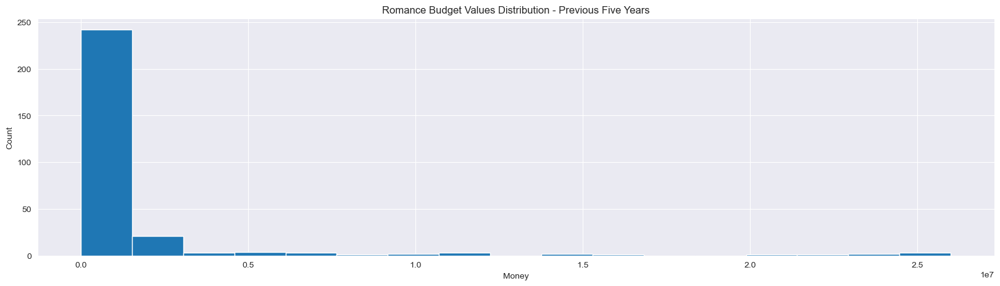

BUDGET Median = 5500.0, Mean = 1443013.519031142
count    2.890000e+02
mean     1.443014e+06
std      4.237352e+06
min      1.000000e+00
25%      2.500000e+02
50%      5.500000e+03
75%      3.000000e+05
max      2.600000e+07
Name: budget, dtype: float64


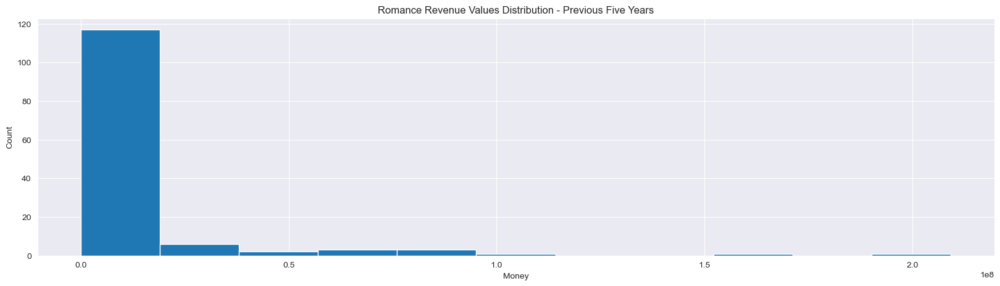

REVENUE Median = 665258.0, Mean = 10774098.925373135
count    1.340000e+02
mean     1.077410e+07
std      2.929119e+07
min      1.000000e+00
25%      1.363800e+04
50%      6.652580e+05
75%      7.455677e+06
max      2.092213e+08
Name: revenue, dtype: float64


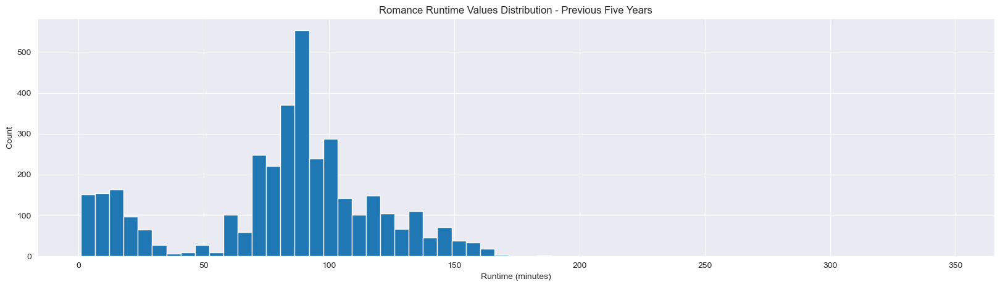

RUNTIME Median = 90.0, Mean = 82.0184581976113
count    3684.000000
mean       82.018458
std        38.625793
min         1.000000
25%        70.000000
50%        90.000000
75%       103.000000
max       348.000000
Name: runtime, dtype: float64


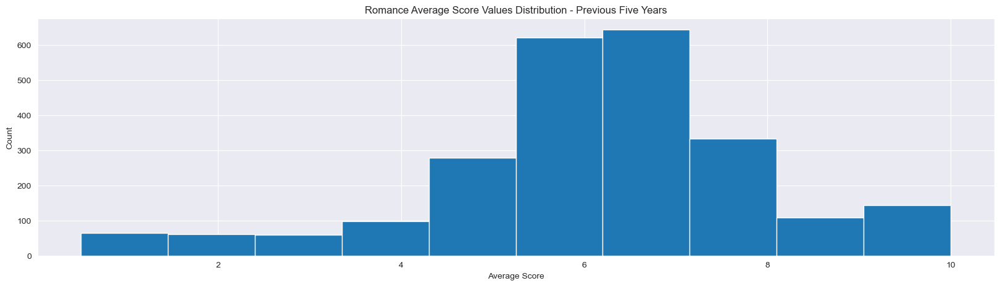

SCORE Median = 6.2, Mean = 6.192197510373429
count    2410.000000
mean        6.192198
std         1.851873
min         0.500000
25%         5.400000
50%         6.200000
75%         7.100000
max        10.000000
Name: vote_average, dtype: float64


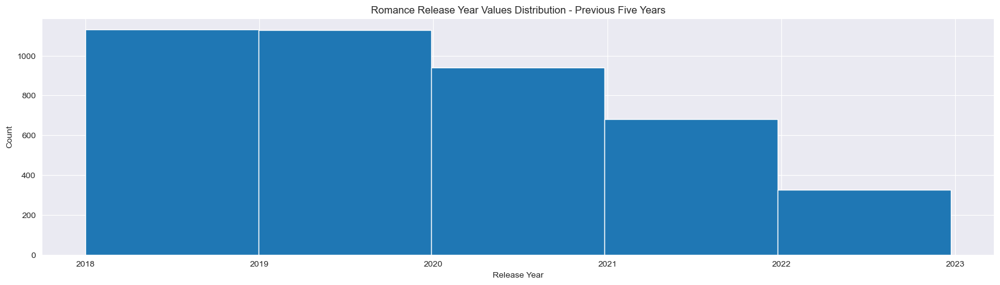

RELEASE DATE Median = 2019-11-23 00:00:00, Mean = 2019-12-25 07:19:28.030447360
count                             4204
mean     2019-12-25 07:19:28.030447360
min                2018-01-01 00:00:00
25%                2018-12-02 18:00:00
50%                2019-11-23 00:00:00
75%                2020-12-13 00:00:00
max                2022-12-23 00:00:00
Name: release_date, dtype: object


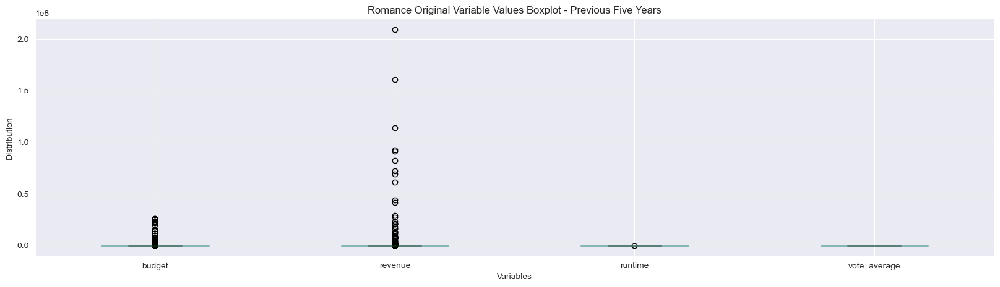

In [92]:
#Show distribution of previous 5 Year Romance variable values
n_data = len(rom5b_movies.budget)
n_bins = np.sqrt(n_data)
n_bins = int(n_bins)
_ =plt.hist(rom5b_movies.budget, bins=n_bins)
plt.title('Romance Budget Values Distribution - Previous Five Years')
plt.xlabel('Money')
plt.ylabel('Count')
plt.show()

#Calculate median and mean values for variables
print(f"BUDGET Median = {rom5b_movies.budget.median()}, Mean = {rom5b_movies.budget.mean()}")
print(rom5b_movies.budget.describe())

n_data = len(rom5r_movies.revenue)
n_bins = np.sqrt(n_data)
n_bins = int(n_bins)
_ =plt.hist(rom5r_movies.revenue, bins=n_bins)
plt.title('Romance Revenue Values Distribution - Previous Five Years')
plt.xlabel('Money')
plt.ylabel('Count')
plt.show()

print(f"REVENUE Median = {rom5r_movies.revenue.median()}, Mean = {rom5r_movies.revenue.mean()}")
print(rom5r_movies.revenue.describe())

n_data = len(rom5d_movies.runtime)
n_bins = np.sqrt(n_data)
n_bins = int(n_bins)
_ =plt.hist(rom5d_movies.runtime, bins=n_bins)
plt.title('Romance Runtime Values Distribution - Previous Five Years')
plt.xlabel('Runtime (minutes)')
plt.ylabel('Count')
plt.show()

print(f"RUNTIME Median = {rom5d_movies.runtime.median()}, Mean = {rom5d_movies.runtime.mean()}")
print(rom5d_movies.runtime.describe())

_ =plt.hist(rom5v_movies.vote_average)
plt.title('Romance Average Score Values Distribution - Previous Five Years')
plt.xlabel('Average Score')
plt.ylabel('Count')
plt.show()

print(f"SCORE Median = {rom5v_movies.vote_average.median()}, Mean = {rom5v_movies.vote_average.mean()}")
print(rom5v_movies.vote_average.describe())

_ =plt.hist(rom5_movies.release_date, bins=5)
plt.title('Romance Release Year Values Distribution - Previous Five Years')
plt.xlabel('Release Year')
plt.ylabel('Count')
plt.show()

print(f"RELEASE DATE Median = {rom5_movies.release_date.median()}, Mean = {rom5_movies.release_date.mean()}")
print(rom5_movies.release_date.describe(datetime_is_numeric=True))

rom5_movies.boxplot(column=['budget', 'revenue', 'runtime', 'vote_average'])
plt.title('Romance Original Variable Values Boxplot - Previous Five Years')
plt.xlabel('Variables')
plt.ylabel('Distribution')
plt.show()

In [93]:
#Drop zero values from 5 Year Science Fiction variables. 
#Create a seperate dataframe for each so as not to affect the other variables calculations.
sci5b_movies = sci5_movies[sci5_movies['budget'] !=0]
sci5r_movies = sci5_movies[sci5_movies['revenue'] !=0]
sci5d_movies = sci5_movies[sci5_movies['runtime'] !=0]
sci5v_movies = sci5_movies[sci5_movies['vote_average'] !=0]

#Remove Outliers from 5 Year Science Fiction variables and 
Q1 = sci5b_movies.budget.quantile(0.25)
Q3 = sci5b_movies.budget.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(sci5b_movies['budget']>=upper_limit)[0]
lower_array = np.where(sci5b_movies['budget']<=lower_limit)[0]
sci5b_movies['budget'].drop(index=upper_array, inplace=True)
sci5b_movies['budget'].drop(index=lower_array, inplace=True)

Q1 = sci5r_movies.revenue.quantile(0.25)
Q3 = sci5r_movies.revenue.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(sci5r_movies['revenue']>=upper_limit)[0]
lower_array = np.where(sci5r_movies['revenue']<=lower_limit)[0]
sci5r_movies['revenue'].drop(index=upper_array, inplace=True)
sci5r_movies['revenue'].drop(index=lower_array, inplace=True)

Q1 = sci5d_movies.runtime.quantile(0.25)
Q3 = sci5d_movies.runtime.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(sci5d_movies['runtime']>=upper_limit)[0]
lower_array = np.where(sci5d_movies['runtime']<=lower_limit)[0]
sci5d_movies['runtime'].drop(index=upper_array, inplace=True)
sci5d_movies['runtime'].drop(index=lower_array, inplace=True)

Q1 = sci5v_movies.vote_average.quantile(0.25)
Q3 = sci5v_movies.vote_average.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(sci5v_movies['vote_average']>=upper_limit)[0]
lower_array = np.where(sci5v_movies['vote_average']<=lower_limit)[0]
sci5v_movies['vote_average'].drop(index=upper_array, inplace=True)
sci5v_movies['vote_average'].drop(index=lower_array, inplace=True)

KeyError: '[1, 3, 5, 12, 13, 14, 16, 18, 19, 28, 31, 34, 35, 36, 38, 39, 40, 41, 43, 44, 45, 46, 47, 48, 49, 51, 52, 53, 55, 57, 58, 59, 64, 66, 70, 71, 83, 84, 85, 86, 87, 88, 89, 90, 91, 94, 95, 96, 98, 99, 100, 101, 132, 147, 150, 195, 247, 248, 249, 250, 269, 270, 271, 272, 443] not found in axis'

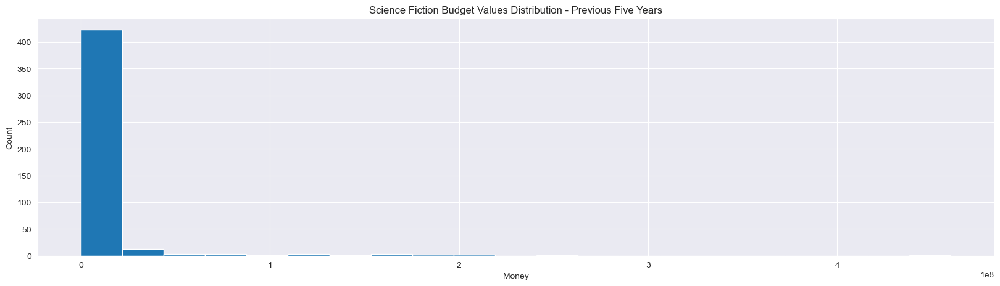

BUDGET Median = 12000.0, Mean = 7916333.597802198
count    4.550000e+02
mean     7.916334e+06
std      3.615836e+07
min      1.000000e+00
25%      1.500000e+03
50%      1.200000e+04
75%      1.000000e+05
max      4.600000e+08
Name: budget, dtype: float64


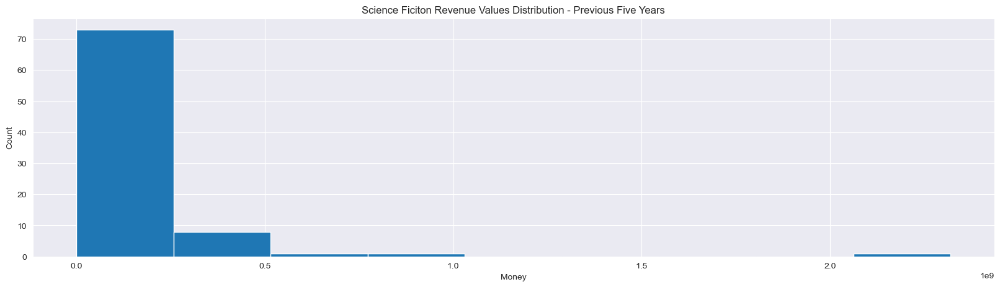

REVENUE Median = 352011.5, Mean = 94978889.15476191
count    8.400000e+01
mean     9.497889e+07
std      2.908334e+08
min      1.000000e+00
25%      4.993250e+03
50%      3.520115e+05
75%      1.457178e+07
max      2.320250e+09
Name: revenue, dtype: float64


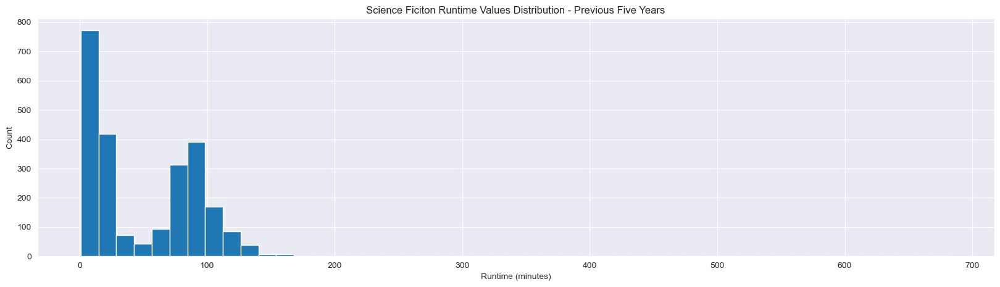

RUNTIME Median = 30.0, Mean = 50.71410839884154
count    2417.000000
mean       50.714108
std        44.374588
min         1.000000
25%        12.000000
50%        30.000000
75%        88.000000
max       683.000000
Name: runtime, dtype: float64


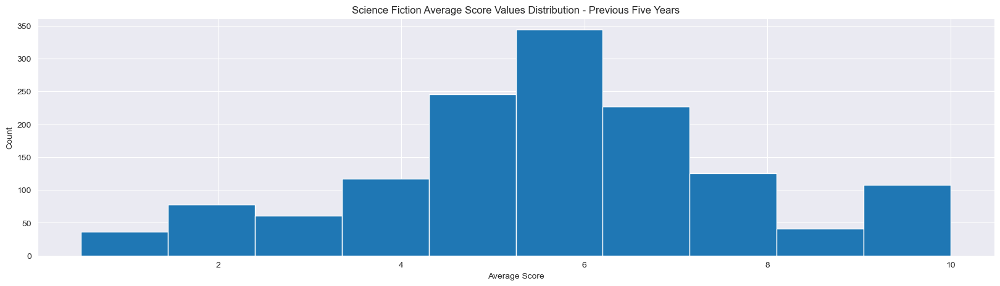

SCORE Median = 5.6, Mean = 5.707294287780194
count    1383.000000
mean        5.707294
std         2.103862
min         0.500000
25%         4.600000
50%         5.600000
75%         7.000000
max        10.000000
Name: vote_average, dtype: float64


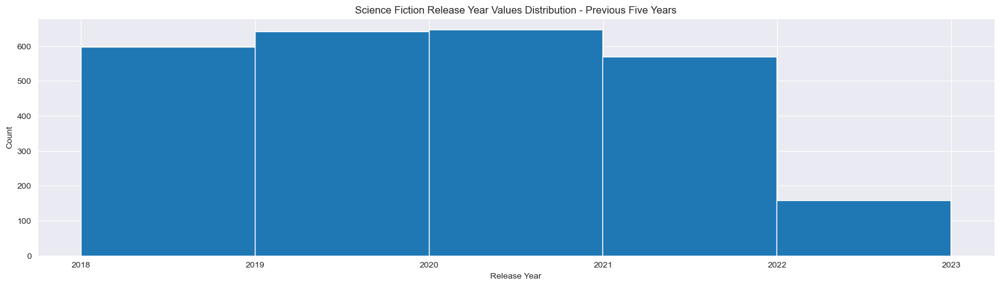

RELEASE DATE Median = 2020-02-20 00:00:00, Mean = 2020-02-20 12:29:11.798010624
count                             2614
mean     2020-02-20 12:29:11.798010624
min                2018-01-01 00:00:00
25%                2019-02-05 00:00:00
50%                2020-02-20 00:00:00
75%                2021-02-08 00:00:00
max                2022-12-31 00:00:00
Name: release_date, dtype: object


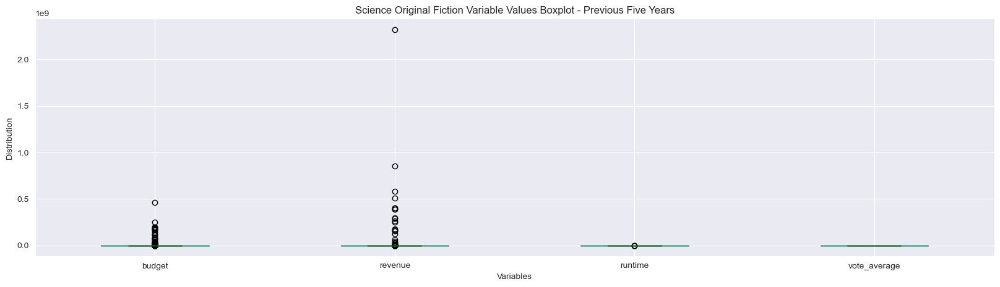

In [94]:
#Show distribution of previous 5 Year Science Fiction variable values
n_data = len(sci5b_movies.budget)
n_bins = np.sqrt(n_data)
n_bins = int(n_bins)
_ =plt.hist(sci5b_movies.budget, bins=n_bins)
plt.title('Science Fiction Budget Values Distribution - Previous Five Years')
plt.xlabel('Money')
plt.ylabel('Count')
plt.show()

#Calculate median and mean values for variables
print(f"BUDGET Median = {sci5b_movies.budget.median()}, Mean = {sci5b_movies.budget.mean()}")
print(sci5b_movies.budget.describe())

n_data = len(sci5r_movies.revenue)
n_bins = np.sqrt(n_data)
n_bins = int(n_bins)
_ =plt.hist(sci5r_movies.revenue, bins=n_bins)
plt.title('Science Ficiton Revenue Values Distribution - Previous Five Years')
plt.xlabel('Money')
plt.ylabel('Count')
plt.show()

print(f"REVENUE Median = {sci5r_movies.revenue.median()}, Mean = {sci5r_movies.revenue.mean()}")
print(sci5r_movies.revenue.describe())

n_data = len(sci5d_movies.runtime)
n_bins = np.sqrt(n_data)
n_bins = int(n_bins)
_ =plt.hist(sci5d_movies.runtime, bins=n_bins)
plt.title('Science Ficiton Runtime Values Distribution - Previous Five Years')
plt.xlabel('Runtime (minutes)')
plt.ylabel('Count')
plt.show()

print(f"RUNTIME Median = {sci5d_movies.runtime.median()}, Mean = {sci5d_movies.runtime.mean()}")
print(sci5d_movies.runtime.describe())

_ =plt.hist(sci5v_movies.vote_average)
plt.title('Science Fiction Average Score Values Distribution - Previous Five Years')
plt.xlabel('Average Score')
plt.ylabel('Count')
plt.show()

print(f"SCORE Median = {sci5v_movies.vote_average.median()}, Mean = {sci5v_movies.vote_average.mean()}")
print(sci5v_movies.vote_average.describe())

_ =plt.hist(sci5_movies.release_date, bins=5)
plt.title('Science Fiction Release Year Values Distribution - Previous Five Years')
plt.xlabel('Release Year')
plt.ylabel('Count')
plt.show()

print(f"RELEASE DATE Median = {sci5_movies.release_date.median()}, Mean = {sci5_movies.release_date.mean()}")
print(sci5_movies.release_date.describe(datetime_is_numeric=True))

sci5_movies.boxplot(column=['budget', 'revenue', 'runtime', 'vote_average'])
plt.title('Science Original Fiction Variable Values Boxplot - Previous Five Years')
plt.xlabel('Variables')
plt.ylabel('Distribution')
plt.show()

In [95]:
#Drop zero values from 5 Year Thriller variables. 
#Create a seperate dataframe for each so as not to affect the other variables calculations.
thr5b_movies = thr5_movies[thr5_movies['budget'] !=0]
thr5r_movies = thr5_movies[thr5_movies['revenue'] !=0]
thr5d_movies = thr5_movies[thr5_movies['runtime'] !=0]
thr5v_movies = thr5_movies[thr5_movies['vote_average'] !=0]

#Remove Outliers from 5 Year Thriller variables and 
Q1 = thr5b_movies.budget.quantile(0.25)
Q3 = thr5b_movies.budget.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(thr5b_movies['budget']>=upper_limit)[0]
lower_array = np.where(thr5b_movies['budget']<=lower_limit)[0]
thr5b_movies['budget'].drop(index=upper_array, inplace=True)
thr5b_movies['budget'].drop(index=lower_array, inplace=True)

Q1 = thr5r_movies.revenue.quantile(0.25)
Q3 = thr5r_movies.revenue.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(thr5r_movies['revenue']>=upper_limit)[0]
lower_array = np.where(thr5r_movies['revenue']<=lower_limit)[0]
thr5r_movies['revenue'].drop(index=upper_array, inplace=True)
thr5r_movies['revenue'].drop(index=lower_array, inplace=True)

Q1 = thr5d_movies.runtime.quantile(0.25)
Q3 = thr5d_movies.runtime.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(thr5d_movies['runtime']>=upper_limit)[0]
lower_array = np.where(thr5d_movies['runtime']<=lower_limit)[0]
thr5d_movies['runtime'].drop(index=upper_array, inplace=True)
thr5d_movies['runtime'].drop(index=lower_array, inplace=True)

Q1 = thr5v_movies.vote_average.quantile(0.25)
Q3 = thr5v_movies.vote_average.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(thr5v_movies['vote_average']>=upper_limit)[0]
lower_array = np.where(thr5v_movies['vote_average']<=lower_limit)[0]
thr5v_movies['vote_average'].drop(index=upper_array, inplace=True)
thr5v_movies['vote_average'].drop(index=lower_array, inplace=True)

KeyError: '[0, 1, 2, 4, 5, 7, 8, 9, 10, 11, 12, 13, 15, 16, 17, 18, 19, 20, 21, 23, 24, 26, 27, 30, 33, 36, 37, 38, 39, 41, 42, 43, 44, 45, 46, 48, 50, 51, 52, 53, 54, 55, 58, 59, 63, 64, 68, 70, 71, 72, 75, 76, 77, 78, 79, 80, 82, 83, 85, 86, 87, 91, 94, 96, 98, 99, 110, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 139, 140, 141, 142, 146, 147, 148, 149, 150, 151, 153, 159, 169, 175, 187, 193, 194, 196, 197, 198, 199, 226, 228, 229, 231, 232, 237, 262, 276, 277, 324, 340, 347, 382, 467, 473, 494, 495, 504, 547, 701, 710] not found in axis'

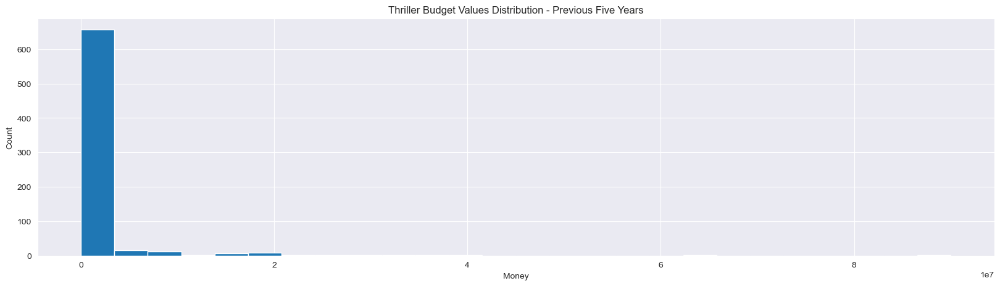

BUDGET Median = 10000.0, Mean = 1429163.4008438818
count    7.110000e+02
mean     1.429163e+06
std      6.019053e+06
min      1.000000e+00
25%      1.000000e+03
50%      1.000000e+04
75%      1.500000e+05
max      9.000000e+07
Name: budget, dtype: float64


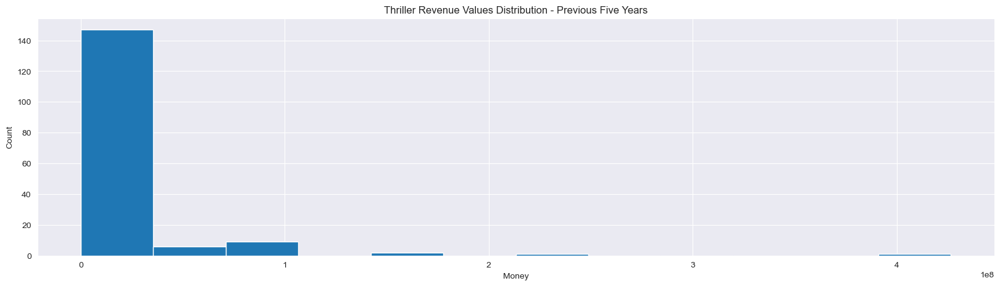

REVENUE Median = 221400.5, Mean = 15641164.891566265
count    1.660000e+02
mean     1.564116e+07
std      4.660998e+07
min      1.000000e+00
25%      4.000000e+03
50%      2.214005e+05
75%      3.459186e+06
max      4.265052e+08
Name: revenue, dtype: float64


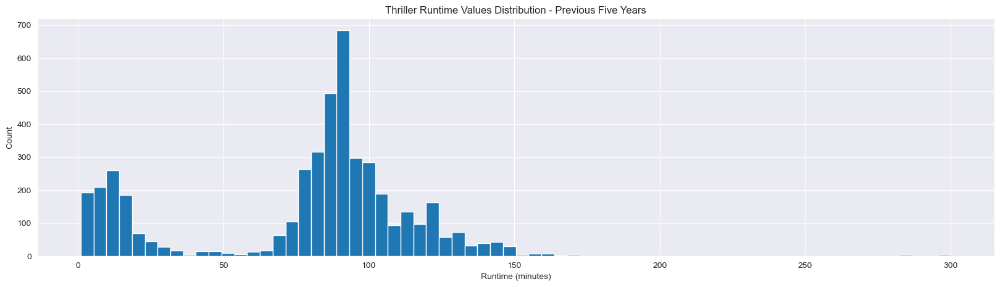

RUNTIME Median = 88.0, Mean = 78.06863596872284
count    4604.000000
mean       78.068636
std        39.717847
min         1.000000
25%        71.000000
50%        88.000000
75%       100.000000
max       300.000000
Name: runtime, dtype: float64


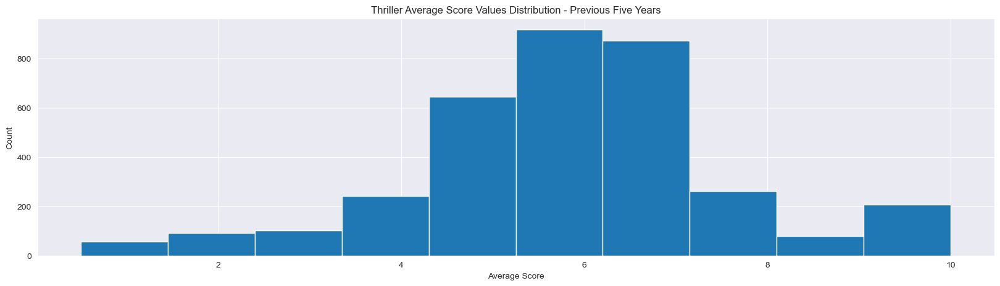

SCORE Median = 6.0, Mean = 5.8921926948518895
count    3477.000000
mean        5.892193
std         1.792684
min         0.500000
25%         5.000000
50%         6.000000
75%         6.900000
max        10.000000
Name: vote_average, dtype: float64


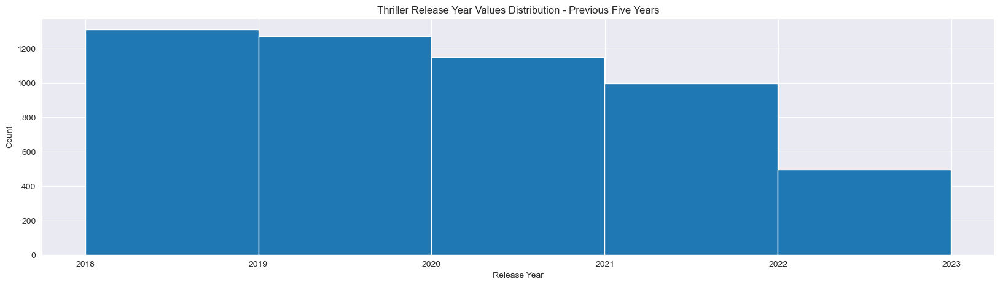

RELEASE DATE Median = 2020-01-09 00:00:00, Mean = 2020-02-19 03:41:14.482758656
count                             5220
mean     2020-02-19 03:41:14.482758656
min                2018-01-01 00:00:00
25%                2018-12-31 00:00:00
50%                2020-01-09 00:00:00
75%                2021-03-05 00:00:00
max                2022-12-31 00:00:00
Name: release_date, dtype: object


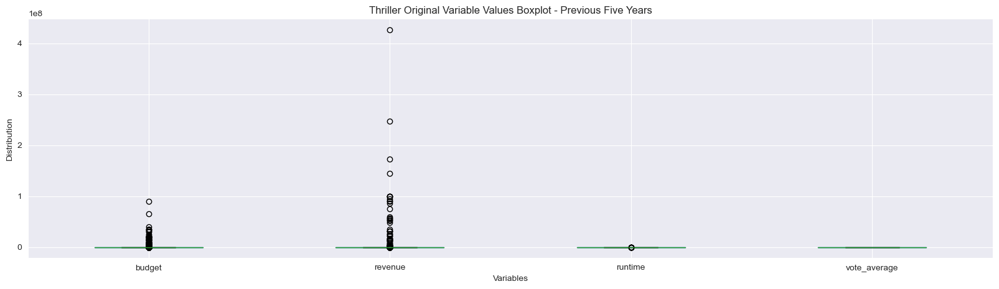

In [96]:
#Show distribution of previous 5 Year Thriller variable values
n_data = len(thr5b_movies.budget)
n_bins = np.sqrt(n_data)
n_bins = int(n_bins)
_ =plt.hist(thr5b_movies.budget, bins=n_bins)
plt.title('Thriller Budget Values Distribution - Previous Five Years')
plt.xlabel('Money')
plt.ylabel('Count')
plt.show()

#Calculate median and mean values for variables
print(f"BUDGET Median = {thr5b_movies.budget.median()}, Mean = {thr5b_movies.budget.mean()}")
print(thr5b_movies.budget.describe())

n_data = len(thr5r_movies.revenue)
n_bins = np.sqrt(n_data)
n_bins = int(n_bins)
_ =plt.hist(thr5r_movies.revenue, bins=n_bins)
plt.title('Thriller Revenue Values Distribution - Previous Five Years')
plt.xlabel('Money')
plt.ylabel('Count')
plt.show()

print(f"REVENUE Median = {thr5r_movies.revenue.median()}, Mean = {thr5r_movies.revenue.mean()}")
print(thr5r_movies.revenue.describe())

n_data = len(thr5d_movies.runtime)
n_bins = np.sqrt(n_data)
n_bins = int(n_bins)
_ =plt.hist(thr5d_movies.runtime, bins=n_bins)
plt.title('Thriller Runtime Values Distribution - Previous Five Years')
plt.xlabel('Runtime (minutes)')
plt.ylabel('Count')
plt.show()

print(f"RUNTIME Median = {thr5d_movies.runtime.median()}, Mean = {thr5d_movies.runtime.mean()}")
print(thr5d_movies.runtime.describe())

_ =plt.hist(thr5v_movies.vote_average)
plt.title('Thriller Average Score Values Distribution - Previous Five Years')
plt.xlabel('Average Score')
plt.ylabel('Count')
plt.show()

print(f"SCORE Median = {thr5v_movies.vote_average.median()}, Mean = {thr5v_movies.vote_average.mean()}")
print(thr5v_movies.vote_average.describe())

_ =plt.hist(thr5_movies.release_date, bins=5)
plt.title('Thriller Release Year Values Distribution - Previous Five Years')
plt.xlabel('Release Year')
plt.ylabel('Count')
plt.show()

print(f"RELEASE DATE Median = {thr5_movies.release_date.median()}, Mean = {thr5_movies.release_date.mean()}")
print(thr5_movies.release_date.describe(datetime_is_numeric=True))

thr5_movies.boxplot(column=['budget', 'revenue', 'runtime', 'vote_average'])
plt.title('Thriller Original Variable Values Boxplot - Previous Five Years')
plt.xlabel('Variables')
plt.ylabel('Distribution')
plt.show()

In [97]:
#Drop zero values from 5 Year TV Movie variables. 
#Create a seperate dataframe for each so as not to affect the other variables calculations.
tvm5b_movies = tvm5_movies[tvm5_movies['budget'] !=0]
tvm5r_movies = tvm5_movies[tvm5_movies['revenue'] !=0]
tvm5d_movies = tvm5_movies[tvm5_movies['runtime'] !=0]
tvm5v_movies = tvm5_movies[tvm5_movies['vote_average'] !=0]

#Remove Outliers from 5 Year TV Movie variables and 
Q1 = tvm5b_movies.budget.quantile(0.25)
Q3 = tvm5b_movies.budget.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(tvm5b_movies['budget']>=upper_limit)[0]
lower_array = np.where(tvm5b_movies['budget']<=lower_limit)[0]
tvm5b_movies['budget'].drop(index=upper_array, inplace=True)
tvm5b_movies['budget'].drop(index=lower_array, inplace=True)

Q1 = tvm5r_movies.revenue.quantile(0.25)
Q3 = tvm5r_movies.revenue.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(tvm5r_movies['revenue']>=upper_limit)[0]
lower_array = np.where(tvm5r_movies['revenue']<=lower_limit)[0]
tvm5r_movies['revenue'].drop(index=upper_array, inplace=True)
tvm5r_movies['revenue'].drop(index=lower_array, inplace=True)

Q1 = tvm5d_movies.runtime.quantile(0.25)
Q3 = tvm5d_movies.runtime.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(tvm5d_movies['runtime']>=upper_limit)[0]
lower_array = np.where(tvm5d_movies['runtime']<=lower_limit)[0]
tvm5d_movies['runtime'].drop(index=upper_array, inplace=True)
tvm5d_movies['runtime'].drop(index=lower_array, inplace=True)

Q1 = tvm5v_movies.vote_average.quantile(0.25)
Q3 = tvm5v_movies.vote_average.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(tvm5v_movies['vote_average']>=upper_limit)[0]
lower_array = np.where(tvm5v_movies['vote_average']<=lower_limit)[0]
tvm5v_movies['vote_average'].drop(index=upper_array, inplace=True)
tvm5v_movies['vote_average'].drop(index=lower_array, inplace=True)

KeyError: '[1] not found in axis'

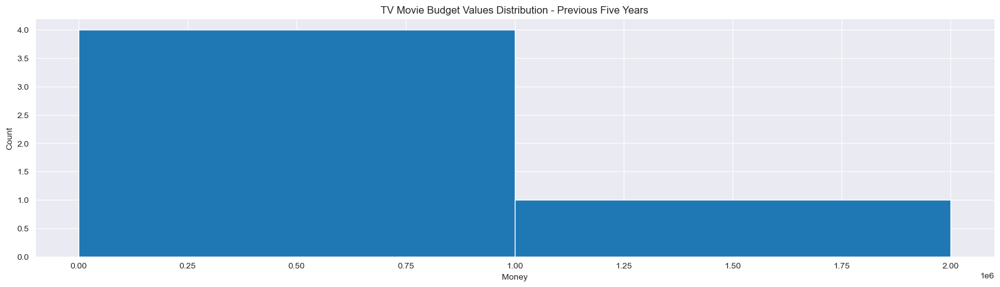

BUDGET Median = 84.0, Mean = 401018.4
count    5.000000e+00
mean     4.010184e+05
std      8.938605e+05
min      1.000000e+00
25%      7.000000e+00
50%      8.400000e+01
75%      5.000000e+03
max      2.000000e+06
Name: budget, dtype: float64


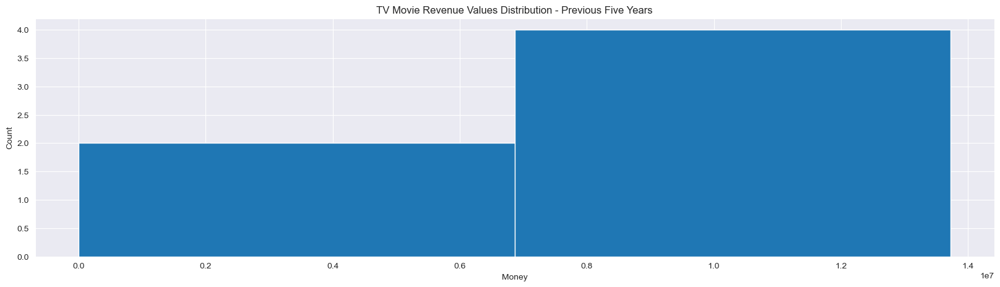

REVENUE Median = 13728000.0, Mean = 9152017.666666666
count    6.000000e+00
mean     9.152018e+06
std      7.089081e+06
min      6.000000e+00
25%      3.432075e+06
50%      1.372800e+07
75%      1.372800e+07
max      1.372800e+07
Name: revenue, dtype: float64


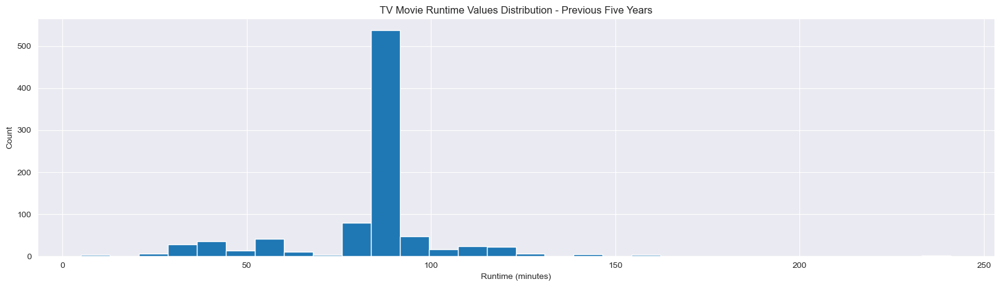

RUNTIME Median = 85.0, Mean = 83.32399103139014
count    892.000000
mean      83.323991
std       22.122285
min        5.000000
25%       83.750000
50%       85.000000
75%       90.000000
max      241.000000
Name: runtime, dtype: float64


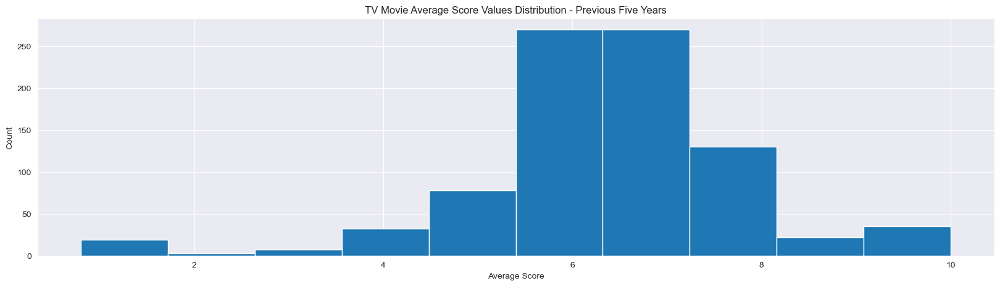

SCORE Median = 6.4, Mean = 6.402016166281762
count    866.000000
mean       6.402016
std        1.488052
min        0.800000
25%        5.800000
50%        6.400000
75%        7.100000
max       10.000000
Name: vote_average, dtype: float64


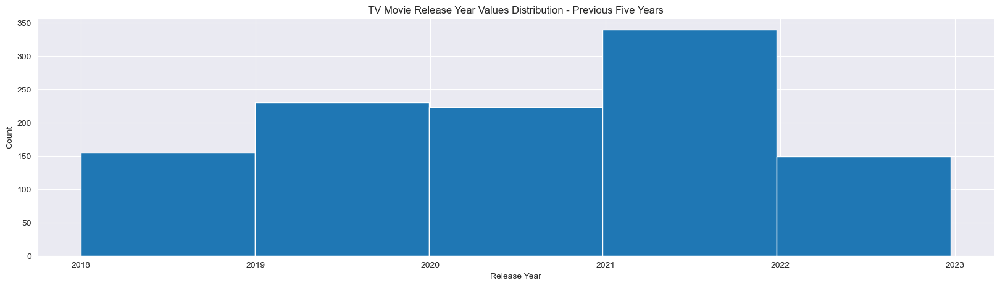

RELEASE DATE Median = 2020-11-12 00:00:00, Mean = 2020-08-11 15:46:53.114754048
count                             1098
mean     2020-08-11 15:46:53.114754048
min                2018-01-01 00:00:00
25%                2019-08-18 18:00:00
50%                2020-11-12 00:00:00
75%                2021-11-04 18:00:00
max                2022-12-23 00:00:00
Name: release_date, dtype: object


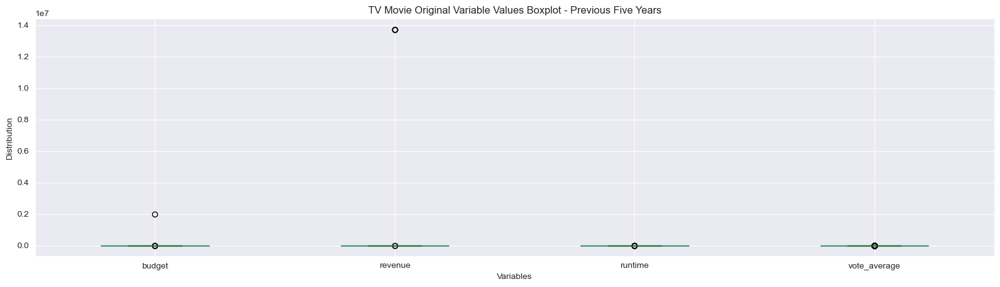

In [98]:
#Show distribution of previous 5 Year TV Movie variable values
n_data = len(tvm5b_movies.budget)
n_bins = np.sqrt(n_data)
n_bins = int(n_bins)
_ =plt.hist(tvm5b_movies.budget, bins=n_bins)
plt.title('TV Movie Budget Values Distribution - Previous Five Years')
plt.xlabel('Money')
plt.ylabel('Count')
plt.show()

#Calculate median and mean values for variables
print(f"BUDGET Median = {tvm5b_movies.budget.median()}, Mean = {tvm5b_movies.budget.mean()}")
print(tvm5b_movies.budget.describe())

n_data = len(tvm5r_movies.revenue)
n_bins = np.sqrt(n_data)
n_bins = int(n_bins)
_ =plt.hist(tvm5r_movies.revenue, bins=n_bins)
plt.title('TV Movie Revenue Values Distribution - Previous Five Years')
plt.xlabel('Money')
plt.ylabel('Count')
plt.show()

print(f"REVENUE Median = {tvm5r_movies.revenue.median()}, Mean = {tvm5r_movies.revenue.mean()}")
print(tvm5r_movies.revenue.describe())

n_data = len(tvm5d_movies.runtime)
n_bins = np.sqrt(n_data)
n_bins = int(n_bins)
_ =plt.hist(tvm5d_movies.runtime, bins=n_bins)
plt.title('TV Movie Runtime Values Distribution - Previous Five Years')
plt.xlabel('Runtime (minutes)')
plt.ylabel('Count')
plt.show()

print(f"RUNTIME Median = {tvm5d_movies.runtime.median()}, Mean = {tvm5d_movies.runtime.mean()}")
print(tvm5d_movies.runtime.describe())

_ =plt.hist(tvm5v_movies.vote_average)
plt.title('TV Movie Average Score Values Distribution - Previous Five Years')
plt.xlabel('Average Score')
plt.ylabel('Count')
plt.show()

print(f"SCORE Median = {tvm5v_movies.vote_average.median()}, Mean = {tvm5v_movies.vote_average.mean()}")
print(tvm5v_movies.vote_average.describe())

_ =plt.hist(tvm5_movies.release_date, bins=5)
plt.title('TV Movie Release Year Values Distribution - Previous Five Years')
plt.xlabel('Release Year')
plt.ylabel('Count')
plt.show()

print(f"RELEASE DATE Median = {tvm5_movies.release_date.median()}, Mean = {tvm5_movies.release_date.mean()}")
print(tvm5_movies.release_date.describe(datetime_is_numeric=True))

tvm5_movies.boxplot(column=['budget', 'revenue', 'runtime', 'vote_average'])
plt.title('TV Movie Original Variable Values Boxplot - Previous Five Years')
plt.xlabel('Variables')
plt.ylabel('Distribution')
plt.show()

In [99]:
#Drop zero values from 5 Year War variables. 
#Create a seperate dataframe for each so as not to affect the other variables calculations.
war5b_movies = war5_movies[war5_movies['budget'] !=0]
war5r_movies = war5_movies[war5_movies['revenue'] !=0]
war5d_movies = war5_movies[war5_movies['runtime'] !=0]
war5v_movies = war5_movies[war5_movies['vote_average'] !=0]

#Remove Outliers from 5 Year War variables and 
Q1 = war5b_movies.budget.quantile(0.25)
Q3 = war5b_movies.budget.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(war5b_movies['budget']>=upper_limit)[0]
lower_array = np.where(war5b_movies['budget']<=lower_limit)[0]
war5b_movies['budget'].drop(index=upper_array, inplace=True)
war5b_movies['budget'].drop(index=lower_array, inplace=True)

Q1 = war5r_movies.revenue.quantile(0.25)
Q3 = war5r_movies.revenue.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(war5r_movies['revenue']>=upper_limit)[0]
lower_array = np.where(war5r_movies['revenue']<=lower_limit)[0]
war5r_movies['revenue'].drop(index=upper_array, inplace=True)
war5r_movies['revenue'].drop(index=lower_array, inplace=True)

Q1 = war5d_movies.runtime.quantile(0.25)
Q3 = war5d_movies.runtime.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(war5d_movies['runtime']>=upper_limit)[0]
lower_array = np.where(war5d_movies['runtime']<=lower_limit)[0]
war5d_movies['runtime'].drop(index=upper_array, inplace=True)
war5d_movies['runtime'].drop(index=lower_array, inplace=True)

Q1 = war5v_movies.vote_average.quantile(0.25)
Q3 = war5v_movies.vote_average.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(war5v_movies['vote_average']>=upper_limit)[0]
lower_array = np.where(war5v_movies['vote_average']<=lower_limit)[0]
war5v_movies['vote_average'].drop(index=upper_array, inplace=True)
war5v_movies['vote_average'].drop(index=lower_array, inplace=True)

KeyError: '[2, 7, 16] not found in axis'

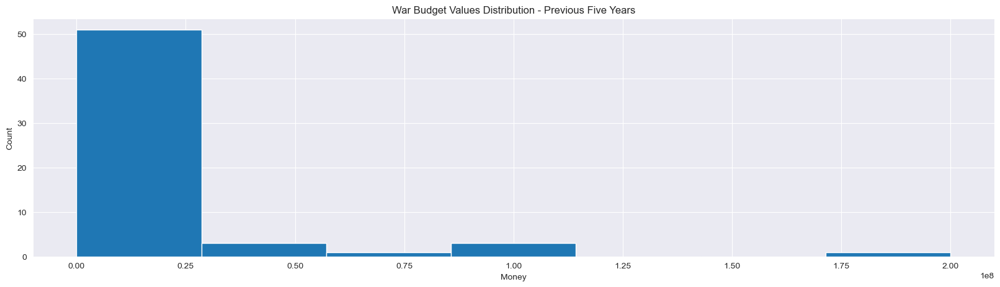

BUDGET Median = 150000.0, Mean = 14924528.711864406
count    5.900000e+01
mean     1.492453e+07
std      3.470152e+07
min      6.000000e+00
25%      3.500000e+03
50%      1.500000e+05
75%      1.165250e+07
max      2.000000e+08
Name: budget, dtype: float64


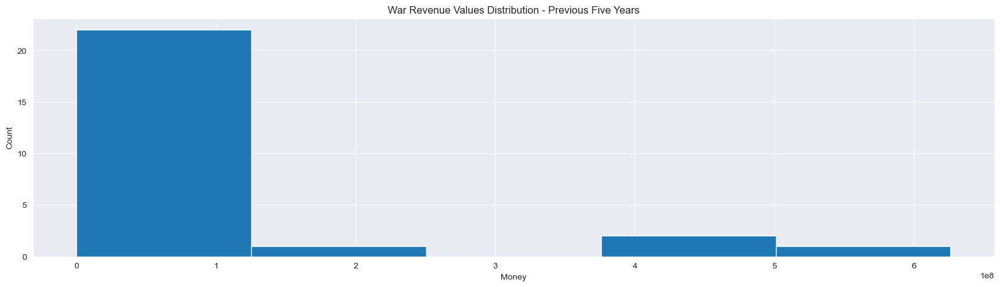

REVENUE Median = 4406922.0, Mean = 72325306.76923077
count    2.600000e+01
mean     7.232531e+07
std      1.613702e+08
min      1.000000e+00
25%      8.930172e+05
50%      4.406922e+06
75%      3.668357e+07
max      6.262033e+08
Name: revenue, dtype: float64


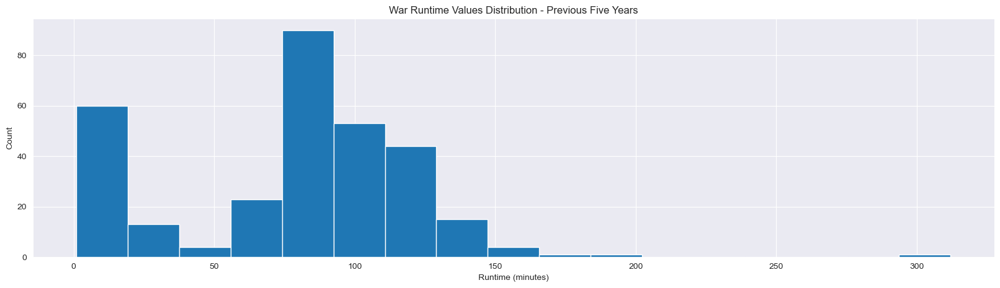

RUNTIME Median = 88.0, Mean = 79.90291262135922
count    309.000000
mean      79.902913
std       43.387154
min        1.000000
25%       57.000000
50%       88.000000
75%      109.000000
max      312.000000
Name: runtime, dtype: float64


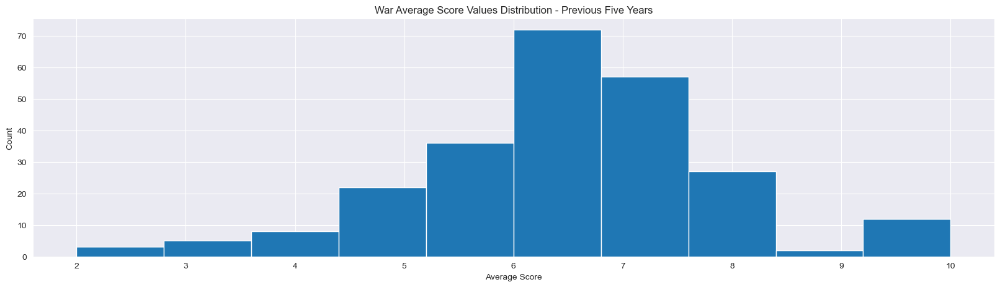

SCORE Median = 6.4, Mean = 6.438192622950818
count    244.000000
mean       6.438193
std        1.432708
min        2.000000
25%        5.700000
50%        6.400000
75%        7.200000
max       10.000000
Name: vote_average, dtype: float64


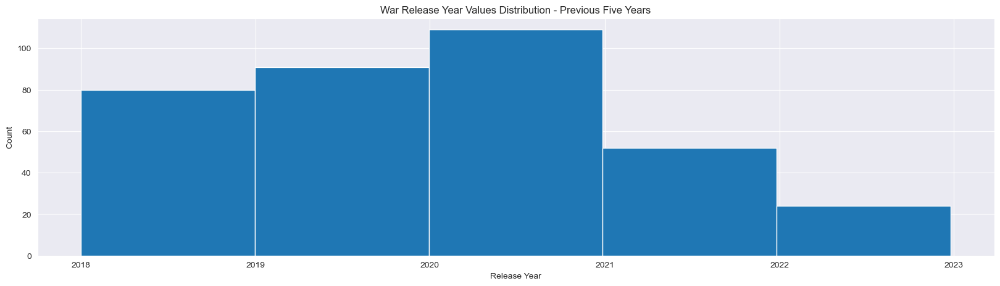

RELEASE DATE Median = 2020-01-22 12:00:00, Mean = 2020-02-04 17:43:49.213483264
count                              356
mean     2020-02-04 17:43:49.213483264
min                2018-01-01 00:00:00
25%                2019-02-07 06:00:00
50%                2020-01-22 12:00:00
75%                2020-11-26 00:00:00
max                2022-12-25 00:00:00
Name: release_date, dtype: object


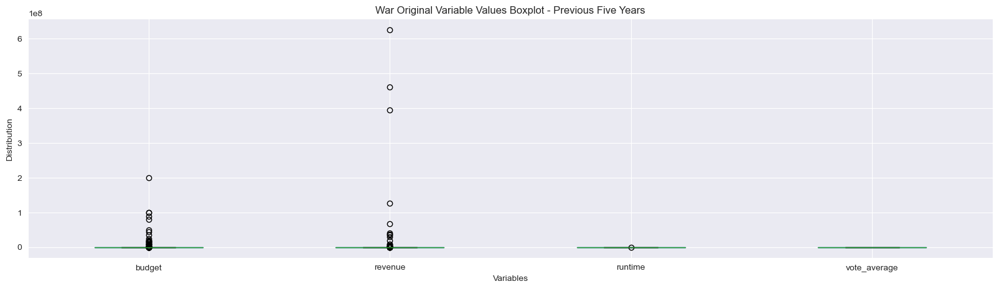

In [100]:
#Show distribution of previous 5 Year War variable values
n_data = len(war5b_movies.budget)
n_bins = np.sqrt(n_data)
n_bins = int(n_bins)
_ =plt.hist(war5b_movies.budget, bins=n_bins)
plt.title('War Budget Values Distribution - Previous Five Years')
plt.xlabel('Money')
plt.ylabel('Count')
plt.show()

#Calculate median and mean values for variables
print(f"BUDGET Median = {war5b_movies.budget.median()}, Mean = {war5b_movies.budget.mean()}")
print(war5b_movies.budget.describe())

n_data = len(war5r_movies.revenue)
n_bins = np.sqrt(n_data)
n_bins = int(n_bins)
_ =plt.hist(war5r_movies.revenue, bins=n_bins)
plt.title('War Revenue Values Distribution - Previous Five Years')
plt.xlabel('Money')
plt.ylabel('Count')
plt.show()

print(f"REVENUE Median = {war5r_movies.revenue.median()}, Mean = {war5r_movies.revenue.mean()}")
print(war5r_movies.revenue.describe())

n_data = len(war5d_movies.runtime)
n_bins = np.sqrt(n_data)
n_bins = int(n_bins)
_ =plt.hist(war5d_movies.runtime, bins=n_bins)
plt.title('War Runtime Values Distribution - Previous Five Years')
plt.xlabel('Runtime (minutes)')
plt.ylabel('Count')
plt.show()

print(f"RUNTIME Median = {war5d_movies.runtime.median()}, Mean = {war5d_movies.runtime.mean()}")
print(war5d_movies.runtime.describe())

_ =plt.hist(war5v_movies.vote_average)
plt.title('War Average Score Values Distribution - Previous Five Years')
plt.xlabel('Average Score')
plt.ylabel('Count')
plt.show()

print(f"SCORE Median = {war5v_movies.vote_average.median()}, Mean = {war5v_movies.vote_average.mean()}")
print(war5v_movies.vote_average.describe())

_ =plt.hist(war5_movies.release_date, bins=5)
plt.title('War Release Year Values Distribution - Previous Five Years')
plt.xlabel('Release Year')
plt.ylabel('Count')
plt.show()

print(f"RELEASE DATE Median = {war5_movies.release_date.median()}, Mean = {war5_movies.release_date.mean()}")
print(war5_movies.release_date.describe(datetime_is_numeric=True))

war5_movies.boxplot(column=['budget', 'revenue', 'runtime', 'vote_average'])
plt.title('War Original Variable Values Boxplot - Previous Five Years')
plt.xlabel('Variables')
plt.ylabel('Distribution')
plt.show()

In [101]:
#Drop zero values from 5 Year Western variables. 
#Create a seperate dataframe for each so as not to affect the other variables calculations.
wes5b_movies = wes5_movies[wes5_movies['budget'] !=0]
wes5r_movies = wes5_movies[wes5_movies['revenue'] !=0]
wes5d_movies = wes5_movies[wes5_movies['runtime'] !=0]
wes5v_movies = wes5_movies[wes5_movies['vote_average'] !=0]

#Remove Outliers from 5 Year Western variables and 
Q1 = wes5b_movies.budget.quantile(0.25)
Q3 = wes5b_movies.budget.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(wes5b_movies['budget']>=upper_limit)[0]
lower_array = np.where(wes5b_movies['budget']<=lower_limit)[0]
wes5b_movies['budget'].drop(index=upper_array, inplace=True)
wes5b_movies['budget'].drop(index=lower_array, inplace=True)

Q1 = wes5r_movies.revenue.quantile(0.25)
Q3 = wes5r_movies.revenue.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(wes5r_movies['revenue']>=upper_limit)[0]
lower_array = np.where(wes5r_movies['revenue']<=lower_limit)[0]
wes5r_movies['revenue'].drop(index=upper_array, inplace=True)
wes5r_movies['revenue'].drop(index=lower_array, inplace=True)

Q1 = wes5d_movies.runtime.quantile(0.25)
Q3 = wes5d_movies.runtime.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(wes5d_movies['runtime']>=upper_limit)[0]
lower_array = np.where(wes5d_movies['runtime']<=lower_limit)[0]
wes5d_movies['runtime'].drop(index=upper_array, inplace=True)
wes5d_movies['runtime'].drop(index=lower_array, inplace=True)

Q1 = wes5v_movies.vote_average.quantile(0.25)
Q3 = wes5v_movies.vote_average.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(wes5v_movies['vote_average']>=upper_limit)[0]
lower_array = np.where(wes5v_movies['vote_average']<=lower_limit)[0]
wes5v_movies['vote_average'].drop(index=upper_array, inplace=True)
wes5v_movies['vote_average'].drop(index=lower_array, inplace=True)

KeyError: '[1, 3, 4, 5, 11, 13, 15, 20] not found in axis'

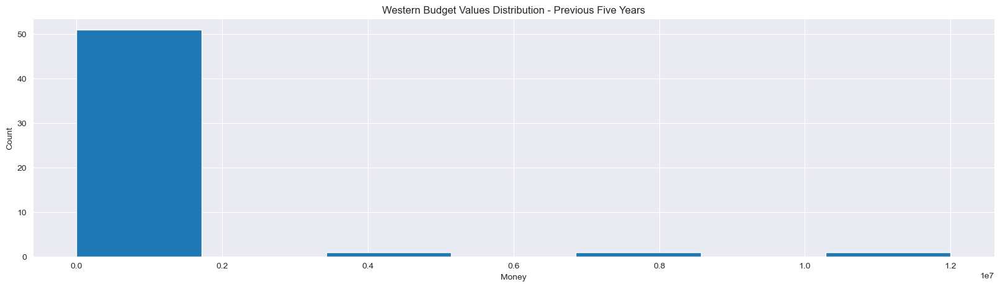

BUDGET Median = 1650.0, Mean = 615923.0925925926
count    5.400000e+01
mean     6.159231e+05
std      2.037253e+06
min      5.000000e+00
25%      1.625000e+02
50%      1.650000e+03
75%      2.500000e+05
max      1.200000e+07
Name: budget, dtype: float64


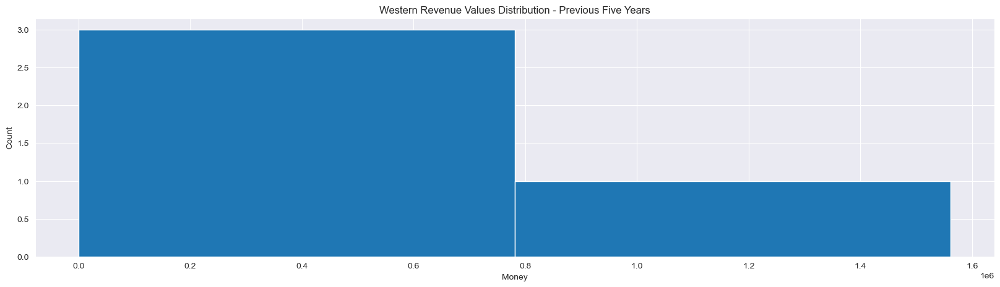

REVENUE Median = 57848.0, Mean = 419473.5
count    4.000000e+00
mean     4.194735e+05
std      7.630101e+05
min      5.000000e+02
25%      6.800000e+03
50%      5.784800e+04
75%      4.705215e+05
max      1.561698e+06
Name: revenue, dtype: float64


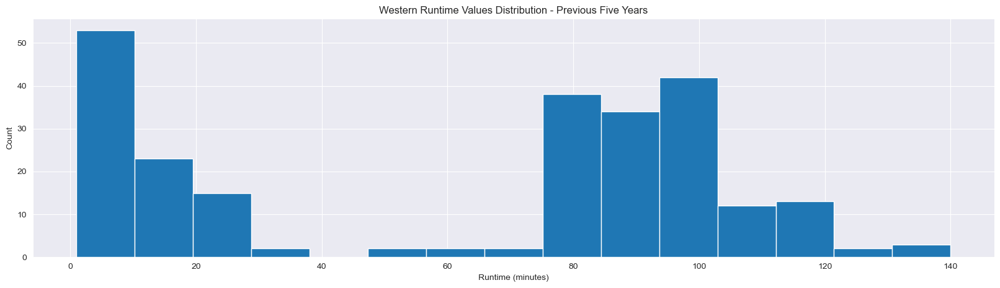

RUNTIME Median = 82.0, Mean = 61.86831275720164
count    243.000000
mean      61.868313
std       42.015630
min        1.000000
25%       12.000000
50%       82.000000
75%       95.000000
max      140.000000
Name: runtime, dtype: float64


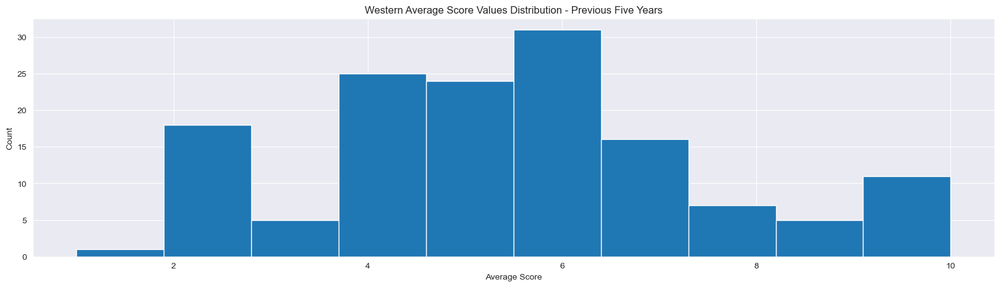

SCORE Median = 5.3, Mean = 5.401923076923078
count    143.000000
mean       5.401923
std        2.096463
min        1.000000
25%        4.000000
50%        5.300000
75%        6.500000
max       10.000000
Name: vote_average, dtype: float64


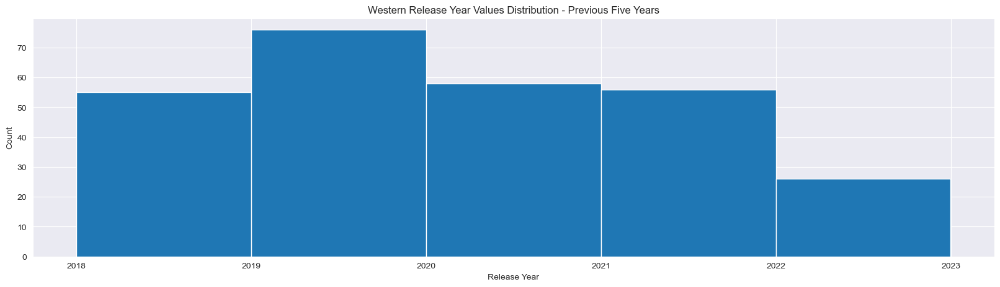

RELEASE DATE Median = 2020-01-18 00:00:00, Mean = 2020-03-13 03:16:36.309963008
count                              271
mean     2020-03-13 03:16:36.309963008
min                2018-01-01 00:00:00
25%                2019-03-26 00:00:00
50%                2020-01-18 00:00:00
75%                2021-04-15 12:00:00
max                2022-12-31 00:00:00
Name: release_date, dtype: object


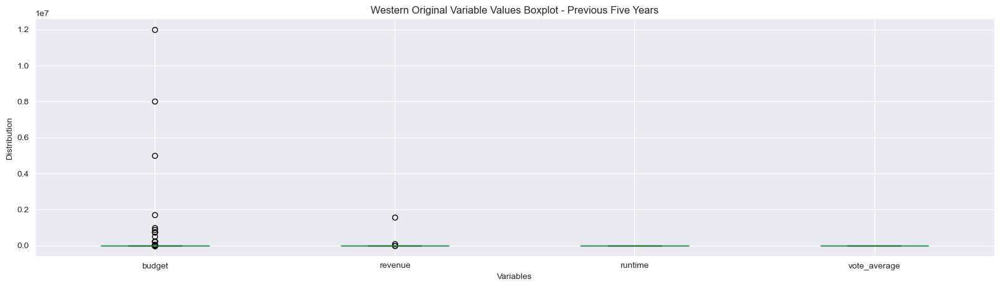

In [102]:
#Show distribution of previous 5 Year Western variable values
n_data = len(wes5b_movies.budget)
n_bins = np.sqrt(n_data)
n_bins = int(n_bins)
_ =plt.hist(wes5b_movies.budget, bins=n_bins)
plt.title('Western Budget Values Distribution - Previous Five Years')
plt.xlabel('Money')
plt.ylabel('Count')
plt.show()

#Calculate median and mean values for variables
print(f"BUDGET Median = {wes5b_movies.budget.median()}, Mean = {wes5b_movies.budget.mean()}")
print(wes5b_movies.budget.describe())

n_data = len(wes5r_movies.revenue)
n_bins = np.sqrt(n_data)
n_bins = int(n_bins)
_ =plt.hist(wes5r_movies.revenue, bins=n_bins)
plt.title('Western Revenue Values Distribution - Previous Five Years')
plt.xlabel('Money')
plt.ylabel('Count')
plt.show()

print(f"REVENUE Median = {wes5r_movies.revenue.median()}, Mean = {wes5r_movies.revenue.mean()}")
print(wes5r_movies.revenue.describe())

n_data = len(wes5d_movies.runtime)
n_bins = np.sqrt(n_data)
n_bins = int(n_bins)
_ =plt.hist(wes5d_movies.runtime, bins=n_bins)
plt.title('Western Runtime Values Distribution - Previous Five Years')
plt.xlabel('Runtime (minutes)')
plt.ylabel('Count')
plt.show()

print(f"RUNTIME Median = {wes5d_movies.runtime.median()}, Mean = {wes5d_movies.runtime.mean()}")
print(wes5d_movies.runtime.describe())

_ =plt.hist(wes5v_movies.vote_average)
plt.title('Western Average Score Values Distribution - Previous Five Years')
plt.xlabel('Average Score')
plt.ylabel('Count')
plt.show()

print(f"SCORE Median = {wes5v_movies.vote_average.median()}, Mean = {wes5v_movies.vote_average.mean()}")
print(wes5v_movies.vote_average.describe())

_ =plt.hist(wes5_movies.release_date, bins=5)
plt.title('Western Release Year Values Distribution - Previous Five Years')
plt.xlabel('Release Year')
plt.ylabel('Count')
plt.show()

print(f"RELEASE DATE Median = {wes5_movies.release_date.median()}, Mean = {wes5_movies.release_date.mean()}")
print(wes5_movies.release_date.describe(datetime_is_numeric=True))

wes5_movies.boxplot(column=['budget', 'revenue', 'runtime', 'vote_average'])
plt.title('Western Original Variable Values Boxplot - Previous Five Years')
plt.xlabel('Variables')
plt.ylabel('Distribution')
plt.show()

In [103]:
#Drop zero values from 5 Year Unknown variables. 
#Create a seperate dataframe for each so as not to affect the other variables calculations.
unk5b_movies = unk5_movies[unk5_movies['budget'] !=0]
unk5r_movies = unk5_movies[unk5_movies['revenue'] !=0]
unk5d_movies = unk5_movies[unk5_movies['runtime'] !=0]
unk5v_movies = unk5_movies[unk5_movies['vote_average'] !=0]

#Remove Outliers from 5 Year Unknown variables and 
Q1 = unk5b_movies.budget.quantile(0.25)
Q3 = unk5b_movies.budget.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(unk5b_movies['budget']>=upper_limit)[0]
lower_array = np.where(unk5b_movies['budget']<=lower_limit)[0]
unk5b_movies['budget'].drop(index=upper_array, inplace=True)
unk5b_movies['budget'].drop(index=lower_array, inplace=True)

Q1 = unk5r_movies.revenue.quantile(0.25)
Q3 = unk5r_movies.revenue.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(unk5r_movies['revenue']>=upper_limit)[0]
lower_array = np.where(unk5r_movies['revenue']<=lower_limit)[0]
unk5r_movies['revenue'].drop(index=upper_array, inplace=True)
unk5r_movies['revenue'].drop(index=lower_array, inplace=True)

Q1 = unk5d_movies.runtime.quantile(0.25)
Q3 = unk5d_movies.runtime.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(unk5d_movies['runtime']>=upper_limit)[0]
lower_array = np.where(unk5d_movies['runtime']<=lower_limit)[0]
unk5d_movies['runtime'].drop(index=upper_array, inplace=True)
unk5d_movies['runtime'].drop(index=lower_array, inplace=True)

Q1 = unk5v_movies.vote_average.quantile(0.25)
Q3 = unk5v_movies.vote_average.quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
upper_array = np.where(unk5v_movies['vote_average']>=upper_limit)[0]
lower_array = np.where(unk5v_movies['vote_average']<=lower_limit)[0]
unk5v_movies['vote_average'].drop(index=upper_array, inplace=True)
unk5v_movies['vote_average'].drop(index=lower_array, inplace=True)

KeyError: '[6, 16, 17, 18, 19, 20, 21, 22, 23, 24, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 65, 66, 76, 77, 80, 81, 82, 86, 87, 88, 89, 94, 96, 116, 133, 134, 135, 136, 141, 142, 143, 144, 155, 171, 179, 180, 181, 182, 187, 188, 189, 190, 208, 209, 210, 211, 212, 213, 244, 245, 246, 247, 248, 249, 250, 251, 252, 267, 268, 269, 270, 273, 278, 279, 280, 281, 300, 305, 316, 318, 326, 330, 331, 339, 349, 351, 369, 373, 374, 375, 376, 377, 378, 379, 380, 381, 383, 392, 409, 415, 416, 417, 418, 421, 427, 428, 441, 442, 443, 444, 501, 502, 507, 554, 556, 563, 578, 583, 588, 635, 639, 652, 655, 657, 664, 680, 698, 708, 719, 721, 731, 740, 741, 772, 778, 783, 796, 806, 816, 828, 849, 862, 868, 870, 871, 874, 932, 942, 950, 966] not found in axis'

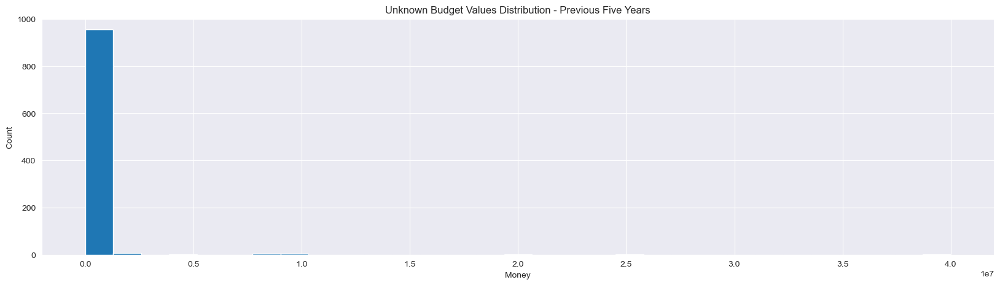

BUDGET Median = 1800.0, Mean = 219780.37846153846
count    9.750000e+02
mean     2.197804e+05
std      1.837793e+06
min      1.000000e+00
25%      1.550000e+02
50%      1.800000e+03
75%      1.100000e+04
max      4.000000e+07
Name: budget, dtype: float64


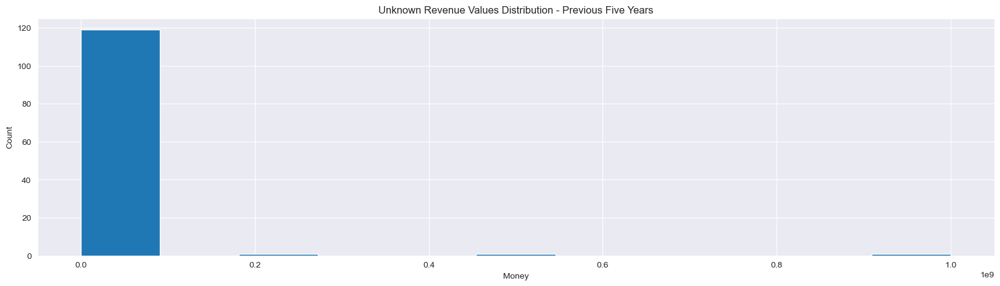

REVENUE Median = 3000.0, Mean = 17847715.48360656
count    1.220000e+02
mean     1.784772e+07
std      1.026263e+08
min      1.000000e+00
25%      2.000000e+02
50%      3.000000e+03
75%      1.400000e+05
max      1.000000e+09
Name: revenue, dtype: float64


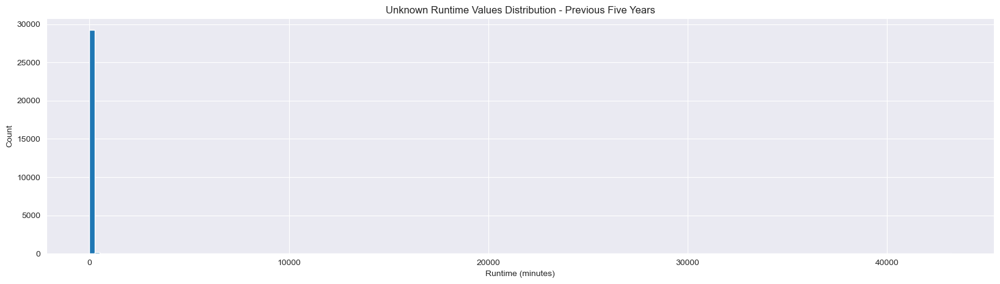

RUNTIME Median = 18.0, Mean = 44.95463477435967
count    29516.000000
mean        44.954635
std        257.897674
min          1.000000
25%          8.000000
50%         18.000000
75%         72.000000
max      43200.000000
Name: runtime, dtype: float64


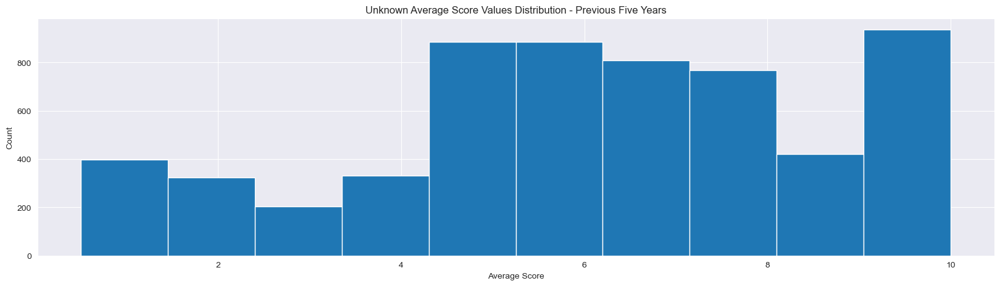

SCORE Median = 6.0, Mean = 6.212397046484303
count    5959.000000
mean        6.212397
std         2.613731
min         0.500000
25%         5.000000
50%         6.000000
75%         8.000000
max        10.000000
Name: vote_average, dtype: float64


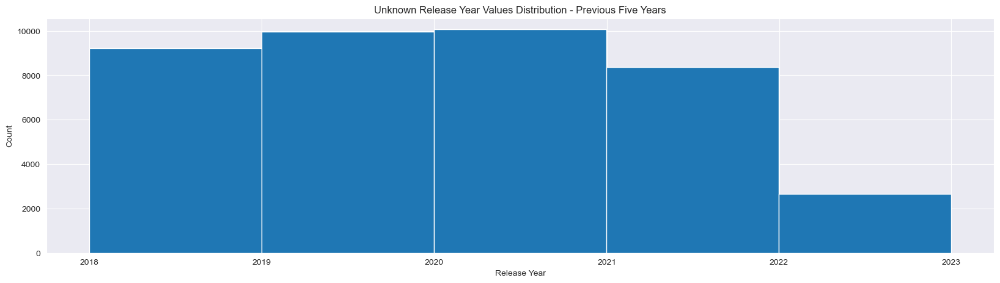

RELEASE DATE Median = 2020-01-25 00:00:00, Mean = 2020-02-07 23:54:42.352941312
count                            40256
mean     2020-02-07 23:54:42.352941312
min                2018-01-01 00:00:00
25%                2019-01-01 00:00:00
50%                2020-01-25 00:00:00
75%                2021-01-23 00:00:00
max                2022-12-31 00:00:00
Name: release_date, dtype: object


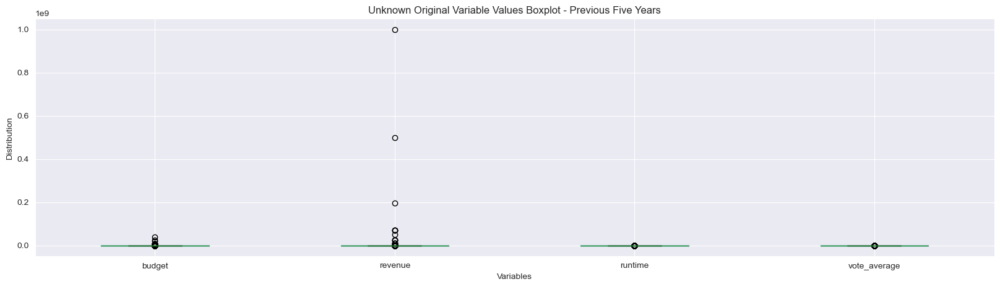

In [104]:
#Show distribution of previous 5 Year Unknown variable values
n_data = len(unk5b_movies.budget)
n_bins = np.sqrt(n_data)
n_bins = int(n_bins)
_ =plt.hist(unk5b_movies.budget, bins=n_bins)
plt.title('Unknown Budget Values Distribution - Previous Five Years')
plt.xlabel('Money')
plt.ylabel('Count')
plt.show()

#Calculate median and mean values for variables
print(f"BUDGET Median = {unk5b_movies.budget.median()}, Mean = {unk5b_movies.budget.mean()}")
print(unk5b_movies.budget.describe())

n_data = len(unk5r_movies.revenue)
n_bins = np.sqrt(n_data)
n_bins = int(n_bins)
_ =plt.hist(unk5r_movies.revenue, bins=n_bins)
plt.title('Unknown Revenue Values Distribution - Previous Five Years')
plt.xlabel('Money')
plt.ylabel('Count')
plt.show()

print(f"REVENUE Median = {unk5r_movies.revenue.median()}, Mean = {unk5r_movies.revenue.mean()}")
print(unk5r_movies.revenue.describe())

n_data = len(unk5d_movies.runtime)
n_bins = np.sqrt(n_data)
n_bins = int(n_bins)
_ =plt.hist(unk5d_movies.runtime, bins=n_bins)
plt.title('Unknown Runtime Values Distribution - Previous Five Years')
plt.xlabel('Runtime (minutes)')
plt.ylabel('Count')
plt.show()

print(f"RUNTIME Median = {unk5d_movies.runtime.median()}, Mean = {unk5d_movies.runtime.mean()}")
print(unk5d_movies.runtime.describe())

_ =plt.hist(unk5v_movies.vote_average)
plt.title('Unknown Average Score Values Distribution - Previous Five Years')
plt.xlabel('Average Score')
plt.ylabel('Count')
plt.show()

print(f"SCORE Median = {unk5v_movies.vote_average.median()}, Mean = {unk5v_movies.vote_average.mean()}")
print(unk5v_movies.vote_average.describe())

_ =plt.hist(unk5_movies.release_date, bins=5)
plt.title('Unknown Release Year Values Distribution - Previous Five Years')
plt.xlabel('Release Year')
plt.ylabel('Count')
plt.show()

print(f"RELEASE DATE Median = {unk5_movies.release_date.median()}, Mean = {unk5_movies.release_date.mean()}")
print(unk5_movies.release_date.describe(datetime_is_numeric=True))

unk5_movies.boxplot(column=['budget', 'revenue', 'runtime', 'vote_average'])
plt.title('Unknown Original Variable Values Boxplot - Previous Five Years')
plt.xlabel('Variables')
plt.ylabel('Distribution')
plt.show()

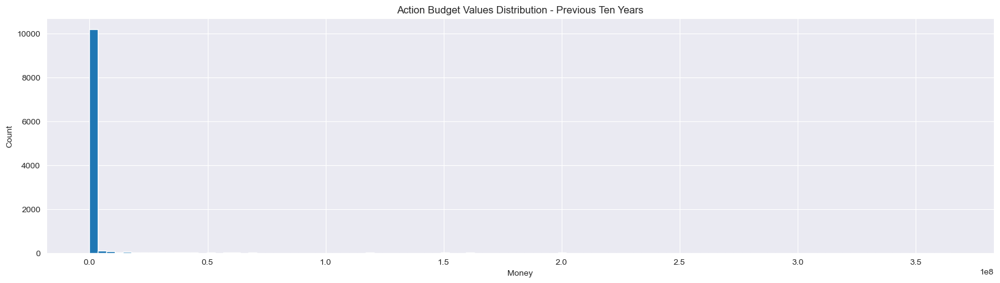

BUDGET Median = 423210.0, Mean = 3056969.9674297413
count    1.074600e+04
mean     3.056970e+06
std      1.798482e+07
min      1.000000e+00
25%      4.232100e+05
50%      4.232100e+05
75%      4.232100e+05
max      3.650000e+08
Name: budget, dtype: float64


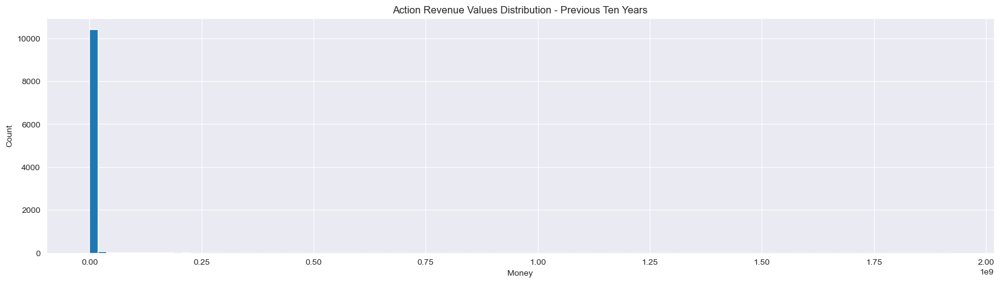

REVENUE Median = 2889720.0, Mean = 10424693.53378001
count    1.074600e+04
mean     1.042469e+07
std      7.077873e+07
min      1.000000e+00
25%      2.889720e+06
50%      2.889720e+06
75%      2.889720e+06
max      1.921847e+09
Name: revenue, dtype: float64


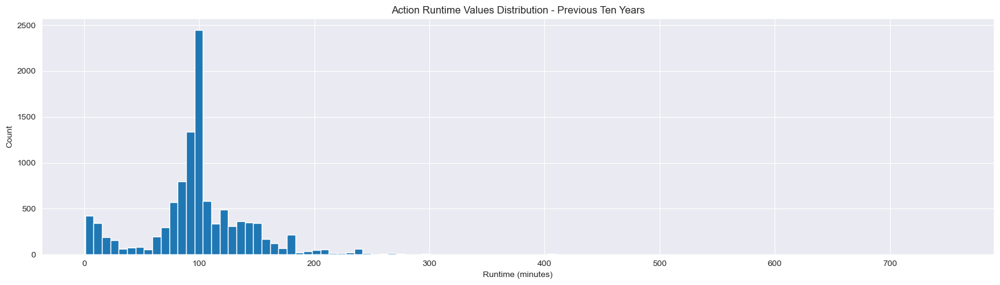

RUNTIME Median = 100.39791323448655, Mean = 100.39791323449167
count    10746.000000
mean       100.397913
std         49.118939
min          1.000000
25%         84.000000
50%        100.397913
75%        120.000000
max        753.000000
Name: runtime, dtype: float64


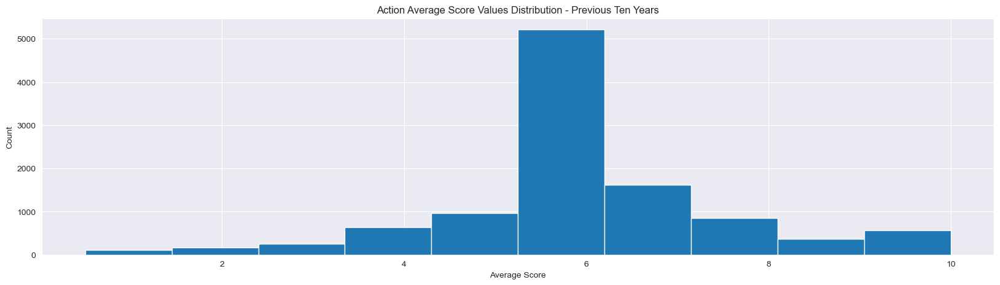

SCORE Median = 6.1, Mean = 6.127988739995831
count    10746.000000
mean         6.127989
std          1.587475
min          0.500000
25%          5.700000
50%          6.100000
75%          6.700000
max         10.000000
Name: vote_average, dtype: float64


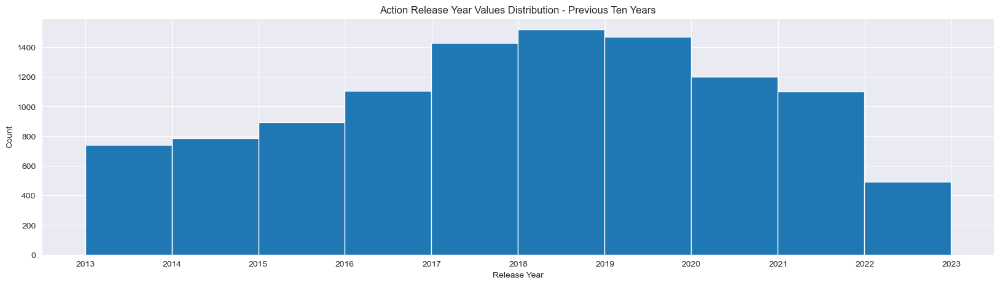

RELEASE DATE Median = 2018-04-15 12:00:00, Mean = 2018-02-12 04:26:07.839195904
count                            10746
mean     2018-02-12 04:26:07.839195904
min                2013-01-01 00:00:00
25%                2016-04-03 00:00:00
50%                2018-04-15 12:00:00
75%                2020-01-24 00:00:00
max                2022-12-30 00:00:00
Name: release_date, dtype: object


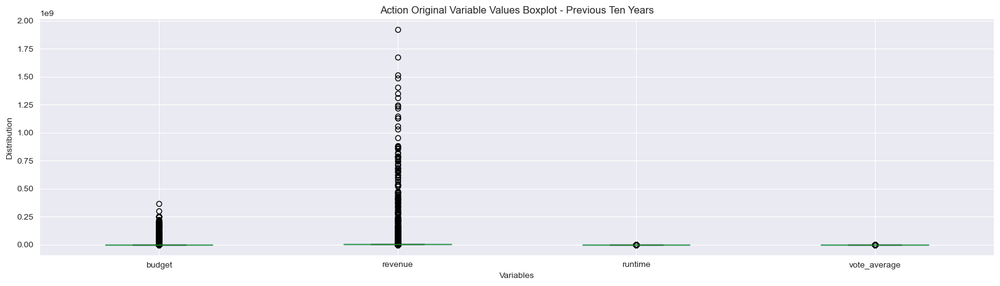

In [105]:
#Replace zero values in Act10 with most appropriate: Median or Mean
act10_movies['budget'] = act10_movies['budget'].replace([0], act10b_movies['budget'].median())
act10_movies['revenue'] = act10_movies['revenue'].replace([0], act10r_movies['revenue'].median())
act10_movies['runtime'] = act10_movies['runtime'].replace([0], act10d_movies['runtime'].mean())
act10_movies['runtime'] = act10_movies['runtime'].fillna(act10d_movies['runtime'].mean())
act10_movies['vote_average'] = act10_movies['vote_average'].replace([0], act10v_movies['vote_average'].median())

#Check distribution of updated act_10 variables values
n_data = len(act10_movies.budget)
n_bins = np.sqrt(n_data)
n_bins = int(n_bins)
_ =plt.hist(act10_movies.budget, bins=n_bins)
plt.title('Action Budget Values Distribution - Previous Ten Years')
plt.xlabel('Money')
plt.ylabel('Count')
plt.show()

print(f"BUDGET Median = {act10_movies.budget.median()}, Mean = {act10_movies.budget.mean()}")
print(act10_movies.budget.describe())

n_data = len(act10_movies.revenue)
n_bins = np.sqrt(n_data)
n_bins = int(n_bins)
_ =plt.hist(act10_movies.revenue, bins=n_bins)
plt.title('Action Revenue Values Distribution - Previous Ten Years')
plt.xlabel('Money')
plt.ylabel('Count')
plt.show()

print(f"REVENUE Median = {act10_movies.revenue.median()}, Mean = {act10_movies.revenue.mean()}")
print(act10_movies.revenue.describe())

n_data = len(act10_movies.runtime)
n_bins = np.sqrt(n_data)
n_bins = int(n_bins)
_ =plt.hist(act10_movies.runtime, bins=n_bins)
plt.title('Action Runtime Values Distribution - Previous Ten Years')
plt.xlabel('Runtime (minutes)')
plt.ylabel('Count')
plt.show()

print(f"RUNTIME Median = {act10_movies.runtime.median()}, Mean = {act10_movies.runtime.mean()}")
print(act10_movies.runtime.describe())

_ =plt.hist(act10_movies.vote_average)
plt.title('Action Average Score Values Distribution - Previous Ten Years')
plt.xlabel('Average Score')
plt.ylabel('Count')
plt.show()

print(f"SCORE Median = {act10_movies.vote_average.median()}, Mean = {act10_movies.vote_average.mean()}")
print(act10_movies.vote_average.describe())

_ =plt.hist(act10_movies.release_date)
plt.title('Action Release Year Values Distribution - Previous Ten Years')
plt.xlabel('Release Year')
plt.ylabel('Count')
plt.show()

print(f"RELEASE DATE Median = {act10_movies.release_date.median()}, Mean = {act10_movies.release_date.mean()}")
print(act10_movies.release_date.describe(datetime_is_numeric=True))

act10_movies.boxplot(column=['budget', 'revenue', 'runtime', 'vote_average'])
plt.title('Action Original Variable Values Boxplot - Previous Ten Years')
plt.xlabel('Variables')
plt.ylabel('Distribution')
plt.show()

In [106]:
act10_movies

,id,title,genres,original_language,overview,production_companies,release_date,budget,revenue,runtime,...,credits,poster_path,recommendations,profit,profit_margin,primary_genre,secondary_genre,release_year,release_month_num,release_month_name
0,965839,Lord of the Streets,Action,en,When Jason Dyson refuses to make his prized fi...,Mutiny Films,2022-04-22,1000000.0,2889720.0,85.000000,...,Treach-Quinton Jackson-Khalil Rountree Jr.-And...,/n9YWVQRc0zw0nwrFcOkOpffZxjc.jpg,982467,-1000000.0,-inf,Action,Unknown,2022,4,April
1,758009,Shotgun Wedding,Action-Romance-Comedy,en,Darcy and Tom gather their families for the ul...,Lionsgate-Mandeville Films-Nuyorican Productio...,2022-12-28,423210.0,4495365.0,101.000000,...,Jennifer Lopez-Josh Duhamel-Jennifer Coolidge-...,/t79ozwWnwekO0ADIzsFP1E5SkvR.jpg,702432-1064489-1013870-953734-805307-753965-84...,4495365.0,100.0,Action,Romance,2022,12,December
2,267805,There Are No Saints,Action,en,A man is imprisoned for a crime he didn't comm...,Open Window Productions-BN Films-Itaca Films-I...,2022-05-27,423210.0,2889720.0,105.000000,...,José María Yázpik-Shannyn Sossamon-Tommy Flana...,/fcOTYArjKuAgufwHoTvx8w9UKCv.jpg,1391-961484-763873-668047-630392-999127-301351...,0.0,NaN,Action,Unknown,2022,5,May
3,436270,Black Adam,Action-Fantasy-Science Fiction,en,Nearly 5000 years after he was bestowed with t...,New Line Cinema-Flynn Picture Company-DC Films...,2022-10-19,200000000.0,392952111.0,125.000000,...,Dwayne Johnson-Aldis Hodge-Noah Centineo-Sarah...,/pFlaoHTZeyNkG83vxsAJiGzfSsa.jpg,485470-505642-663712-642721-49046-724495-82979...,192952111.0,49.1,Action,Fantasy,2022,10,October
4,941520,Alien Sniperess,Action-Science Fiction-Fantasy,en,A female sniper on military leave promises to ...,Paradox Universe-Green Apple Productions,2022-04-08,423210.0,2889720.0,94.000000,...,Olivia Okoro-Sean Laguna-Douglas Savage-Bourke...,/bI1ZDRkerXrcaFa5kWjEMw80aqE.jpg,NaN,0.0,NaN,Action,Science Fiction,2022,4,April
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10741,838052,NJPW Dominion 6.6 in Osaka-jo Hall,Action,en,Dominion 6.6 in Osaka-jo Hall was an professio...,New Japan Pro-Wrestling,2021-06-07,423210.0,2889720.0,100.397913,...,Shingo Takagi-Kazuchika Okada-Kota Ibushi-Jeff...,/51Mm8UML0pD5P0A4vcKcQcN685b.jpg,NaN,0.0,NaN,Action,Unknown,2021,6,June
10742,839923,Miguel Cotto vs. Canelo Álvarez,Action-Documentary,en,Miguel Cotto vs. Canelo Álvarez was a professi...,HBO-HBO Sports-HBO Films,2015-11-21,423210.0,2889720.0,180.000000,...,Canelo Álvarez-Miguel Cotto,/eBYG7IluE1eConRGpo7QVhqPH8S.jpg,NaN,0.0,NaN,Action,Documentary,2015,11,November
10743,830075,The Big Thirst,Action-Comedy,en,One man's quest for a cup of water.,NaN,2020-02-27,423210.0,2889720.0,2.000000,...,Blake Ditto-Hijo,/gn1oM7d9B37NlETr8SsSep5wt6M.jpg,NaN,0.0,NaN,Action,Comedy,2020,2,February
10744,830936,Chinese Captain,Action,zh,"Ten years ago the DB multinational studio's ""H...",NaN,2021-05-18,423210.0,2889720.0,100.397913,...,Zheng Xiaofu-Li Taiyan-Du Qiao-Jingtao Li-Lu W...,/3zdMvp7UdvIZRnvzAgzRS70kU0G.jpg,NaN,0.0,NaN,Action,Unknown,2021,5,May


In [107]:
act10_movies.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 10746 entries, 0 to 10745
Data columns (total 23 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   id                    10746 non-null  int64         
 1   title                 10746 non-null  object        
 2   genres                10746 non-null  object        
 3   original_language     10746 non-null  object        
 4   overview              9998 non-null   object        
 5   production_companies  7182 non-null   object        
 6   release_date          10746 non-null  datetime64[ns]
 7   budget                10746 non-null  float64       
 8   revenue               10746 non-null  float64       
 9   runtime               10746 non-null  float64       
 10  status                10746 non-null  object        
 11  tagline               3168 non-null   object        
 12  vote_average          10746 non-null  float64       
 13  credits         

In [108]:
#Replace zero values in remaining 10 year dataframes
adv10_movies['budget'] = adv10_movies['budget'].replace([0], adv10b_movies['budget'].median())
adv10_movies['revenue'] = adv10_movies['revenue'].replace([0], adv10r_movies['revenue'].median())
adv10_movies['runtime'] = adv10_movies['runtime'].replace([0], adv10d_movies['runtime'].mean())
adv10_movies['runtime'] = adv10_movies['runtime'].fillna(adv10d_movies['runtime'].mean())
adv10_movies['vote_average'] = adv10_movies['vote_average'].replace([0], adv10v_movies['vote_average'].mean())

ani10_movies['budget'] = ani10_movies['budget'].replace([0], ani10b_movies['budget'].median())
ani10_movies['revenue'] = ani10_movies['revenue'].replace([0], ani10r_movies['revenue'].median())
ani10_movies['runtime'] = ani10_movies['runtime'].replace([0], ani10d_movies['runtime'].median())
ani10_movies['runtime'] = ani10_movies['runtime'].fillna(ani10d_movies['runtime'].mean())
ani10_movies['vote_average'] = ani10_movies['vote_average'].replace([0], ani10v_movies['vote_average'].mean())

com10_movies['budget'] = com10_movies['budget'].replace([0], com10b_movies['budget'].median())
com10_movies['revenue'] = com10_movies['revenue'].replace([0], com10r_movies['revenue'].median())
com10_movies['runtime'] = com10_movies['runtime'].replace([0], com10d_movies['runtime'].median())
com10_movies['runtime'] = com10_movies['runtime'].fillna(com10d_movies['runtime'].mean())
com10_movies['vote_average'] = com10_movies['vote_average'].replace([0], com10v_movies['vote_average'].mean())

cri10_movies['budget'] = cri10_movies['budget'].replace([0], cri10b_movies['budget'].median())
cri10_movies['revenue'] = cri10_movies['revenue'].replace([0], cri10r_movies['revenue'].median())
cri10_movies['runtime'] = cri10_movies['runtime'].replace([0], cri10d_movies['runtime'].mean())
cri10_movies['runtime'] = cri10_movies['runtime'].fillna(cri10d_movies['runtime'].mean())
cri10_movies['vote_average'] = cri10_movies['vote_average'].replace([0], cri10v_movies['vote_average'].mean())

doc10_movies['budget'] = doc10_movies['budget'].replace([0], doc10b_movies['budget'].median())
doc10_movies['revenue'] = doc10_movies['revenue'].replace([0], doc10r_movies['revenue'].median())
doc10_movies['runtime'] = doc10_movies['runtime'].replace([0], doc10d_movies['runtime'].median())
doc10_movies['runtime'] = doc10_movies['runtime'].fillna(doc10d_movies['runtime'].mean())
doc10_movies['vote_average'] = doc10_movies['vote_average'].replace([0], doc10v_movies['vote_average'].median())

dra10_movies['budget'] = dra10_movies['budget'].replace([0], dra10b_movies['budget'].median())
dra10_movies['revenue'] = dra10_movies['revenue'].replace([0], dra10r_movies['revenue'].median())
dra10_movies['runtime'] = dra10_movies['runtime'].replace([0], dra10d_movies['runtime'].median())
dra10_movies['runtime'] = dra10_movies['runtime'].fillna(dra10d_movies['runtime'].mean())
dra10_movies['vote_average'] = dra10_movies['vote_average'].replace([0], dra10v_movies['vote_average'].mean())

fam10_movies['budget'] = fam10_movies['budget'].replace([0], fam10b_movies['budget'].median())
fam10_movies['revenue'] = fam10_movies['revenue'].replace([0], fam10r_movies['revenue'].median())
fam10_movies['runtime'] = fam10_movies['runtime'].replace([0], fam10d_movies['runtime'].median())
fam10_movies['runtime'] = fam10_movies['runtime'].fillna(fam10d_movies['runtime'].mean())
fam10_movies['vote_average'] = fam10_movies['vote_average'].replace([0], fam10v_movies['vote_average'].mean())

fan10_movies['budget'] = fan10_movies['budget'].replace([0], fan10b_movies['budget'].median())
fan10_movies['revenue'] = fan10_movies['revenue'].replace([0], fan10r_movies['revenue'].median())
fan10_movies['runtime'] = fan10_movies['runtime'].replace([0], fan10d_movies['runtime'].median())
fan10_movies['runtime'] = fan10_movies['runtime'].fillna(fan10d_movies['runtime'].mean())
fan10_movies['vote_average'] = fan10_movies['vote_average'].replace([0], fan10v_movies['vote_average'].mean())

his10_movies['budget'] = his10_movies['budget'].replace([0], his10b_movies['budget'].median())
his10_movies['revenue'] = his10_movies['revenue'].replace([0], his10r_movies['revenue'].median())
his10_movies['runtime'] = his10_movies['runtime'].replace([0], his10d_movies['runtime'].median())
his10_movies['runtime'] = his10_movies['runtime'].fillna(his10d_movies['runtime'].mean())
his10_movies['vote_average'] = his10_movies['vote_average'].replace([0], his10v_movies['vote_average'].mean())

hor10_movies['budget'] = hor10_movies['budget'].replace([0], hor10b_movies['budget'].median())
hor10_movies['revenue'] = hor10_movies['revenue'].replace([0], hor10r_movies['revenue'].median())
hor10_movies['runtime'] = hor10_movies['runtime'].replace([0], hor10d_movies['runtime'].median())
hor10_movies['runtime'] = hor10_movies['runtime'].fillna(hor10d_movies['runtime'].mean())
hor10_movies['vote_average'] = hor10_movies['vote_average'].replace([0], hor10v_movies['vote_average'].mean())

mus10_movies['budget'] = mus10_movies['budget'].replace([0], mus10b_movies['budget'].median())
mus10_movies['revenue'] = mus10_movies['revenue'].replace([0], mus10r_movies['revenue'].median())
mus10_movies['runtime'] = mus10_movies['runtime'].replace([0], mus10d_movies['runtime'].median())
mus10_movies['runtime'] = mus10_movies['runtime'].fillna(mus10d_movies['runtime'].mean())
mus10_movies['vote_average'] = mus10_movies['vote_average'].replace([0], mus10v_movies['vote_average'].median())

mys10_movies['budget'] = mys10_movies['budget'].replace([0], mys10b_movies['budget'].median())
mys10_movies['revenue'] = mys10_movies['revenue'].replace([0], mys10r_movies['revenue'].median())
mys10_movies['runtime'] = mys10_movies['runtime'].replace([0], mys10d_movies['runtime'].median())
mys10_movies['runtime'] = mys10_movies['runtime'].fillna(mys10d_movies['runtime'].mean())
mys10_movies['vote_average'] = mys10_movies['vote_average'].replace([0], mys10v_movies['vote_average'].median())

rom10_movies['budget'] = rom10_movies['budget'].replace([0], rom10b_movies['budget'].median())
rom10_movies['revenue'] = rom10_movies['revenue'].replace([0], rom10r_movies['revenue'].median())
rom10_movies['runtime'] = rom10_movies['runtime'].replace([0], rom10d_movies['runtime'].median())
rom10_movies['runtime'] = rom10_movies['runtime'].fillna(rom10d_movies['runtime'].mean())
rom10_movies['vote_average'] = rom10_movies['vote_average'].replace([0], rom10v_movies['vote_average'].mean())

sci10_movies['budget'] = sci10_movies['budget'].replace([0], sci10b_movies['budget'].median())
sci10_movies['revenue'] = sci10_movies['revenue'].replace([0], sci10r_movies['revenue'].median())
sci10_movies['runtime'] = sci10_movies['runtime'].replace([0], sci10d_movies['runtime'].median())
sci10_movies['runtime'] = sci10_movies['runtime'].fillna(sci10d_movies['runtime'].mean())
sci10_movies['vote_average'] = sci10_movies['vote_average'].replace([0], sci10v_movies['vote_average'].mean())

thr10_movies['budget'] = thr10_movies['budget'].replace([0], thr10b_movies['budget'].median())
thr10_movies['revenue'] = thr10_movies['revenue'].replace([0], thr10r_movies['revenue'].median())
thr10_movies['runtime'] = thr10_movies['runtime'].replace([0], thr10d_movies['runtime'].median())
thr10_movies['runtime'] = thr10_movies['runtime'].fillna(thr10d_movies['runtime'].mean())
thr10_movies['vote_average'] = thr10_movies['vote_average'].replace([0], thr10v_movies['vote_average'].mean())

tvm10_movies['budget'] = tvm10_movies['budget'].replace([0], tvm10b_movies['budget'].median())
tvm10_movies['revenue'] = tvm10_movies['revenue'].replace([0], tvm10r_movies['revenue'].median())
tvm10_movies['runtime'] = tvm10_movies['runtime'].replace([0], tvm10d_movies['runtime'].median())
tvm10_movies['runtime'] = tvm10_movies['runtime'].fillna(tvm10d_movies['runtime'].mean())
tvm10_movies['vote_average'] = tvm10_movies['vote_average'].replace([0], tvm10v_movies['vote_average'].mean())

war10_movies['budget'] = war10_movies['budget'].replace([0], war10b_movies['budget'].median())
war10_movies['revenue'] = war10_movies['revenue'].replace([0], war10r_movies['revenue'].median())
war10_movies['runtime'] = war10_movies['runtime'].replace([0], war10d_movies['runtime'].median())
war10_movies['runtime'] = war10_movies['runtime'].fillna(war10d_movies['runtime'].mean())
war10_movies['vote_average'] = war10_movies['vote_average'].replace([0], war10v_movies['vote_average'].median())

wes10_movies['budget'] = wes10_movies['budget'].replace([0], wes10b_movies['budget'].median())
wes10_movies['revenue'] = wes10_movies['revenue'].replace([0], wes10r_movies['revenue'].median())
wes10_movies['runtime'] = wes10_movies['runtime'].replace([0], wes10d_movies['runtime'].median())
wes10_movies['runtime'] = wes10_movies['runtime'].fillna(wes10d_movies['runtime'].mean())
wes10_movies['vote_average'] = wes10_movies['vote_average'].replace([0], wes10v_movies['vote_average'].mean())

unk10_movies['budget'] = unk10_movies['budget'].replace([0], unk10b_movies['budget'].median())
unk10_movies['revenue'] = unk10_movies['revenue'].replace([0], unk10r_movies['revenue'].median())
unk10_movies['runtime'] = unk10_movies['runtime'].replace([0], unk10d_movies['runtime'].median())
unk10_movies['runtime'] = unk10_movies['runtime'].fillna(unk10d_movies['runtime'].mean())
unk10_movies['vote_average'] = unk10_movies['vote_average'].replace([0], unk10v_movies['vote_average'].mean())

In [109]:
#Replace zero values in 5 year dataframes
act5_movies['budget'] = act5_movies['budget'].replace([0], act5b_movies['budget'].median())
act5_movies['revenue'] = act5_movies['revenue'].replace([0], act5r_movies['revenue'].median())
act5_movies['runtime'] = act5_movies['runtime'].replace([0], act5d_movies['runtime'].median())
act5_movies['runtime'] = act5_movies['runtime'].fillna(act5d_movies['runtime'].mean())
act5_movies['vote_average'] = act5_movies['vote_average'].replace([0], act5v_movies['vote_average'].median())

adv5_movies['budget'] = adv5_movies['budget'].replace([0], adv5b_movies['budget'].median())
adv5_movies['revenue'] = adv5_movies['revenue'].replace([0], adv5r_movies['revenue'].median())
adv5_movies['runtime'] = adv5_movies['runtime'].replace([0], adv5d_movies['runtime'].median())
adv5_movies['runtime'] = adv5_movies['runtime'].fillna(adv5d_movies['runtime'].mean())
adv5_movies['vote_average'] = adv5_movies['vote_average'].replace([0], adv5v_movies['vote_average'].median())

ani5_movies['budget'] = ani5_movies['budget'].replace([0], ani5b_movies['budget'].median())
ani5_movies['revenue'] = ani5_movies['revenue'].replace([0], ani5r_movies['revenue'].median())
ani5_movies['runtime'] = ani5_movies['runtime'].replace([0], ani5d_movies['runtime'].median())
ani5_movies['runtime'] = ani5_movies['runtime'].fillna(ani5d_movies['runtime'].mean())
ani5_movies['vote_average'] = ani5_movies['vote_average'].replace([0], ani5v_movies['vote_average'].median())

com5_movies['budget'] = com5_movies['budget'].replace([0], com5b_movies['budget'].median())
com5_movies['revenue'] = com5_movies['revenue'].replace([0], com5r_movies['revenue'].median())
com5_movies['runtime'] = com5_movies['runtime'].replace([0], com5d_movies['runtime'].median())
com5_movies['runtime'] = com5_movies['runtime'].fillna(com5d_movies['runtime'].mean())
com5_movies['vote_average'] = com5_movies['vote_average'].replace([0], com5v_movies['vote_average'].mean())

cri5_movies['budget'] = cri5_movies['budget'].replace([0], cri5b_movies['budget'].median())
cri5_movies['revenue'] = cri5_movies['revenue'].replace([0], cri5r_movies['revenue'].median())
cri5_movies['runtime'] = cri5_movies['runtime'].replace([0], cri5d_movies['runtime'].median())
cri5_movies['runtime'] = cri5_movies['runtime'].fillna(cri5d_movies['runtime'].mean())
cri5_movies['vote_average'] = cri5_movies['vote_average'].replace([0], cri5v_movies['vote_average'].mean())

doc5_movies['budget'] = doc5_movies['budget'].replace([0], doc5b_movies['budget'].median())
doc5_movies['revenue'] = doc5_movies['revenue'].replace([0], doc5r_movies['revenue'].median())
doc5_movies['runtime'] = doc5_movies['runtime'].replace([0], doc5d_movies['runtime'].median())
doc5_movies['runtime'] = doc5_movies['runtime'].fillna(doc5d_movies['runtime'].mean())
doc5_movies['vote_average'] = doc5_movies['vote_average'].replace([0], doc5v_movies['vote_average'].median())

dra5_movies['budget'] = dra5_movies['budget'].replace([0], dra5b_movies['budget'].median())
dra5_movies['revenue'] = dra5_movies['revenue'].replace([0], dra5r_movies['revenue'].median())
dra5_movies['runtime'] = dra5_movies['runtime'].replace([0], dra5d_movies['runtime'].median())
dra5_movies['runtime'] = dra5_movies['runtime'].fillna(dra5d_movies['runtime'].mean())
dra5_movies['vote_average'] = dra5_movies['vote_average'].replace([0], dra5v_movies['vote_average'].median())

fam5_movies['budget'] = fam5_movies['budget'].replace([0], fam5b_movies['budget'].median())
fam5_movies['revenue'] = fam5_movies['revenue'].replace([0], fam5r_movies['revenue'].median())
fam5_movies['runtime'] = fam5_movies['runtime'].replace([0], fam5d_movies['runtime'].median())
fam5_movies['runtime'] = fam5_movies['runtime'].fillna(fam5d_movies['runtime'].mean())
fam5_movies['vote_average'] = fam5_movies['vote_average'].replace([0], fam5v_movies['vote_average'].median())

fan5_movies['budget'] = fan5_movies['budget'].replace([0], fan5b_movies['budget'].median())
fan5_movies['revenue'] = fan5_movies['revenue'].replace([0], fan5r_movies['revenue'].median())
fan5_movies['runtime'] = fan5_movies['runtime'].replace([0], fan5d_movies['runtime'].median())
fan5_movies['runtime'] = fan5_movies['runtime'].fillna(fan5d_movies['runtime'].mean())
fan5_movies['vote_average'] = fan5_movies['vote_average'].replace([0], fan5v_movies['vote_average'].median())

his5_movies['budget'] = his5_movies['budget'].replace([0], his5b_movies['budget'].median())
his5_movies['revenue'] = his5_movies['revenue'].replace([0], his5r_movies['revenue'].median())
his5_movies['runtime'] = his5_movies['runtime'].replace([0], his5d_movies['runtime'].median())
his5_movies['runtime'] = his5_movies['runtime'].fillna(his5d_movies['runtime'].mean())
his5_movies['vote_average'] = his5_movies['vote_average'].replace([0], his5v_movies['vote_average'].median())

hor5_movies['budget'] = hor5_movies['budget'].replace([0], hor5b_movies['budget'].median())
hor5_movies['revenue'] = hor5_movies['revenue'].replace([0], hor5r_movies['revenue'].median())
hor5_movies['runtime'] = hor5_movies['runtime'].replace([0], hor5d_movies['runtime'].median())
hor5_movies['runtime'] = hor5_movies['runtime'].fillna(hor5d_movies['runtime'].mean())
hor5_movies['vote_average'] = hor5_movies['vote_average'].replace([0], hor5v_movies['vote_average'].mean())

mus5_movies['budget'] = mus5_movies['budget'].replace([0], mus5b_movies['budget'].median())
mus5_movies['revenue'] = mus5_movies['revenue'].replace([0], mus5r_movies['revenue'].median())
mus5_movies['runtime'] = mus5_movies['runtime'].replace([0], mus5d_movies['runtime'].median())
mus5_movies['runtime'] = mus5_movies['runtime'].fillna(mus5d_movies['runtime'].mean())
mus5_movies['vote_average'] = mus5_movies['vote_average'].replace([0], mus5v_movies['vote_average'].median())

mys5_movies['budget'] = mys5_movies['budget'].replace([0], mys5b_movies['budget'].median())
mys5_movies['revenue'] = mys5_movies['revenue'].replace([0], mys5r_movies['revenue'].median())
mys5_movies['runtime'] = mys5_movies['runtime'].replace([0], mys5d_movies['runtime'].median())
mys5_movies['runtime'] = mys5_movies['runtime'].fillna(mys5d_movies['runtime'].mean())
mys5_movies['vote_average'] = mys5_movies['vote_average'].replace([0], mys5v_movies['vote_average'].median())

rom5_movies['budget'] = rom5_movies['budget'].replace([0], rom5b_movies['budget'].median())
rom5_movies['revenue'] = rom5_movies['revenue'].replace([0], rom5r_movies['revenue'].median())
rom5_movies['runtime'] = rom5_movies['runtime'].replace([0], rom5d_movies['runtime'].median())
rom5_movies['runtime'] = rom5_movies['runtime'].fillna(rom5d_movies['runtime'].mean())
rom5_movies['vote_average'] = rom5_movies['vote_average'].replace([0], rom5v_movies['vote_average'].median())

sci5_movies['budget'] = sci5_movies['budget'].replace([0], sci5b_movies['budget'].median())
sci5_movies['revenue'] = sci5_movies['revenue'].replace([0], sci5r_movies['revenue'].median())
sci5_movies['runtime'] = sci5_movies['runtime'].replace([0], sci5d_movies['runtime'].median())
sci5_movies['runtime'] = sci5_movies['runtime'].fillna(sci5d_movies['runtime'].mean())
sci5_movies['vote_average'] = sci5_movies['vote_average'].replace([0], sci5v_movies['vote_average'].mean())

thr5_movies['budget'] = thr5_movies['budget'].replace([0], thr5b_movies['budget'].median())
thr5_movies['revenue'] = thr5_movies['revenue'].replace([0], thr5r_movies['revenue'].median())
thr5_movies['runtime'] = thr5_movies['runtime'].replace([0], thr5d_movies['runtime'].median())
thr5_movies['runtime'] = thr5_movies['runtime'].fillna(thr5d_movies['runtime'].mean())
thr5_movies['vote_average'] = thr5_movies['vote_average'].replace([0], thr5v_movies['vote_average'].mean())

tvm5_movies['budget'] = tvm5_movies['budget'].replace([0], tvm5b_movies['budget'].median())
tvm5_movies['revenue'] = tvm5_movies['revenue'].replace([0], tvm5r_movies['revenue'].mean())
tvm5_movies['runtime'] = tvm5_movies['runtime'].replace([0], tvm5d_movies['runtime'].mean())
tvm5_movies['runtime'] = tvm5_movies['runtime'].fillna(tvm5d_movies['runtime'].mean())
tvm5_movies['vote_average'] = tvm5_movies['vote_average'].replace([0], tvm5v_movies['vote_average'].median())

war5_movies['budget'] = war5_movies['budget'].replace([0], war5b_movies['budget'].median())
war5_movies['revenue'] = war5_movies['revenue'].replace([0], war5r_movies['revenue'].median())
war5_movies['runtime'] = war5_movies['runtime'].replace([0], war5d_movies['runtime'].median())
war5_movies['runtime'] = war5_movies['runtime'].fillna(war5d_movies['runtime'].mean())
war5_movies['vote_average'] = war5_movies['vote_average'].replace([0], war5v_movies['vote_average'].median())

wes5_movies['budget'] = wes5_movies['budget'].replace([0], wes5b_movies['budget'].median())
wes5_movies['revenue'] = wes5_movies['revenue'].replace([0], wes5r_movies['revenue'].median())
wes5_movies['runtime'] = wes5_movies['runtime'].replace([0], wes5d_movies['runtime'].median())
wes5_movies['runtime'] = wes5_movies['runtime'].fillna(wes5d_movies['runtime'].mean())
wes5_movies['vote_average'] = wes5_movies['vote_average'].replace([0], wes5v_movies['vote_average'].median())

unk5_movies['budget'] = unk5_movies['budget'].replace([0], unk5b_movies['budget'].median())
unk5_movies['revenue'] = unk5_movies['revenue'].replace([0], unk5r_movies['revenue'].median())
unk5_movies['runtime'] = unk5_movies['runtime'].replace([0], unk5d_movies['runtime'].median())
unk5_movies['runtime'] = unk5_movies['runtime'].fillna(unk5d_movies['runtime'].mean())
unk5_movies['vote_average'] = unk5_movies['vote_average'].replace([0], unk5v_movies['vote_average'].median())

In [110]:
act10_movies.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 10746 entries, 0 to 10745
Data columns (total 23 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   id                    10746 non-null  int64         
 1   title                 10746 non-null  object        
 2   genres                10746 non-null  object        
 3   original_language     10746 non-null  object        
 4   overview              9998 non-null   object        
 5   production_companies  7182 non-null   object        
 6   release_date          10746 non-null  datetime64[ns]
 7   budget                10746 non-null  float64       
 8   revenue               10746 non-null  float64       
 9   runtime               10746 non-null  float64       
 10  status                10746 non-null  object        
 11  tagline               3168 non-null   object        
 12  vote_average          10746 non-null  float64       
 13  credits         

In [111]:
#Recreate profit margin columns
act10_movies['profit_margin'] = round((act10_movies['profit']/act10_movies['revenue']) * 100, 1)
adv10_movies['profit_margin'] = round((adv10_movies['profit']/adv10_movies['revenue']) * 100, 1)
ani10_movies['profit_margin'] = round((ani10_movies['profit']/ani10_movies['revenue']) * 100, 1)
com10_movies['profit_margin'] = round((com10_movies['profit']/com10_movies['revenue']) * 100, 1)
cri10_movies['profit_margin'] = round((cri10_movies['profit']/cri10_movies['revenue']) * 100, 1)
doc10_movies['profit_margin'] = round((doc10_movies['profit']/doc10_movies['revenue']) * 100, 1)
dra10_movies['profit_margin'] = round((dra10_movies['profit']/dra10_movies['revenue']) * 100, 1)
fam10_movies['profit_margin'] = round((fam10_movies['profit']/fam10_movies['revenue']) * 100, 1)
fan10_movies['profit_margin'] = round((fan10_movies['profit']/fan10_movies['revenue']) * 100, 1)
his10_movies['profit_margin'] = round((his10_movies['profit']/his10_movies['revenue']) * 100, 1)
hor10_movies['profit_margin'] = round((hor10_movies['profit']/hor10_movies['revenue']) * 100, 1)
mus10_movies['profit_margin'] = round((mus10_movies['profit']/mus10_movies['revenue']) * 100, 1)
mys10_movies['profit_margin'] = round((mys10_movies['profit']/mys10_movies['revenue']) * 100, 1)
rom10_movies['profit_margin'] = round((rom10_movies['profit']/rom10_movies['revenue']) * 100, 1)
sci10_movies['profit_margin'] = round((sci10_movies['profit']/sci10_movies['revenue']) * 100, 1)
thr10_movies['profit_margin'] = round((thr10_movies['profit']/thr10_movies['revenue']) * 100, 1)
tvm10_movies['profit_margin'] = round((tvm10_movies['profit']/tvm10_movies['revenue']) * 100, 1)
war10_movies['profit_margin'] = round((war10_movies['profit']/war10_movies['revenue']) * 100, 1)
wes10_movies['profit_margin'] = round((wes10_movies['profit']/wes10_movies['revenue']) * 100, 1)
unk10_movies['profit_margin'] = round((unk10_movies['profit']/unk10_movies['revenue']) * 100, 1)

act5_movies['profit_margin'] = round((act5_movies['profit']/act5_movies['revenue']) * 100, 1)
adv5_movies['profit_margin'] = round((adv5_movies['profit']/adv5_movies['revenue']) * 100, 1)
ani5_movies['profit_margin'] = round((ani5_movies['profit']/ani5_movies['revenue']) * 100, 1)
com5_movies['profit_margin'] = round((com5_movies['profit']/com5_movies['revenue']) * 100, 1)
cri5_movies['profit_margin'] = round((cri5_movies['profit']/cri5_movies['revenue']) * 100, 1)
doc5_movies['profit_margin'] = round((doc5_movies['profit']/doc5_movies['revenue']) * 100, 1)
dra5_movies['profit_margin'] = round((dra5_movies['profit']/dra5_movies['revenue']) * 100, 1)
fam5_movies['profit_margin'] = round((fam5_movies['profit']/fam5_movies['revenue']) * 100, 1)
fan5_movies['profit_margin'] = round((fan5_movies['profit']/fan5_movies['revenue']) * 100, 1)
his5_movies['profit_margin'] = round((his5_movies['profit']/his5_movies['revenue']) * 100, 1)
hor5_movies['profit_margin'] = round((hor5_movies['profit']/hor5_movies['revenue']) * 100, 1)
mus5_movies['profit_margin'] = round((mus5_movies['profit']/mus5_movies['revenue']) * 100, 1)
mys5_movies['profit_margin'] = round((mys5_movies['profit']/mys5_movies['revenue']) * 100, 1)
rom5_movies['profit_margin'] = round((rom5_movies['profit']/rom5_movies['revenue']) * 100, 1)
sci5_movies['profit_margin'] = round((sci5_movies['profit']/sci5_movies['revenue']) * 100, 1)
thr5_movies['profit_margin'] = round((thr5_movies['profit']/thr5_movies['revenue']) * 100, 1)
tvm5_movies['profit_margin'] = round((tvm5_movies['profit']/tvm5_movies['revenue']) * 100, 1)
war5_movies['profit_margin'] = round((war5_movies['profit']/war5_movies['revenue']) * 100, 1)
wes5_movies['profit_margin'] = round((wes5_movies['profit']/wes5_movies['revenue']) * 100, 1)
unk5_movies['profit_margin'] = round((unk5_movies['profit']/unk5_movies['revenue']) * 100, 1)

In [116]:
#What are the average profit margins for each genre over the last 10 years?
print(f"ACTION 10 YEAR")
print(f"Average Profit Margin    {round(act10_movies.profit_margin.mean(), 1)}%\n")

print(f"ADVENTURE 10 YEAR")
print(f"Average Profit Margin    {round(adv10_movies.profit_margin.mean(), 1)}%\n")

print(f"ANIMATION 10 YEAR")
print(f"Average Profit Margin    {round(ani10_movies.profit_margin.mean(), 1)}%\n")

print(f"COMEDY 10 YEAR")
print(f"Average Profit Margin    {round(com10_movies.profit_margin.mean(), 1)}%\n")

print(f"CRIME 10 YEAR")
print(f"Average Profit Margin    {round(cri10_movies.profit_margin.mean(), 1)}%\n")

print(f"DOCUMENTARY 10 YEAR")
print(f"Average Profit Margin    {round(doc10_movies.profit_margin.mean(), 1)}%\n")

print(f"DRAMA 10 YEAR")
print(f"Average Profit Margin    {round(dra10_movies.profit_margin.mean(), 1)}%\n")

print(f"FAMILY 10 YEAR")
print(f"Average Profit Margin    {round(fam10_movies.profit_margin.mean(), 1)}%\n")

print(f"FANTASY 10 YEAR")
print(f"Average Profit Margin    {round(fan10_movies.profit_margin.mean(), 1)}%\n")

print(f"HISTORY 10 YEAR")
print(f"Average Profit Margin    {round(his10_movies.profit_margin.mean(), 1)}%\n")

print(f"HORROR 10 YEAR")
print(f"Average Profit Margin    {round(hor10_movies.profit_margin.mean(), 1)}%\n")

print(f"MUSICAL 10 YEAR")
print(f"Average Profit Margin    {round(mus10_movies.profit_margin.mean(), 1)}%\n")

print(f"MYSTERY 10 YEAR")
print(f"Average Profit Margin    {round(mys10_movies.profit_margin.mean(), 1)}%\n")

print(f"ROMANCE 10 YEAR")
print(f"Average Profit Margin    {round(rom10_movies.profit_margin.mean(), 1)}%\n")

print(f"SCIENCE FICTION 10 YEAR")
print(f"Average Profit Margin    {round(sci10_movies.profit_margin.mean(), 1)}%\n")

print(f"THRILLER 10 YEAR")
print(f"Average Profit Margin    {round(thr10_movies.profit_margin.mean(), 1)}%\n")

print(f"TV MOVIES 10 YEAR")
print(f"Average Profit Margin    {round(tvm10_movies.profit_margin.mean(), 1)}%\n")

print(f"WAR 10 YEAR")
print(f"Average Profit Margin    {round(war10_movies.profit_margin.mean(), 1)}%\n")

print(f"WESTERN 10 YEAR")
print(f"Average Profit Margin    {round(wes10_movies.profit_margin.mean(), 1)}%\n")

print(f"UNKNOWN 10 YEAR")
print(f"Average Profit Margin    {round(unk10_movies.profit_margin.mean(), 1)}%\n")

ACTION 10 YEAR
Average Profit Margin    -209.6%

ADVENTURE 10 YEAR
Average Profit Margin    -157.4%

ANIMATION 10 YEAR
Average Profit Margin    -18.4%

COMEDY 10 YEAR
Average Profit Margin    -202.8%

CRIME 10 YEAR
Average Profit Margin    -6418.3%

DOCUMENTARY 10 YEAR
Average Profit Margin    -47.8%

DRAMA 10 YEAR
Average Profit Margin    -89.3%

FAMILY 10 YEAR
Average Profit Margin    -3453.8%

FANTASY 10 YEAR
Average Profit Margin    -1643.1%

HISTORY 10 YEAR
Average Profit Margin    -21.6%

HORROR 10 YEAR
Average Profit Margin    -94.7%

MUSICAL 10 YEAR
Average Profit Margin    -2.2%

MYSTERY 10 YEAR
Average Profit Margin    -22.2%

ROMANCE 10 YEAR
Average Profit Margin    -34.1%

SCIENCE FICTION 10 YEAR
Average Profit Margin    -29.0%

THRILLER 10 YEAR
Average Profit Margin    -6349.0%

TV MOVIES 10 YEAR
Average Profit Margin    -0.1%

WAR 10 YEAR
Average Profit Margin    -13.5%

WESTERN 10 YEAR
Average Profit Margin    -855.3%

UNKNOWN 10 YEAR
Average Profit Margin    -410.0%



In [117]:
#What are the average profit margins for each genre over the last 5 years?
print(f"ACTION 5 YEAR")
print(f"Average Profit Margin    {round(act5_movies.profit_margin.mean(), 1)}%\n")

print(f"ADVENTURE 5 YEAR")
print(f"Average Profit Margin    {round(adv5_movies.profit_margin.mean(), 1)}%\n")

print(f"ANIMATION 5 YEAR")
print(f"Average Profit Margin    {round(ani5_movies.profit_margin.mean(), 1)}%\n")

print(f"COMEDY 5 YEAR")
print(f"Average Profit Margin    {round(com5_movies.profit_margin.mean(), 1)}%\n")

print(f"CRIME 5 YEAR")
print(f"Average Profit Margin    {round(cri5_movies.profit_margin.mean(), 1)}%\n")

print(f"DOCUMENTARY 5 YEAR")
print(f"Average Profit Margin    {round(doc5_movies.profit_margin.mean(), 1)}%\n")

print(f"DRAMA 5 YEAR")
print(f"Average Profit Margin    {round(dra5_movies.profit_margin.mean(), 1)}%\n")

print(f"FAMILY 5 YEAR")
print(f"Average Profit Margin    {round(fam5_movies.profit_margin.mean(), 1)}%\n")

print(f"FANTASY 5 YEAR")
print(f"Average Profit Margin    {round(fan5_movies.profit_margin.mean(), 1)}%\n")

print(f"HISTORY 5 YEAR")
print(f"Average Profit Margin    {round(his5_movies.profit_margin.mean(), 1)}%\n")

print(f"HORROR 5 YEAR")
print(f"Average Profit Margin    {round(hor5_movies.profit_margin.mean(), 1)}%\n")

print(f"MUSICAL 5 YEAR")
print(f"Average Profit Margin    {round(mus5_movies.profit_margin.mean(), 1)}%\n")

print(f"MYSTERY 5 YEAR")
print(f"Average Profit Margin    {round(mys5_movies.profit_margin.mean(), 1)}%\n")

print(f"ROMANCE 5 YEAR")
print(f"Average Profit Margin    {round(rom5_movies.profit_margin.mean(), 1)}%\n")

print(f"SCIENCE FICTION 5 YEAR")
print(f"Average Profit Margin    {round(sci5_movies.profit_margin.mean(), 1)}%\n")

print(f"THRILLER 5 YEAR")
print(f"Average Profit Margin    {round(thr5_movies.profit_margin.mean(), 1)}%\n")

print(f"TV MOVIES 5 YEAR")
print(f"Average Profit Margin    {round(tvm5_movies.profit_margin.mean(), 1)}%\n")

print(f"WAR 5 YEAR")
print(f"Average Profit Margin    {round(war5_movies.profit_margin.mean(), 1)}%\n")

print(f"WESTERN 5 YEAR")
print(f"Average Profit Margin    {round(wes5_movies.profit_margin.mean(), 1)}%\n")

print(f"UNKNOWN 5 YEAR")
print(f"Average Profit Margin    {round(unk5_movies.profit_margin.mean(), 1)}%\n")

#After viewing that each average profit margin was negative, I immediately brought this to the attention of the studio.
#The studio was aware that the movie industry in a whole is not profitable, due to the marjority of small 
#production/independent movies having negative profit margins and skewing the average profit margin data. Since the 
#studio believes it has the capabilities to fund average budgets and has the experience in making movies that will bring in 
#higher revenues and profits, the studio is requesting that we take a look at a profit margin for each genre based on the 
#average profit divided by the average revenue for that genre. profit.mean()/revenue.mean()

ACTION 5 YEAR
Average Profit Margin    -190.4%

ADVENTURE 5 YEAR
Average Profit Margin    -257.9%

ANIMATION 5 YEAR
Average Profit Margin    -30.4%

COMEDY 5 YEAR
Average Profit Margin    -37.3%

CRIME 5 YEAR
Average Profit Margin    -1997.5%

DOCUMENTARY 5 YEAR
Average Profit Margin    -71.9%

DRAMA 5 YEAR
Average Profit Margin    -91.9%

FAMILY 5 YEAR
Average Profit Margin    -57.6%

FANTASY 5 YEAR
Average Profit Margin    -2688.3%

HISTORY 5 YEAR
Average Profit Margin    -22.3%

HORROR 5 YEAR
Average Profit Margin    -142.0%

MUSICAL 5 YEAR
Average Profit Margin    -1.7%

MYSTERY 5 YEAR
Average Profit Margin    -28.2%

ROMANCE 5 YEAR
Average Profit Margin    -19.9%

SCIENCE FICTION 5 YEAR
Average Profit Margin    -61.8%

THRILLER 5 YEAR
Average Profit Margin    -61.0%

TV MOVIES 5 YEAR
Average Profit Margin    0.5%

WAR 5 YEAR
Average Profit Margin    -19.3%

WESTERN 5 YEAR
Average Profit Margin    -128.7%

UNKNOWN 5 YEAR
Average Profit Margin    -185.6%



In [118]:
#What genres did the best over the last 10 years?
print(f"ACTION 10 YEAR")
print(f"Average Budget          ${round(act10_movies.budget.mean(), 2)}")
print(f"Average Revenue         ${round(act10_movies.revenue.mean(), 2)}")
print(f"Average Profit          ${round(act10_movies.profit.mean(), 2)}")
print(f"Profit Margin            {round(act10_movies.profit.mean()/act10_movies.revenue.mean() *100, 1)}%")
print(f"Average Score            {round(act10_movies.vote_average.mean(), 1)}\n")

print(f"ADVENTURE 10 YEAR")
print(f"Average Budget          ${round(adv10_movies.budget.mean(), 2)}")
print(f"Average Revenue         ${round(adv10_movies.revenue.mean(), 2)}")
print(f"Average Profit          ${round(adv10_movies.profit.mean(), 2)}")
print(f"Profit Margin            {round(adv10_movies.profit.mean()/adv10_movies.revenue.mean() *100, 1)}%")
print(f"Average Score            {round(adv10_movies.vote_average.mean(), 1)}\n")

print(f"ANIMATION 10 YEAR")
print(f"Average Budget          ${round(ani10_movies.budget.mean(), 2)}")
print(f"Average Revenue         ${round(ani10_movies.revenue.mean(), 2)}")
print(f"Average Profit          ${round(ani10_movies.profit.mean(), 2)}")
print(f"Profit Margin            {round(ani10_movies.profit.mean()/ani10_movies.revenue.mean() *100, 1)}%")
print(f"Average Score            {round(ani10_movies.vote_average.mean(), 1)}\n")

print(f"COMEDY 10 YEAR")
print(f"Average Budget          ${round(com10_movies.budget.mean(), 2)}")
print(f"Average Revenue         ${round(com10_movies.revenue.mean(), 2)}")
print(f"Average Profit          ${round(com10_movies.profit.mean(), 2)}")
print(f"Profit Margin            {round(com10_movies.profit.mean()/com10_movies.revenue.mean() *100, 1)}%")
print(f"Average Score            {round(com10_movies.vote_average.mean(), 1)}\n")

print(f"CRIME 10 YEAR")
print(f"Average Budget          ${round(cri10_movies.budget.mean(), 2)}")
print(f"Average Revenue         ${round(cri10_movies.revenue.mean(), 2)}")
print(f"Average Profit          ${round(cri10_movies.profit.mean(), 2)}")
print(f"Profit Margin            {round(cri10_movies.profit.mean()/cri10_movies.revenue.mean() *100, 1)}%")
print(f"Average Score            {round(cri10_movies.vote_average.mean(), 1)}\n")

print(f"DOCUMENTARY 10 YEAR")
print(f"Average Budget          ${round(doc10_movies.budget.mean(), 2)}")
print(f"Average Revenue         ${round(doc10_movies.revenue.mean(), 2)}")
print(f"Average Profit          ${round(doc10_movies.profit.mean(), 2)}")
print(f"Profit Margin            {round(doc10_movies.profit.mean()/doc10_movies.revenue.mean() *100, 1)}%")
print(f"Average Score            {round(doc10_movies.vote_average.mean(), 1)}\n")

print(f"DRAMA 10 YEAR")
print(f"Average Budget          ${round(dra10_movies.budget.mean(), 2)}")
print(f"Average Revenue         ${round(dra10_movies.revenue.mean(), 2)}")
print(f"Average Profit          ${round(dra10_movies.profit.mean(), 2)}")
print(f"Profit Margin            {round(dra10_movies.profit.mean()/dra10_movies.revenue.mean() *100, 1)}%")
print(f"Average Score            {round(dra10_movies.vote_average.mean(), 1)}\n")

print(f"FAMILY 10 YEAR")
print(f"Average Budget          ${round(fam10_movies.budget.mean(), 2)}")
print(f"Average Revenue         ${round(fam10_movies.revenue.mean(), 2)}")
print(f"Average Profit          ${round(fam10_movies.profit.mean(), 2)}")
print(f"Profit Margin            {round(fam10_movies.profit.mean()/fam10_movies.revenue.mean() *100, 1)}%")
print(f"Average Score            {round(fam10_movies.vote_average.mean(), 1)}\n")

print(f"FANTASY 10 YEAR")
print(f"Average Budget          ${round(fan10_movies.budget.mean(), 2)}")
print(f"Average Revenue         ${round(fan10_movies.revenue.mean(), 2)}")
print(f"Average Profit          ${round(fan10_movies.profit.mean(), 2)}")
print(f"Profit Margin            {round(fan10_movies.profit.mean()/fan10_movies.revenue.mean() *100, 1)}%")
print(f"Average Score            {round(fan10_movies.vote_average.mean(), 1)}\n")

print(f"HISTORY 10 YEAR")
print(f"Average Budget          ${round(his10_movies.budget.mean(), 2)}")
print(f"Average Revenue         ${round(his10_movies.revenue.mean(), 2)}")
print(f"Average Profit          ${round(his10_movies.profit.mean(), 2)}")
print(f"Profit Margin            {round(his10_movies.profit.mean()/his10_movies.revenue.mean() *100, 1)}%")
print(f"Average Score            {round(his10_movies.vote_average.mean(), 1)}\n")

print(f"HORROR 10 YEAR")
print(f"Average Budget          ${round(hor10_movies.budget.mean(), 2)}")
print(f"Average Revenue         ${round(hor10_movies.revenue.mean(), 2)}")
print(f"Average Profit          ${round(hor10_movies.profit.mean(), 2)}")
print(f"Profit Margin            {round(hor10_movies.profit.mean()/hor10_movies.revenue.mean() *100, 1)}%")
print(f"Average Score            {round(hor10_movies.vote_average.mean(), 1)}\n")

print(f"MUSICAL 10 YEAR")
print(f"Average Budget          ${round(mus10_movies.budget.mean(), 2)}")
print(f"Average Revenue         ${round(mus10_movies.revenue.mean(), 2)}")
print(f"Average Profit          ${round(mus10_movies.profit.mean(), 2)}")
print(f"Profit Margin            {round(mus10_movies.profit.mean()/mus10_movies.revenue.mean() *100, 1)}%")
print(f"Average Score            {round(mus10_movies.vote_average.mean(), 1)}\n")

print(f"MYSTERY 10 YEAR")
print(f"Average Budget          ${round(mys10_movies.budget.mean(), 2)}")
print(f"Average Revenue         ${round(mys10_movies.revenue.mean(), 2)}")
print(f"Average Profit          ${round(mys10_movies.profit.mean(), 2)}")
print(f"Profit Margin            {round(mys10_movies.profit.mean()/mys10_movies.revenue.mean() *100, 1)}%")
print(f"Average Score            {round(mys10_movies.vote_average.mean(), 1)}\n")

print(f"ROMANCE 10 YEAR")
print(f"Average Budget          ${round(rom10_movies.budget.mean(), 2)}")
print(f"Average Revenue         ${round(rom10_movies.revenue.mean(), 2)}")
print(f"Average Profit          ${round(rom10_movies.profit.mean(), 2)}")
print(f"Profit Margin            {round(rom10_movies.profit.mean()/rom10_movies.revenue.mean() *100, 1)}%")
print(f"Average Score            {round(rom10_movies.vote_average.mean(), 1)}\n")

print(f"SCIENCE FICTION 10 YEAR")
print(f"Average Budget          ${round(sci10_movies.budget.mean(), 2)}")
print(f"Average Revenue         ${round(sci10_movies.revenue.mean(), 2)}")
print(f"Average Profit          ${round(sci10_movies.profit.mean(), 2)}")
print(f"Profit Margin            {round(sci10_movies.profit.mean()/sci10_movies.revenue.mean() *100, 1)}%")
print(f"Average Score            {round(sci10_movies.vote_average.mean(), 1)}\n")

print(f"THRILLER 10 YEAR")
print(f"Average Budget          ${round(thr10_movies.budget.mean(), 2)}")
print(f"Average Revenue         ${round(thr10_movies.revenue.mean(), 2)}")
print(f"Average Profit          ${round(thr10_movies.profit.mean(), 2)}")
print(f"Profit Margin            {round(thr10_movies.profit.mean()/thr10_movies.revenue.mean() *100, 1)}%")
print(f"Average Score            {round(thr10_movies.vote_average.mean(), 1)}\n")

print(f"TV MOVIE 10 YEAR")
print(f"Average Budget          ${round(tvm10_movies.budget.mean(), 2)}")
print(f"Average Revenue         ${round(tvm10_movies.revenue.mean(), 2)}")
print(f"Average Profit          ${round(tvm10_movies.profit.mean(), 2)}")
print(f"Profit Margin            {round(tvm10_movies.profit.mean()/tvm10_movies.revenue.mean() *100, 1)}%")
print(f"Average Score            {round(tvm10_movies.vote_average.mean(), 1)}\n")

print(f"WAR 10 YEAR")
print(f"Average Budget          ${round(war10_movies.budget.mean(), 2)}")
print(f"Average Revenue         ${round(war10_movies.revenue.mean(), 2)}")
print(f"Average Profit          ${round(war10_movies.profit.mean(), 2)}")
print(f"Profit Margin            {round(war10_movies.profit.mean()/war10_movies.revenue.mean() *100, 1)}%")
print(f"Average Score            {round(war10_movies.vote_average.mean(), 1)}\n")

print(f"WESTERN 10 YEAR")
print(f"Average Budget          ${round(wes10_movies.budget.mean(), 2)}")
print(f"Average Revenue         ${round(wes10_movies.revenue.mean(), 2)}")
print(f"Average Profit          ${round(wes10_movies.profit.mean(), 2)}")
print(f"Profit Margin            {round(wes10_movies.profit.mean()/wes10_movies.revenue.mean() *100, 1)}%")
print(f"Average Score            {round(wes10_movies.vote_average.mean(), 1)}\n")

print(f"UNKNOWN 10 YEAR")
print(f"Average Budget          ${round(unk10_movies.budget.mean(), 2)}")
print(f"Average Revenue         ${round(unk10_movies.revenue.mean(), 2)}")
print(f"Average Profit          ${round(unk10_movies.profit.mean(), 2)}")
print(f"Profit Margin            {round(unk10_movies.profit.mean()/unk10_movies.revenue.mean() *100, 1)}%")
print(f"Average Score            {round(unk10_movies.vote_average.mean(), 1)}\n")

#The best 10 year profit margin trends are (>= 15%):
#Adventure 56.3%, Action 48.9%, Science Fiction 43% and Horror 40.6%.

#The genres that should be stayed away from that have a very low or negative profit margin trends are (< 15%):
#Documentaries -10.1%, History -1.3% and TV Movie -0.1%

ACTION 10 YEAR
Average Budget          $3056969.97
Average Revenue         $10424693.53
Average Profit          $5100491.3
Profit Margin            48.9%
Average Score            6.1

ADVENTURE 10 YEAR
Average Budget          $3778065.03
Average Revenue         $15464065.87
Average Profit          $8705359.93
Profit Margin            56.3%
Average Score            6.3

ANIMATION 10 YEAR
Average Budget          $444652.43
Average Revenue         $6583215.47
Average Profit          $1091379.46
Profit Margin            16.6%
Average Score            6.6

COMEDY 10 YEAR
Average Budget          $307664.43
Average Revenue         $2064377.4
Average Profit          $342054.44
Profit Margin            16.6%
Average Score            6.0

CRIME 10 YEAR
Average Budget          $708556.28
Average Revenue         $2377261.82
Average Profit          $694351.46
Profit Margin            29.2%
Average Score            5.9

DOCUMENTARY 10 YEAR
Average Budget          $35462.29
Average Revenue         $4

In [119]:
#How do those results compare to last 5 years?
print(f"ACTION 5 YEAR")
print(f"Average Budget          ${round(act5_movies.budget.mean(), 2)}")
print(f"Average Revenue         ${round(act5_movies.revenue.mean(), 2)}")
print(f"Average Profit          ${round(act5_movies.profit.mean(), 2)}")
print(f"Profit Margin            {round(act5_movies.profit.mean()/act5_movies.revenue.mean() *100, 1)}%")
print(f"Average Score            {round(act5_movies.vote_average.mean(), 1)}\n")

print(f"ADVENTURE 5 YEAR")
print(f"Average Budget          ${round(adv5_movies.budget.mean(), 2)}")
print(f"Average Revenue         ${round(adv5_movies.revenue.mean(), 2)}")
print(f"Average Profit          ${round(adv5_movies.profit.mean(), 2)}")
print(f"Profit Margin            {round(adv5_movies.profit.mean()/adv5_movies.revenue.mean() *100, 1)}%")
print(f"Average Score            {round(adv5_movies.vote_average.mean(), 1)}\n")

print(f"ANIMATION 5 YEAR")
print(f"Average Budget          ${round(ani5_movies.budget.mean(), 2)}")
print(f"Average Revenue         ${round(ani5_movies.revenue.mean(), 2)}")
print(f"Average Profit          ${round(ani5_movies.profit.mean(), 2)}")
print(f"Profit Margin            {round(ani5_movies.profit.mean()/ani5_movies.revenue.mean() *100, 1)}%")
print(f"Average Score            {round(ani5_movies.vote_average.mean(), 1)}\n")

print(f"COMEDY 5 YEAR")
print(f"Average Budget          ${round(com5_movies.budget.mean(), 2)}")
print(f"Average Revenue         ${round(com5_movies.revenue.mean(), 2)}")
print(f"Average Profit          ${round(com5_movies.profit.mean(), 2)}")
print(f"Profit Margin            {round(com5_movies.profit.mean()/com5_movies.revenue.mean() *100, 1)}%")
print(f"Average Score            {round(com5_movies.vote_average.mean(), 1)}\n")

print(f"CRIME 5 YEAR")
print(f"Average Budget          ${round(cri5_movies.budget.mean(), 2)}")
print(f"Average Revenue         ${round(cri5_movies.revenue.mean(), 2)}")
print(f"Average Profit          ${round(cri5_movies.profit.mean(), 2)}")
print(f"Profit Margin            {round(cri5_movies.profit.mean()/cri5_movies.revenue.mean() *100, 1)}%")
print(f"Average Score            {round(cri5_movies.vote_average.mean(), 1)}\n")

print(f"DOCUMENTARY 5 YEAR")
print(f"Average Budget          ${round(doc5_movies.budget.mean(), 2)}")
print(f"Average Revenue         ${round(doc5_movies.revenue.mean(), 2)}")
print(f"Average Profit          ${round(doc5_movies.profit.mean(), 2)}")
print(f"Profit Margin            {round(doc5_movies.profit.mean()/doc5_movies.revenue.mean() *100, 1)}%")
print(f"Average Score            {round(doc5_movies.vote_average.mean(), 1)}\n")

print(f"DRAMA 5 YEAR")
print(f"Average Budget          ${round(dra5_movies.budget.mean(), 2)}")
print(f"Average Revenue         ${round(dra5_movies.revenue.mean(), 2)}")
print(f"Average Profit          ${round(dra5_movies.profit.mean(), 2)}")
print(f"Profit Margin            {round(dra5_movies.profit.mean()/dra5_movies.revenue.mean() *100, 1)}%")
print(f"Average Score            {round(dra5_movies.vote_average.mean(), 1)}\n")

print(f"FAMILY 5 YEAR")
print(f"Average Budget          ${round(fam5_movies.budget.mean(), 2)}")
print(f"Average Revenue         ${round(fam5_movies.revenue.mean(), 2)}")
print(f"Average Profit          ${round(fam5_movies.profit.mean(), 2)}")
print(f"Profit Margin            {round(fam5_movies.profit.mean()/fam5_movies.revenue.mean() *100, 1)}%")
print(f"Average Score            {round(fam5_movies.vote_average.mean(), 1)}\n")

print(f"FANTASY 5 YEAR")
print(f"Average Budget          ${round(fan5_movies.budget.mean(), 2)}")
print(f"Average Revenue         ${round(fan5_movies.revenue.mean(), 2)}")
print(f"Average Profit          ${round(fan5_movies.profit.mean(), 2)}")
print(f"Profit Margin            {round(fan5_movies.profit.mean()/fan5_movies.revenue.mean() *100, 1)}%")
print(f"Average Score            {round(fan5_movies.vote_average.mean(), 1)}\n")

print(f"HISTORY 5 YEAR")
print(f"Average Budget          ${round(his5_movies.budget.mean(), 2)}")
print(f"Average Revenue         ${round(his5_movies.revenue.mean(), 2)}")
print(f"Average Profit          ${round(his5_movies.profit.mean(), 2)}")
print(f"Profit Margin            {round(his5_movies.profit.mean()/his5_movies.revenue.mean() *100, 1)}%")
print(f"Average Score            {round(his5_movies.vote_average.mean(), 1)}\n")

print(f"HORROR 5 YEAR")
print(f"Average Budget          ${round(hor5_movies.budget.mean(), 2)}")
print(f"Average Revenue         ${round(hor5_movies.revenue.mean(), 2)}")
print(f"Average Profit          ${round(hor5_movies.profit.mean(), 2)}")
print(f"Profit Margin            {round(hor5_movies.profit.mean()/hor5_movies.revenue.mean() *100, 1)}%")
print(f"Average Score            {round(hor5_movies.vote_average.mean(), 1)}\n")

print(f"MUSICAL 5 YEAR")
print(f"Average Budget          ${round(mus5_movies.budget.mean(), 2)}")
print(f"Average Revenue         ${round(mus5_movies.revenue.mean(), 2)}")
print(f"Average Profit          ${round(mus5_movies.profit.mean(), 2)}")
print(f"Profit Margin            {round(mus5_movies.profit.mean()/mus5_movies.revenue.mean() *100, 1)}%")
print(f"Average Score            {round(mus5_movies.vote_average.mean(), 1)}\n")

print(f"MYSTERY 5 YEAR")
print(f"Average Budget          ${round(mys5_movies.budget.mean(), 2)}")
print(f"Average Revenue         ${round(mys5_movies.revenue.mean(), 2)}")
print(f"Average Profit          ${round(mys5_movies.profit.mean(), 2)}")
print(f"Profit Margin            {round(mys5_movies.profit.mean()/mys5_movies.revenue.mean() *100, 1)}%")
print(f"Average Score            {round(mys5_movies.vote_average.mean(), 1)}\n")

print(f"ROMANCE 5 YEAR")
print(f"Average Budget          ${round(rom5_movies.budget.mean(), 2)}")
print(f"Average Revenue         ${round(rom5_movies.revenue.mean(), 2)}")
print(f"Average Profit          ${round(rom5_movies.profit.mean(), 2)}")
print(f"Profit Margin            {round(rom5_movies.profit.mean()/rom5_movies.revenue.mean() *100, 1)}%")
print(f"Average Score            {round(rom5_movies.vote_average.mean(), 1)}\n")

print(f"SCIENCE FICTION 5 YEAR")
print(f"Average Budget          ${round(sci5_movies.budget.mean(), 2)}")
print(f"Average Revenue         ${round(sci5_movies.revenue.mean(), 2)}")
print(f"Average Profit          ${round(sci5_movies.profit.mean(), 2)}")
print(f"Profit Margin            {round(sci5_movies.profit.mean()/sci5_movies.revenue.mean() *100, 1)}%")
print(f"Average Score            {round(sci5_movies.vote_average.mean(), 1)}\n")

print(f"THRILLER 5 YEAR")
print(f"Average Budget          ${round(thr5_movies.budget.mean(), 2)}")
print(f"Average Revenue         ${round(thr5_movies.revenue.mean(), 2)}")
print(f"Average Profit          ${round(thr5_movies.profit.mean(), 2)}")
print(f"Profit Margin            {round(thr5_movies.profit.mean()/thr5_movies.revenue.mean() *100, 1)}%")
print(f"Average Score            {round(thr5_movies.vote_average.mean(), 1)}\n")

print(f"TV MOVIE 5 YEAR")
print(f"Average Budget          ${round(tvm5_movies.budget.mean(), 2)}")
print(f"Average Revenue         ${round(tvm5_movies.revenue.mean(), 2)}")
print(f"Average Profit          ${round(tvm5_movies.profit.mean(), 2)}")
print(f"Profit Margin            {round(tvm5_movies.profit.mean()/tvm5_movies.revenue.mean() *100, 1)}%")
print(f"Average Score            {round(tvm5_movies.vote_average.mean(), 1)}\n")

print(f"WAR 5 YEAR")
print(f"Average Budget          ${round(war5_movies.budget.mean(), 2)}")
print(f"Average Revenue         ${round(war5_movies.revenue.mean(), 2)}")
print(f"Average Profit          ${round(war5_movies.profit.mean(), 2)}")
print(f"Profit Margin            {round(war5_movies.profit.mean()/war5_movies.revenue.mean() *100, 1)}%")
print(f"Average Score            {round(war5_movies.vote_average.mean(), 1)}\n")

print(f"WESTERN 5 YEAR")
print(f"Average Budget          ${round(wes5_movies.budget.mean(), 2)}")
print(f"Average Revenue         ${round(wes5_movies.revenue.mean(), 2)}")
print(f"Average Profit          ${round(wes5_movies.profit.mean(), 2)}")
print(f"Profit Margin            {round(wes5_movies.profit.mean()/wes5_movies.revenue.mean() *100, 1)}%")
print(f"Average Score            {round(wes5_movies.vote_average.mean(), 1)}\n")

print(f"UNKNOWN 5 YEAR")
print(f"Average Budget          ${round(unk5_movies.budget.mean(), 2)}")
print(f"Average Revenue         ${round(unk5_movies.revenue.mean(), 2)}")
print(f"Average Profit          ${round(unk5_movies.profit.mean(), 2)}")
print(f"Profit Margin            {round(unk5_movies.profit.mean()/unk5_movies.revenue.mean() *100, 1)}%")
print(f"Average Score            {round(unk5_movies.vote_average.mean(), 1)}\n")

#The best 5 year profit margin trends are (>= 15%):
#Adventure 67.6%, Action 58.7%, Science Fiction 49.3% and Horror 43.9%

#The genres that should be stayed away from that have a very low or negative profit margin trends are (< 15%):
#Animation 12.9%, Comedy 13.2%, Documentaries -23.6%, History -6.8%, TV Movie 0.5% and Western -184.4%

ACTION 5 YEAR
Average Budget          $2078574.72
Average Revenue         $5834214.05
Average Profit          $3423191.16
Profit Margin            58.7%
Average Score            6.3

ADVENTURE 5 YEAR
Average Budget          $3110724.46
Average Revenue         $11745449.11
Average Profit          $7945368.96
Profit Margin            67.6%
Average Score            6.6

ANIMATION 5 YEAR
Average Budget          $343142.76
Average Revenue         $6000175.12
Average Profit          $773423.33
Profit Margin            12.9%
Average Score            6.9

COMEDY 5 YEAR
Average Budget          $202474.16
Average Revenue         $1140961.62
Average Profit          $150796.99
Profit Margin            13.2%
Average Score            6.1

CRIME 5 YEAR
Average Budget          $469311.58
Average Revenue         $1641826.12
Average Profit          $653946.53
Profit Margin            39.8%
Average Score            6.0

DOCUMENTARY 5 YEAR
Average Budget          $28664.8
Average Revenue         $22650.61

In [120]:
#Create a fixed profit margin column for each genre, based off the studios requested formula
act10_movies['apm_genre'] = round(act10_movies.profit.mean()/act10_movies.revenue.mean() *100, 1)
adv10_movies['apm_genre'] = round(adv10_movies.profit.mean()/adv10_movies.revenue.mean() *100, 1)
ani10_movies['apm_genre'] = round(ani10_movies.profit.mean()/ani10_movies.revenue.mean() *100, 1)
com10_movies['apm_genre'] = round(com10_movies.profit.mean()/com10_movies.revenue.mean() *100, 1)
cri10_movies['apm_genre'] = round(cri10_movies.profit.mean()/cri10_movies.revenue.mean() *100, 1)
doc10_movies['apm_genre'] = round(doc10_movies.profit.mean()/doc10_movies.revenue.mean() *100, 1)
dra10_movies['apm_genre'] = round(dra10_movies.profit.mean()/dra10_movies.revenue.mean() *100, 1)
fam10_movies['apm_genre'] = round(fam10_movies.profit.mean()/fam10_movies.revenue.mean() *100, 1)
fan10_movies['apm_genre'] = round(fan10_movies.profit.mean()/fan10_movies.revenue.mean() *100, 1)
his10_movies['apm_genre'] = round(his10_movies.profit.mean()/his10_movies.revenue.mean() *100, 1)
hor10_movies['apm_genre'] = round(hor10_movies.profit.mean()/hor10_movies.revenue.mean() *100, 1)
mus10_movies['apm_genre'] = round(mus10_movies.profit.mean()/mus10_movies.revenue.mean() *100, 1)
mys10_movies['apm_genre'] = round(mys10_movies.profit.mean()/mys10_movies.revenue.mean() *100, 1)
rom10_movies['apm_genre'] = round(rom10_movies.profit.mean()/rom10_movies.revenue.mean() *100, 1)
sci10_movies['apm_genre'] = round(sci10_movies.profit.mean()/sci10_movies.revenue.mean() *100, 1)
thr10_movies['apm_genre'] = round(thr10_movies.profit.mean()/thr10_movies.revenue.mean() *100, 1)
tvm10_movies['apm_genre'] = round(tvm10_movies.profit.mean()/tvm10_movies.revenue.mean() *100, 1)
war10_movies['apm_genre'] = round(war10_movies.profit.mean()/war10_movies.revenue.mean() *100, 1)
wes10_movies['apm_genre'] = round(wes10_movies.profit.mean()/wes10_movies.revenue.mean() *100, 1)
unk10_movies['apm_genre'] = round(unk10_movies.profit.mean()/unk10_movies.revenue.mean() *100, 1)

act5_movies['apm_genre'] = round(act5_movies.profit.mean()/act5_movies.revenue.mean() *100, 1)
adv5_movies['apm_genre'] = round(adv5_movies.profit.mean()/adv5_movies.revenue.mean() *100, 1)
ani5_movies['apm_genre'] = round(ani5_movies.profit.mean()/ani5_movies.revenue.mean() *100, 1)
com5_movies['apm_genre'] = round(com5_movies.profit.mean()/com5_movies.revenue.mean() *100, 1)
cri5_movies['apm_genre'] = round(cri5_movies.profit.mean()/cri5_movies.revenue.mean() *100, 1)
doc5_movies['apm_genre'] = round(doc5_movies.profit.mean()/doc5_movies.revenue.mean() *100, 1)
dra5_movies['apm_genre'] = round(dra5_movies.profit.mean()/dra5_movies.revenue.mean() *100, 1)
fam5_movies['apm_genre'] = round(fam5_movies.profit.mean()/fam5_movies.revenue.mean() *100, 1)
fan5_movies['apm_genre'] = round(fan5_movies.profit.mean()/fan5_movies.revenue.mean() *100, 1)
his5_movies['apm_genre'] = round(his5_movies.profit.mean()/his5_movies.revenue.mean() *100, 1)
hor5_movies['apm_genre'] = round(hor5_movies.profit.mean()/hor5_movies.revenue.mean() *100, 1)
mus5_movies['apm_genre'] = round(mus5_movies.profit.mean()/mus5_movies.revenue.mean() *100, 1)
mys5_movies['apm_genre'] = round(mys5_movies.profit.mean()/mys5_movies.revenue.mean() *100, 1)
rom5_movies['apm_genre'] = round(rom5_movies.profit.mean()/rom5_movies.revenue.mean() *100, 1)
sci5_movies['apm_genre'] = round(sci5_movies.profit.mean()/sci5_movies.revenue.mean() *100, 1)
thr5_movies['apm_genre'] = round(thr5_movies.profit.mean()/thr5_movies.revenue.mean() *100, 1)
tvm5_movies['apm_genre'] = round(tvm5_movies.profit.mean()/tvm5_movies.revenue.mean() *100, 1)
war5_movies['apm_genre'] = round(war5_movies.profit.mean()/war5_movies.revenue.mean() *100, 1)
wes5_movies['apm_genre'] = round(wes5_movies.profit.mean()/wes5_movies.revenue.mean() *100, 1)
unk5_movies['apm_genre'] = round(unk5_movies.profit.mean()/unk5_movies.revenue.mean() *100, 1)

In [121]:
#Add all updated 10 year dataframes together
frames = [act10_movies, adv10_movies, ani10_movies, com10_movies, doc10_movies, dra10_movies, fam10_movies, fan10_movies, his10_movies, hor10_movies, mus10_movies, mys10_movies, rom10_movies, sci10_movies, thr10_movies, tvm10_movies, war10_movies, wes10_movies, unk10_movies]
y10_upd = pd.concat(frames)

#Add all updated 5 year dataframes together
frames = [act5_movies, adv5_movies, ani5_movies, com5_movies, doc5_movies, dra5_movies, fam5_movies, fan5_movies, his5_movies, hor5_movies, mus5_movies, mys5_movies, rom5_movies, sci5_movies, thr5_movies, tvm5_movies, war5_movies, wes5_movies, unk5_movies]
y5_upd = pd.concat(frames)

#Create Best 10 Year Genres dataframe for visual comparisons
frames = [act10_movies, adv10_movies, hor10_movies, sci10_movies]
best10y = pd.concat(frames)

#Create Best 5 Year Genres dataframe for visual comparisons
frames = [act5_movies, adv5_movies, hor5_movies, sci5_movies]
best5y = pd.concat(frames)

Text(0.5, 1.0, 'Revenue If Secondary Genre Used - All Movies Last 5 Years')

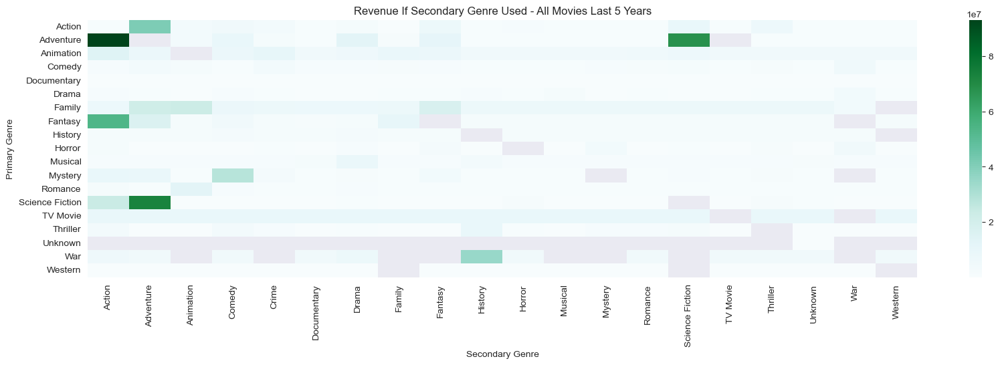

In [122]:
#What if there is a focus on a secondary genre?
y5_heat = y5_upd[['primary_genre','secondary_genre', 'revenue']]
heatmap_data = pd.pivot_table(y5_heat,values='revenue', index=['primary_genre'], columns='secondary_genre')
heatmap_data.head(n=5)
ax = sns.heatmap(heatmap_data, cmap="BuGn")
ax.set_xlabel("Secondary Genre")
ax.set_ylabel("Primary Genre")
ax.set_title("Revenue If Secondary Genre Used - All Movies Last 5 Years")

#Adventure - Secondary genre should be Action or Science Fiction
#Action - Secondary genre should be Adventure
#Science Fiction - Secondary genre should be Adventure
#Horror - No secondary genre

Text(0.5, 1.0, 'Revenue If Secondary Genre Used - All Movies Last 10 Years')

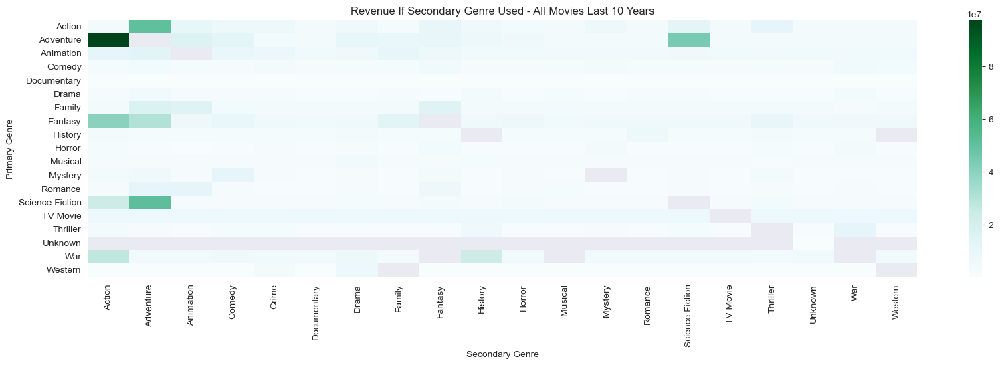

In [123]:
y10_heat = y10_upd[['primary_genre','secondary_genre', 'revenue']]
heatmap_data = pd.pivot_table(y10_heat,values='revenue', index=['primary_genre'], columns='secondary_genre')
heatmap_data.head(n=5)
ax = sns.heatmap(heatmap_data, cmap="BuGn")
ax.set_xlabel("Secondary Genre")
ax.set_ylabel("Primary Genre")
ax.set_title("Revenue If Secondary Genre Used - All Movies Last 10 Years")

#Adventure - Secondary genre should be Action or Science Fiction
#Action - Secondary genre should be Adventure
#Science Fiction - Secondary genre should be Adventure
#Horror - No secondary genre

Text(0.5, 1.0, 'Revenue By Release Month Amongst All Movies - Last 5 Years')

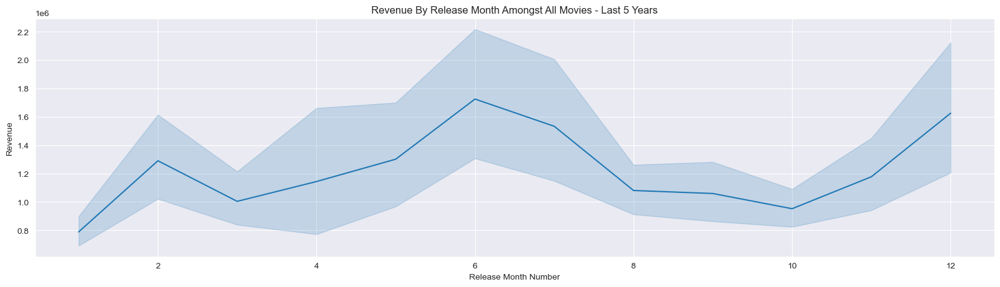

In [124]:
#What is the best month to release over the last 5 years amongst all movie goers?
y5_upd.set_index('release_month_num', inplace=True)
ax = sns.lineplot(data=y5_upd['revenue'])
ax.set_xlabel("Release Month Number")
ax.set_ylabel("Revenue")
ax.set_title("Revenue By Release Month Amongst All Movies - Last 5 Years")

#June, July and December

Text(0.5, 1.0, 'Revenue By Release Month Amongst the Most Profitable Genres - Last 5 Years')

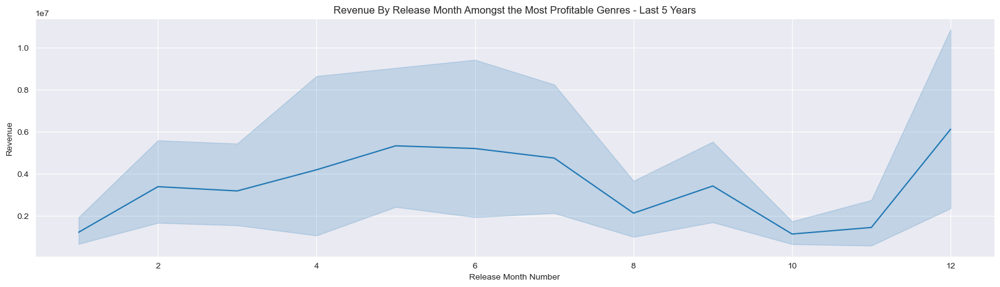

In [125]:
#What is the best month to release overall by our best genres combined? How does this compare to all movie goers?
best5y.set_index('release_month_num', inplace=True)
ax = sns.lineplot(data=best5y['revenue'])
ax.set_xlabel("Release Month Number")
ax.set_ylabel("Revenue")
ax.set_title("Revenue By Release Month Amongst the Most Profitable Genres - Last 5 Years")

#April through July, and December

Text(0.5, 1.0, 'Revenue By Release Month Amongst Action Movies - Last 5 Years')

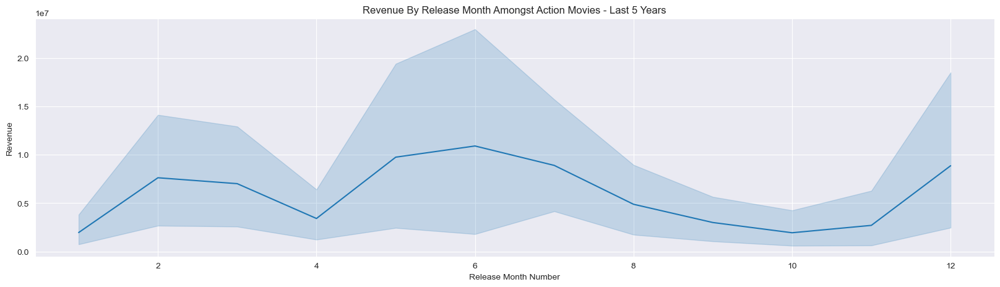

In [126]:
act5_movies.set_index('release_month_num', inplace=True)
ax = sns.lineplot(data=act5_movies['revenue'])
ax.set_xlabel("Release Month Number")
ax.set_ylabel("Revenue")
ax.set_title("Revenue By Release Month Amongst Action Movies - Last 5 Years")

#June

Text(0.5, 1.0, 'Revenue By Release Month Amongst Adventure Movies - Last 5 Years')

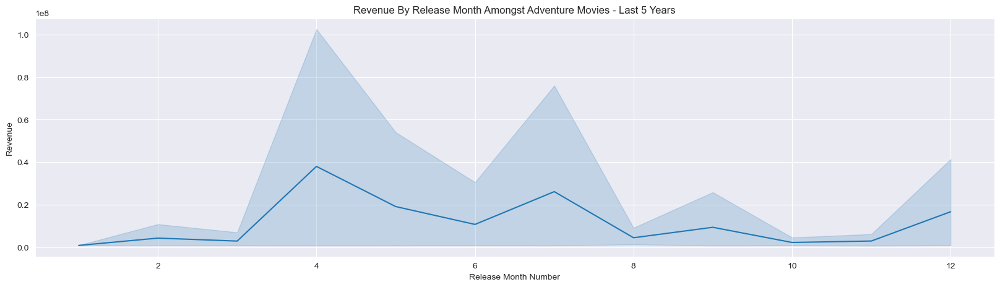

In [127]:
adv5_movies.set_index('release_month_num', inplace=True)
ax = sns.lineplot(data=adv5_movies['revenue'])
ax.set_xlabel("Release Month Number")
ax.set_ylabel("Revenue")
ax.set_title("Revenue By Release Month Amongst Adventure Movies - Last 5 Years")

#April

Text(0.5, 1.0, 'Revenue By Release Month Amongst Horror Movies - Last 5 Years')

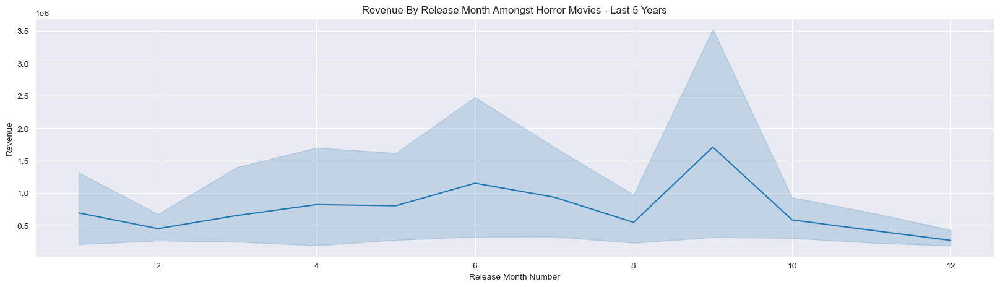

In [128]:
hor5_movies.set_index('release_month_num', inplace=True)
ax = sns.lineplot(data=hor5_movies['revenue'])
ax.set_xlabel("Release Month Number")
ax.set_ylabel("Revenue")
ax.set_title("Revenue By Release Month Amongst Horror Movies - Last 5 Years")

#September

Text(0.5, 1.0, 'Revenue By Release Month Amongst Science Fiction - Last 5 Years')

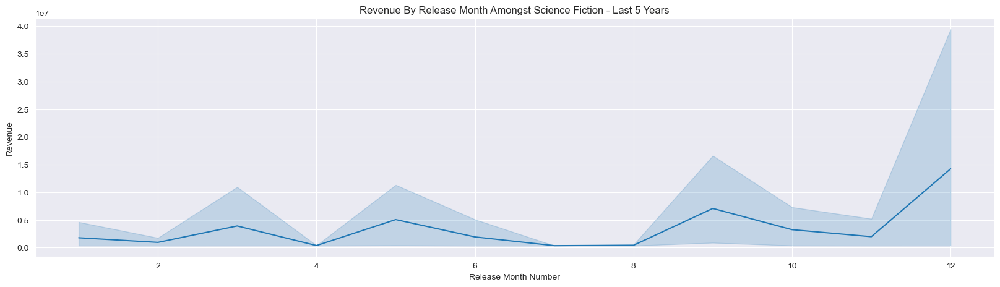

In [129]:
sci5_movies.set_index('release_month_num', inplace=True)
ax = sns.lineplot(data=sci5_movies['revenue'])
ax.set_xlabel("Release Month Number")
ax.set_ylabel("Revenue")
ax.set_title("Revenue By Release Month Amongst Science Fiction - Last 5 Years")

#December

Text(0.5, 1.0, 'Revenue By Release Month Amongst All Movies - Last 10 Years')

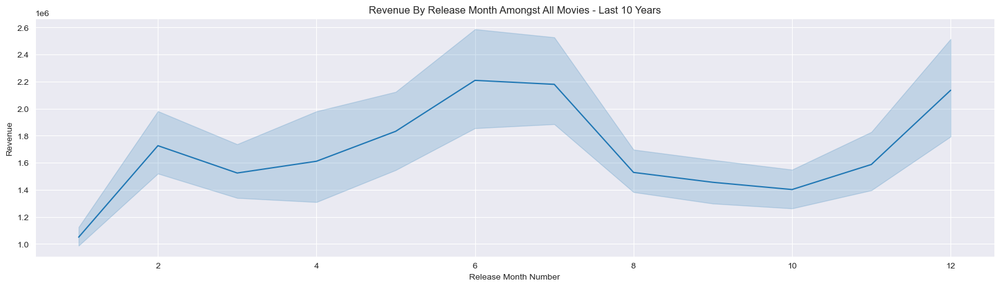

In [130]:
#Due to the worldwide pandemic, it may be beneficial to compare these and pay attention to the macro-level as well.
#What is the best month to release over the last 10 years amongst all movie goers?
y10_upd.set_index('release_month_num', inplace=True)
ax = sns.lineplot(data=y10_upd['revenue'])
ax.set_xlabel("Release Month Number")
ax.set_ylabel("Revenue")
ax.set_title("Revenue By Release Month Amongst All Movies - Last 10 Years")

#June, July and December

Text(0.5, 1.0, 'Revenue By Release Month Amongst the Most Profitable Genres - Last 10 Years')

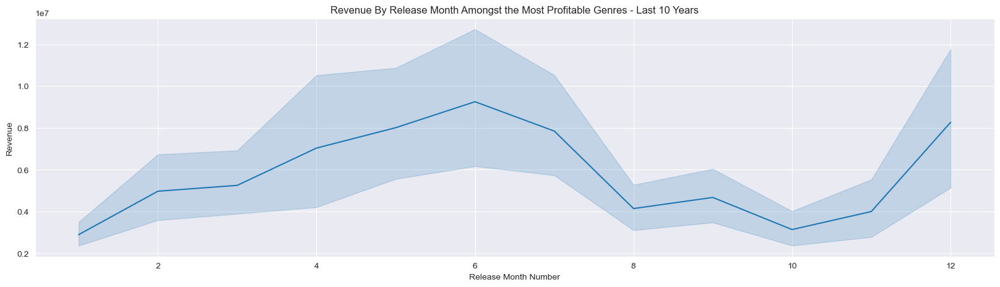

In [131]:
#What is the best month to release overall by our best genres combined? How does this compare to all movie goers?
best10y.set_index('release_month_num', inplace=True)
ax = sns.lineplot(data=best10y['revenue'])
ax.set_xlabel("Release Month Number")
ax.set_ylabel("Revenue")
ax.set_title("Revenue By Release Month Amongst the Most Profitable Genres - Last 10 Years")

#June, July, April and December

Text(0.5, 1.0, 'Revenue By Release Month Amongst Action Movies - Last 10 Years')

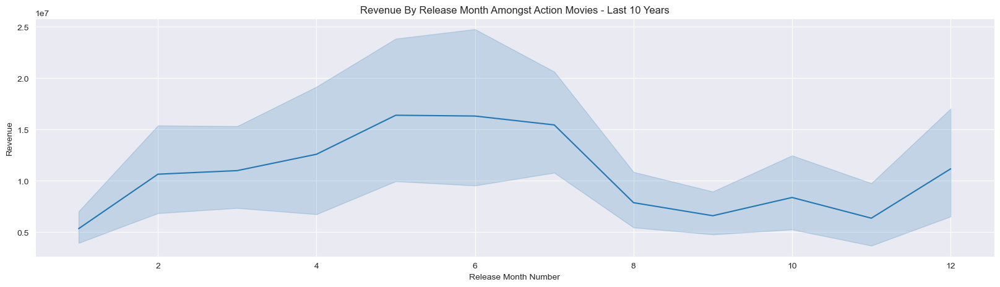

In [132]:
#What is the best month to release overall and by genre? visuals revenue by month
act10_movies.set_index('release_month_num', inplace=True)
ax = sns.lineplot(data=act10_movies['revenue'])
ax.set_xlabel("Release Month Number")
ax.set_ylabel("Revenue")
ax.set_title("Revenue By Release Month Amongst Action Movies - Last 10 Years")

#June, May

Text(0.5, 1.0, 'Revenue By Release Month Amongst Adventure Movies - Last 10 Years')

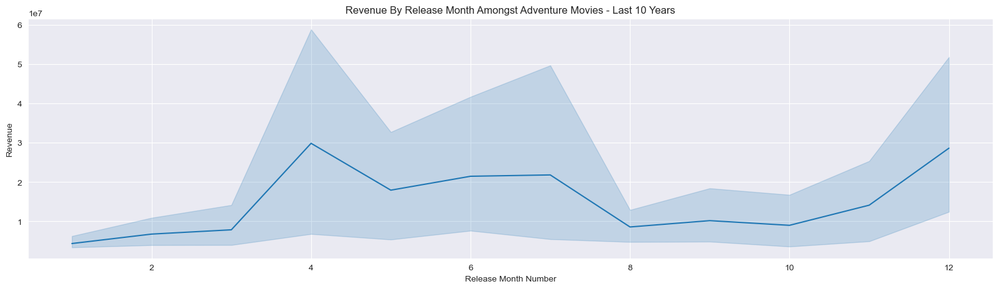

In [133]:
adv10_movies.set_index('release_month_num', inplace=True)
ax = sns.lineplot(data=adv10_movies['revenue'])
ax.set_xlabel("Release Month Number")
ax.set_ylabel("Revenue")
ax.set_title("Revenue By Release Month Amongst Adventure Movies - Last 10 Years")

#April, December, July

Text(0.5, 1.0, 'Revenue Release By Month Amongst Horror Movies - Last 10 Years')

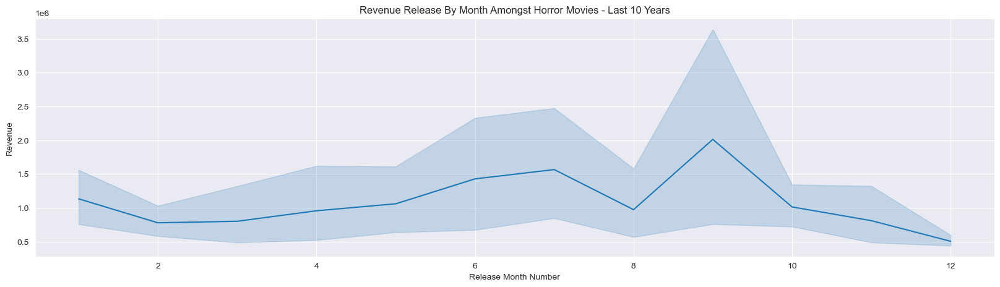

In [134]:
hor10_movies.set_index('release_month_num', inplace=True)
ax = sns.lineplot(data=hor10_movies['revenue'])
ax.set_xlabel("Release Month Number")
ax.set_ylabel("Revenue")
ax.set_title("Revenue Release By Month Amongst Horror Movies - Last 10 Years")

#September

Text(0.5, 1.0, 'Revenue By Release Month Amongst Science Fiction Movies - Last 10 Years')

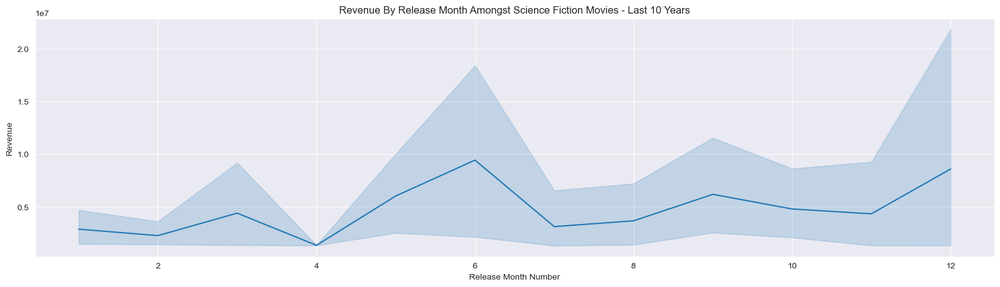

In [135]:
sci10_movies.set_index('release_month_num', inplace=True)
ax = sns.lineplot(data=sci10_movies['revenue'])
ax.set_xlabel("Release Month Number")
ax.set_ylabel("Revenue")
ax.set_title("Revenue By Release Month Amongst Science Fiction Movies - Last 10 Years")

#December and June

In [136]:
#The studio wants to consider movies that are 80-180 minutes in duration.
#Set updated dataframes to only look at movies that are between 80 and 180 minutes long
#This is to give a "zoomed-in" look for the visuals only as setting the x-limits was not working
#Correlation calculations will use the full dataframe, therefore I will not be adding a trendline to this scatterplot
mask = (y5_upd['runtime'] >= 80) & (y5_upd['runtime'] <= 180)
y5_duration_range = y5_upd.loc[mask]

mask = (y10_upd['runtime'] >= 80) & (y10_upd['runtime'] <= 180)
y10_duration_range = y10_upd.loc[mask]

Text(0.5, 1.0, 'Revenue By Runtime Amongst All Movies - Last 5 Years')

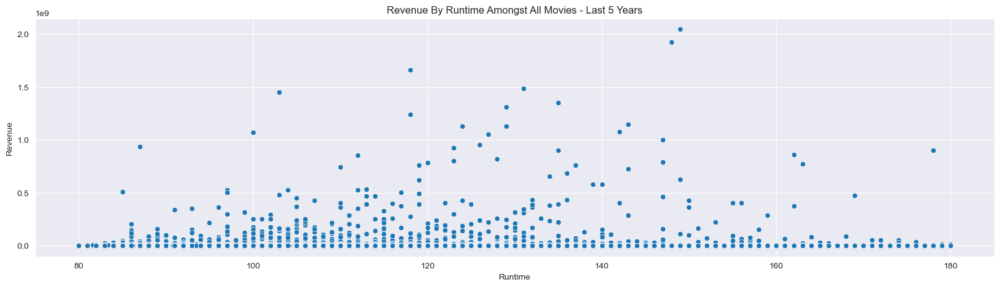

In [137]:
#Check if there is a correlation between runtime and revenue amongst all movies
#Start with a scatterplot
ax = sns.scatterplot(x="runtime", y="revenue", data=y5_duration_range)
ax.set_xlabel("Runtime")
ax.set_ylabel("Revenue")
ax.set_title("Revenue By Runtime Amongst All Movies - Last 5 Years")

In [ ]:
#Replot "zoomed-in" information using a more pleasing visual
ax = sns.relplot(data=y5_duration_range, x="runtime", y="revenue", hue="primary_genre", kind="scatter")
ax.set_xlabels("Runtime")
ax.set_ylabels("Revenue")
ax.fig.suptitle("All Movies - 5 Years")

print("REVENUE BY RUNTIME")
print(f"All Movies Five Year Correlation = {(y5_upd['revenue'].corr(y5_upd['runtime']))}\n")

#No correlation. Best chance at inflated revenue is to keep the movie between 110-140 minutes long.

In [132]:
#Check each of the most profitable genres separately -
#Start by creating dataframes for this range duration - 5 Year
mask = (act5_movies['runtime'] >= 80) & (act5_movies['runtime'] <= 180)
act5_dr = act5_movies.loc[mask]

mask = (adv5_movies['runtime'] >= 80) & (adv5_movies['runtime'] <= 180)
adv5_dr = adv5_movies.loc[mask]

mask = (hor5_movies['runtime'] >= 80) & (hor5_movies['runtime'] <= 180)
hor5_dr = hor5_movies.loc[mask]

mask = (sci5_movies['runtime'] >= 80) & (sci5_movies['runtime'] <= 180)
sci5_dr = sci5_movies.loc[mask]

#10 year
mask = (act10_movies['runtime'] >= 80) & (act10_movies['runtime'] <= 180)
act10_dr = act10_movies.loc[mask]

mask = (adv10_movies['runtime'] >= 80) & (adv10_movies['runtime'] <= 180)
adv10_dr = adv10_movies.loc[mask]

mask = (hor10_movies['runtime'] >= 80) & (hor10_movies['runtime'] <= 180)
hor10_dr = hor10_movies.loc[mask]

mask = (sci10_movies['runtime'] >= 80) & (sci10_movies['runtime'] <= 180)
sci10_dr = sci10_movies.loc[mask]

REVENUE BY RUNTIME
Action Movies Five Year Correlation = 0.041048513424862175



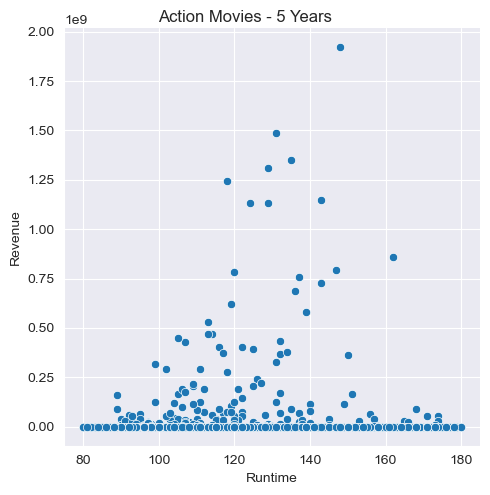

In [132]:
#Check plots and correlations - 5 Year
ax = sns.relplot(data=act5_dr, x="runtime", y="revenue", kind="scatter")
ax.set_xlabels("Runtime")
ax.set_ylabels("Revenue")
ax.fig.suptitle("Action Movies - 5 Years")

print("REVENUE BY RUNTIME")
print(f"Action Movies Five Year Correlation = {(act5_movies['revenue'].corr(act5_movies['runtime']))}\n")

#No correlation, 110-140 minutes

REVENUE BY RUNTIME
Adventure Movies Five Year Correlation = 0.12984918895068323



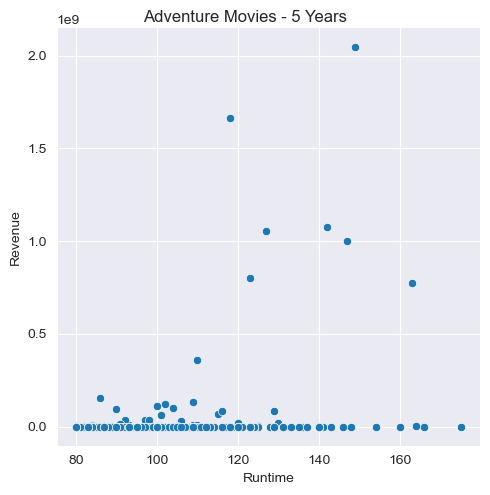

In [133]:
ax = sns.relplot(data=adv5_dr, x="runtime", y="revenue", kind="scatter")
ax.set_xlabels("Runtime")
ax.set_ylabels("Revenue")
ax.fig.suptitle("Adventure Movies - 5 Years")

print("REVENUE BY RUNTIME")
print(f"Adventure Movies Five Year Correlation = {(adv5_movies['revenue'].corr(adv5_movies['runtime']))}\n")

#No correlation, 100-130 minutes

REVENUE BY RUNTIME
Horror Movies Five Year Correlation = 0.0724314846249748



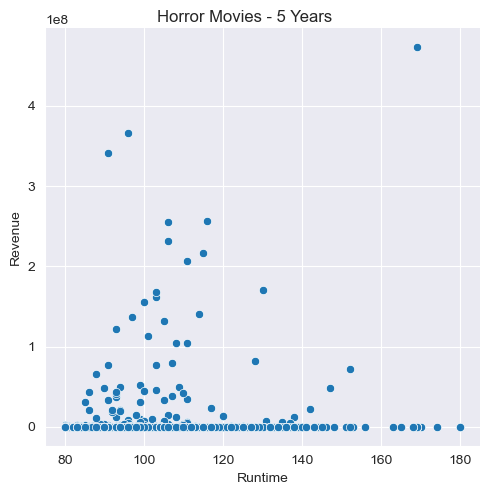

In [134]:
ax = sns.relplot(data=hor5_dr, x="runtime", y="revenue", kind="scatter")
ax.set_xlabels("Runtime")
ax.set_ylabels("Revenue")
ax.fig.suptitle("Horror Movies - 5 Years")

print("REVENUE BY RUNTIME")
print(f"Horror Movies Five Year Correlation = {(hor5_movies['revenue'].corr(hor5_movies['runtime']))}\n")

#No correlation, 90-120 minutes 

REVENUE BY RUNTIME
Science Fiction Movies Five Year Correlation = 0.12443711044358247



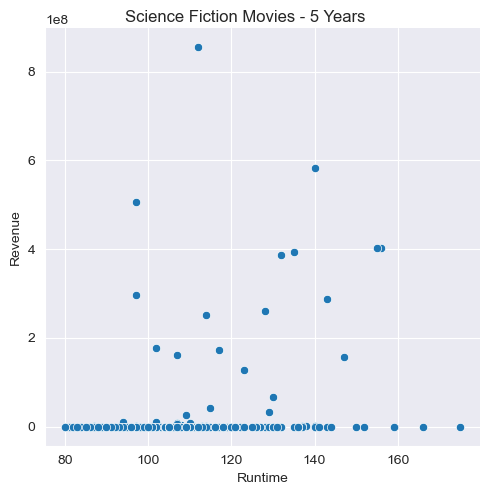

In [135]:
ax = sns.relplot(data=sci5_dr, x="runtime", y="revenue", kind="scatter")
ax.set_xlabels("Runtime")
ax.set_ylabels("Revenue")
ax.fig.suptitle("Science Fiction Movies - 5 Years")

print("REVENUE BY RUNTIME")
print(f"Science Fiction Movies Five Year Correlation = {(sci5_movies['revenue'].corr(sci5_movies['runtime']))}\n")

#No correlation, 110-140 minutes

MemoryError: Unable to allocate 13.5 GiB for an array with shape (1813979193,) and data type int64

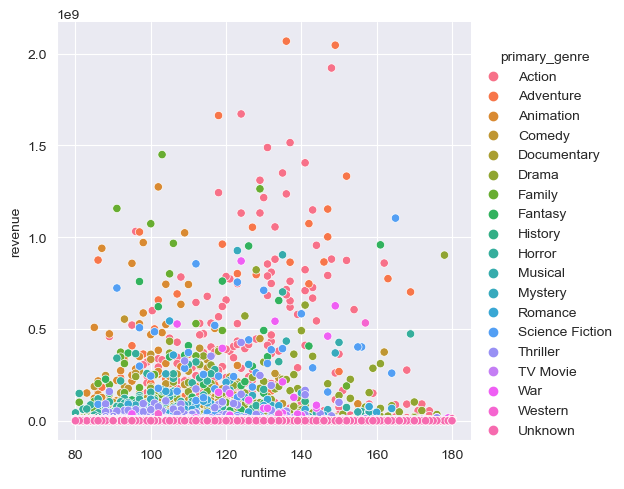

In [136]:
#10 Year
ax = sns.relplot(data=y10_duration_range, x="runtime", y="revenue", hue="primary_genre", kind="scatter")
ax.set_xlabels("Runtime")
ax.set_ylabels("Revenue")
ax.fig.suptitle("All Movies - 10 Years")

print("REVENUE BY RUNTIME")
print(f"All Movies Ten Year Correlation = {(y10_upd['revenue'].corr(y10_upd['runtime']))}\n")

#No correlation. Best chance at inflated revenue is to keep the movie between 100-130 minutes long.

REVENUE BY RUNTIME
Action Movies Ten Year Correlation = 0.05646572210478037



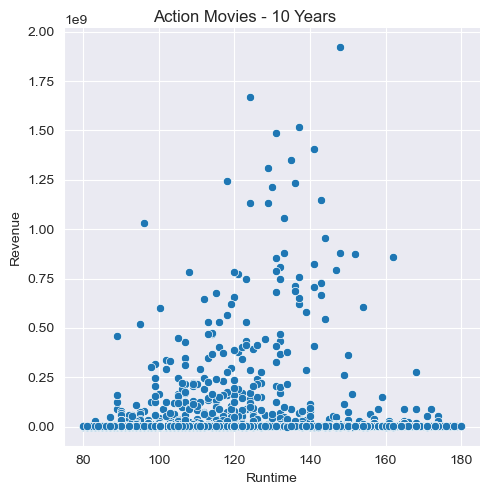

In [137]:
#Check plots and correlations - 10 Year
ax = sns.relplot(data=act10_dr, x="runtime", y="revenue", kind="scatter")
ax.set_xlabels("Runtime")
ax.set_ylabels("Revenue")
ax.fig.suptitle("Action Movies - 10 Years")

print("REVENUE BY RUNTIME")
print(f"Action Movies Ten Year Correlation = {(act10_movies['revenue'].corr(act10_movies['runtime']))}\n")

#No correlation, 110-140 minutes

REVENUE BY RUNTIME
Adventure Movies Ten Year Correlation = 0.13967558247537473



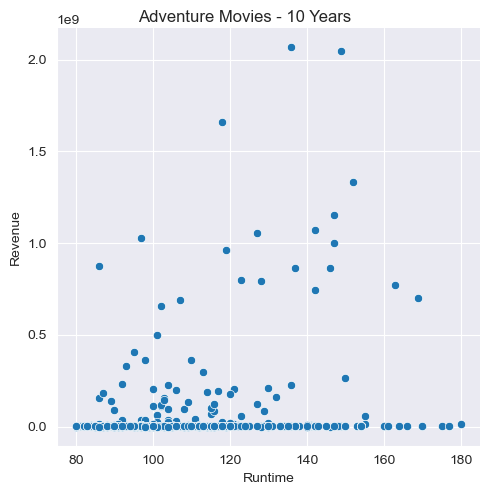

In [138]:
ax = sns.relplot(data=adv10_dr, x="runtime", y="revenue", kind="scatter")
ax.set_xlabels("Runtime")
ax.set_ylabels("Revenue")
ax.fig.suptitle("Adventure Movies - 10 Years")

print("REVENUE BY RUNTIME")
print(f"Adventure Movies Ten Year Correlation = {(adv10_movies['revenue'].corr(adv10_movies['runtime']))}\n")

#No correlation, 90-120 minutes

REVENUE BY RUNTIME
Horror Movies Ten Year Correlation = 0.07008766274801163



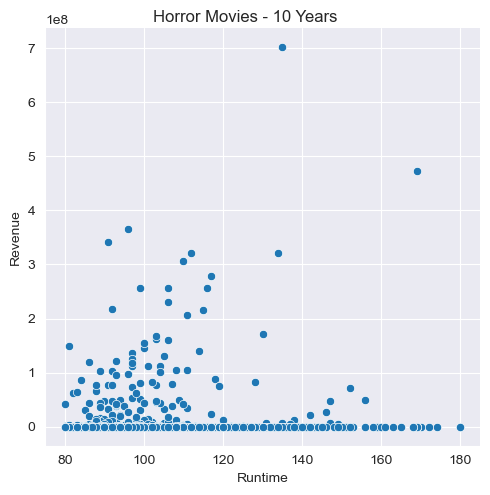

In [139]:
ax = sns.relplot(data=hor10_dr, x="runtime", y="revenue", kind="scatter")
ax.set_xlabels("Runtime")
ax.set_ylabels("Revenue")
ax.fig.suptitle("Horror Movies - 10 Years")

print("REVENUE BY RUNTIME")
print(f"Horror Movies Ten Year Correlation = {(hor10_movies['revenue'].corr(hor10_movies['runtime']))}\n")

#No correlation, 80-110 minutes

REVENUE BY RUNTIME
Science Fiction Movies Ten Year Correlation = 0.1261954062427761



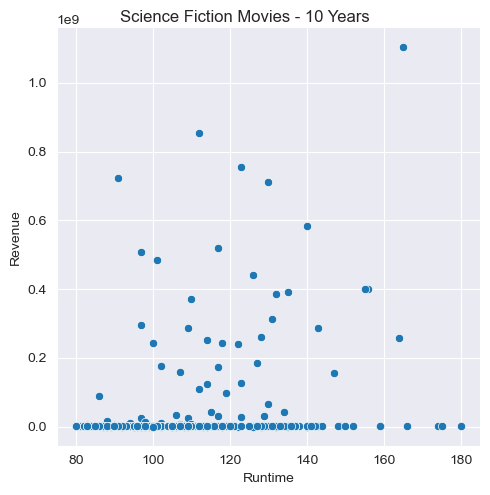

In [140]:
ax = sns.relplot(data=sci10_dr, x="runtime", y="revenue", kind="scatter")
ax.set_xlabels("Runtime")
ax.set_ylabels("Revenue")
ax.fig.suptitle("Science Fiction Movies - 10 Years")

print("REVENUE BY RUNTIME")
print(f"Science Fiction Movies Ten Year Correlation = {(sci10_movies['revenue'].corr(sci10_movies['runtime']))}\n")

#No correlation, 100-130 minutes

MemoryError: Unable to allocate 23.4 GiB for an array with shape (3137665163,) and data type int64

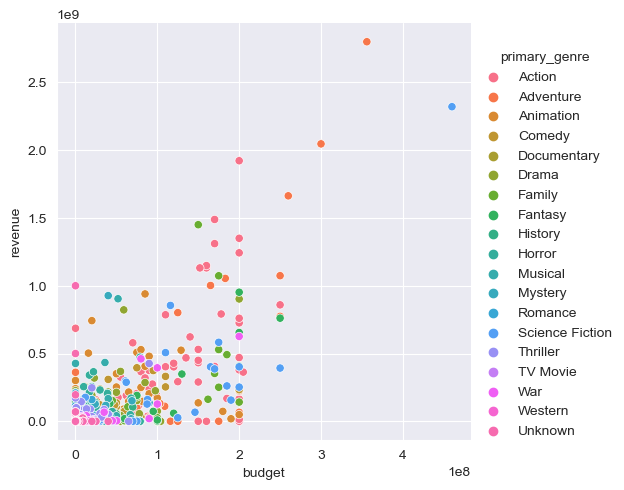

In [145]:
#Check if there is a correlation between revenue and budget amongst all movies
ax = sns.relplot(data=y5_upd, x="budget", y="revenue", hue="primary_genre", kind="scatter")
ax.set_xlabels("Budget")
ax.set_ylabels("Revenue")
ax.fig.suptitle("All Movies - Last 5 Years")

#Adding a trendline makes the visual unreadable
print("REVENUE BY BUDGET")
print(f"Five Year Correlation = {(y5_upd['revenue'].corr(y5_upd['budget']))}\n")

#0.725 - Decent amount of correlation

In [133]:
print("REVENUE BY BUDGET")
print(f"Five Year Correlation = {(y5_upd['revenue'].corr(y5_upd['budget']))}\n")

REVENUE BY BUDGET
Five Year Correlation = 0.7253352950611386



MemoryError: Unable to allocate 76.9 GiB for an array with shape (10325443916,) and data type int64

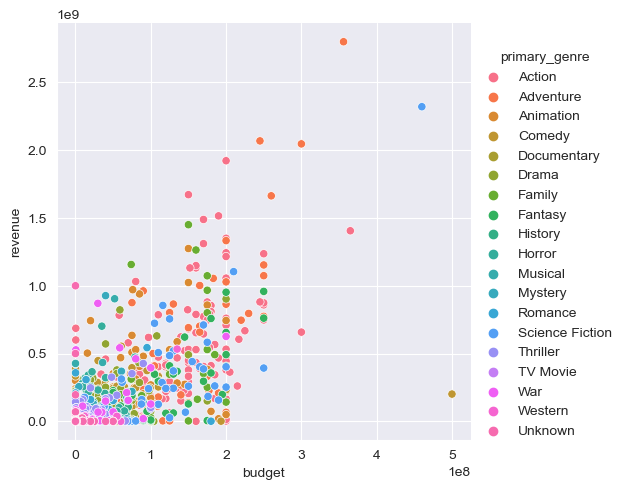

In [142]:
ax = sns.relplot(data=y10_upd, x="budget", y="revenue", hue="primary_genre", kind="scatter")
ax.set_xlabels("Budget")
ax.set_ylabels("Revenue")
ax.fig.suptitle("All Movies - Last 10 Years")

#Adding a trendline makes the visual unreadable
print("REVENUE BY BUDGET")
print(f"Ten Year Correlation = {(y10_upd['revenue'].corr(y10_upd['budget']))}\n")

#0.765 - Decent amount of correlation

In [134]:
print("REVENUE BY BUDGET")
print(f"Ten Year Correlation = {(y10_upd['revenue'].corr(y10_upd['budget']))}\n")

REVENUE BY BUDGET
Ten Year Correlation = 0.7654874867706857



REVENUE BY SCORE
Five Year Correlation = 0.02382979682901396



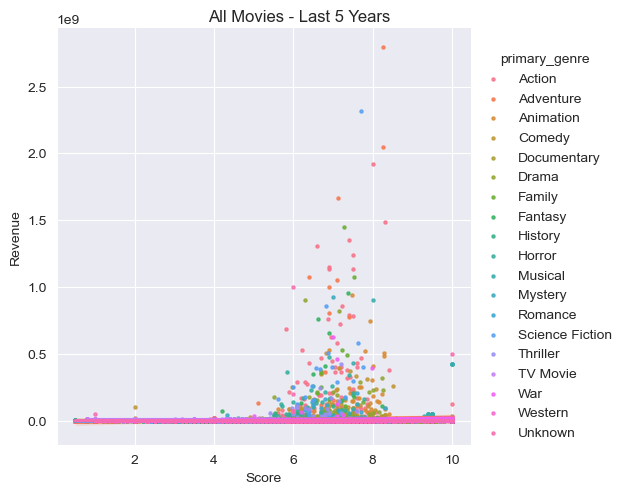

In [143]:
#Would keeping track of a movie's score be an indicator of how much revenue it will generate?

#Correlation between revenue and score amongst all movies
ax = sns.lmplot(x="vote_average", y="revenue", hue="primary_genre", data=y5_upd, scatter_kws={"s": 5})
ax.set_xlabels("Score")
ax.set_ylabels("Revenue")
ax.fig.suptitle("All Movies - Last 5 Years")

print("REVENUE BY SCORE")
print(f"Five Year Correlation = {(y5_upd['revenue'].corr(y5_upd['vote_average']))}\n")

#0.024 No correlation

REVENUE BY SCORE
Ten Year Correlation = 0.016884610959616866



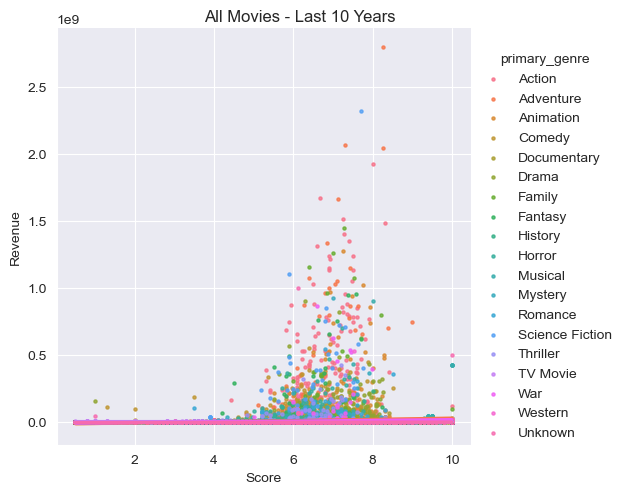

In [144]:
ax = sns.lmplot(x="vote_average", y="revenue", hue="primary_genre", data=y10_upd, scatter_kws={"s": 5})
ax.set_xlabels("Score")
ax.set_ylabels("Revenue")
ax.fig.suptitle("All Movies - Last 10 Years")

print("REVENUE BY SCORE")
print(f"Ten Year Correlation = {(y10_upd['revenue'].corr(y10_upd['vote_average']))}\n")

#0.017 - No correlation

In [ ]:
#Conclusion
#The previous 10 year trends are very similar to the previous 5 year trends in terms of average profit margin rankings. 

#The most revenue amongst all movie goers is during the months of June, July and December.

#There is no correlation between revenue and runtimes. What we can see is where the majority of "inflated" revenues land
    #within the range of 80-180minutes. As a result we can see that people overall are enjoying longer films than before.

#There is no correlation between revenue and the movie's average score in the long run. 

#There is a fairly strong correlation between revenue and budget. We can assume that it is more than likely that the more
    #money the studio puts into the budget, the higher our revenues will be.

    
#According to average profit margins, the best choices to make the most money right now:
#Adventure
    #67.6% Average Profit Margin over the previous 5 years.
    #If a secondary genre is to be included, make it Action or Science Fiction.
    #The runtime should be between 100-130 minutes.
    #It should be released in April or July.

#Action
    #58.7% Average Profit Margin over the previous 5 years.
    #If a secondary genre is to be included, make it Adventure.
    #The runtime should be between 110-140 minutes.
    #It should be released in July, May or December

#Science Fiction
    #49.3% Average Profit Margin over the previous 5 years.
    #If a secondary genre is to be included, make it Adventure
    #The runtime should be between 110-140 minutes.
    #It should be released in December.
    
#Horror
    #43.9% Average Profit Margin over the previous 5 years.
    #Do not include a secondary genre.
    #The runtime should be between 90-120 minutes.
    #It should be released in September at the beginning of Halloween season.
    

#According to average profit margins over the previous 5 year, stay away from making the following type of movies:
#Animation        12.9%
#Comedy           13.2%
#Documentaries   -23.6%
#History          -6.8%
#TV Movie          0.5%
#Western        -184.4%



In [137]:
#Create csv files to export for use in Tableau
#y10_upd.to_csv('movies_10year.csv')
#y5_upd.to_csv('movies_5year.csv')